Evaluate the output trajectories from different models using common tools.

In [317]:
import datetime
import os

import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd

from eval_util import *


In [318]:
HOURS_PER_DAY = 24
TIME_PERIOD_DAYS = 5

In [319]:
def read_trajectories_from_file(filename):
    """
    Returns a list of lists, where each list represents a trajectory written to file.
    Expects file format where each line is one trajectory, and places in the trajectory are delimited by spaces.
    """
    trajectories = []
    with open(filename, 'r') as f:
        for _i, line in enumerate(f):
            line = line.strip()
            line = line.split()
            parse_line = [int(x) for x in line]
            trajectories.append(parse_line)
    return trajectories

Load and inspect the real data.

In [320]:
# Load the real trajectories data. Note these are prefixed by home,work labels
relabeled_trajectories_filename = '../data/relabeled_trajectories_1_workweek.txt'
real_trajectories = read_trajectories_from_file(relabeled_trajectories_filename)

In [321]:
# What is the vocabulary size? i.e. how many distinct labels?
vocab = set()
for t in real_trajectories:
    vocab.update(set(t))
print(len(vocab))

652


- How many distinct home labels?
- How many distinct (home, work) label pairs?
- Of the distinct (home, work) label pairs, how many users for each?

In [322]:
# initialize mappings
home_label_to_user_count = {t[0]:0 for t in real_trajectories}
home_work_label_pair_to_user_count = {(t[0], t[1]):0 for t in real_trajectories}
for t in real_trajectories:
    home_label = t[0]
    work_label = t[1]
    home_label_to_user_count[home_label] += 1
    home_work_label_pair_to_user_count[(home_label, work_label)] += 1

print('total number of users: %s' % len(real_trajectories))
print('number of distinct home labels: %s' % len(home_label_to_user_count))
print('number of distinct (home, work) label pairs: %s' % len(home_work_label_pair_to_user_count))
# print(home_label_to_user_count)
# home_work_label_pair_to_user_count

total number of users: 22704
number of distinct home labels: 646
number of distinct (home, work) label pairs: 8659


0
----- vector ----
prefix labels:  [1, 1]
[1, 1, 1, 1, 1, 1, 1, 2, 0, 0, 0, 0, 0, 3, 3, 3, 3, 3, 2, 4, 3, 3, 3, 3]
[3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
[1, 1, 1, 1, 1, 1, 1, 5, 5, 5, 6, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3]
[3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]


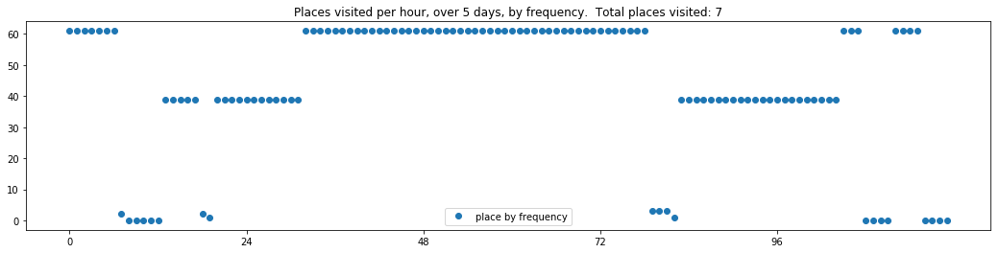

1
----- vector ----
prefix labels:  [7, 7]
[7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 0, 0, 0, 0, 0, 0, 7, 7]
[7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 0, 0, 0, 0, 0]
[0, 7, 7, 7, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 7]
[7, 7, 7, 7, 7, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 7, 7, 7, 0, 0, 0, 0, 0, 0, 0, 0, 8, 0, 7, 9, 0, 7, 7, 0, 0]


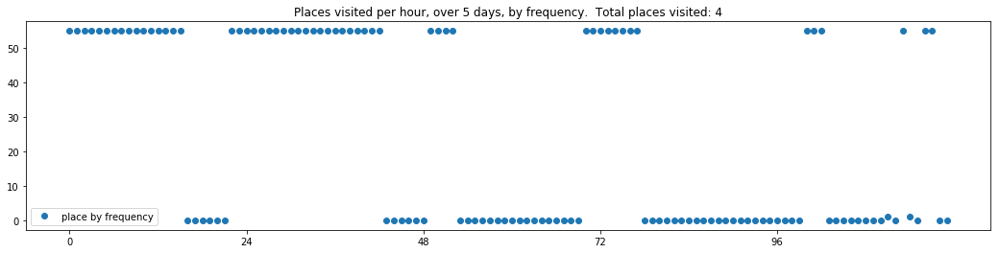

2
----- vector ----
prefix labels:  [10, 12]
[10, 11, 11, 11, 11, 11, 12, 12, 12, 13, 12, 12, 0, 12, 12, 11, 11, 11, 14, 14, 14, 14, 14, 14]
[14, 14, 14, 14, 11, 11, 0, 12, 12, 12, 12, 12, 12, 12, 12, 0, 10, 10, 10, 15, 10, 10, 10, 11]
[11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 13, 12, 12, 11, 11, 11, 11, 0, 16, 17, 17, 17, 17]
[17, 17, 17, 0, 0, 12, 12, 12, 12, 12, 12, 12, 12, 11, 11, 11, 11, 11, 0, 10, 10, 10, 10, 10]
[10, 10, 10, 10, 11, 11, 12, 12, 13, 12, 13, 18, 12, 12, 12, 12, 10, 10, 10, 10, 10, 10, 10, 10]


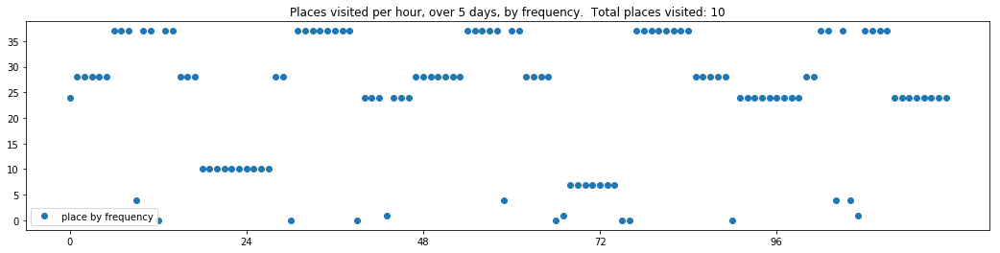

3
----- vector ----
prefix labels:  [19, 19]
[19, 19, 0, 0, 19, 19, 19, 19, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19]
[19, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 20, 20, 20, 20, 0]
[0, 0, 0, 0, 0, 0, 0, 19, 21, 21, 21, 21, 21, 21, 21, 0, 0, 19, 19, 19, 19, 19, 19, 22]


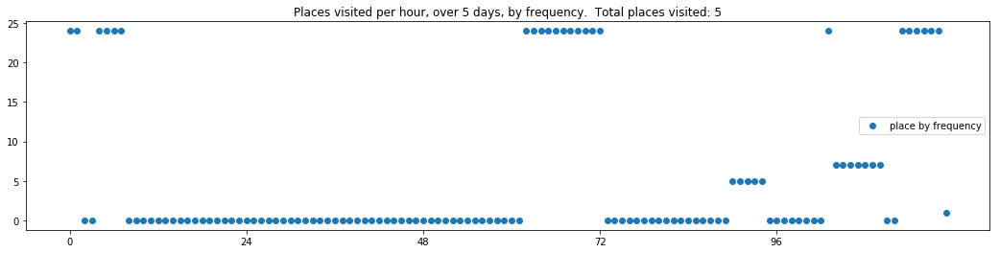

4
----- vector ----
prefix labels:  [23, 24]
[23, 23, 23, 23, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 24, 24, 24, 24, 24, 0, 0, 23, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 23]
[23, 23, 23, 23, 23, 23, 23, 23, 0, 25, 0, 0, 0, 24, 0, 0, 0, 0, 0, 26, 0, 0, 0, 0]


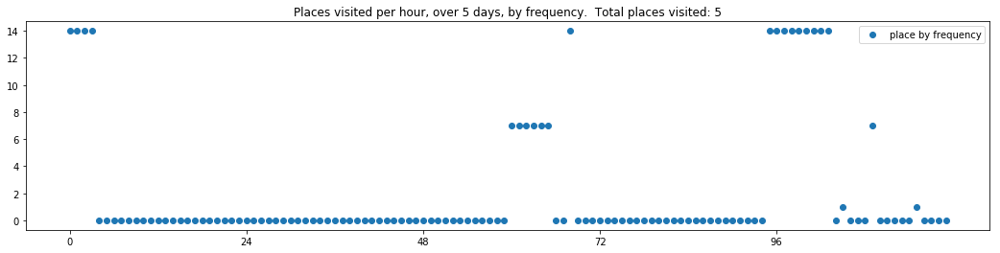

5
----- vector ----
prefix labels:  [27, 27]
[27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 0, 0, 0, 0, 0, 0, 0, 20, 20, 27]
[27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 21, 0, 0, 0, 0, 0, 0, 20, 20, 20]
[27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 21, 0, 0, 0, 0, 0, 0, 20, 20, 20]
[27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 0, 0, 0, 0, 0, 0, 0, 20, 20, 20]
[27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 0, 0, 0, 0, 0, 0, 0, 0, 20, 28, 27]


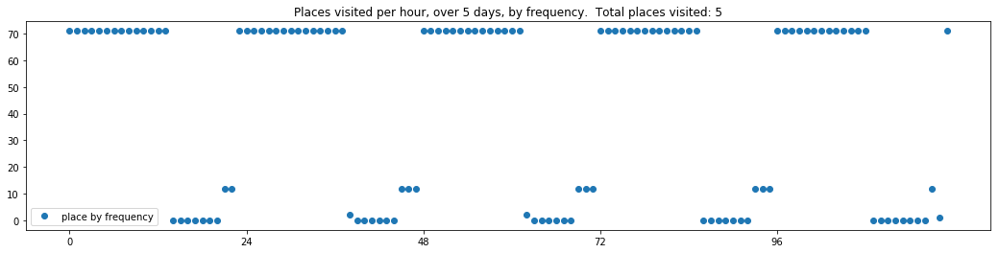

6
----- vector ----
prefix labels:  [29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 30, 31, 31, 32, 32, 29, 0, 0, 33, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 34, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 0, 35, 29, 29, 29, 29, 29, 29, 32, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 36, 36, 0, 29, 29, 29, 29, 29, 29, 29, 0, 0, 0, 29]


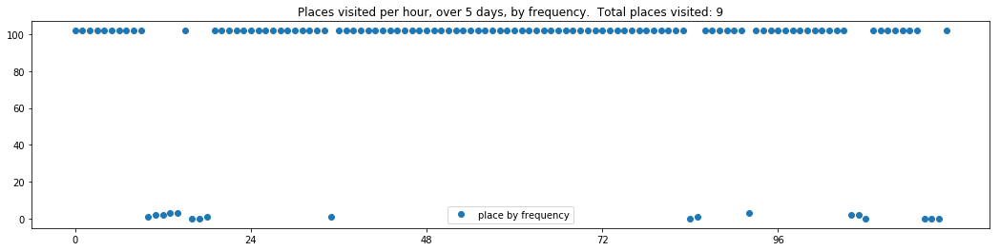

7
----- vector ----
prefix labels:  [37, 38]
[37, 37, 37, 37, 37, 37, 37, 37, 37, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 37, 37]
[37, 37, 37, 37, 37, 37, 38, 38, 38, 38, 38, 38, 38, 38, 0, 0, 0, 0, 0, 0, 39, 39, 39, 39]
[0, 0, 0, 0, 0, 0, 0, 37, 0, 0, 0, 0, 0, 0, 38, 38, 38, 38, 38, 38, 38, 37, 37, 37]
[37, 37, 37, 37, 37, 37, 37, 37, 37, 0, 38, 38, 38, 38, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39]
[37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 0, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39]


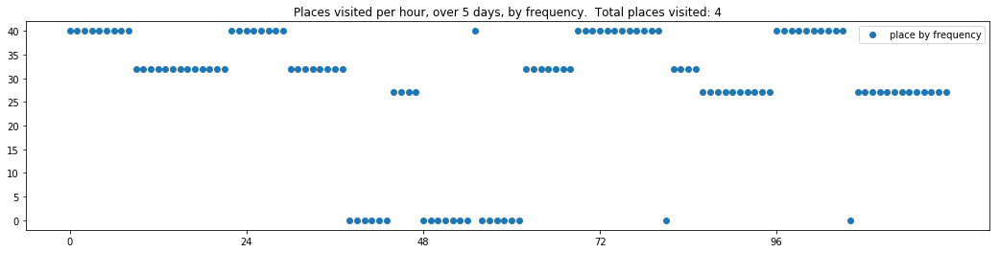

8
----- vector ----
prefix labels:  [41, 41]
[40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 20, 20, 20, 20, 20, 20, 40, 40, 40, 40, 40]
[40, 40, 40, 40, 40, 40, 0, 20, 20, 20, 0, 0, 0, 0, 0, 0, 0, 0, 40, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 41, 41, 41, 41, 41]
[41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41]
[41, 41, 41, 41, 41, 41, 41, 40, 40, 40, 40, 40, 0, 0, 40, 40, 41, 41, 0, 42, 41, 41, 41, 41]


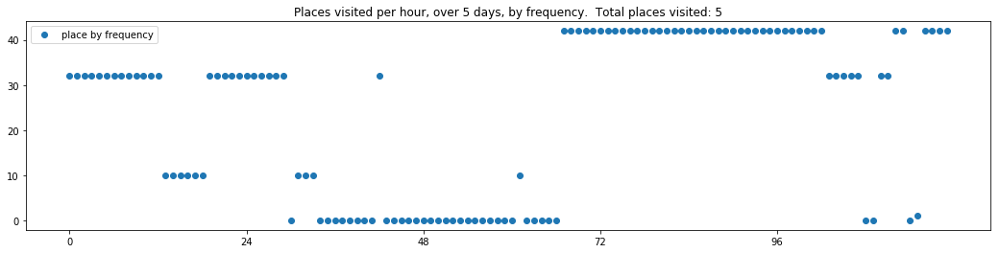

9
----- vector ----
prefix labels:  [43, 43]
[43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43]
[43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 44, 0, 0, 43, 43, 43, 43, 0, 0, 43, 43, 43]
[43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 0, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43]
[43, 43, 43, 43, 43, 43, 43, 43, 43, 0, 0, 0, 43, 43, 43, 43, 43, 43, 43, 0, 0, 0, 43, 43]
[43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 0, 0, 0, 0, 0]


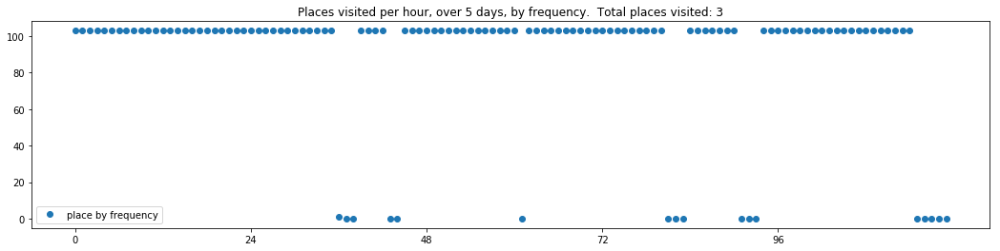

10
----- vector ----
prefix labels:  [45, 45]
[45, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 45, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 46, 0, 0, 0, 0]
[0, 45, 45, 45, 45, 45, 45, 0, 0, 0, 45, 0, 0, 0, 0, 0, 0, 0, 45, 0, 0, 47, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 48, 0, 0, 45, 45, 45, 0, 0, 0, 45, 0, 0]


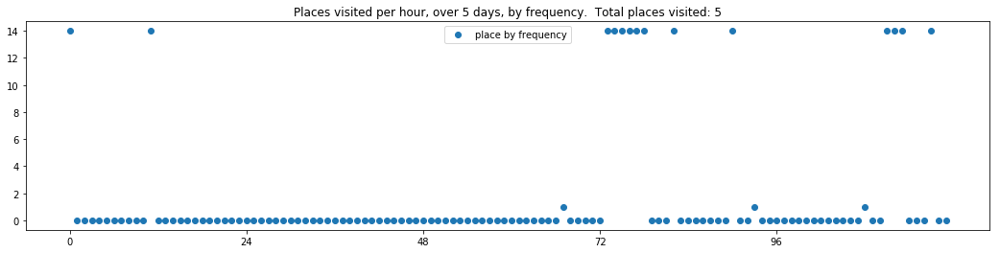

11
----- vector ----
prefix labels:  [49, 49]
[20, 0, 20, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 20, 50, 50, 51, 0, 20, 0, 0, 0]
[20, 0, 0, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 20, 20, 0, 52, 0, 22, 20, 53, 20]
[20, 0, 49, 49, 0, 0, 0, 0, 0, 0, 49, 49, 49, 20, 0, 54, 0, 0, 49, 20, 0, 0, 0, 55]
[20, 0, 0, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 56, 0, 57, 22, 20, 0, 0]
[0, 20, 20, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 58, 59, 59, 0, 58, 58, 49, 49, 20, 0, 20]


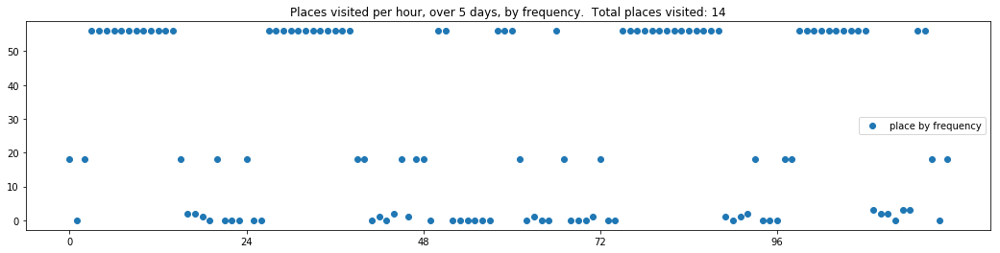

12
----- vector ----
prefix labels:  [60, 0]
[60, 60, 0, 0, 60, 60, 0, 61, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 62, 62, 62, 62, 62, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 60, 60]
[60, 60, 60, 60, 60, 60, 60, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 60]
[60, 60, 60, 60, 60, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 60]


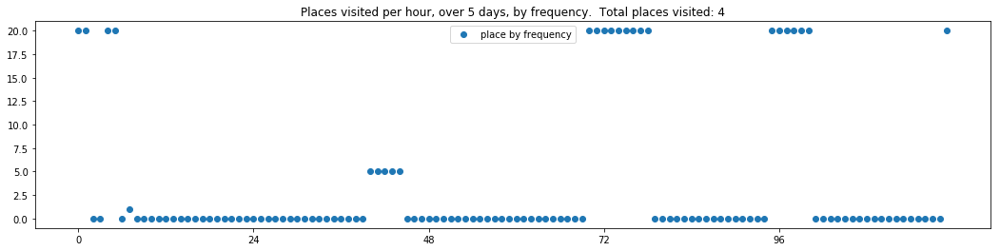

13
----- vector ----
prefix labels:  [64, 65]
[63, 63, 0, 0, 0, 64, 64, 64, 65, 65, 65, 65, 65, 65, 65, 64, 64, 64, 64, 64, 64, 64, 64, 64]
[64, 64, 64, 64, 64, 64, 64, 64, 66, 65, 65, 65, 65, 65, 65, 31, 31, 67, 31, 31, 64, 64, 64, 64]
[64, 64, 64, 64, 64, 64, 64, 64, 64, 0, 65, 65, 65, 65, 65, 66, 64, 64, 64, 64, 68, 64, 64, 64]
[64, 64, 64, 64, 64, 64, 64, 64, 64, 65, 65, 65, 65, 65, 65, 64, 64, 64, 64, 69, 31, 31, 64, 64]
[64, 64, 64, 64, 64, 64, 64, 64, 65, 65, 65, 65, 31, 31, 31, 0, 0, 66, 66, 64, 64, 64, 64, 64]


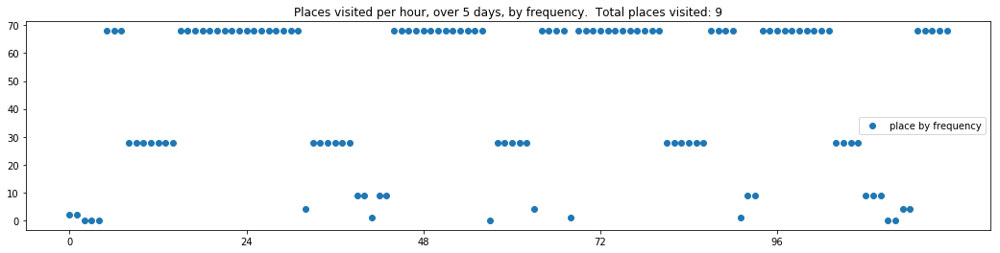

14
----- vector ----
prefix labels:  [70, 71]
[70, 70, 70, 70, 70, 70, 70, 71, 71, 71, 71, 71, 71, 71, 71, 71, 70, 70, 70, 70, 70, 70, 70, 70]
[0, 70, 70, 70, 70, 70, 70, 71, 71, 71, 0, 0, 0, 0, 70, 70, 70, 70, 70, 70, 70, 70, 70, 21]
[70, 70, 70, 70, 70, 70, 70, 71, 71, 71, 71, 71, 71, 71, 71, 72, 70, 70, 70, 70, 70, 70, 70, 70]
[70, 70, 70, 70, 70, 70, 70, 71, 71, 71, 71, 71, 71, 71, 71, 0, 70, 70, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 70, 70, 70, 0, 0, 0, 0, 0, 0, 0]


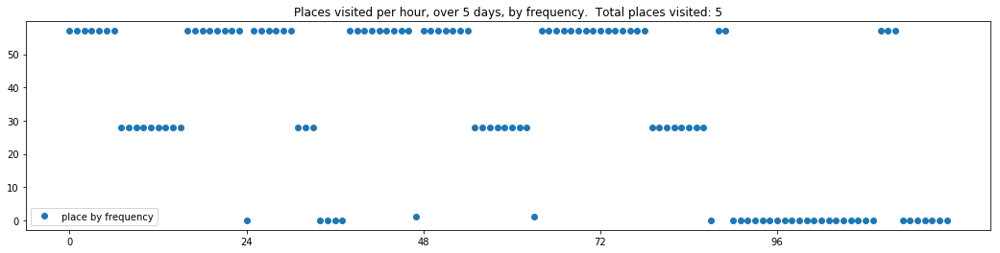

15
----- vector ----
prefix labels:  [15, 73]
[15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 73, 73, 73, 73, 73, 73, 73, 15, 15, 15, 15, 15, 15, 15]
[15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 0, 15, 73, 73, 73, 73, 73, 73, 73, 73, 73]
[15, 15, 15, 15, 15, 15, 15, 15, 15, 73, 73, 73, 73, 73, 73, 73, 73, 73, 15, 0, 15, 15, 52, 52]
[52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 74, 74, 8, 8, 21, 21, 21, 21, 52, 52, 52, 15]
[15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 0, 0, 0, 0, 0, 0, 0, 0]


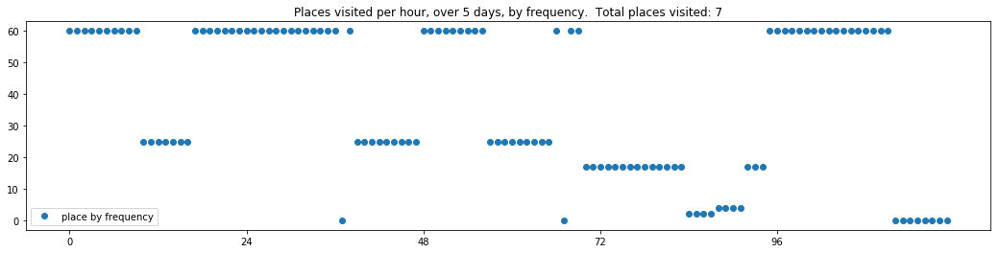

16
----- vector ----
prefix labels:  [75, 75]
[75, 75, 75, 75, 75, 75, 75, 76, 76, 76, 76, 0, 0, 77, 77, 77, 77, 77, 75, 75, 75, 75, 75, 75]
[75, 75, 75, 75, 75, 75, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 75, 75, 75, 75, 75, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 75, 75]
[75, 75, 75, 75, 75, 75, 75, 75, 75, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 75, 75, 75, 75, 75, 75, 75, 75, 75, 75, 75, 75]


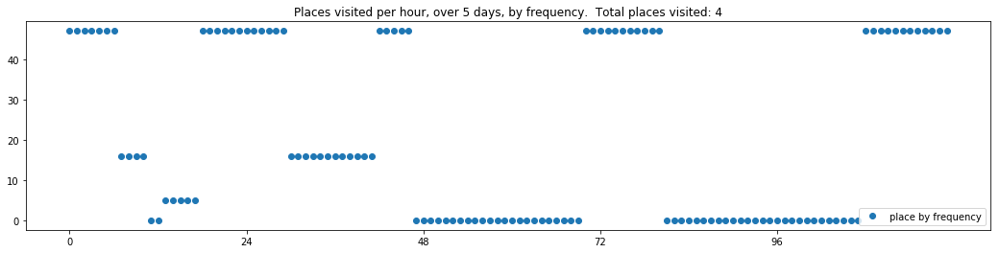

17
----- vector ----
prefix labels:  [78, 31]
[78, 78, 78, 78, 31, 79, 79, 80, 81, 31, 31, 13, 13, 34, 82, 83, 3, 31, 31, 78, 78, 20, 84, 78]
[78, 78, 78, 78, 31, 31, 31, 80, 82, 31, 31, 31, 31, 31, 35, 83, 0, 0, 0, 0, 78, 20, 84, 78]
[78, 78, 0, 78, 31, 31, 83, 83, 82, 31, 31, 31, 31, 31, 31, 85, 31, 31, 78, 78, 20, 20, 84, 78]
[78, 78, 78, 0, 0, 0, 80, 80, 82, 31, 31, 31, 31, 31, 82, 80, 35, 86, 78, 78, 20, 20, 84, 78]
[78, 78, 78, 78, 31, 31, 31, 80, 82, 31, 31, 31, 31, 31, 81, 80, 3, 85, 85, 78, 20, 53, 78, 78]


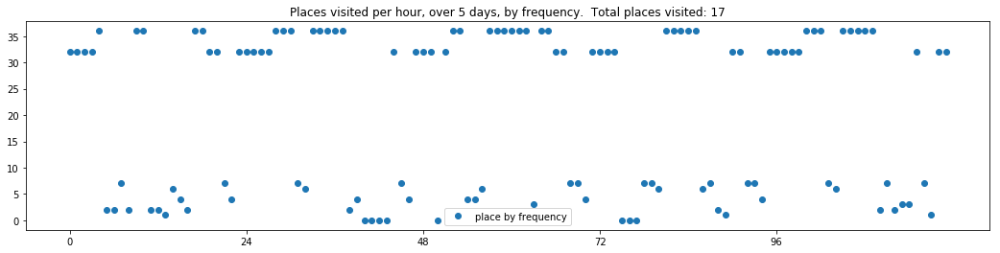

18
----- vector ----
prefix labels:  [87, 87]
[87, 87, 87, 87, 87, 87, 87, 87, 88, 89, 89, 89, 89, 89, 89, 89, 0, 89, 89, 0, 90, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 89, 0, 0, 0, 89, 89, 89, 89, 0, 0, 0, 87, 87, 87]
[87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 91, 87, 87, 87, 87, 87]
[87, 87, 87, 87, 87, 87, 87, 87, 89, 89, 89, 87, 87, 87, 87, 87, 87, 87, 87, 0, 0, 0, 87, 87]
[87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 92, 0, 87, 87, 87, 0, 0, 0, 0, 0, 0]


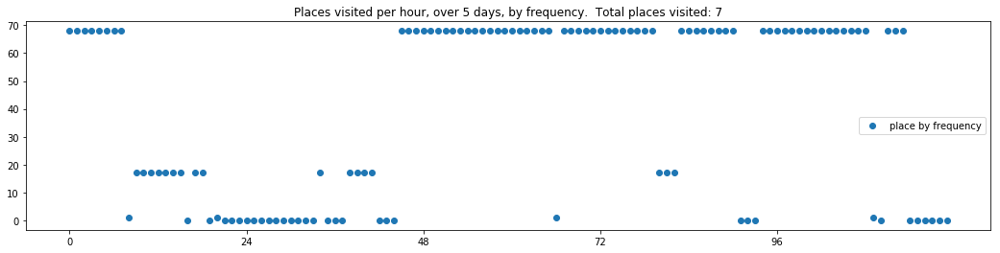

19
----- vector ----
prefix labels:  [93, 94]
[93, 93, 93, 93, 93, 93, 93, 93, 0, 0, 0, 0, 0, 0, 0, 94, 0, 93, 93, 93, 93, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 93, 93, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 94, 94, 94, 94, 94, 94, 0, 0, 95, 0, 0, 0, 0, 0, 93]
[93, 93, 93, 93, 93, 93, 93, 93, 0, 0, 94, 94, 94, 94, 94, 94, 94, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 93, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 4, 4]


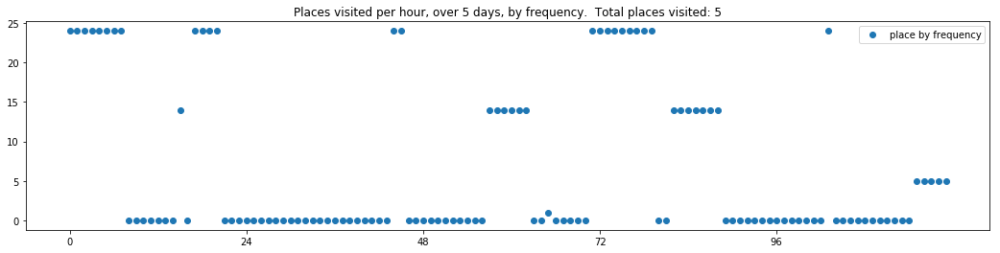

In [323]:
for t, tv in enumerate(real_trajectories[:20]):
    print(t)
    print_dwell_vector_by_days(tv)
    plot_trajectory_vector_frequencies(tv, by_frequency_order=False)

Evaluate the SeqGAN output

In [324]:
import re

def get_eval_files():
    filenames = {}
    # There are a bunch of evaluation files saved in the following directory
    seqgan_eval_files_dir = '/Users/aberke/projects/gan-hacking/SeqGAN/save/'
    for filename in os.listdir(seqgan_eval_files_dir):
        eval_num = re.findall(r'\d+', filename)
        if not (filename.startswith('eval_file_') and len(eval_num)):
            continue
        eval_num = int(eval_num[0])
        fullfilename = seqgan_eval_files_dir + filename
        filenames[eval_num] = fullfilename
    return filenames

eval_filenames = get_eval_files()


------
 0 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_0.txt 
------

----- vector ----
prefix labels:  [340, 340]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 340, 477, 477, 477, 0, 0, 0]
[0, 0, 0, 581, 367, 174, 174, 174, 174, 174, 0, 0, 0, 0, 0, 0, 174, 174, 174, 174, 174, 174, 174, 174]
[174, 174, 174, 174, 0, 0, 621, 242, 242, 242, 242, 0, 22, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0]
[0, 0, 21, 21, 21, 21, 21, 13, 13, 21, 21, 629, 629, 629, 272, 272, 454, 397, 0, 0, 20, 20, 41, 41]
[41, 0, 0, 0, 0, 0, 0, 0, 0, 0, 479, 444, 444, 41, 629, 0, 0, 629, 629, 629, 629, 629, 629, 629]


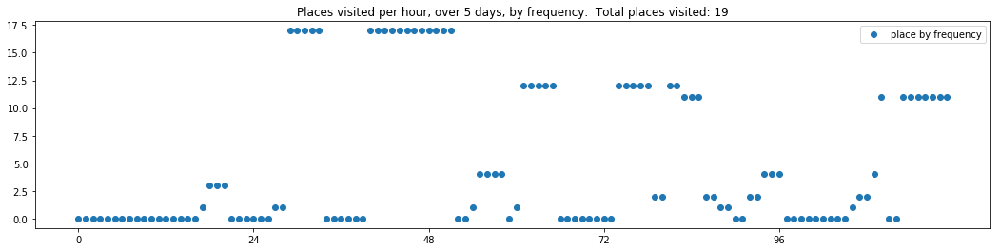

----- vector ----
prefix labels:  [581, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 398, 398, 0, 0, 0, 0, 163, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 55, 53]
[39, 39, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 482, 482, 0, 581, 581, 581, 581, 581]
[581, 581, 0, 0, 0, 0, 130, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 163, 163, 0, 0, 0, 0, 0, 130, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


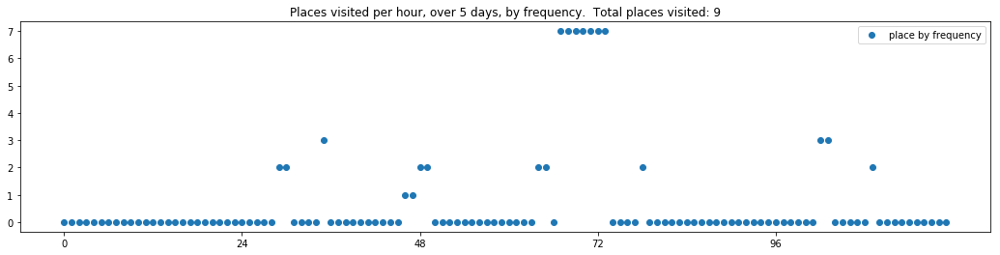

----- vector ----
prefix labels:  [568, 527]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 20, 20, 20, 20, 20, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 20, 20, 20, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


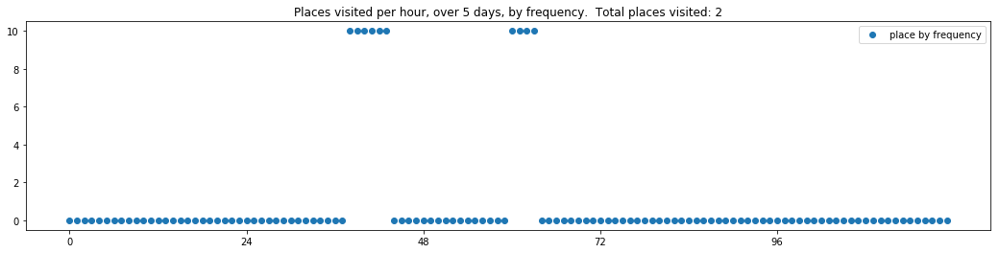

----- vector ----
prefix labels:  [411, 411]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 411, 411, 411, 411, 411, 411, 411, 411, 411, 411, 411, 411]
[411, 411, 411, 411, 411, 411, 411, 411, 411, 411, 411, 411, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 16]
[0, 0, 0, 0, 0, 0, 0, 271, 0, 0, 0, 0, 0, 0, 174, 411, 411, 411, 174, 193, 76, 76, 76, 76]


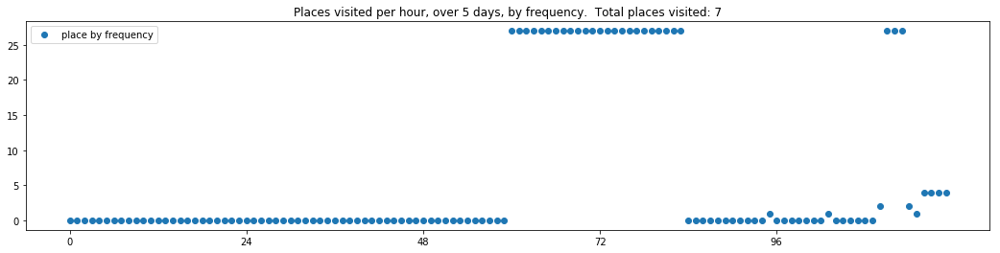

----- vector ----
prefix labels:  [165, 608]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 91, 0, 165, 165, 165, 165, 165, 165, 165, 165, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[493, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 311, 0, 311]
[311, 311, 311, 311, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608, 608]


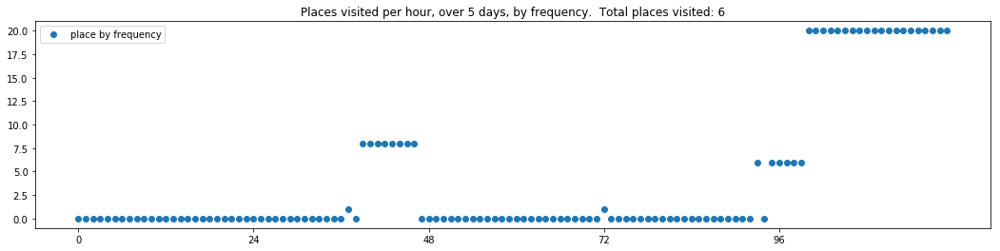

----- vector ----
prefix labels:  [417, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 55, 0, 0, 0, 0, 56, 178, 0, 0, 0, 0]
[374, 374, 0, 417, 417, 417, 417, 417, 417, 417, 417, 417, 21, 0, 451, 417, 417, 417, 417, 0, 0, 0, 0, 0]
[0, 0, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417]
[417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417, 417]


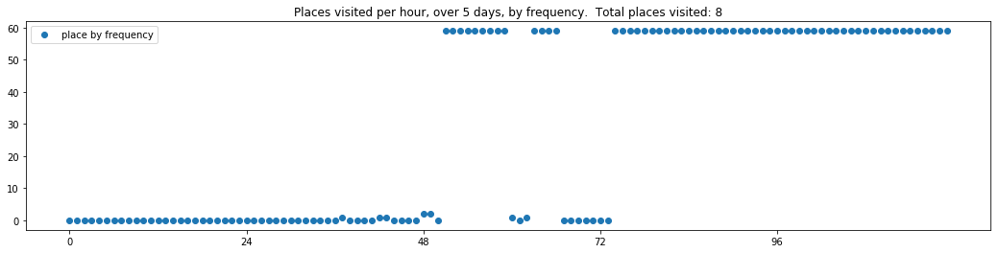

----- vector ----
prefix labels:  [76, 116]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 55, 55, 0]
[307, 473, 0, 0, 0, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 0]
[364, 373, 373, 373, 373, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 0, 0, 0, 0, 184, 184, 0, 0, 0, 0]


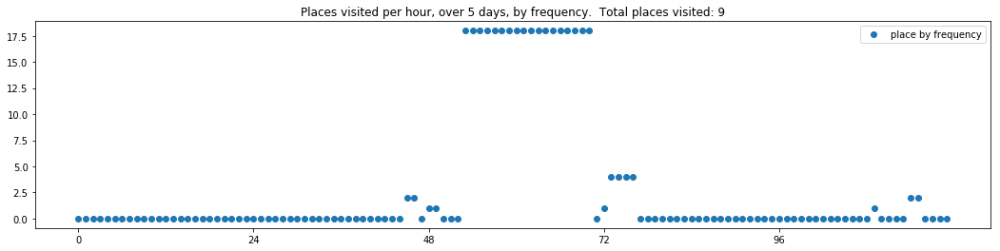

----- vector ----
prefix labels:  [433, 433]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 433, 433, 433, 433, 433, 433, 433]
[433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 433, 318, 223, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


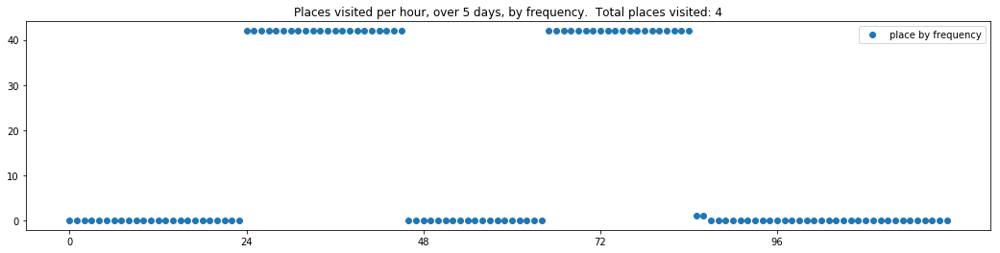

----- vector ----
prefix labels:  [108, 44]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44]
[44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 0, 0, 0, 0, 0, 44, 0, 44, 44, 44, 44, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 126, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 0, 44]


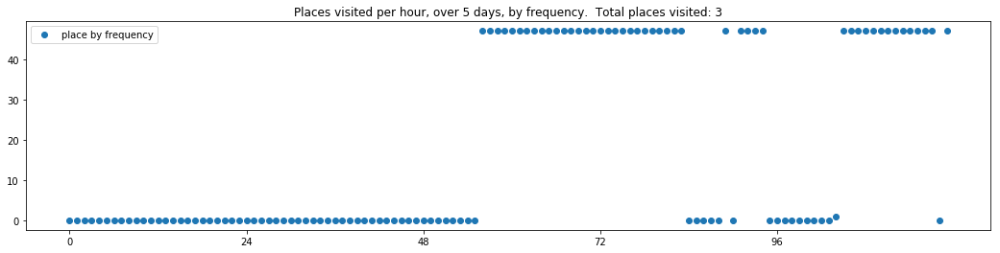

----- vector ----
prefix labels:  [85, 288]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 141, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[16, 181, 0, 0, 0, 0, 0, 87, 58, 58, 58, 58, 0, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36]
[36, 36, 36, 36, 36, 36, 36, 36, 393, 393, 51, 58, 58, 58, 58, 58, 58, 58, 58, 58, 58, 58, 58, 58]


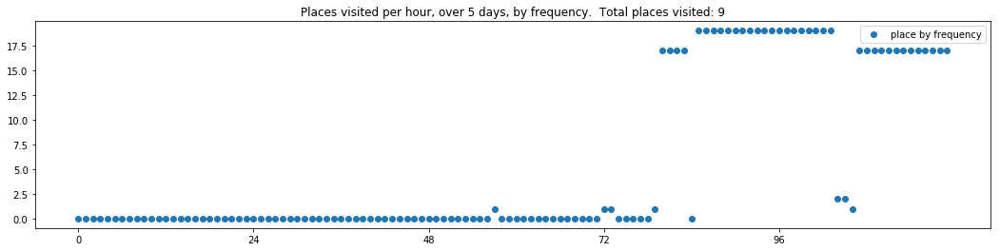


------
 5 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_5.txt 
------

----- vector ----
prefix labels:  [437, 437]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437, 437, 437, 437, 437, 437, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437, 437, 437, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437]
[437, 437, 437, 437, 437, 437, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


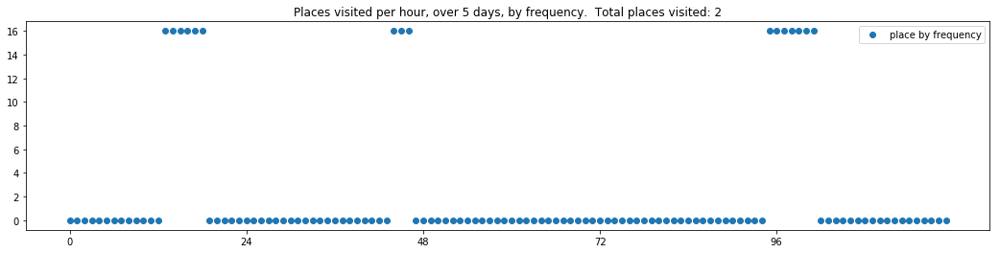

----- vector ----
prefix labels:  [511, 511]
[0, 0, 0, 0, 0, 0, 0, 0, 356, 356, 356, 356, 356, 356, 356, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 32, 0, 0, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84]
[84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511]
[511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 0]
[0, 0, 0, 225, 225, 225, 0, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511, 511]


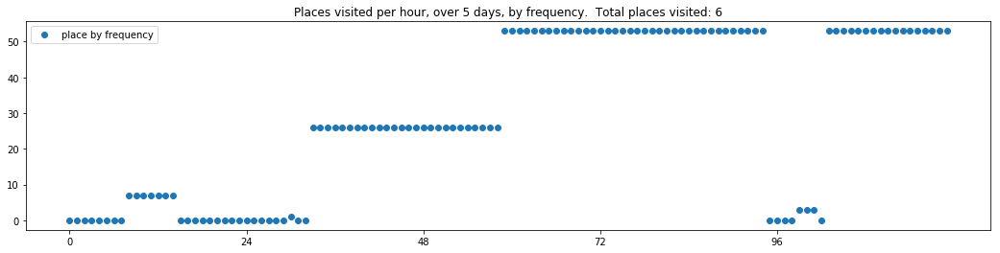

----- vector ----
prefix labels:  [195, 195]
[0, 0, 0, 0, 0, 195, 195, 195, 0, 0, 0, 195, 195, 195, 195, 195, 195, 195, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 195, 195, 195, 195, 195, 195, 0, 0, 0, 0, 0, 0, 0, 0, 195, 195, 195, 195, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 205, 205, 205, 195, 0, 195, 20, 0, 0]


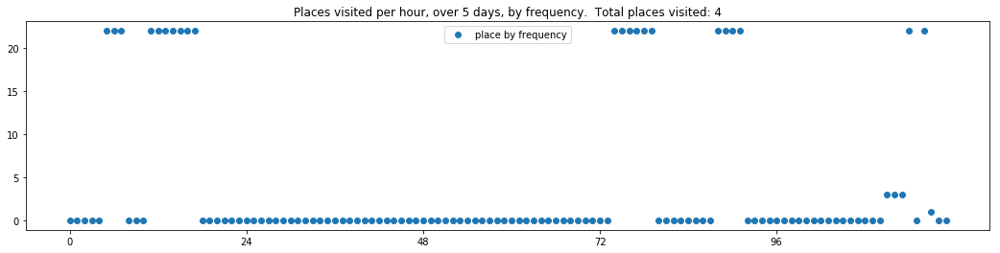

----- vector ----
prefix labels:  [388, 419]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 419, 419, 419, 419, 419, 419, 419, 71, 71, 71, 0, 0, 0, 0, 0, 0, 0, 0, 71, 0, 0, 0, 0]


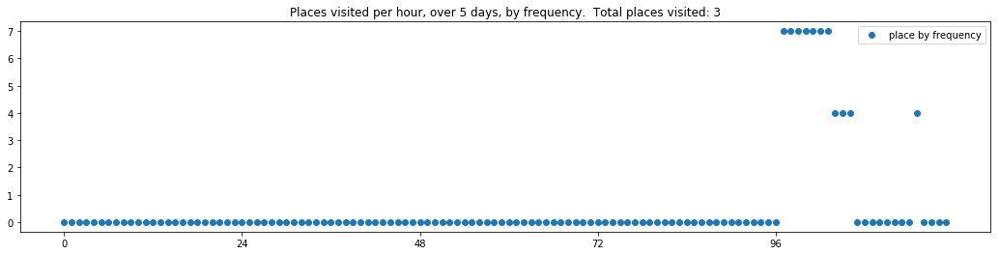

----- vector ----
prefix labels:  [44, 44]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 185, 74, 0, 0, 561, 561]
[561, 561, 0, 0, 0, 0, 0, 0, 0, 0, 0, 548, 508, 0, 295, 295, 147, 20, 10, 261, 261, 20, 20, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 360, 360, 360, 360, 0, 507, 5, 5, 5, 5, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 435, 435, 0, 0, 0, 0, 0, 0, 638, 0]
[0, 0, 0, 485, 0, 0, 0, 261, 261, 261, 261, 261, 261, 261, 261, 146, 146, 0, 2, 2, 2, 2, 2, 2]


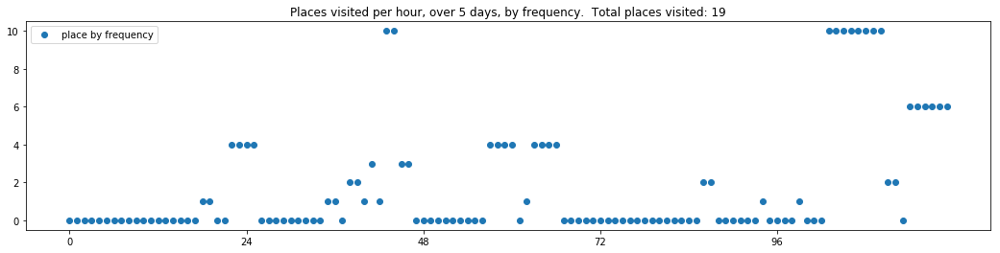

----- vector ----
prefix labels:  [154, 154]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 154, 154, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 112, 112, 112, 154, 154, 154, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 112, 112, 112, 112, 112, 593, 593, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 419, 419, 69, 154, 154, 112, 112, 112, 112, 0, 0, 0, 0, 112, 112, 154, 154, 154, 154, 154, 154]
[154, 154, 154, 154, 154, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 112, 112, 154, 154, 154]


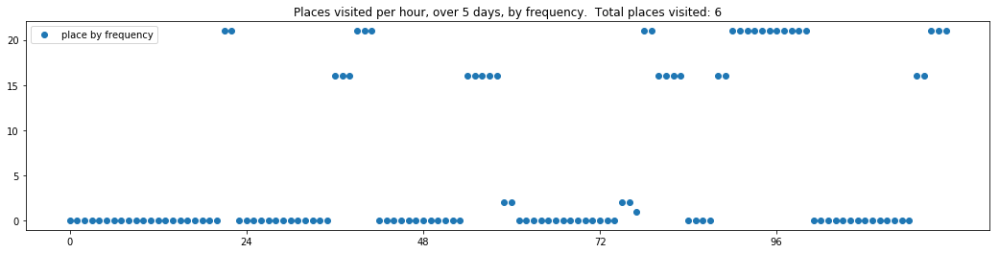

----- vector ----
prefix labels:  [39, 232]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 313, 313, 313, 313, 313, 313, 313, 313, 313]
[313, 313, 313, 313, 313, 313, 313, 313, 313, 313, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


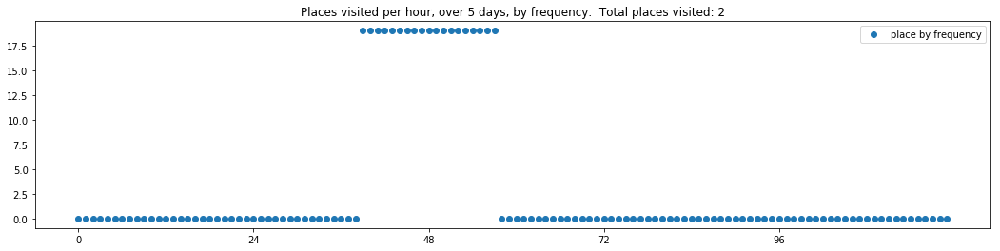

----- vector ----
prefix labels:  [22, 22]
[0, 0, 0, 0, 0, 0, 0, 22, 22, 0, 0, 0, 0, 0, 0, 0, 22, 22, 22, 22, 22, 22, 22, 22]
[22, 22, 22, 22, 22, 22, 22, 307, 307, 307, 307, 307, 307, 0, 0, 0, 0, 0, 0, 22, 22, 22, 22, 22]
[20, 20, 0, 0, 0, 0, 21, 0, 0, 0, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 22, 22, 271, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 162, 0, 0, 0, 0, 0, 0, 0, 0, 20, 22]


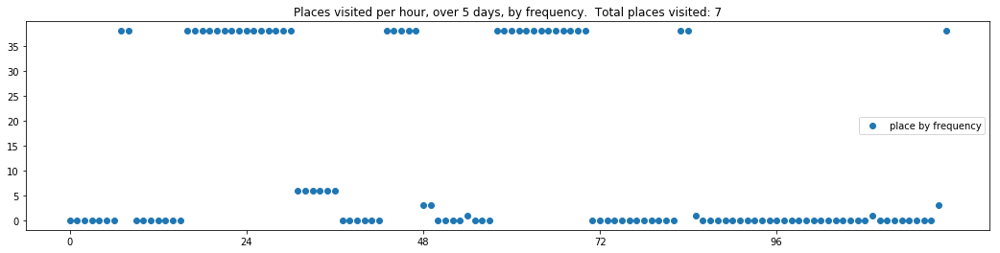

----- vector ----
prefix labels:  [122, 503]
[0, 0, 0, 25, 332, 332, 332, 332, 332, 332, 586, 586, 586, 586, 586, 586, 586, 523, 116, 116, 0, 0, 0, 503]
[503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503]
[503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503]
[503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503]
[503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 503, 199, 199, 199, 199, 199, 199, 199, 199, 197]


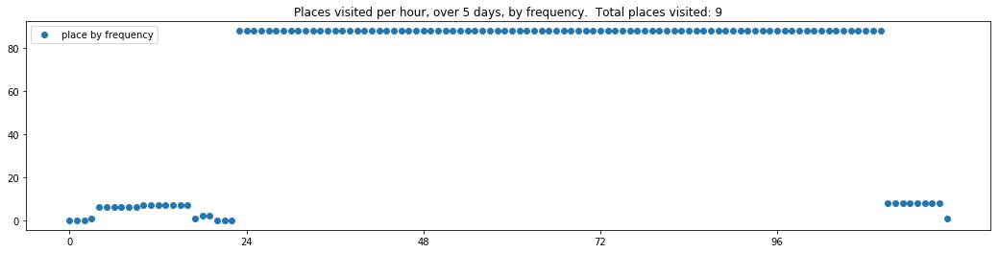

----- vector ----
prefix labels:  [183, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 464, 3, 3, 261, 388, 388, 388, 388, 388]
[388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 0, 0, 0, 0, 573, 573, 574, 0, 0, 476, 330]
[330, 288, 393, 239, 239, 239, 239, 239, 84, 476, 0, 0, 388, 430, 430, 430, 0, 227, 227, 561, 227, 227, 227, 227]
[227, 227, 227, 227, 227, 561, 561, 561, 227, 0, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561]
[561, 561, 561, 561, 561, 561, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 480, 480]


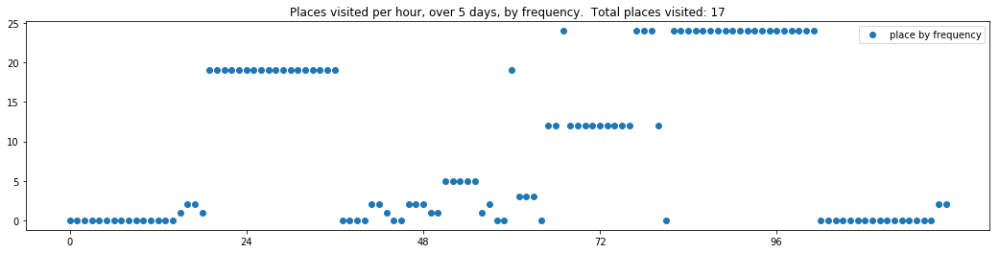


------
 10 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_10.txt 
------

----- vector ----
prefix labels:  [321, 321]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


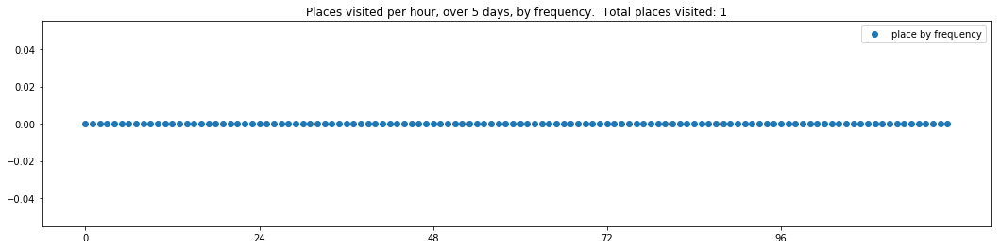

----- vector ----
prefix labels:  [618, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 618, 618, 618, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 385, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[336, 336, 336, 336, 336, 336, 336, 336, 336, 336, 336, 0, 0, 0, 0, 0, 0, 0, 0, 404, 404, 0, 0, 0]
[0, 0, 424, 424, 424, 424, 424, 424, 424, 424, 236, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 223, 0]


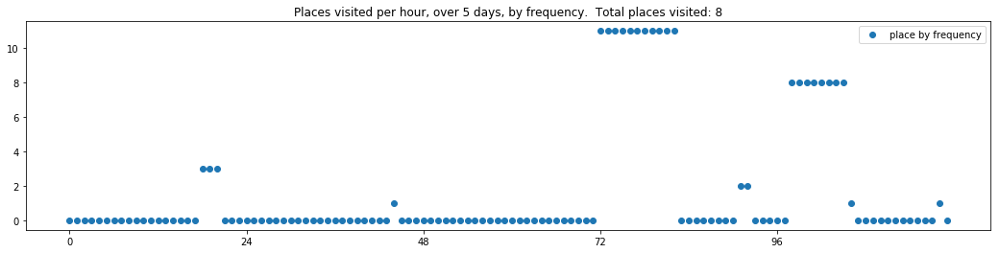

----- vector ----
prefix labels:  [22, 22]
[0, 0, 0, 0, 22, 22, 22, 162, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 22, 22, 22, 0, 0, 0, 0, 0, 0, 22, 22, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 342, 342]
[271, 271, 271, 271, 271, 271, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 0, 0]
[0, 0, 0, 0, 0, 0, 22, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 52, 52, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


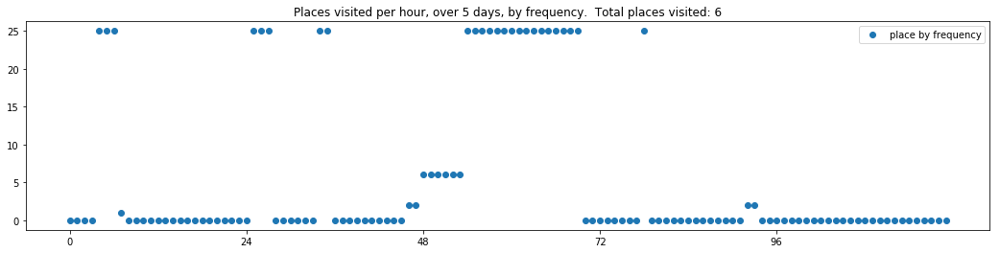

----- vector ----
prefix labels:  [46, 46]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 46, 46, 46, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 0, 0, 0, 0, 0, 0, 46, 46, 46, 46, 46, 46, 46]


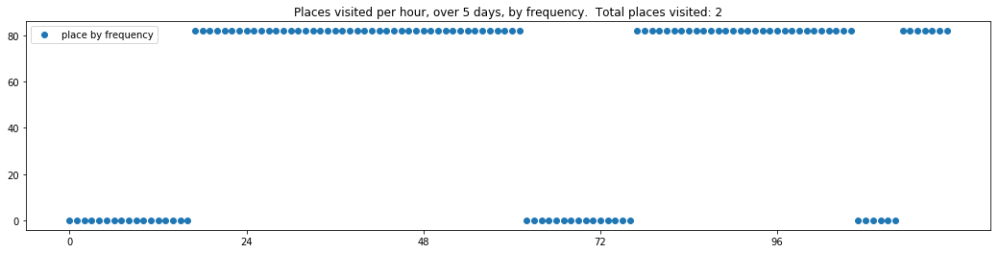

----- vector ----
prefix labels:  [350, 133]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 192, 59, 59, 133, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 541, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 374, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[162, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


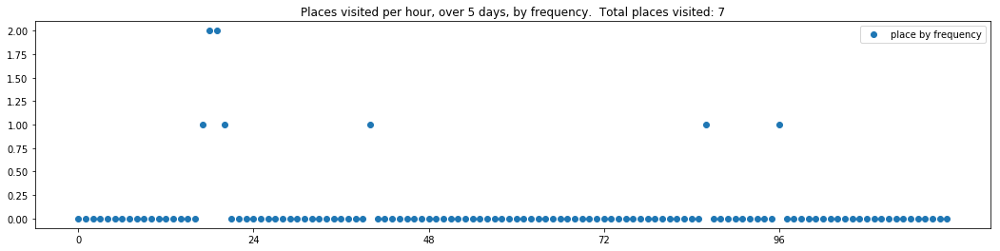

----- vector ----
prefix labels:  [92, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


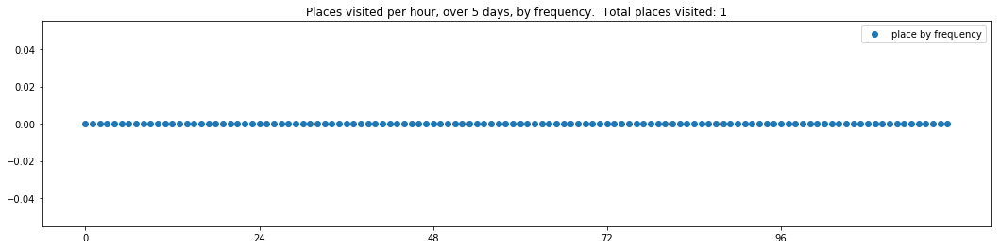

----- vector ----
prefix labels:  [323, 323]
[0, 0, 0, 0, 0, 0, 0, 0, 17, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 225, 225, 0, 225, 225, 225, 225, 225, 225, 225, 225, 225, 225, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 42, 42, 0, 0, 0, 0, 0, 0, 0, 0, 350, 350]
[350, 350, 350, 350, 350, 350, 350, 350, 350, 350, 350, 350, 350, 350, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 225, 225, 225, 225, 225]


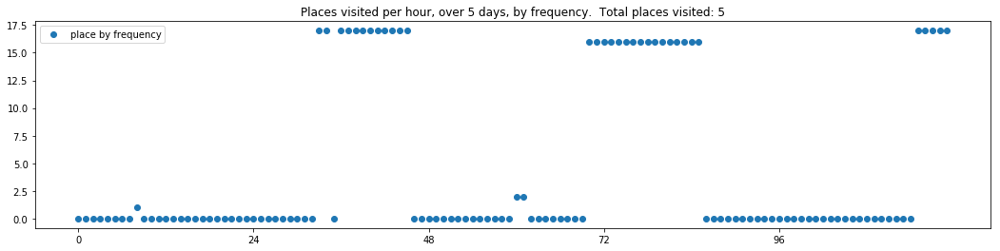

----- vector ----
prefix labels:  [494, 76]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[558, 0, 443, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 464, 464, 0, 464, 464, 464, 464, 464, 558]
[558, 558, 0, 0, 0, 0, 0, 0, 598, 598, 0, 0, 0, 0, 0, 0, 0, 4, 2, 2, 0, 2, 0, 0]
[0, 0, 0, 0, 598, 598, 598, 461, 461, 461, 0, 122, 122, 598, 0, 184, 184, 184, 0, 0, 0, 0, 0, 0]
[475, 116, 116, 116, 0, 0, 0, 0, 0, 0, 0, 0, 70, 612, 612, 0, 370, 370, 249, 257, 257, 257, 257, 257]


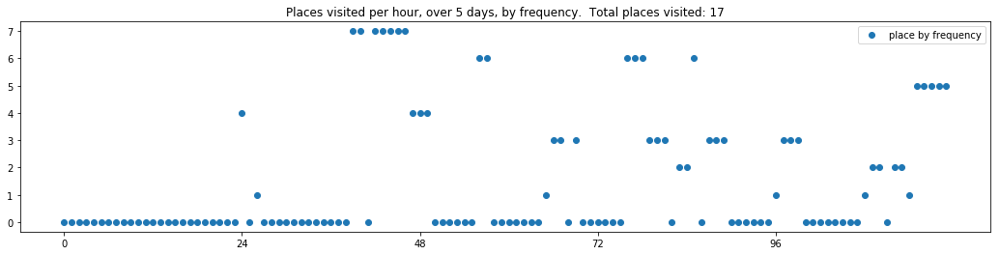

----- vector ----
prefix labels:  [21, 290]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 290, 290, 0, 0, 290, 290, 290, 290, 290, 290]
[290, 290, 290, 558, 558, 558, 558, 558, 558, 290, 290, 290, 290, 290, 290, 290, 290, 290, 556, 447, 76, 76, 22, 22]
[22, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 76, 29, 0, 0, 0, 0, 0, 0, 100, 0, 66]
[66, 66, 66, 0, 0, 0, 56, 143, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


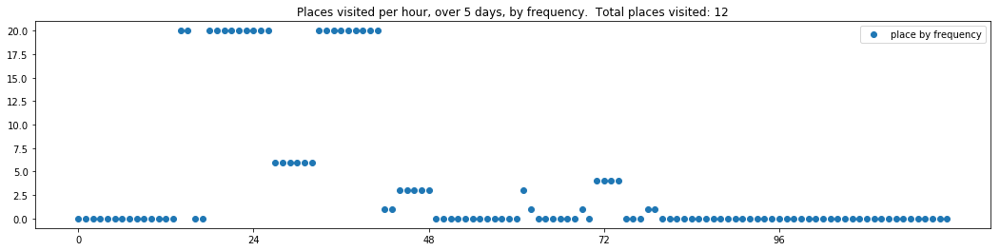

----- vector ----
prefix labels:  [184, 184]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 184, 184, 184]
[184, 184, 0, 0, 0, 0, 0, 0, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184]
[184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184]
[184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184]
[184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184]


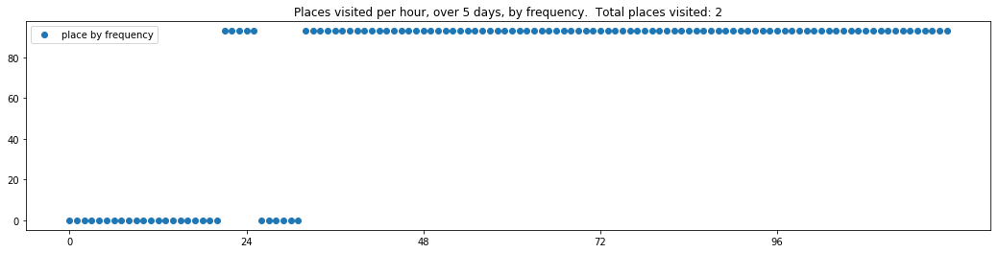


------
 15 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_15.txt 
------

----- vector ----
prefix labels:  [507, 488]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 568, 0, 0, 0, 235, 235, 541, 541, 541, 0, 0, 488, 488, 488, 488, 488, 488, 488, 488, 488, 488]
[488, 488, 488, 488, 488, 488, 488, 488, 488, 45, 45, 488, 488, 488, 488, 488, 488, 488, 488, 488, 488, 0, 0, 507]
[492, 492, 492, 0, 507, 507, 507, 507, 568, 568, 568, 488, 488, 488, 488, 488, 488, 488, 488, 488, 488, 488, 488, 488]
[488, 488, 488, 488, 488, 488, 488, 286, 488, 488, 488, 488, 488, 488, 488, 488, 488, 488, 507, 507, 507, 507, 488, 488]


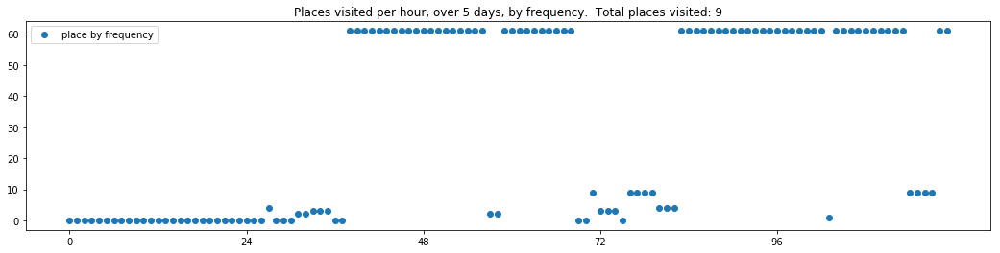

----- vector ----
prefix labels:  [190, 190]
[190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190]
[190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190]
[190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 392, 392, 392]
[392, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 190]
[190, 190, 190, 190, 190, 190, 190, 190, 190, 190, 0, 485, 485, 485, 382, 0, 0, 0, 0, 0, 0, 0, 0, 0]


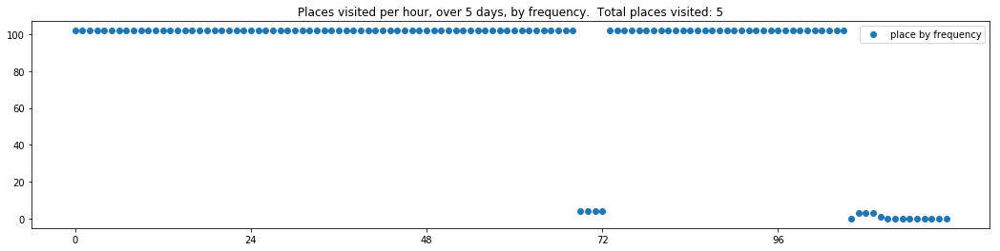

----- vector ----
prefix labels:  [78, 20]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 406, 406, 406, 406, 406, 406, 406, 406]
[406, 406, 406, 406, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


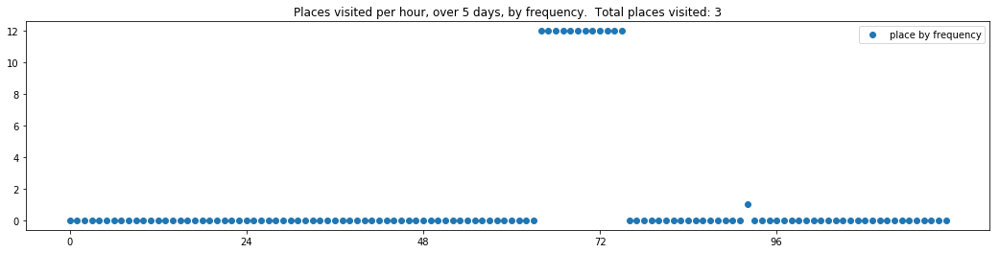

----- vector ----
prefix labels:  [448, 480]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 284, 284, 284, 0, 0, 0, 65, 65, 0, 0, 0, 0, 0, 0, 0, 640, 640, 640, 640]
[640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 0, 0, 0, 0, 0, 0, 0, 0, 0, 640, 640, 640]
[640, 640, 640, 0, 0, 0, 0, 640, 640, 640, 0, 0, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640]


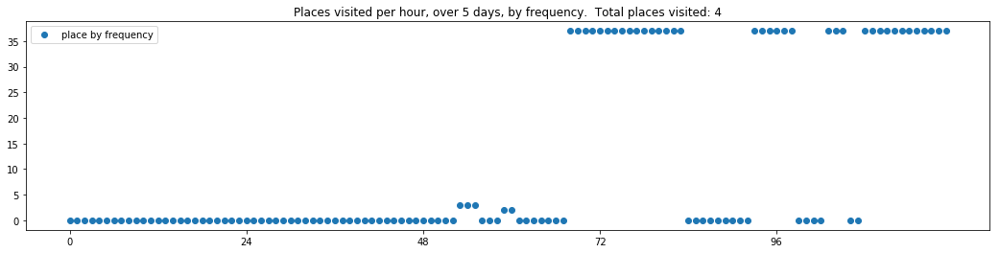

----- vector ----
prefix labels:  [39, 39]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 71, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 39, 39, 187, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39]
[39, 39, 39, 39, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378]
[378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378, 378]


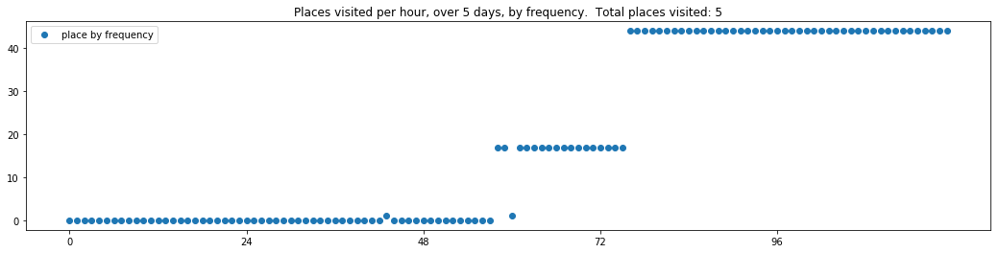

----- vector ----
prefix labels:  [357, 357]
[0, 357, 357, 357, 372, 0, 357, 357, 357, 357, 357, 357, 0, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357]
[357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357]
[357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357]
[357, 357, 357, 400, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 248, 0, 0, 0, 0, 0, 0, 0, 0]


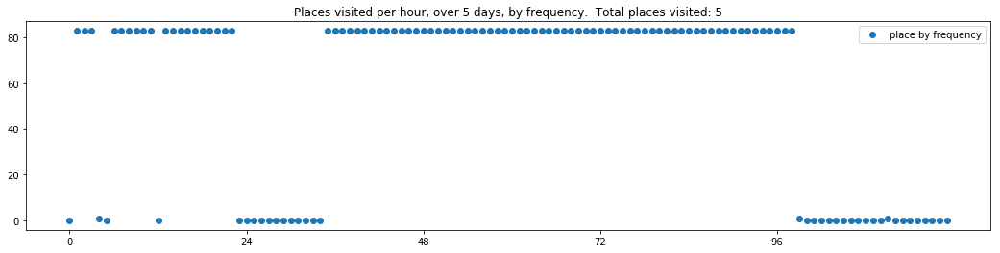

----- vector ----
prefix labels:  [237, 237]
[0, 0, 0, 487, 0, 108, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 46, 46, 46, 46, 46, 46, 502, 502, 502, 502, 502, 0, 108, 0, 502]
[502, 502, 502, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 502, 0, 0, 0, 0, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 0, 46]


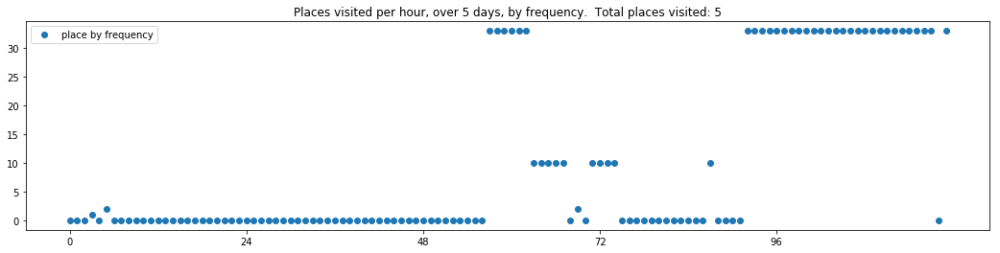

----- vector ----
prefix labels:  [368, 636]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 126, 0, 0, 0, 209, 209, 636, 636, 636, 636]
[636, 636, 429, 429, 0, 429, 429, 429, 334, 334, 334, 57, 57, 57, 57, 0, 0, 0, 0, 0, 0, 0, 8, 8]
[276, 276, 276, 276, 276, 276, 276, 160, 218, 122, 122, 400, 400, 400, 209, 209, 209, 457, 209, 458, 458, 209, 209, 209]
[209, 0, 0, 0, 636, 636, 636, 636, 636, 636, 636, 636, 636, 506, 636, 636, 636, 636, 636, 636, 636, 636, 636, 0]


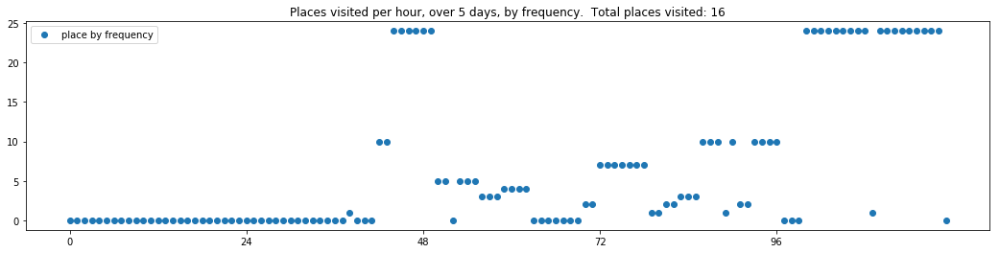

----- vector ----
prefix labels:  [604, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 604, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 244, 244, 0, 0, 0, 0, 0, 187]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[187, 604, 604, 604, 0, 0, 0, 0, 0, 0, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 0, 0, 0]


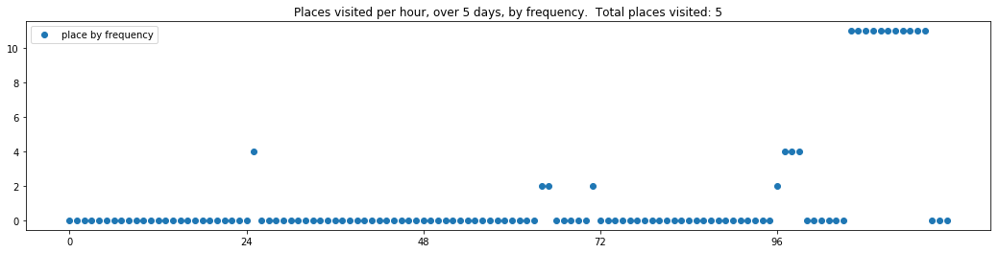

----- vector ----
prefix labels:  [268, 268]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 268, 268, 268, 268, 268, 268, 268, 268]
[268, 268, 268, 268, 0, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 21, 21, 21, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 32, 0, 268, 268, 268, 268, 268]
[268, 268, 268, 0, 0, 0, 0, 0, 0, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 503, 503]


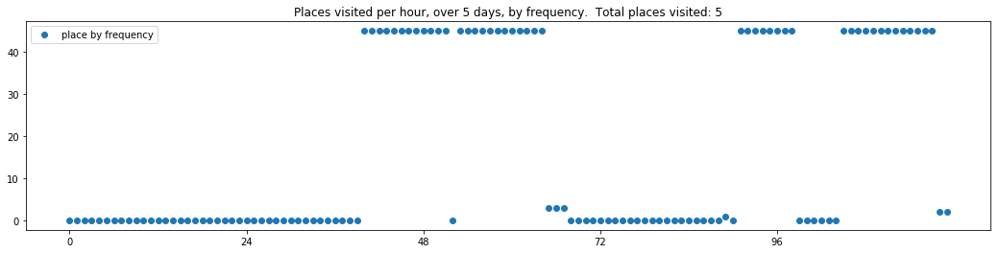


------
 20 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_20.txt 
------

----- vector ----
prefix labels:  [221, 221]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 221, 221, 0, 0, 0, 0, 0, 0, 0, 221, 221, 221, 221, 221, 221]
[221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 221, 221, 221, 221, 384, 384, 384, 384]
[221, 221, 0, 276, 364, 364, 364, 364, 364, 364, 364, 364, 364, 284, 93, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116]


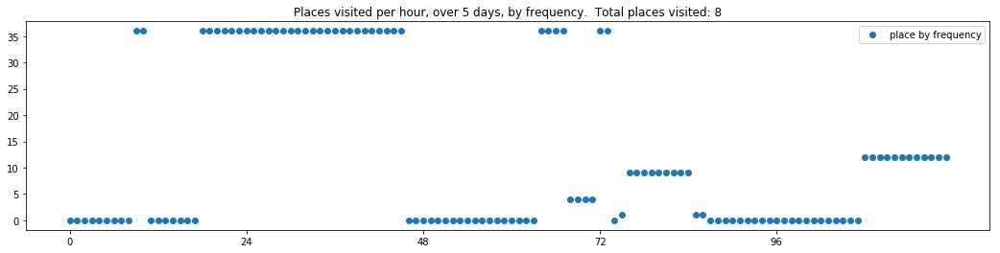

----- vector ----
prefix labels:  [76, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 76, 76, 0, 0, 0, 0, 0, 0, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


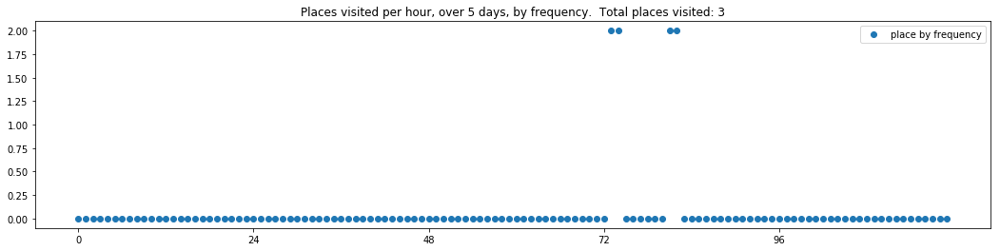

----- vector ----
prefix labels:  [167, 318]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 165, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 110, 110, 110, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 562, 562, 562, 562, 562, 562, 562, 562, 562, 0]
[32, 0, 0, 562, 562, 562, 562, 0, 165, 0, 0, 562, 562, 562, 562, 0, 0, 0, 391, 391, 391, 391, 0, 0]


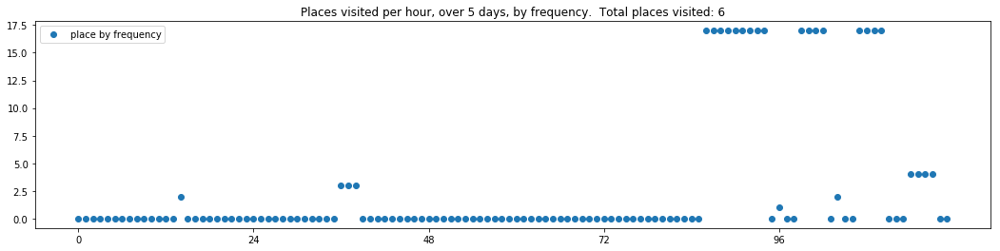

----- vector ----
prefix labels:  [437, 437]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437, 437, 0, 0, 0, 0, 0, 0, 0]
[437, 437, 437, 437, 437, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 259]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


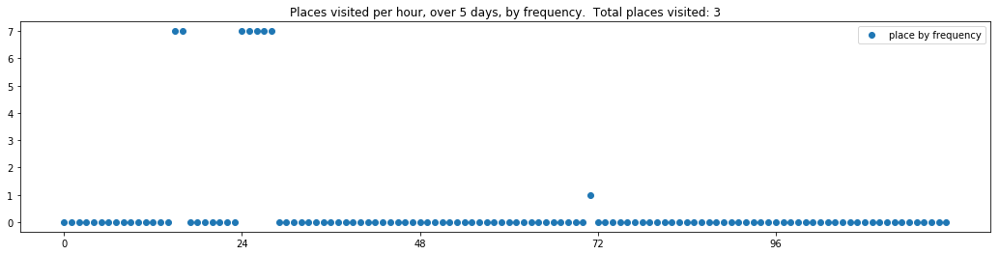

----- vector ----
prefix labels:  [415, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 415, 415, 415, 415, 415, 415, 415, 415, 415, 0, 415]
[415, 415, 415, 415, 415, 415, 415, 415, 415, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0]


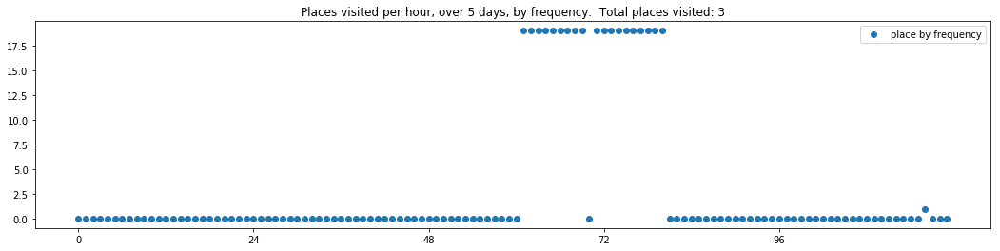

----- vector ----
prefix labels:  [26, 26]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 26, 26, 0, 391, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


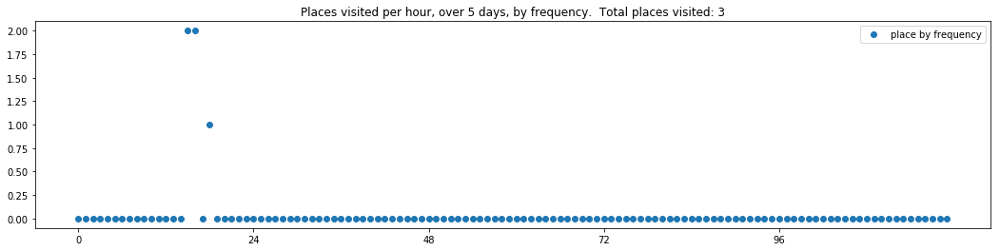

----- vector ----
prefix labels:  [163, 71]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 163, 71, 71, 71, 71, 0, 0, 71, 71, 71, 71, 71, 71, 71, 71, 71]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 71, 71, 0, 0, 0, 0, 0, 151, 151, 151, 71]
[0, 0, 0, 0, 0, 0, 0, 473, 0, 0, 0, 0, 0, 215, 0, 71, 71, 71, 71, 71, 0, 0, 0, 0]
[0, 0, 71, 71, 71, 71, 71, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 71]


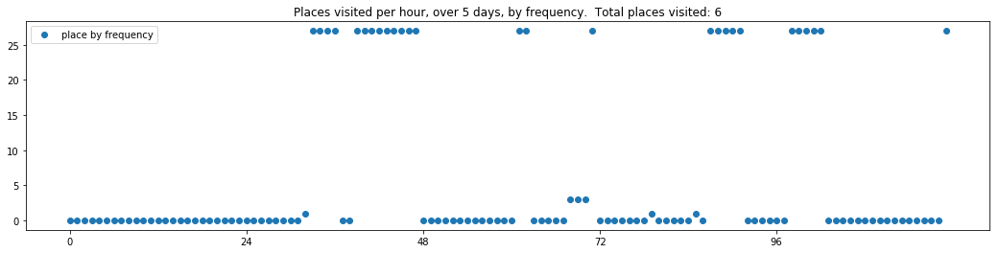

----- vector ----
prefix labels:  [76, 434]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 434, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 32, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 434, 434, 434, 0, 271, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434]
[434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


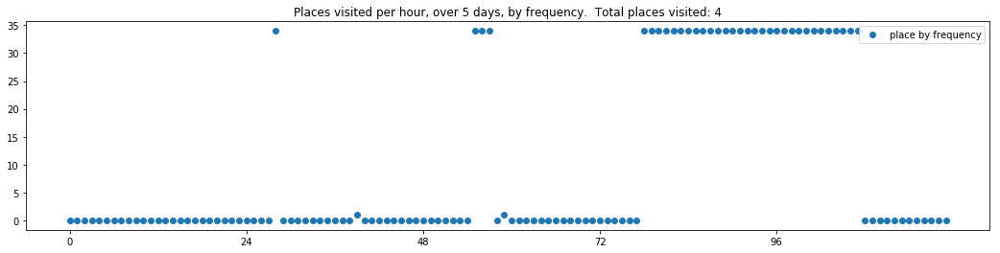

----- vector ----
prefix labels:  [69, 69]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
[69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 199, 199, 0, 0, 0, 0, 0]


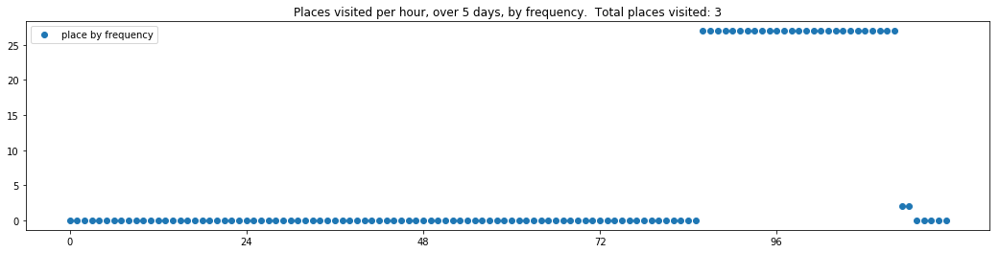

----- vector ----
prefix labels:  [605, 605]
[0, 0, 0, 0, 0, 524, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 248]
[0, 0, 0, 0, 327, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 533]


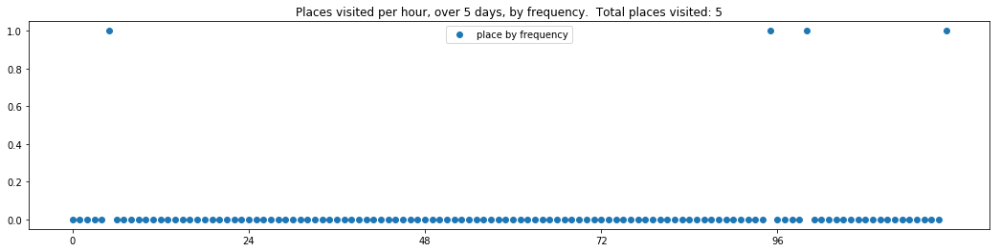


------
 25 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_25.txt 
------

----- vector ----
prefix labels:  [117, 117]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 117, 0]
[0, 0, 0, 0, 0, 0, 0, 117, 117, 117, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 82, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 117, 117]
[0, 32, 306, 0, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434]
[434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 0, 434, 434, 434, 434, 434, 434, 434, 434]


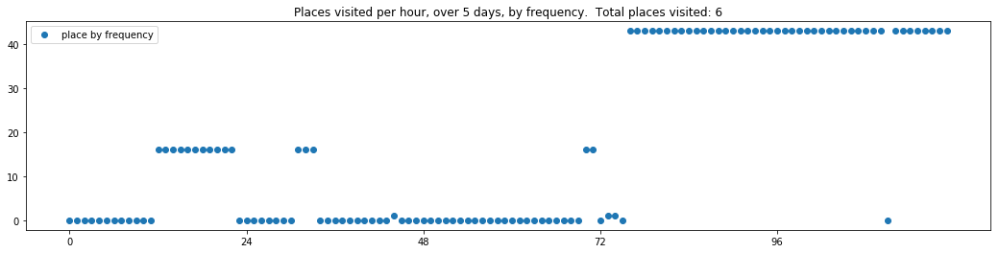

----- vector ----
prefix labels:  [41, 84]
[0, 0, 0, 0, 0, 84, 84, 84, 84, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 84, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 84, 84, 41, 41, 41, 41, 41, 41, 41, 41, 41]
[41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41]
[41, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 177, 177, 177, 0, 0, 0, 0, 0]
[0, 554, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 105, 374, 374, 0, 177, 177, 0, 0, 41]


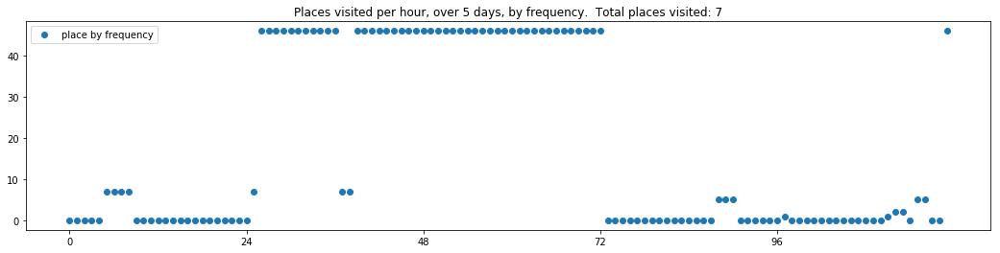

----- vector ----
prefix labels:  [437, 437]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 437, 0, 0, 437, 437, 437, 437, 0, 0, 0, 0, 0, 0, 0, 0, 437, 437, 437, 437]
[437, 437, 437, 437, 437, 0, 0, 0, 437, 437, 437, 437, 162, 0, 0, 0, 0, 0, 0, 0, 0, 437, 437, 437]


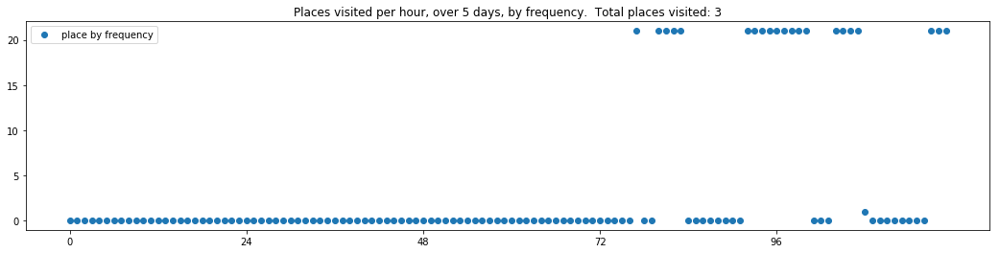

----- vector ----
prefix labels:  [604, 339]
[0, 0, 0, 0, 0, 339, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


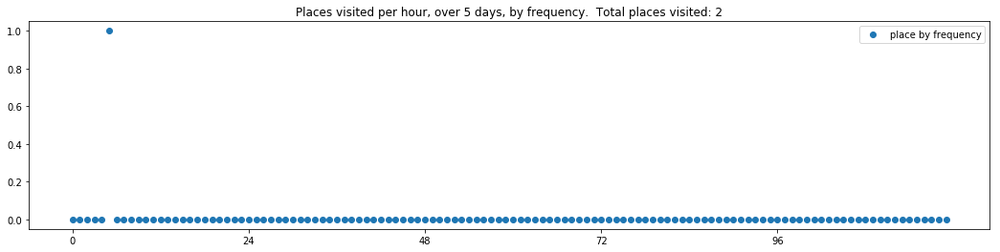

----- vector ----
prefix labels:  [437, 437]
[0, 0, 0, 0, 0, 437, 437, 437, 437, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 437, 437, 437, 437, 437, 437, 437, 437, 437, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 437, 0, 0, 0, 0, 0, 0, 437, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 437, 0, 0, 0, 437, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


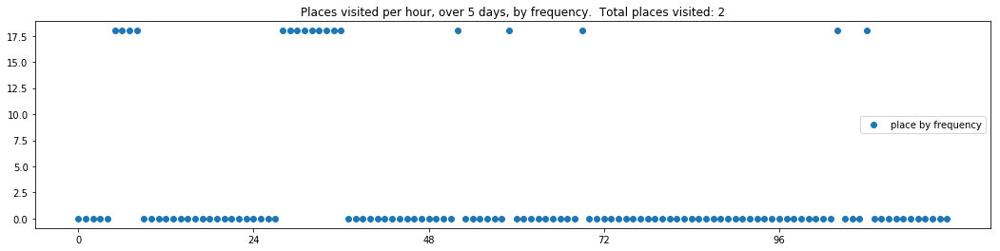

----- vector ----
prefix labels:  [434, 434]
[0, 0, 0, 0, 0, 0, 0, 0, 434, 434, 434, 0, 0, 0, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434]
[434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 0]
[0, 0, 0, 0, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434]
[434, 434, 434, 434, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 434, 434, 434, 434, 434, 434, 0, 0]
[0, 0, 0, 0, 0, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 0, 0, 0]


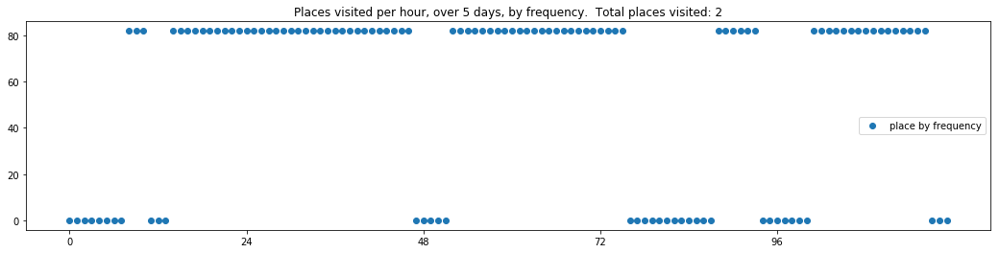

----- vector ----
prefix labels:  [118, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


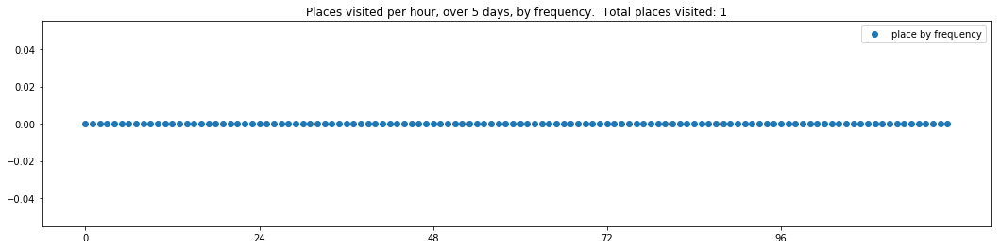

----- vector ----
prefix labels:  [248, 483]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 483, 483, 483, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 320, 320, 320, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 73, 158, 158, 503, 503, 503, 503, 503, 0, 0, 0, 0, 220, 0, 361, 361]


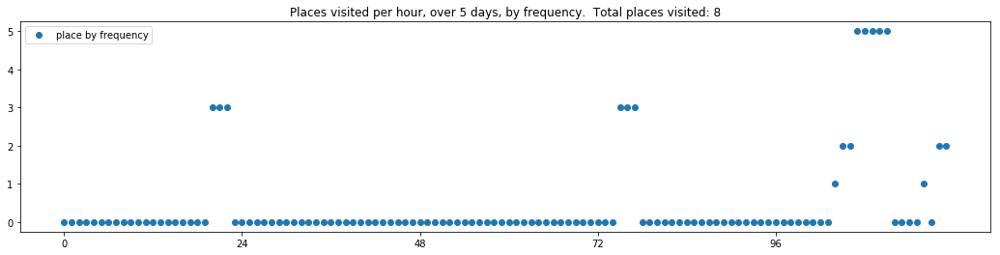

----- vector ----
prefix labels:  [20, 20]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 20, 239, 239, 271, 424, 424, 0, 0, 0, 0]
[0, 0, 62, 0, 0, 0, 0, 0, 382, 0, 0, 0, 0, 0, 0, 0, 0, 76, 0, 0, 0, 0, 0, 0]


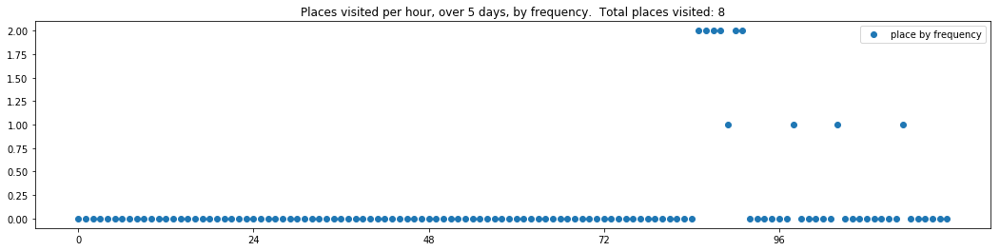

----- vector ----
prefix labels:  [223, 223]
[0, 0, 0, 0, 0, 205, 223, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 223, 223, 223, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


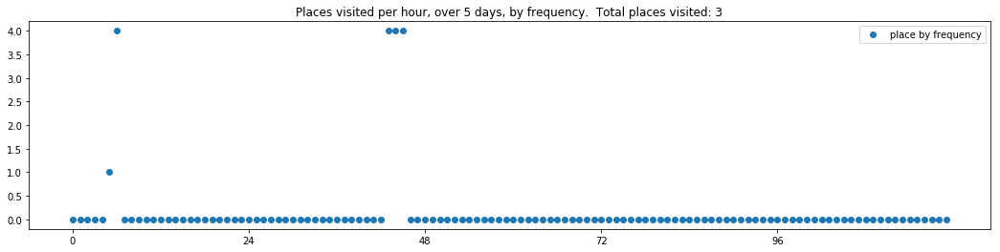


------
 30 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_30.txt 
------

----- vector ----
prefix labels:  [286, 508]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 508, 508, 508, 508, 508, 508]
[508, 508, 508, 508, 508, 508, 0, 0, 0, 0, 0, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568]
[568, 568, 568, 568, 0, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 124, 0, 0, 205, 205, 205, 205, 507, 507]
[205, 205, 103, 563, 563, 563, 0, 205, 205, 205, 205, 205, 205, 286, 22, 22, 0, 0, 618, 618, 618, 618, 618, 618]
[618, 618, 618, 618, 618, 618, 147, 508, 508, 508, 508, 508, 563, 563, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568]


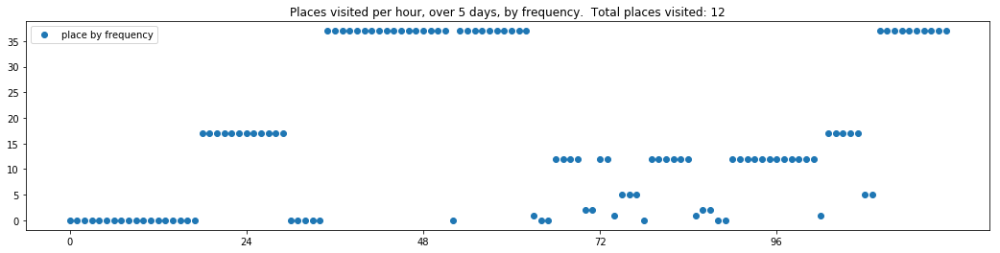

----- vector ----
prefix labels:  [413, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 413]
[413, 0, 112, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 413, 413, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 186, 0, 412, 412, 412, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


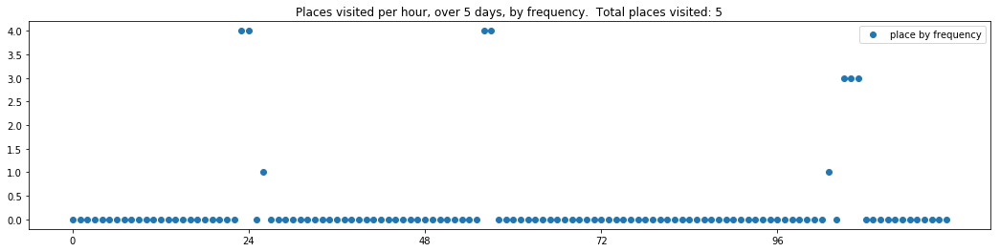

----- vector ----
prefix labels:  [312, 312]
[0, 0, 0, 0, 0, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312]
[312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312]
[312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312]
[312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312]
[312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312]


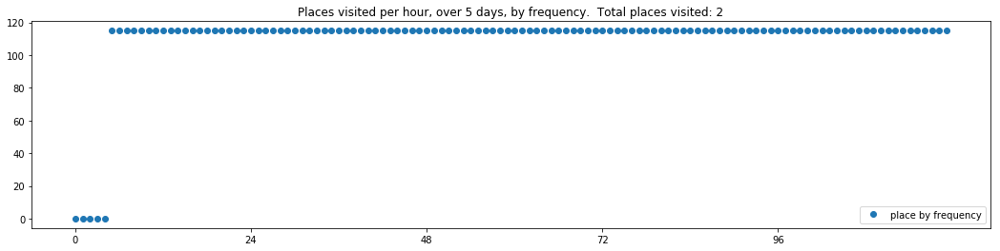

----- vector ----
prefix labels:  [358, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 358, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 358, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 126, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0]


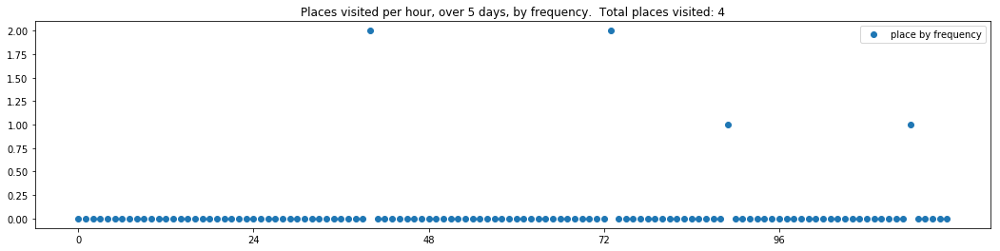

----- vector ----
prefix labels:  [167, 167]
[0, 0, 0, 255, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 429, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 165, 165, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


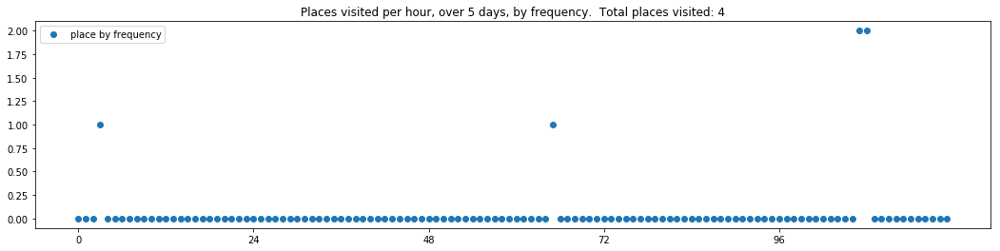

----- vector ----
prefix labels:  [626, 122]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 252, 71, 0, 0, 493, 0, 23, 220, 0, 0, 0, 187]
[187, 378, 378, 378, 0, 596, 0, 187, 71, 0, 187, 370, 144, 144, 144, 0, 136, 0, 0, 0, 0, 0, 0, 0]
[142, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 122, 122, 122, 122, 122, 122, 122]
[122, 122, 122, 122, 122, 122, 248, 231, 0, 0, 0, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
[69, 69, 69, 69, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 0, 0, 187, 0, 0, 0, 0, 0]


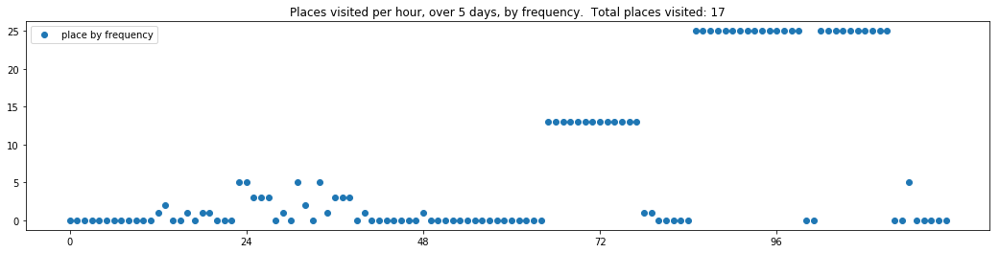

----- vector ----
prefix labels:  [523, 523]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 523, 523, 523, 523, 523, 0, 0, 0, 523, 523, 523, 523, 523, 523, 523]
[523, 523, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 388, 388, 388]
[388, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 242, 242, 242, 242, 242, 242, 242, 242, 242]
[242, 242, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


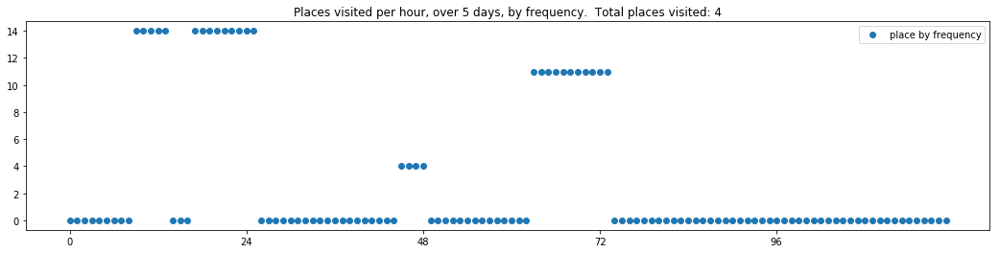

----- vector ----
prefix labels:  [238, 94]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 238, 238, 238, 238, 238, 238, 238, 238, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 471, 471, 0, 0, 69, 69, 8, 0, 0, 0, 238, 69, 69, 69, 69, 69, 69, 69, 69, 69]
[0, 0, 0, 0, 0, 0, 0, 0, 346, 0, 516, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 69]


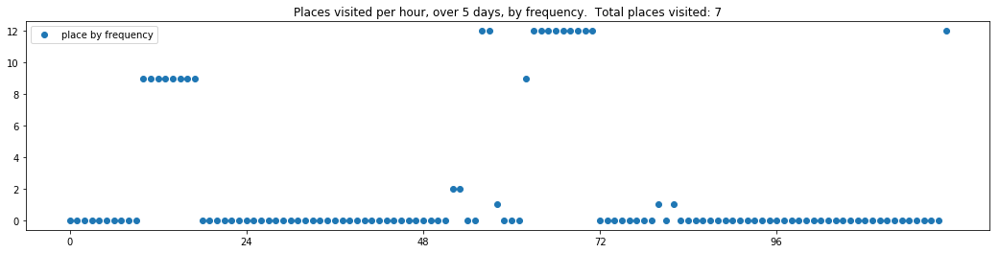

----- vector ----
prefix labels:  [309, 309]
[0, 0, 0, 0, 0, 0, 0, 309, 309, 309, 433, 433, 433, 433, 433, 0, 0, 0, 0, 0, 0, 23, 304, 304]
[304, 0, 0, 0, 205, 0, 433, 433, 433, 433, 433, 433, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 296, 0, 0, 0, 0, 309, 309, 0, 0, 0, 0, 620, 620, 309, 309, 309, 309, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 309, 309, 309, 309, 309, 309, 313, 313, 313, 313, 0, 309, 309, 309, 309, 0, 0, 0, 0]
[309, 309, 309, 309, 309, 309, 0, 0, 0, 0, 102, 102, 205, 205, 205, 205, 0, 0, 0, 0, 0, 0, 309, 309]


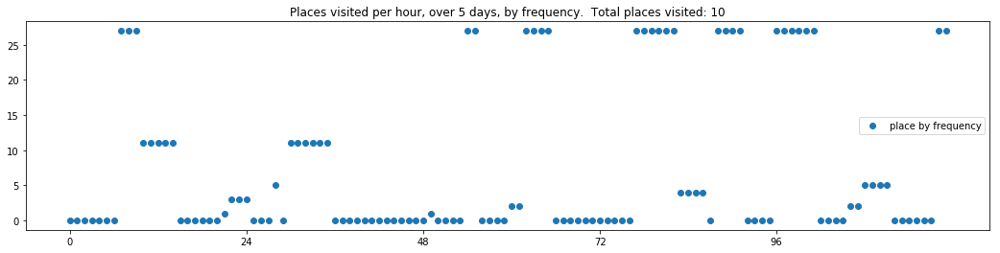

----- vector ----
prefix labels:  [215, 215]
[0, 0, 0, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215]
[215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215]
[215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215]
[215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215]
[215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215, 215]


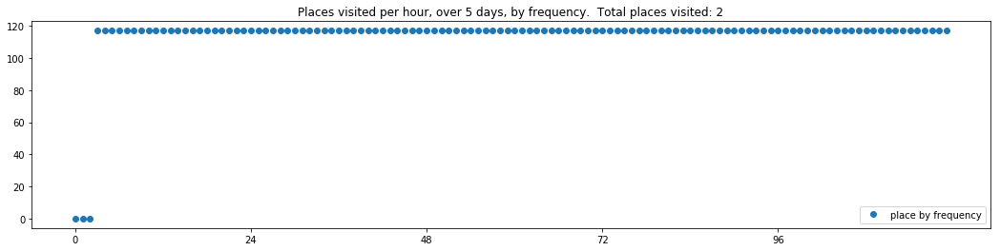


------
 35 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_35.txt 
------

----- vector ----
prefix labels:  [596, 596]
[0, 0, 0, 0, 596, 596, 0, 0, 0, 0, 0, 0, 0, 0, 0, 596, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 596, 0, 596, 596, 596, 0, 0, 596, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


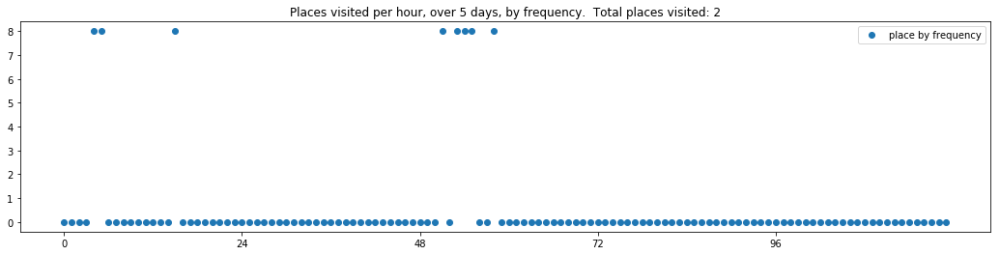

----- vector ----
prefix labels:  [108, 320]
[0, 0, 0, 0, 0, 0, 0, 0, 47, 246, 548, 0, 22, 47, 47, 47, 47, 47, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 47, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 434, 0, 0, 0, 46, 0, 400, 0, 0, 0, 0, 0, 126, 126, 126, 126, 126, 126, 126]
[126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126]
[126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126]


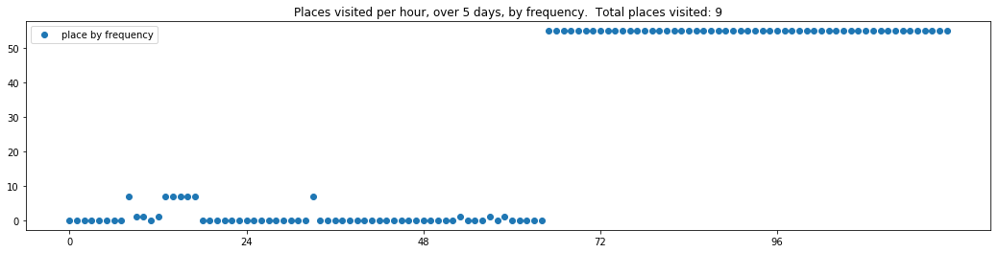

----- vector ----
prefix labels:  [328, 328]
[0, 0, 0, 0, 328, 328, 0, 0, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328]
[328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 0, 0, 0, 328, 328, 328, 328, 328]
[328, 328, 328, 328, 0, 0, 0, 0, 0, 0, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328]


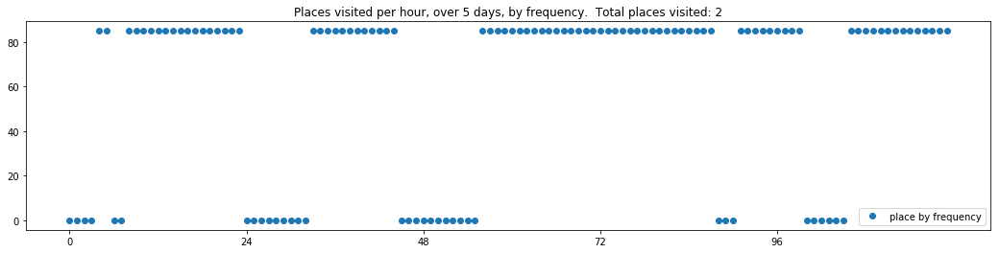

----- vector ----
prefix labels:  [32, 370]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 72, 0, 0, 0, 0]
[332, 332, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 38, 38, 38, 38, 38]


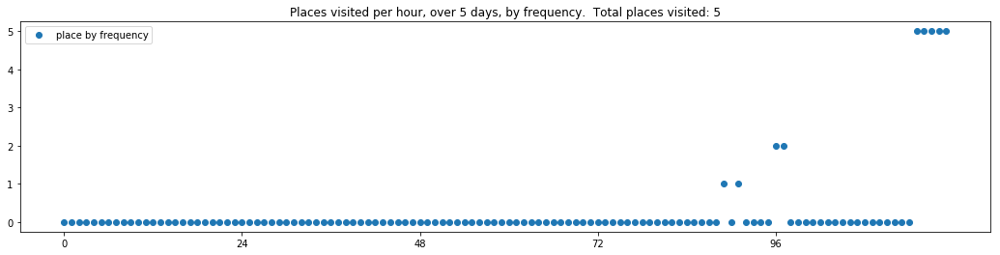

----- vector ----
prefix labels:  [69, 69]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 69, 69, 69, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 69, 69, 0, 185, 69, 69, 69, 69, 69, 69, 69, 69]
[69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
[69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]


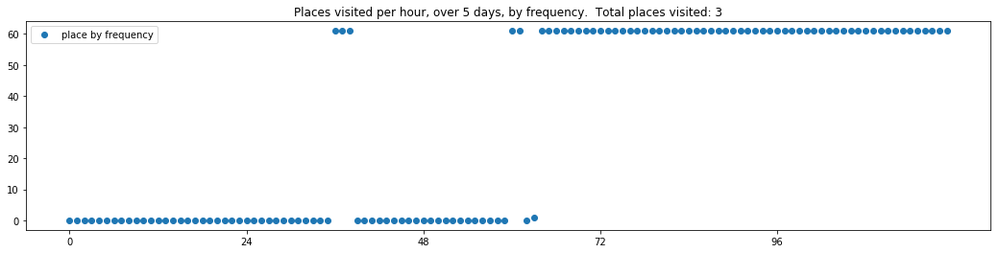

----- vector ----
prefix labels:  [183, 183]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 183, 183, 183]
[183, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545]
[545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545]


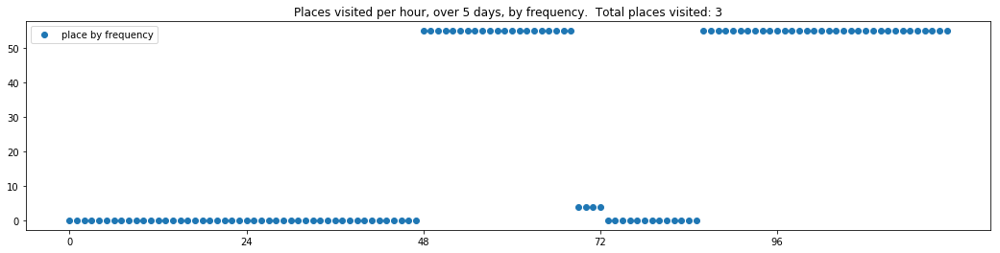

----- vector ----
prefix labels:  [231, 231]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 231, 231, 0, 60, 0, 0, 434, 434, 434, 434, 434, 434]
[434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 0, 0]
[140, 140, 140, 293, 293, 72, 72, 72, 72, 182, 182, 203, 203, 203, 203, 203, 427, 31, 32, 32, 32, 32, 32, 32]
[32, 371, 371, 259, 203, 203, 203, 140, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 412]
[412, 412, 412, 248, 248, 2, 0, 0, 0, 0, 0, 0, 0, 0, 259, 0, 0, 0, 0, 568, 0, 0, 0, 0]


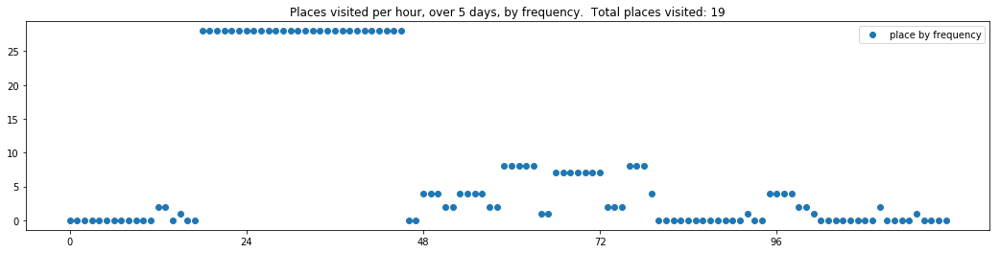

----- vector ----
prefix labels:  [226, 226]
[226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 226, 181, 226, 226, 226, 226, 226]
[226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 418, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226]


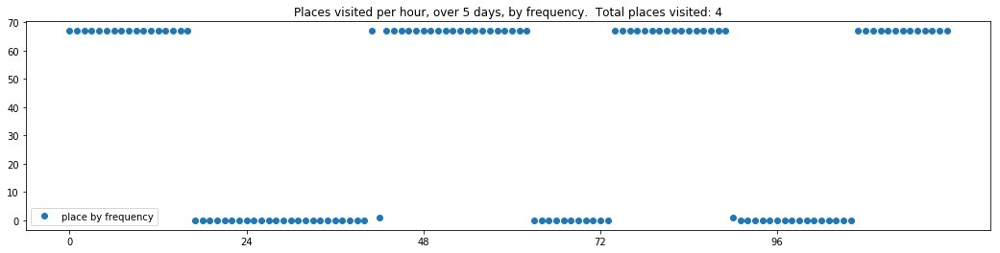

----- vector ----
prefix labels:  [280, 278]
[0, 0, 0, 0, 0, 0, 0, 398, 398, 398, 398, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278]
[278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278]
[278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278]
[278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278]


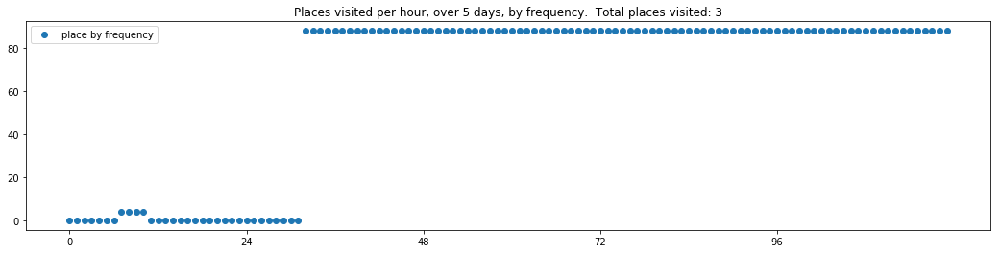

----- vector ----
prefix labels:  [232, 0]
[0, 0, 336, 0, 288, 0, 271, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 446]
[446, 446, 446, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 30, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 66, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[81, 81, 81, 81, 81, 81, 81, 81, 81, 81, 81, 75, 75, 75, 75, 0, 0, 278, 278, 278, 278, 278, 278, 278]
[278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278]


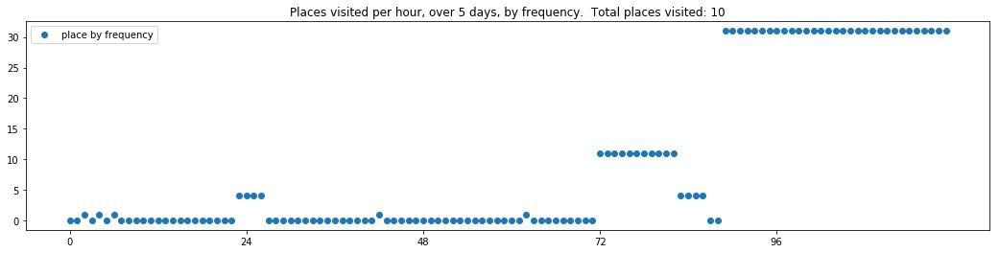


------
 40 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_40.txt 
------

----- vector ----
prefix labels:  [532, 532]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 100, 271, 471, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 208, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 0, 0, 0, 270]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 322, 322, 322, 322, 322, 322, 225, 225]


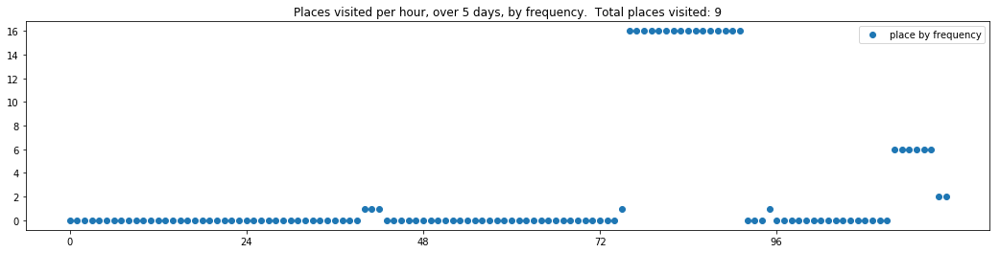

----- vector ----
prefix labels:  [4, 4]
[0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 93, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
[93, 93, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 93, 93, 4, 4, 4, 4, 4, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]


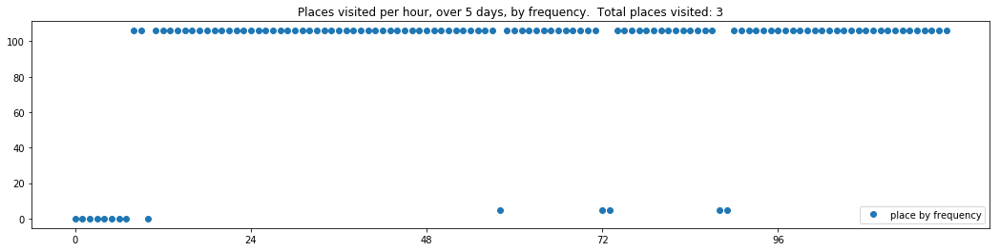

----- vector ----
prefix labels:  [333, 333]
[0, 0, 0, 333, 333, 333, 333, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 334]
[334, 0, 0, 0, 0, 0, 0, 0, 0, 0, 333, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 333, 333]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


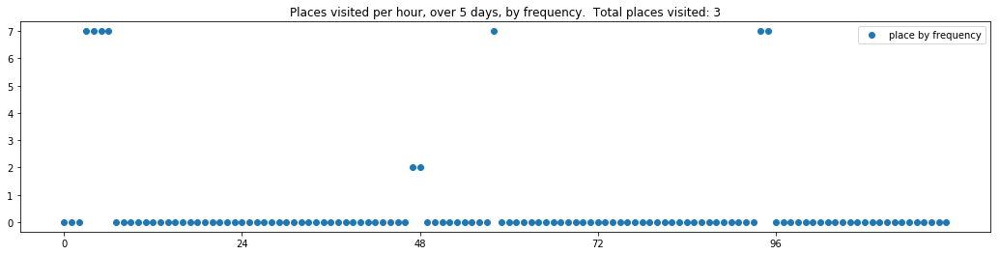

----- vector ----
prefix labels:  [99, 99]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 342, 342, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 40, 40, 40, 40, 40, 40, 40, 40, 40]
[40, 144, 74, 74, 0, 33, 0, 0, 0, 424, 424, 503, 503, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


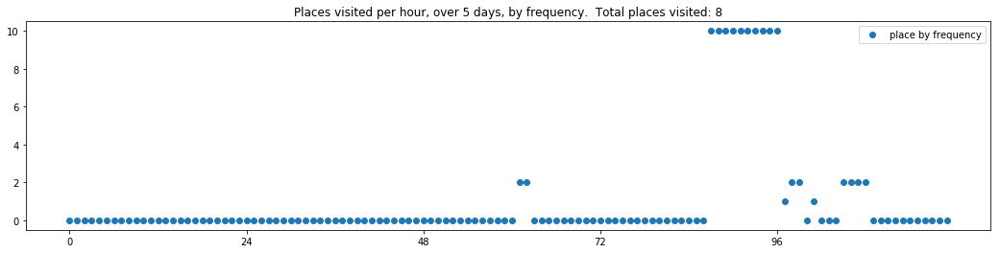

----- vector ----
prefix labels:  [93, 93]
[0, 0, 0, 0, 0, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 4, 4, 4, 93, 93, 93, 93, 93, 93]
[93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93]
[93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 542, 542, 542, 542, 542, 93, 93, 93]
[93, 93, 93, 0, 0, 515, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93]
[93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93, 93]


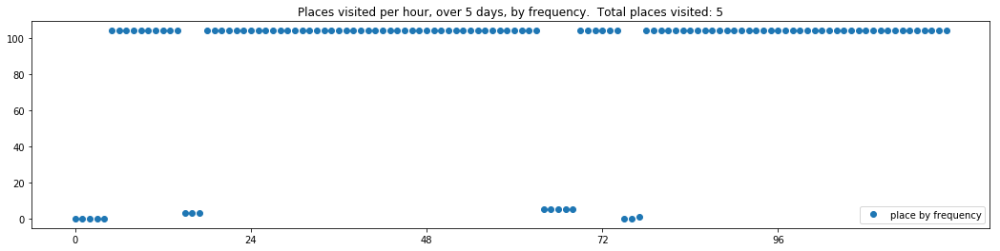

----- vector ----
prefix labels:  [369, 369]
[0, 0, 0, 0, 195, 218, 218, 545, 545, 545, 545, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 252, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 369, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


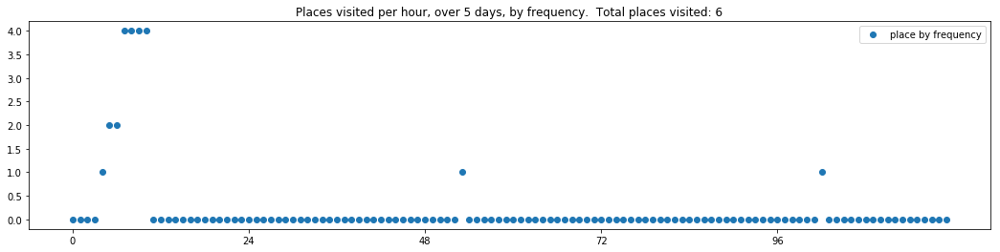

----- vector ----
prefix labels:  [498, 227]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 284, 284, 0, 0, 0, 0, 0]


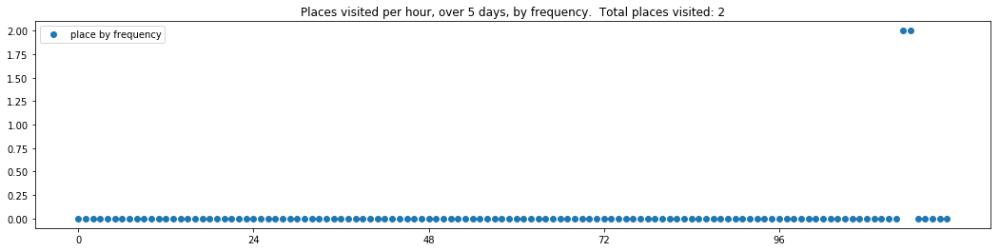

----- vector ----
prefix labels:  [134, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 439, 0, 0, 0, 0, 0, 0, 0, 0, 134, 134]
[134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134]
[134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 303, 0, 0, 0, 0, 0, 0, 0, 0]


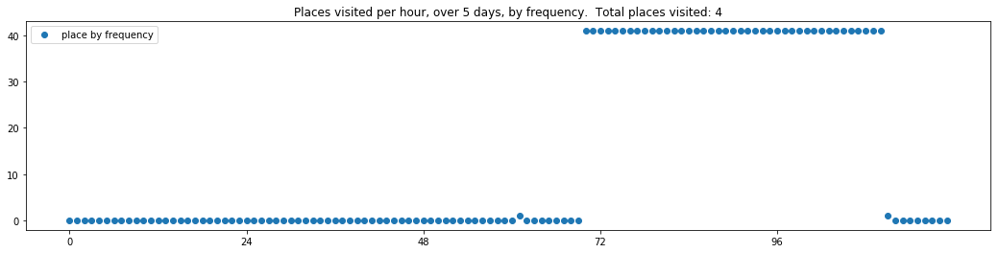

----- vector ----
prefix labels:  [563, 298]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 205, 0, 189, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 205, 205, 205, 205, 205, 205, 205, 205, 205, 205, 205, 205, 205, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 205, 205, 205, 205, 205, 563, 205, 508, 508, 508, 508, 508, 508, 508, 508]
[508, 508, 508, 508, 508, 508, 508, 508, 0, 303, 195, 195, 0, 0, 0, 0, 0, 205, 563, 563, 392, 392, 392, 341]


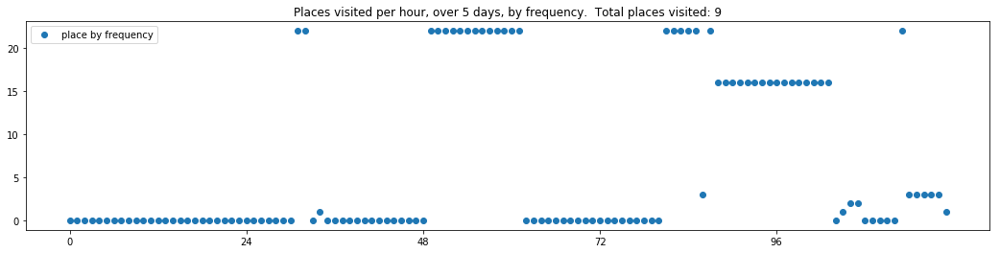

----- vector ----
prefix labels:  [11, 11]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11]
[11, 11, 11, 0, 0, 0, 0, 0, 0, 0, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285]
[285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285]
[285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 0, 0]
[0, 0, 0, 0, 0, 0, 130, 130, 0, 435, 0, 0, 0, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285]


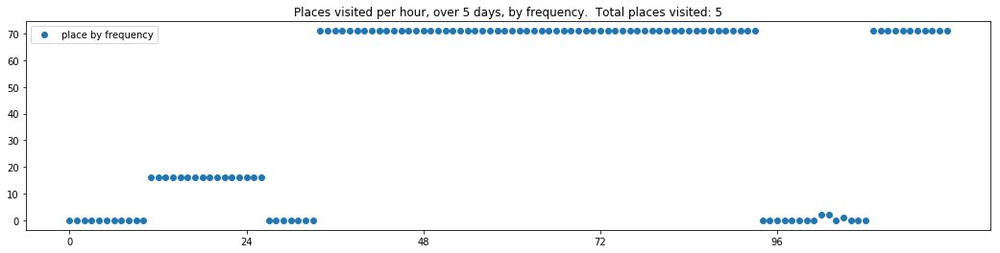


------
 45 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_45.txt 
------

----- vector ----
prefix labels:  [298, 40]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 304, 304, 195, 195, 364, 364, 364, 77, 77, 77, 77, 77, 212, 0, 0]
[0, 0, 279, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 336, 336, 336, 336, 336, 336, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 334, 222, 0, 0, 0, 0, 0, 0, 0, 0, 0]


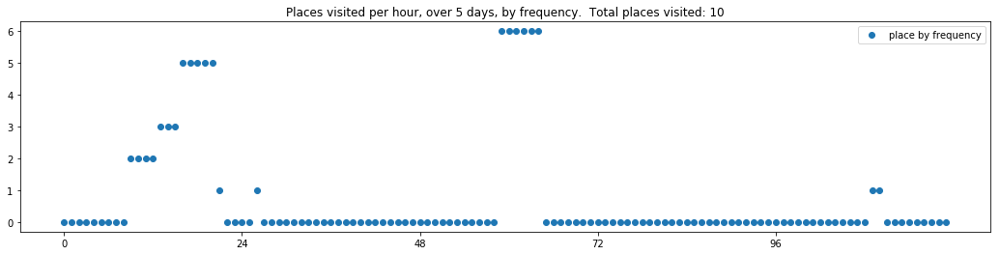

----- vector ----
prefix labels:  [26, 26]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 26, 26, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 26, 26, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 26, 0, 0, 0, 0, 0, 0, 0]


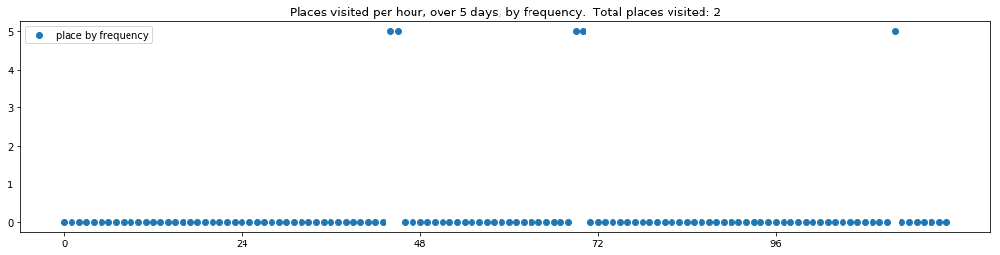

----- vector ----
prefix labels:  [296, 189]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 205, 205, 205, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 0, 0, 195, 195, 195, 195, 195]
[95, 95, 95, 95, 95, 95, 95, 4, 4, 4, 4, 4, 341, 620, 0, 453, 453, 453, 0, 184, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 296, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 130, 0, 0, 0, 0, 0, 0]


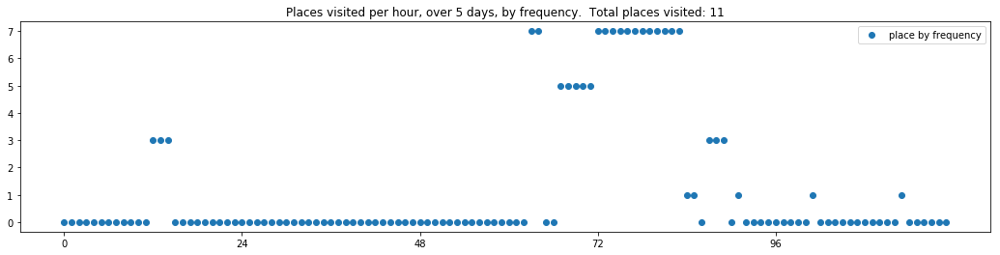

----- vector ----
prefix labels:  [420, 420]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 420, 0, 0, 0, 0, 0, 0, 420, 420, 420, 420, 420]
[420, 420, 0, 0, 0, 0, 420, 0, 0, 0, 0, 0, 0, 420, 420, 420, 420, 420, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 420, 420, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 71, 71, 71, 71, 71, 71, 71, 71, 71, 71, 71, 0, 0, 0]
[357, 267, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 414, 22, 0, 0, 0, 0, 0, 0, 0, 0]


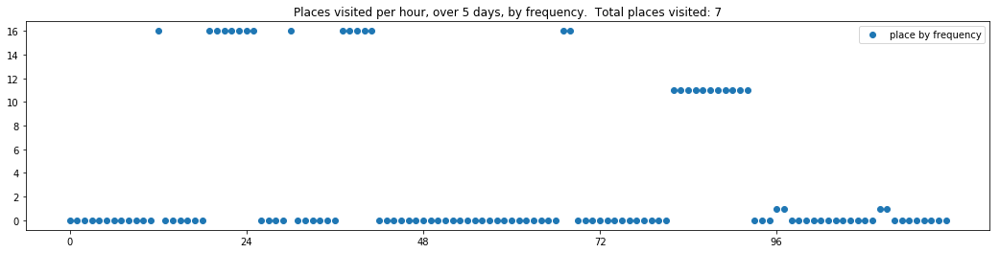

----- vector ----
prefix labels:  [448, 266]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 304, 304, 304, 304, 304]
[304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 413, 304, 304, 304, 304, 304, 304]
[304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304]
[304, 304, 304, 304, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 304, 304, 304, 0, 0, 413, 0, 413, 413]
[413, 413, 413, 413, 0, 434, 434, 434, 434, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 434]


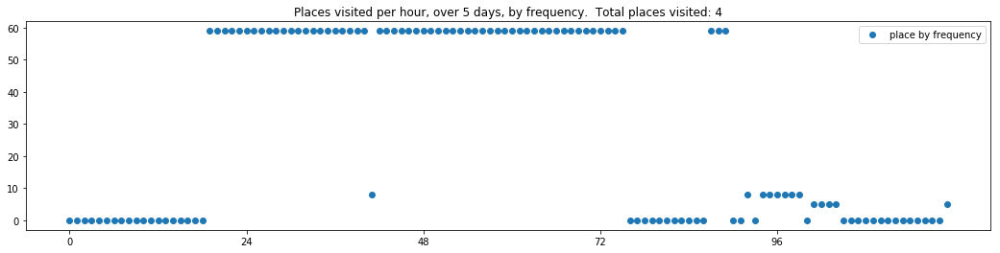

----- vector ----
prefix labels:  [423, 423]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 10, 10, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


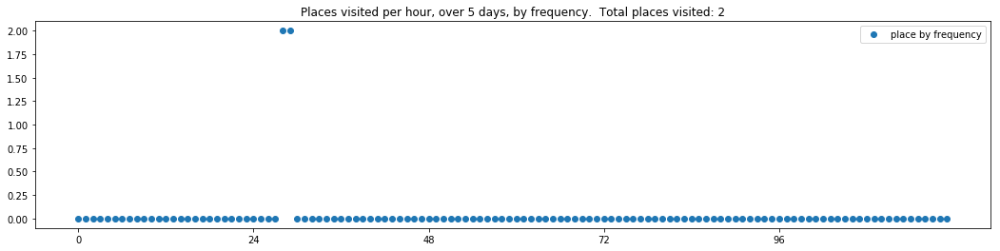

----- vector ----
prefix labels:  [391, 391]
[0, 0, 0, 0, 0, 0, 0, 0, 390, 0, 0, 0, 0, 0, 390, 102, 390, 390, 390, 0, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 390, 390, 0, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]


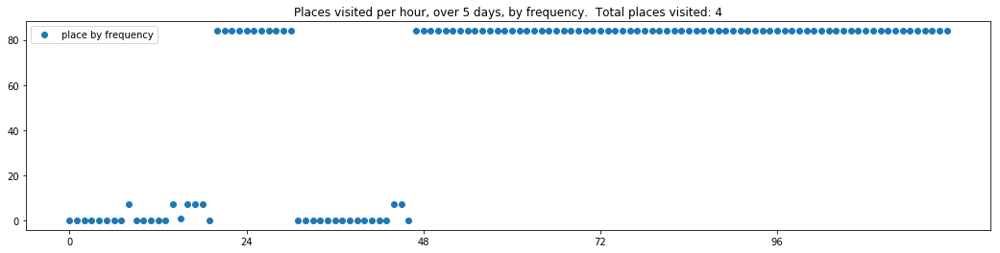

----- vector ----
prefix labels:  [227, 21]
[0, 0, 0, 144, 144, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 21, 0, 21, 0, 0, 21, 21, 21]
[0, 227, 227, 227, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0]
[0, 0, 0, 0, 0, 0, 21, 0, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0]


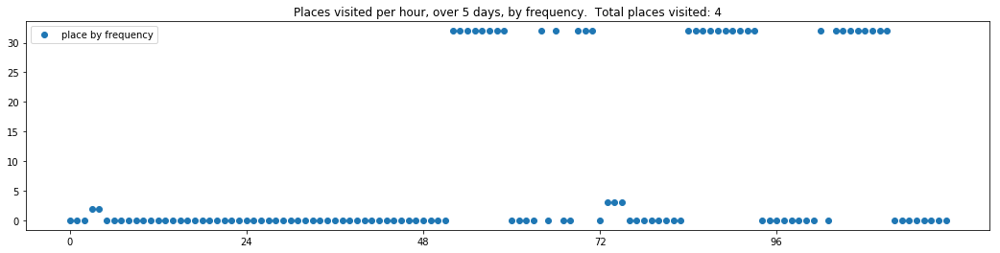

----- vector ----
prefix labels:  [161, 161]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161]
[161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161]
[161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161]
[161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161]
[161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161]


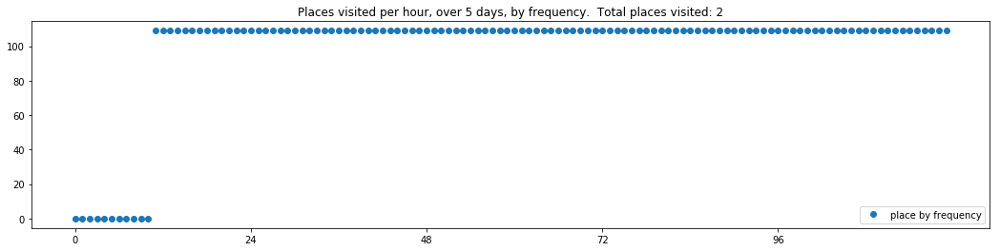

----- vector ----
prefix labels:  [32, 32]
[0, 0, 0, 0, 0, 32, 32, 32, 32, 32, 32, 32, 32, 0, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32]
[32, 32, 0, 32, 32, 32, 32, 32, 32, 32, 32, 32, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 32, 32, 32, 32, 0, 0, 0, 0, 0, 0, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32]
[32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 0, 0, 0, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32]
[32, 32, 32, 32, 32, 32, 32, 32, 32, 0, 32, 32, 32, 32, 32, 0, 32, 32, 32, 32, 32, 0, 0, 0]


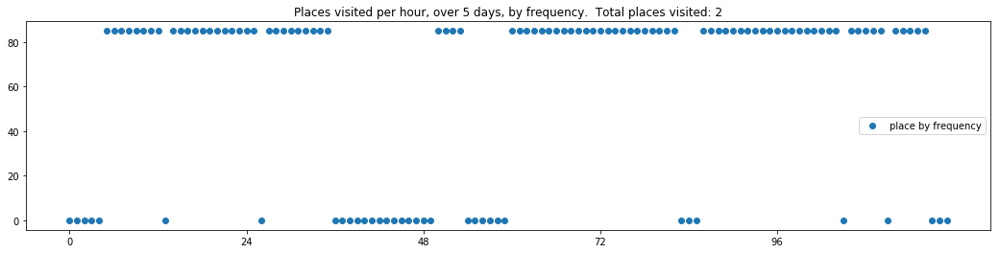


------
 50 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_50.txt 
------

----- vector ----
prefix labels:  [192, 192]
[0, 0, 0, 0, 0, 0, 0, 0, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192]
[192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192]
[192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192]
[192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192]
[192, 192, 192, 192, 192, 192, 0, 0, 0, 0, 0, 0, 0, 0, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192]


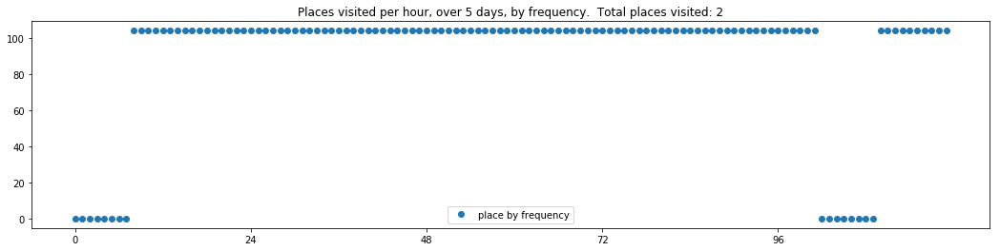

----- vector ----
prefix labels:  [8, 8]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0]


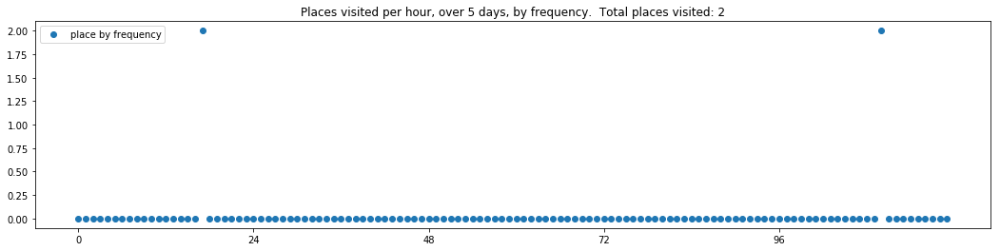

----- vector ----
prefix labels:  [320, 320]
[0, 0, 0, 0, 0, 0, 0, 0, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320]
[320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 0, 0, 0]
[0, 320, 320, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 458, 0, 0, 0, 320]
[320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320]


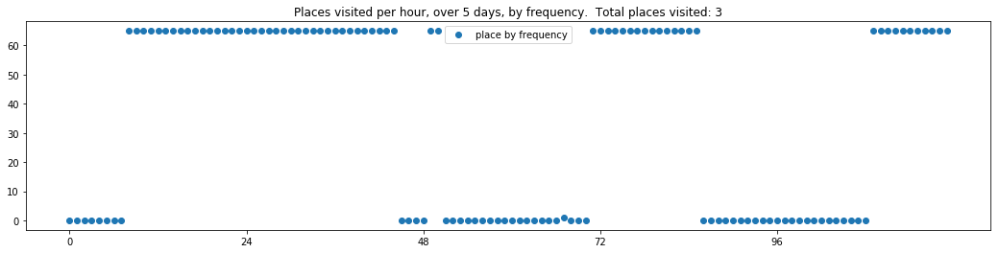

----- vector ----
prefix labels:  [507, 507]
[0, 0, 0, 0, 0, 507, 0, 0, 0, 0, 507, 507, 507, 0, 0, 0, 0, 507, 507, 507, 0, 507, 0, 0]
[0, 0, 0, 0, 507, 507, 507, 507, 507, 507, 0, 507, 507, 507, 0, 507, 0, 507, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 507, 507, 0, 0, 507, 507, 0, 507, 507, 507, 507, 507, 507, 0, 0, 0, 0, 0, 507, 0]
[507, 507, 507, 507, 507, 0, 507, 507, 507, 0, 0, 507, 507, 507, 507, 0, 0, 507, 507, 507, 507, 507, 507, 507]
[0, 507, 507, 0, 0, 507, 507, 507, 507, 507, 507, 507, 507, 507, 507, 0, 507, 507, 507, 507, 507, 0, 0, 0]


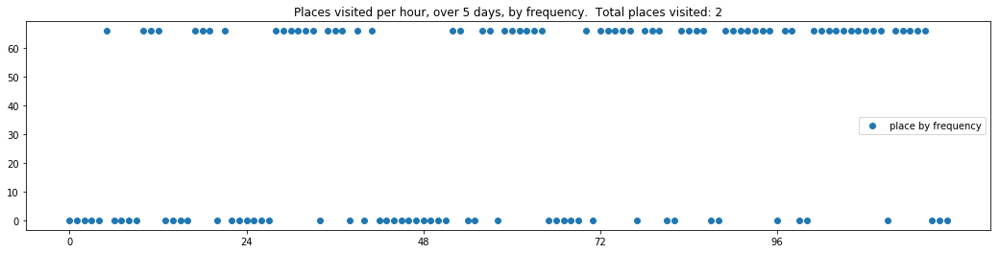

----- vector ----
prefix labels:  [123, 245]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 245, 245, 245, 245, 245, 245, 130, 130, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[199, 199, 199, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 0, 162, 0]
[0, 0, 0, 0, 357, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 52, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 133, 133, 133, 133]


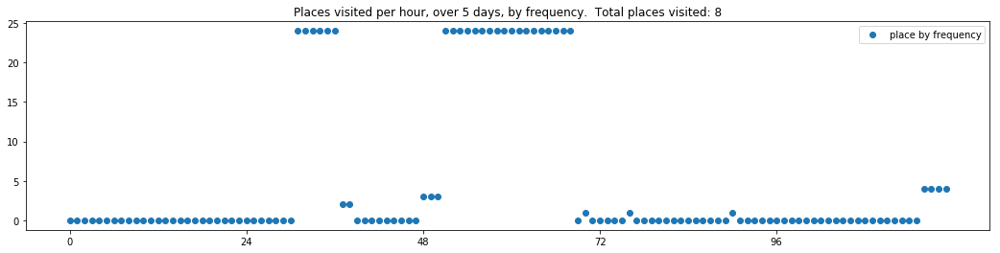

----- vector ----
prefix labels:  [227, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 193, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 388, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 239, 0, 0, 0, 0, 0, 555, 555, 555, 555, 555, 555, 555, 240, 0, 0, 0, 0, 0, 0, 0]


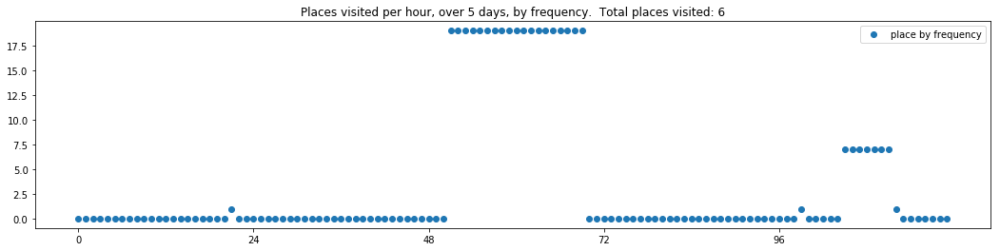

----- vector ----
prefix labels:  [167, 76]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 195, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[444, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 303, 303, 303, 303, 303, 303, 303, 134, 134, 134, 134, 134, 134]
[134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 0, 0, 0, 0, 0, 0, 0, 0, 0, 134, 134, 134, 134, 134]
[134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134, 134]


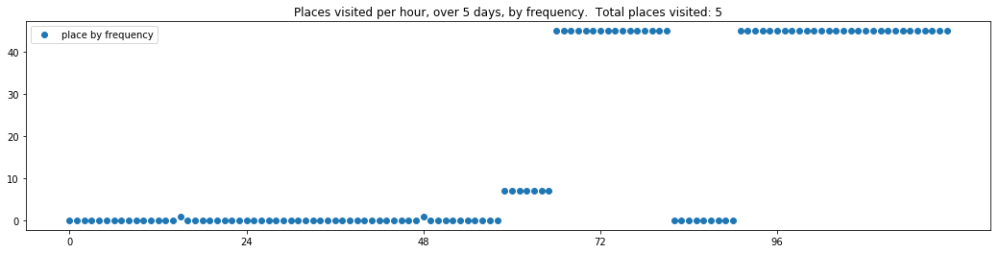

----- vector ----
prefix labels:  [140, 140]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[140, 140, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 140, 0]


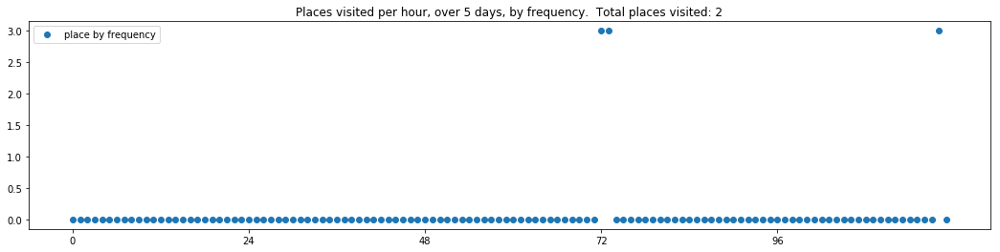

----- vector ----
prefix labels:  [4, 4]
[0, 0, 0, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 0, 4, 4, 4, 4]
[4, 4, 4, 4, 4, 0, 0, 0, 0, 0, 4, 4, 4, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 0, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


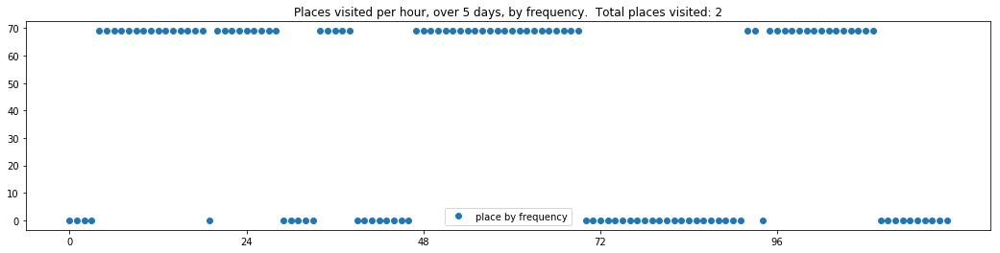

----- vector ----
prefix labels:  [21, 21]
[0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 41, 41, 388, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[21, 0, 0, 0, 551, 551, 551, 551, 551, 551, 551, 551, 551, 551, 551, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 21]
[21, 21, 0, 21, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 388, 388, 149, 21, 21]


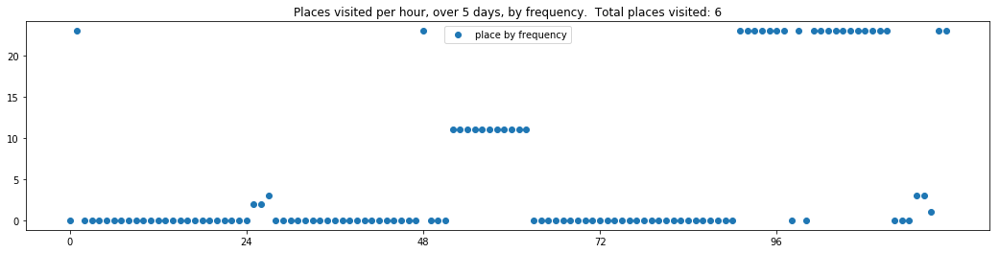


------
 55 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_55.txt 
------

----- vector ----
prefix labels:  [8, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 591, 591]
[591, 591, 591, 591, 0, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]


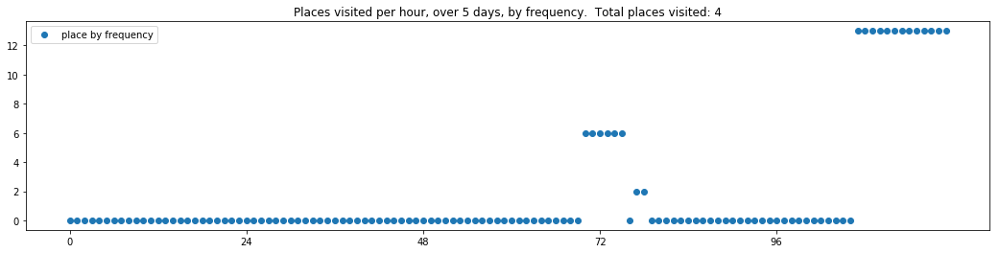

----- vector ----
prefix labels:  [349, 349]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 349, 423, 349, 349, 349, 349, 349, 349]
[349, 349, 349, 349, 349, 349, 349, 349, 349, 349, 349, 349, 349, 349, 349, 349, 349, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 424, 424, 424, 424, 0, 0, 0, 0, 0, 0, 0, 423, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 423, 423, 423, 423, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57]


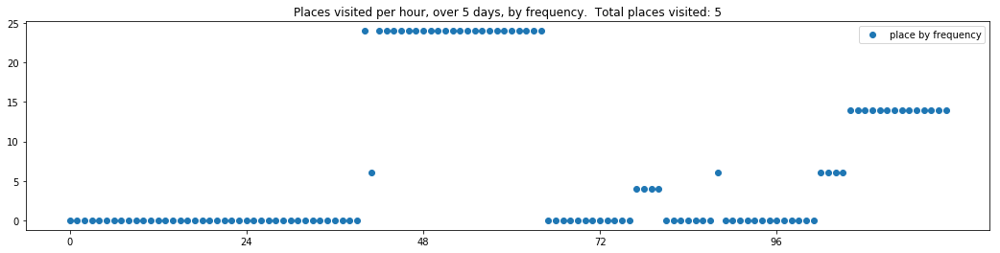

----- vector ----
prefix labels:  [286, 0]
[0, 0, 0, 0, 0, 286, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 46, 46, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 94, 94, 94, 94, 94, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


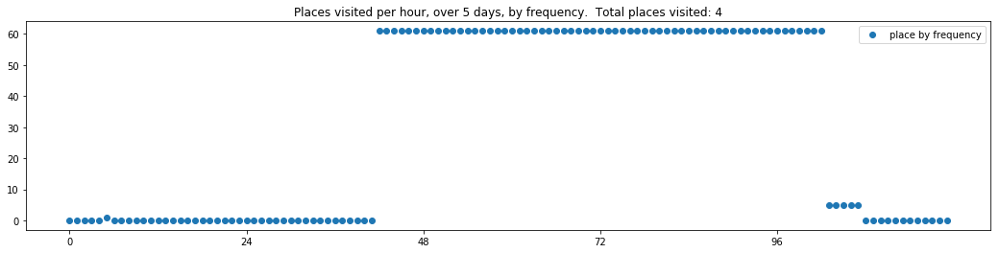

----- vector ----
prefix labels:  [439, 439]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 439, 439, 439, 439, 439, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[439, 439, 439, 439, 439, 439, 439, 439, 439, 0, 0, 0, 0, 0, 0, 439, 439, 0, 385, 385, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 439, 439, 439, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


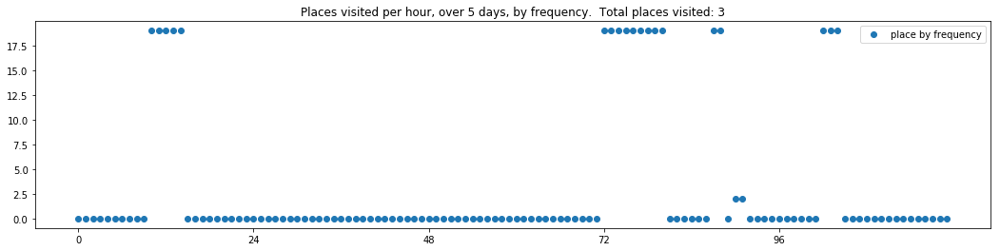

----- vector ----
prefix labels:  [21, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 0, 0, 0, 0, 0]
[0, 0, 0, 21, 0, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[72, 72, 72, 72, 72, 72, 72, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


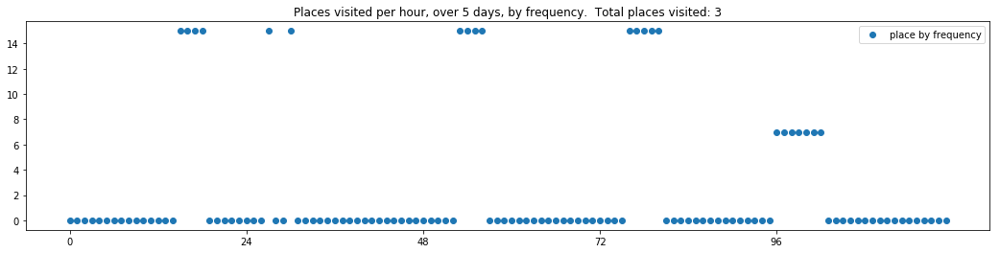

----- vector ----
prefix labels:  [246, 246]
[0, 0, 0, 0, 0, 0, 0, 0, 246, 246, 246, 246, 246, 246, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 246, 246, 246, 246, 246, 246, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246]
[246, 246, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 246]
[246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246]


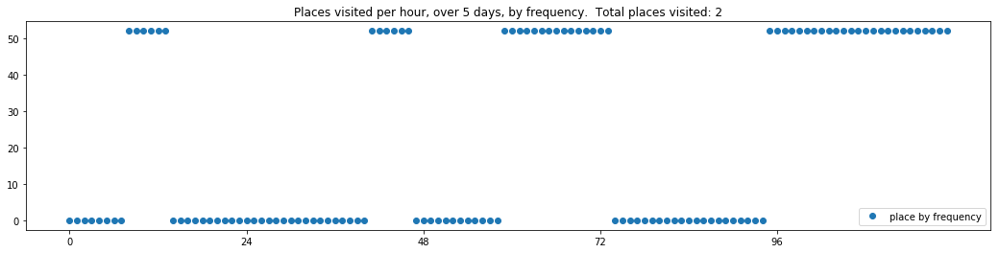

----- vector ----
prefix labels:  [142, 142]
[0, 0, 0, 0, 0, 0, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142]
[142, 142, 142, 142, 142, 142, 142, 142, 0, 0, 0, 0, 0, 0, 0, 142, 142, 142, 0, 0, 0, 0, 0, 0]
[0, 0, 142, 142, 142, 142, 142, 142, 142, 142, 142, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 142]
[142, 0, 142, 142, 142, 142, 142, 142, 142, 142, 142, 0, 0, 0, 0, 0, 0, 21, 0, 0, 0, 0, 0, 0]
[0, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 0, 0, 0, 0]


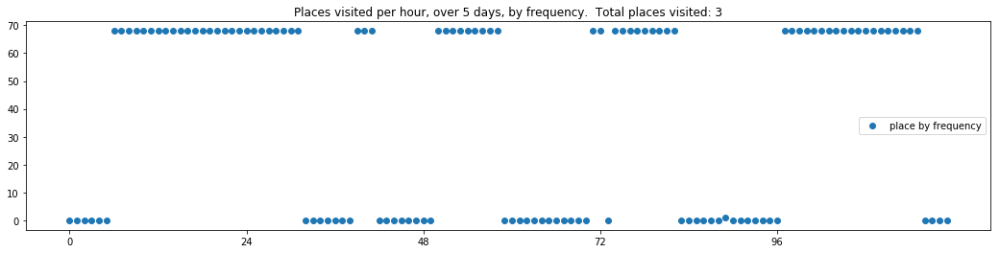

----- vector ----
prefix labels:  [612, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 0, 0, 0]
[21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 21, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21]
[21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 0, 21, 21, 21, 0, 0, 21, 21, 21, 21]
[21, 21, 21, 21, 21, 21, 21, 0, 21, 21, 0, 0, 0, 0, 4, 4, 4, 4, 0, 0, 0, 0, 0, 0]


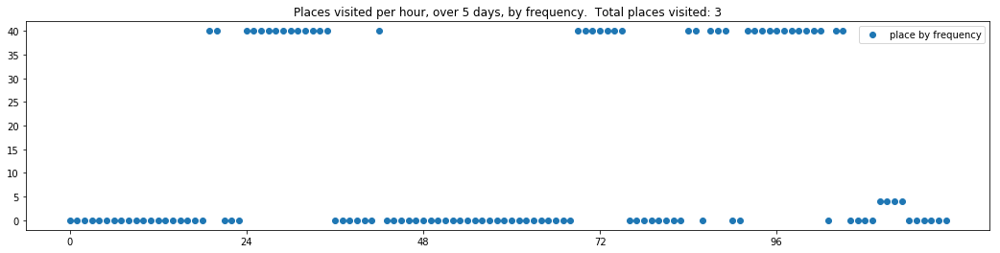

----- vector ----
prefix labels:  [391, 391]
[0, 0, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 0, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 311, 311, 311, 311, 391, 391, 391, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]


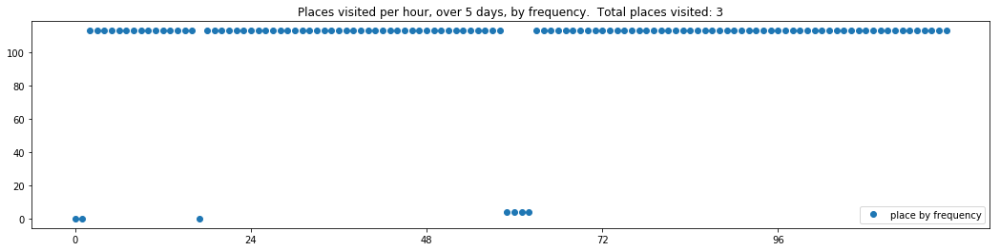

----- vector ----
prefix labels:  [341, 341]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 341, 341, 341, 341, 341, 341, 341, 341, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 341, 341, 341, 341, 341, 341, 341]
[341, 341, 341, 341, 341, 341, 341, 341, 463, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 0, 0, 434, 434, 434, 434, 434, 434, 434, 434, 434]
[434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434, 434]


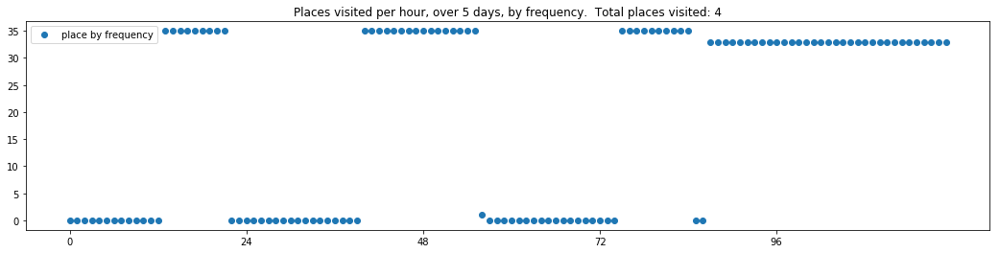


------
 60 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_60.txt 
------

----- vector ----
prefix labels:  [108, 108]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 562, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


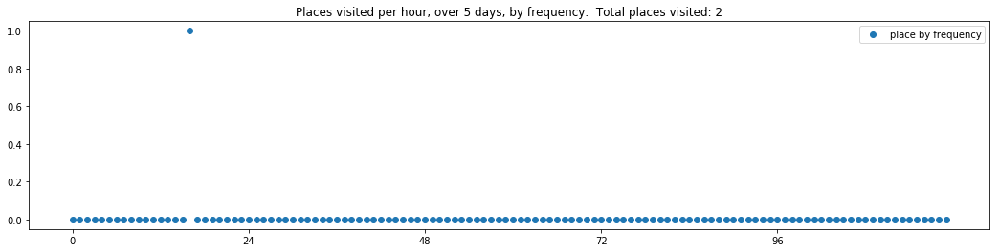

----- vector ----
prefix labels:  [312, 573]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 573]
[573, 573, 573, 0, 0, 0, 0, 0, 0, 194, 573, 573, 573, 0, 464, 269, 269, 0, 0, 0, 0, 168, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 84, 84, 0, 311, 311, 311, 311, 311, 311, 311]


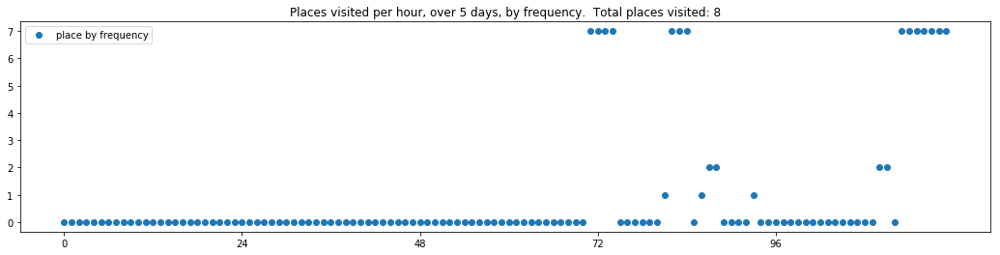

----- vector ----
prefix labels:  [526, 400]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 400, 0, 0, 0, 456, 526, 400, 400, 0, 254, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 209, 0, 0, 0, 0]
[0, 0, 0, 319, 319, 319, 319, 0, 0, 0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271]
[0, 0, 0, 0, 162, 162, 162, 162, 162, 162, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 0, 0, 0, 0, 0]


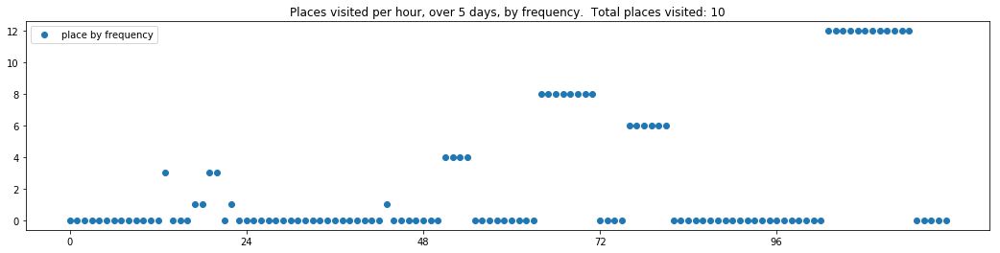

----- vector ----
prefix labels:  [23, 487]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 120, 0, 0, 487, 567, 567, 0, 567]
[567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 0, 0, 23, 567, 567, 567, 487, 487]
[487, 487, 487, 487, 487, 0, 23, 487, 23, 487, 487, 487, 487, 487, 487, 0, 0, 0, 23, 567, 567, 567, 567, 567]
[567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567]
[567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 567, 23, 487, 487, 487]


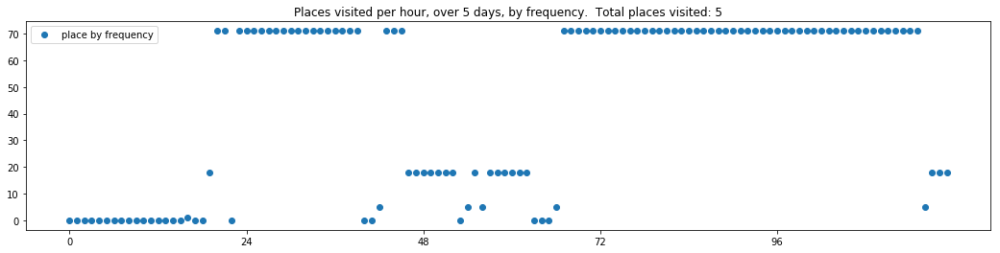

----- vector ----
prefix labels:  [2, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 335, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


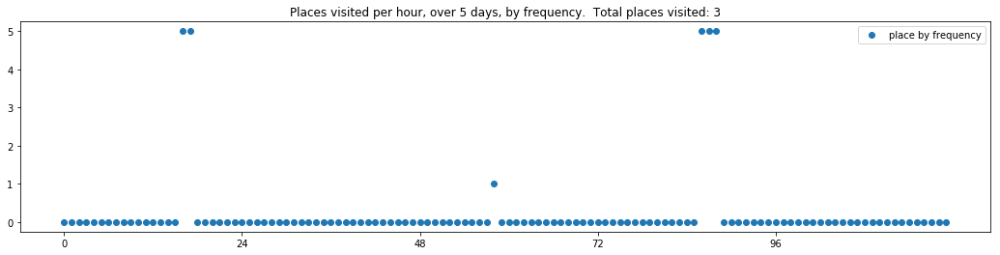

----- vector ----
prefix labels:  [439, 439]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 439, 439, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 439, 0]
[0, 0, 439, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 439, 439, 439, 439, 0, 0, 0, 439, 439, 439, 439]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


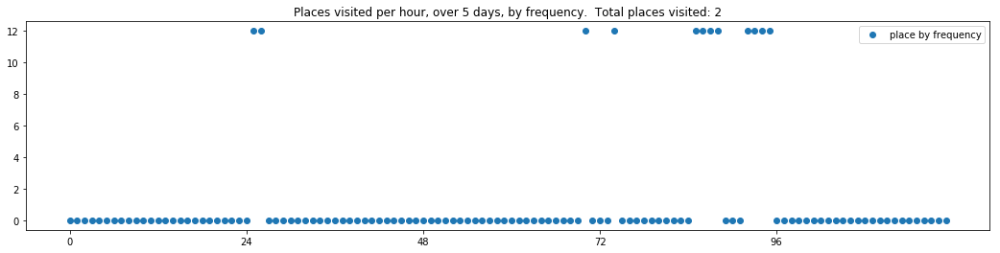

----- vector ----
prefix labels:  [162, 235]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


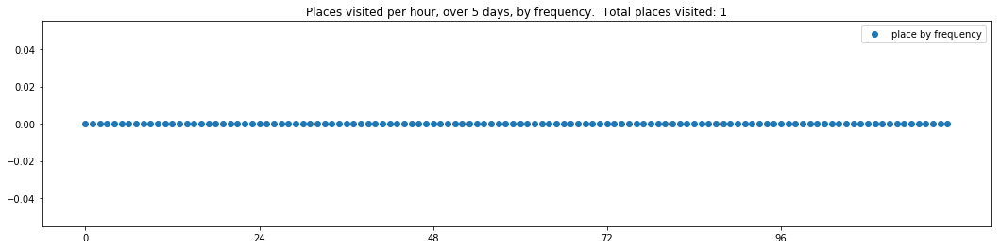

----- vector ----
prefix labels:  [102, 588]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 165, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 165, 390, 390, 390, 390, 0, 0, 0, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 390, 390, 390]
[390, 390, 0, 390, 522, 522, 522, 522, 0, 611, 611, 0, 0, 390, 390, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 68, 0, 0, 0, 0, 0, 0, 0, 0, 453, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]


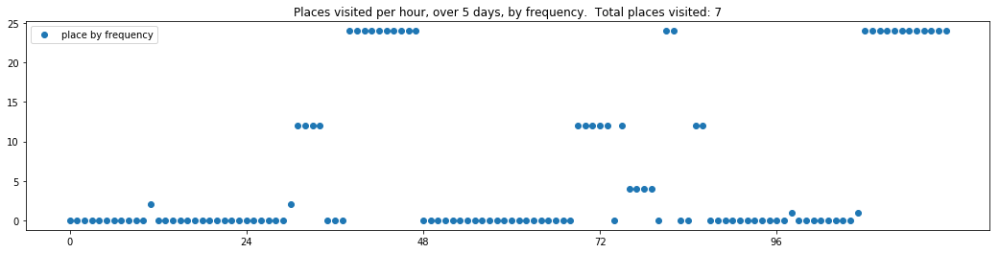

----- vector ----
prefix labels:  [588, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 588, 0, 0, 0, 0, 0, 0, 22, 22, 22, 22, 22]
[22, 22, 22, 0, 0, 98, 0, 0, 588, 588, 588, 588, 0, 0, 0, 0, 588, 588, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390]


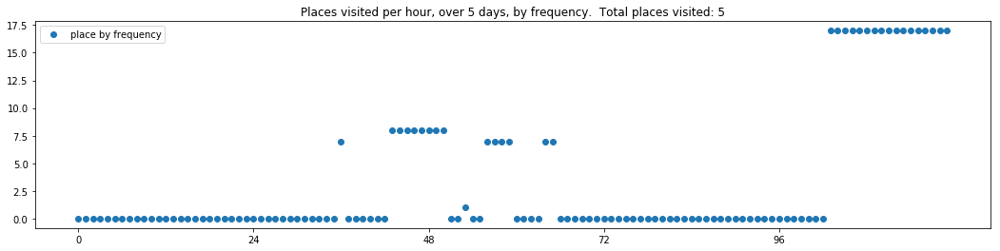

----- vector ----
prefix labels:  [87, 87]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[87, 87, 0, 87, 87, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 146, 146, 94, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 542, 0, 0, 0, 0]


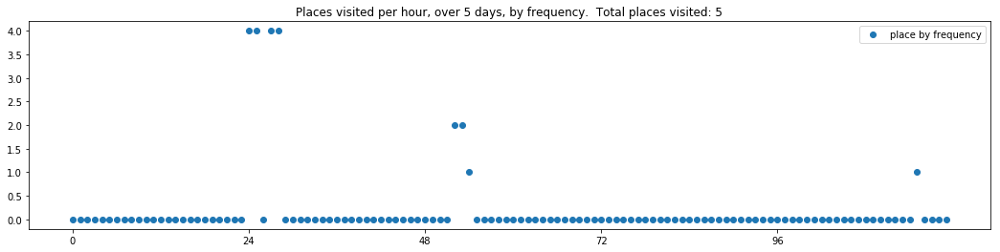


------
 65 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_65.txt 
------

----- vector ----
prefix labels:  [31, 31]
[0, 0, 0, 0, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31]
[31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31]
[31, 31, 31, 31, 31, 31, 0, 0, 447, 0, 0, 0, 0, 0, 0, 0, 0, 31, 31, 31, 31, 31, 0, 0]
[0, 0, 0, 0, 0, 0, 516, 204, 204, 204, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31]
[0, 0, 119, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 31, 31, 31, 31, 31, 31, 31, 31, 31]


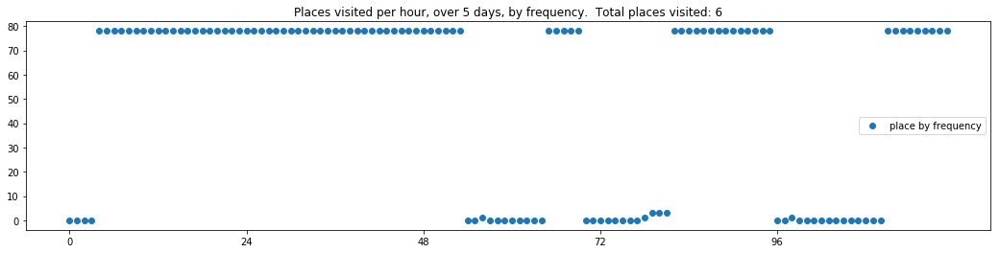

----- vector ----
prefix labels:  [386, 386]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 386, 386, 386, 386, 386, 386, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 386, 386, 386, 386, 76, 76, 386, 386, 386, 386, 386, 386, 386, 386, 386, 386]
[386, 386, 386, 0, 0, 0, 0, 478, 451, 0, 0, 0, 0, 0, 0, 478, 478, 478, 0, 478, 478, 478, 478, 478]
[478, 0, 0, 0, 340, 0, 0, 0, 0, 0, 0, 0, 0, 0, 451, 171, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 478, 478, 0, 0, 21, 21, 0, 231, 0, 478, 478, 478, 478]


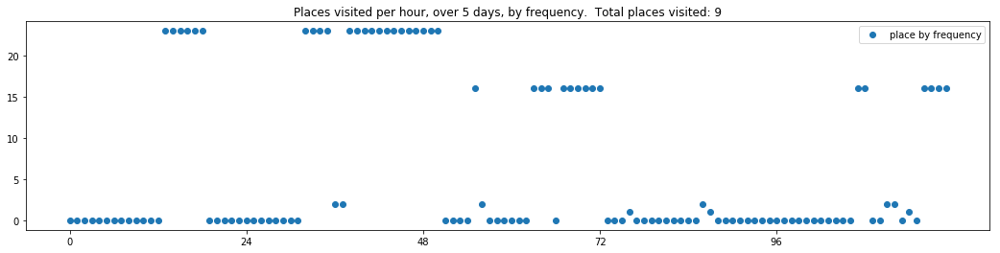

----- vector ----
prefix labels:  [314, 314]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 320, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 19, 0, 165, 314, 314, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 314, 0, 0, 0, 0, 0, 314, 314, 0, 0, 0, 0, 0, 0, 0, 0, 0]


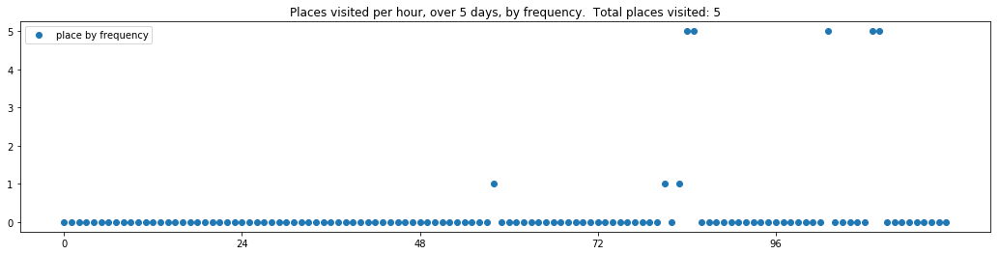

----- vector ----
prefix labels:  [260, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 260, 260, 260, 260, 260, 260, 260]
[260, 260, 260, 260, 260, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 260, 260, 260, 260]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 260, 260, 260, 260, 260, 260, 260, 260, 260]


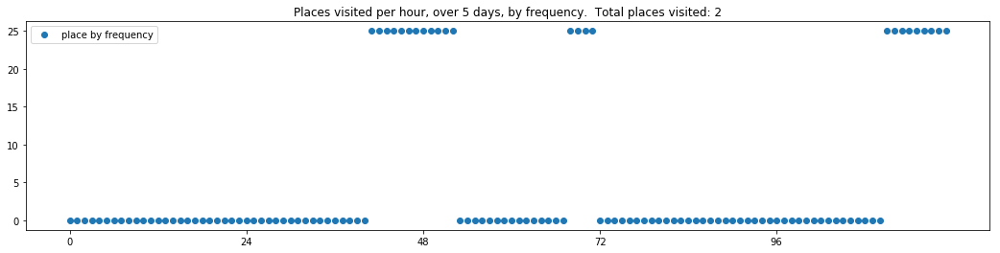

----- vector ----
prefix labels:  [314, 304]
[0, 0, 0, 0, 0, 0, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304]
[304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304]
[304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 311]
[311, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 304, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 313, 304, 304, 304, 304, 304]


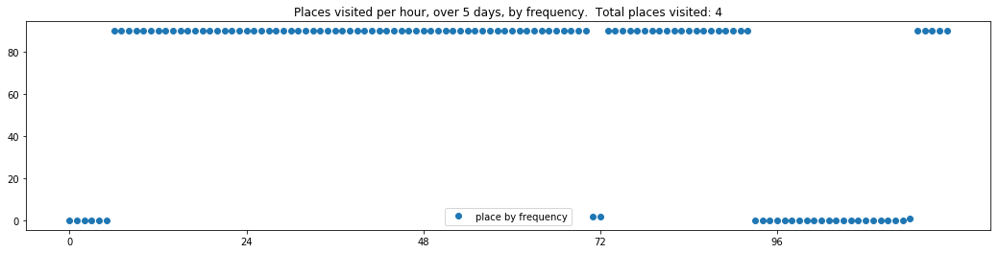

----- vector ----
prefix labels:  [282, 145]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 282, 282, 282, 282, 282, 282, 282]
[282, 282, 282, 282, 282, 282, 282, 282, 282, 282, 282, 282, 282, 282, 282, 282, 267, 56, 56, 56, 282, 282, 282, 282]
[282, 282, 282, 282, 162, 435, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 282, 282, 282, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 486, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


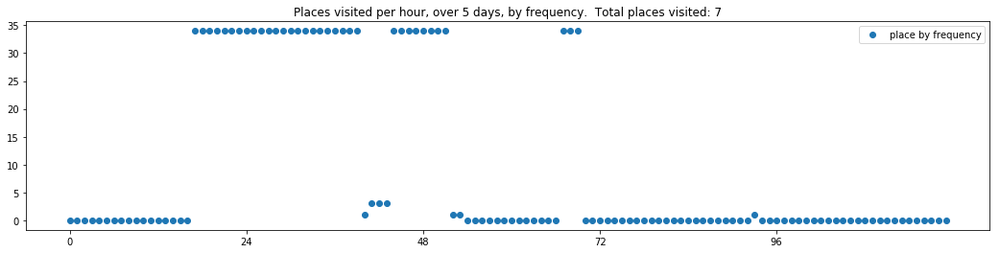

----- vector ----
prefix labels:  [611, 611]
[0, 0, 0, 0, 0, 0, 0, 0, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 0]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]


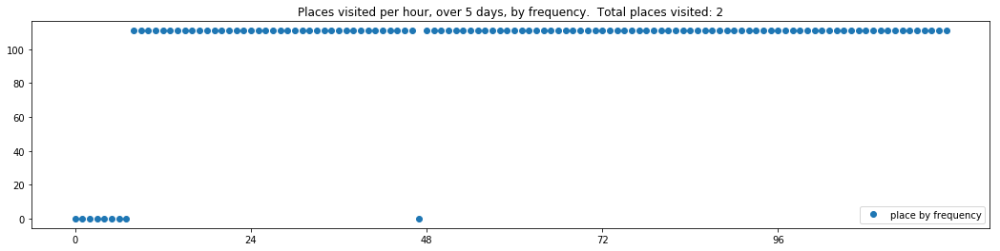

----- vector ----
prefix labels:  [34, 69]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 69, 0, 0, 0, 0, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34]
[34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34]
[34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34]
[34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 151]
[151, 0, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 0, 34, 34, 34, 34, 34, 34, 34, 34, 34]


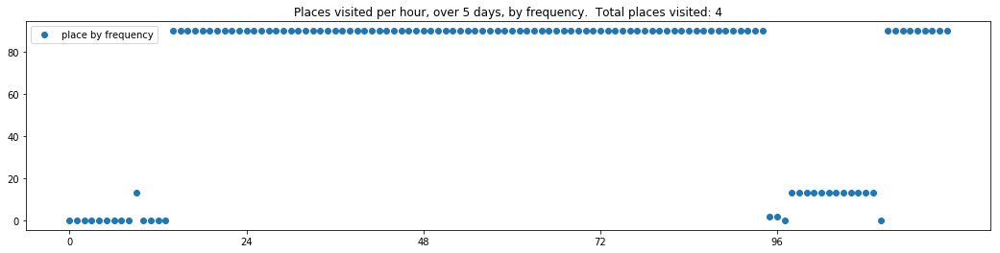

----- vector ----
prefix labels:  [83, 2]
[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 239, 0, 239, 239, 239, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 239, 239, 226, 357, 357, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 271]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 239, 239, 239, 0, 0, 0, 0, 0, 0, 0]


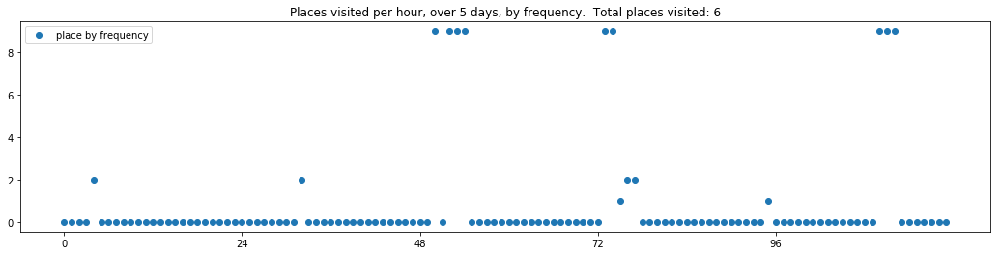

----- vector ----
prefix labels:  [384, 384]
[0, 0, 0, 0, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384]
[384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384]
[384, 384, 384, 384, 384, 384, 384, 384, 384, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 384, 384, 384, 384]
[384, 384, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


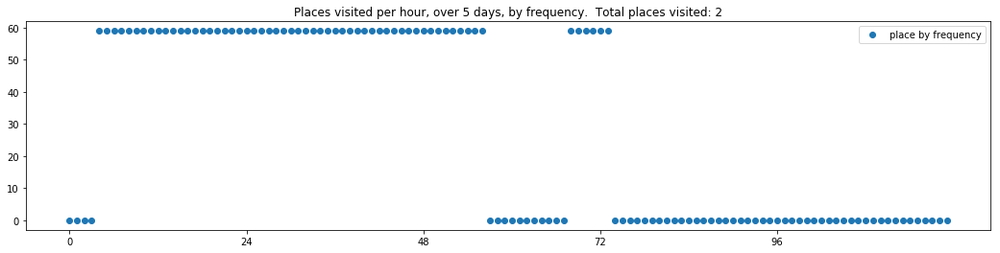


------
 70 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_70.txt 
------

----- vector ----
prefix labels:  [181, 76]
[0, 644, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 439, 439, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 212, 212, 212]
[212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212]
[212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212]


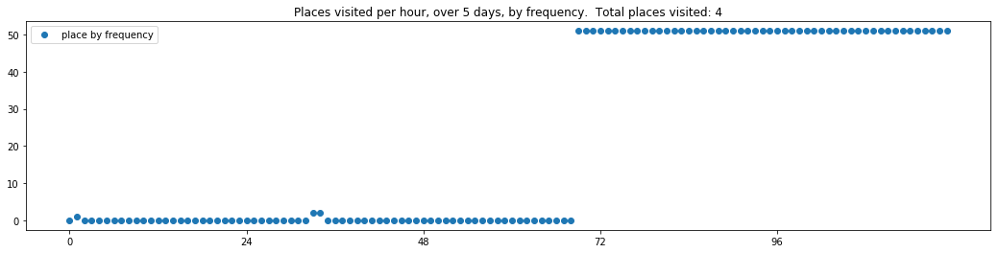

----- vector ----
prefix labels:  [184, 184]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 184, 184, 184, 184, 184, 184, 0, 0, 0, 0, 0, 0, 0, 0, 0, 184]
[184, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


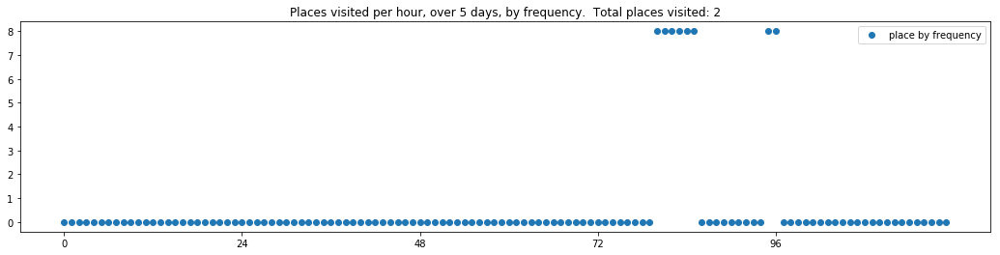

----- vector ----
prefix labels:  [328, 328]
[0, 0, 0, 0, 0, 0, 0, 0, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 0, 328]
[328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 0, 328]
[328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328]
[328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328]
[328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


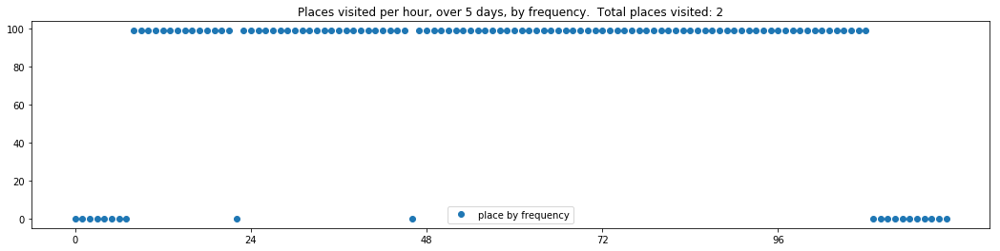

----- vector ----
prefix labels:  [50, 50]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 183, 20, 20, 20, 20, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 396, 396, 396, 396, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


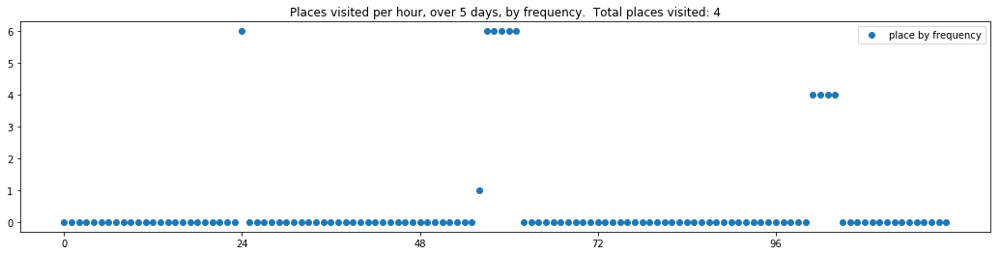

----- vector ----
prefix labels:  [65, 65]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65]
[65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 22, 22, 22]
[22, 22, 22, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 0, 65, 65, 65, 65, 65, 65]
[65, 65, 65, 22, 0, 22, 65, 65, 22, 65, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65]


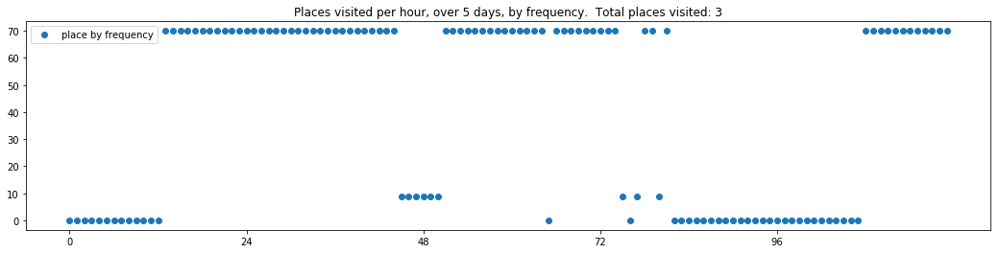

----- vector ----
prefix labels:  [611, 611]
[0, 0, 0, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]
[611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611, 611]


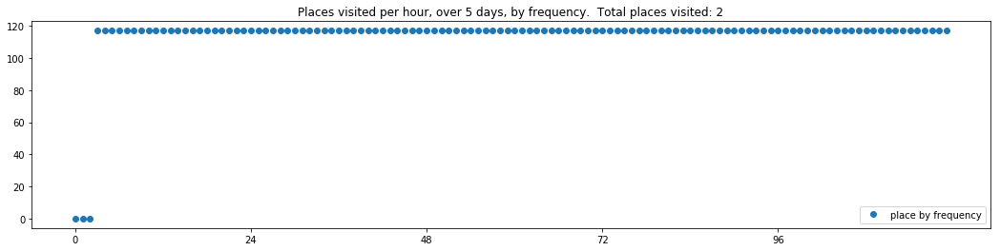

----- vector ----
prefix labels:  [133, 133]
[478, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
[69, 69, 69, 69, 69, 0, 0, 0, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
[144, 144, 144, 144, 144, 144, 0, 0, 69, 69, 0, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
[69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 0, 0, 0, 0, 0, 0, 372, 0, 0, 0, 0, 0]
[144, 144, 144, 144, 0, 0, 0, 0, 69, 0, 241, 0, 1, 7, 0, 0, 0, 0, 0, 0, 39, 323, 323, 323]


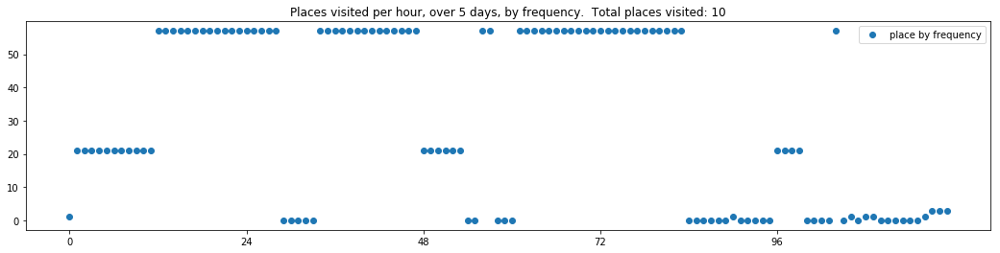

----- vector ----
prefix labels:  [87, 69]
[0, 0, 0, 0, 0, 55, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 69]
[0, 0, 0, 0, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 0, 0, 0, 69, 69, 69, 69]
[0, 0, 0, 0, 0, 0, 69, 69, 0, 0, 410, 0, 0, 0, 69, 69, 69, 69, 69, 69, 87, 87, 87, 87]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


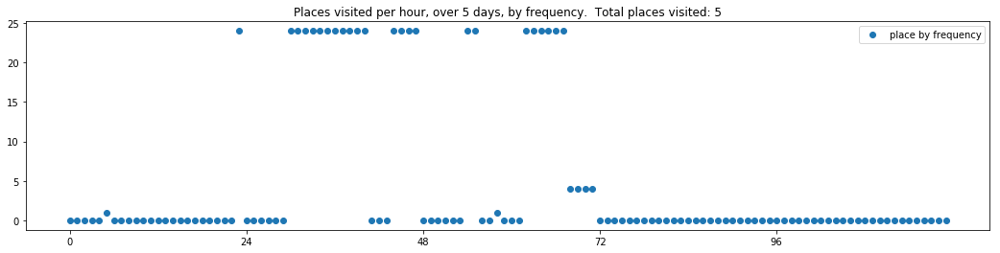

----- vector ----
prefix labels:  [533, 0]
[0, 0, 0, 0, 533, 533, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533, 533]
[533, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


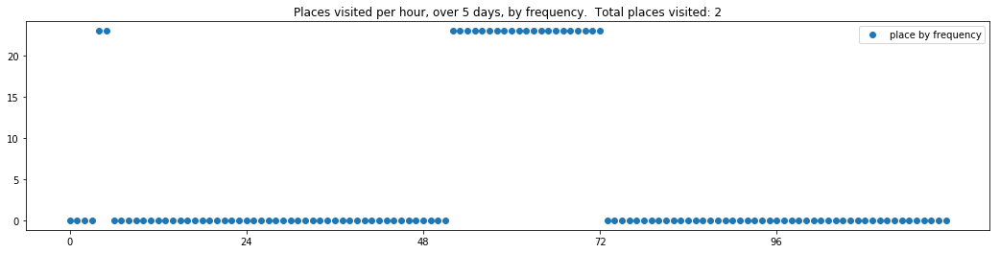

----- vector ----
prefix labels:  [334, 334]
[334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334]
[334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334]
[334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334]
[334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334]
[334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334]


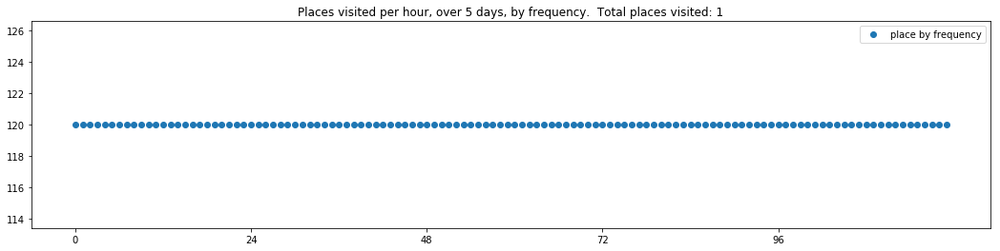


------
 75 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_75.txt 
------

----- vector ----
prefix labels:  [590, 415]
[0, 0, 328, 328, 328, 328, 328, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107]
[107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415]
[415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 0, 0, 0, 0, 328, 453]
[0, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 0, 415, 415, 415, 415, 415, 415, 415, 415]
[415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415, 415]


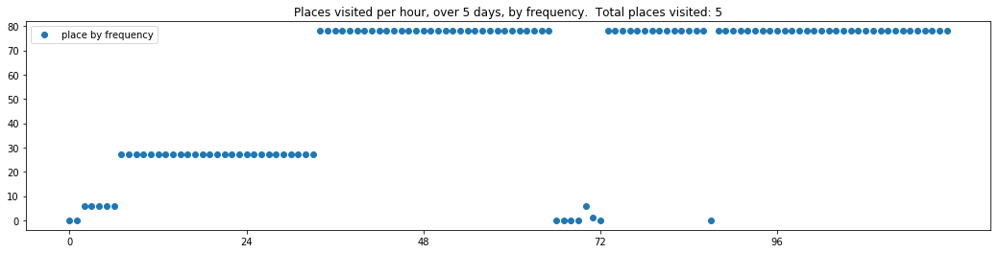

----- vector ----
prefix labels:  [427, 427]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 427, 427, 427, 0, 0, 0, 0, 0, 0, 0, 0, 427, 427, 427, 427, 427, 427, 427, 427, 427, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 427, 284, 284, 284, 284, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 239, 239, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


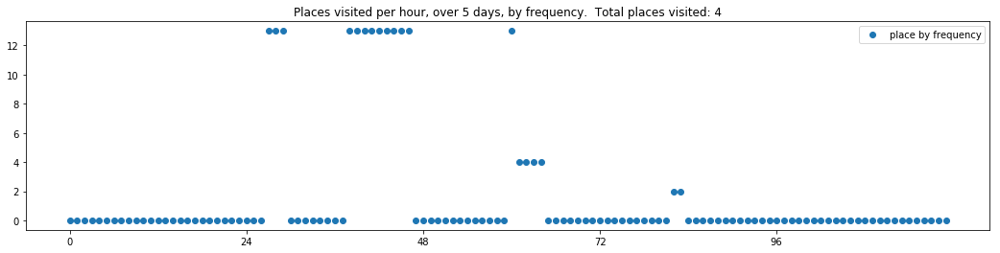

----- vector ----
prefix labels:  [97, 97]
[0, 0, 0, 0, 0, 410, 410, 410, 410, 410, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545]
[545, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97]
[97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 0, 0, 0, 0, 0, 0, 0, 644, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 224, 0, 0, 0, 0, 0, 147, 147, 147, 147, 147, 147, 147, 147, 147, 147, 147, 147, 147]


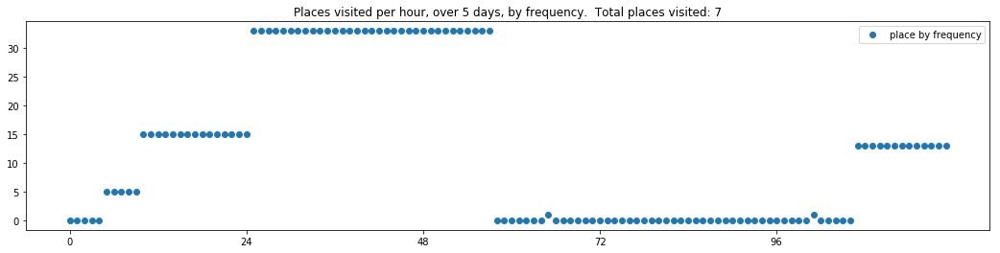

----- vector ----
prefix labels:  [437, 437]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437, 437, 437, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 437, 437, 437, 437, 437, 437, 0, 0, 0, 0, 0, 0, 0, 437, 437, 437, 437, 437]
[437, 437, 437, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437, 437]


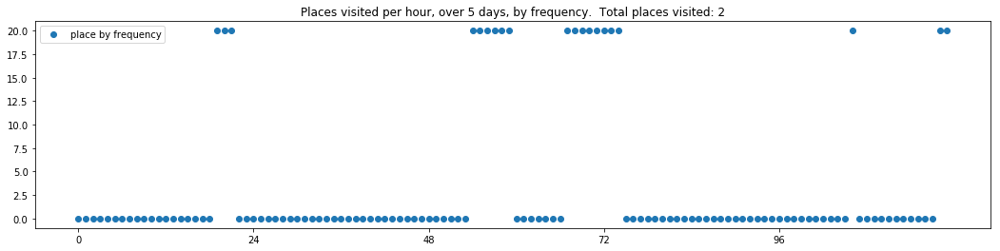

----- vector ----
prefix labels:  [515, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 32, 32, 32, 32, 32, 32, 32, 32, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 164]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 214, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[637, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 0, 278, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278, 278]


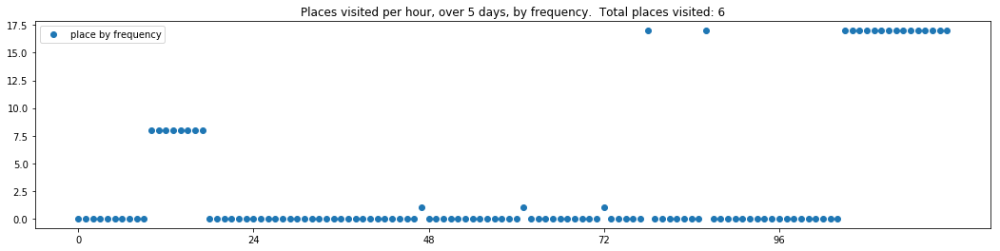

----- vector ----
prefix labels:  [637, 637]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 544, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 544, 544, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 38, 38, 38, 38, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


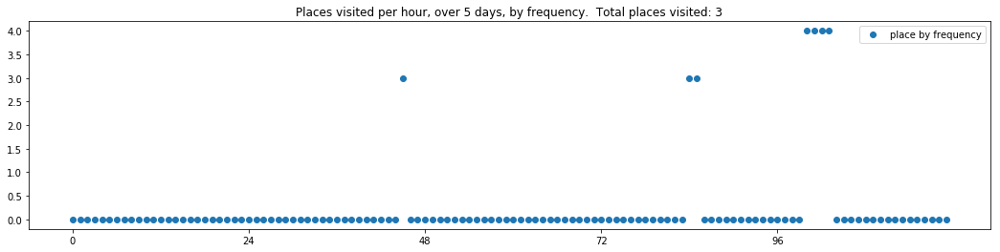

----- vector ----
prefix labels:  [404, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


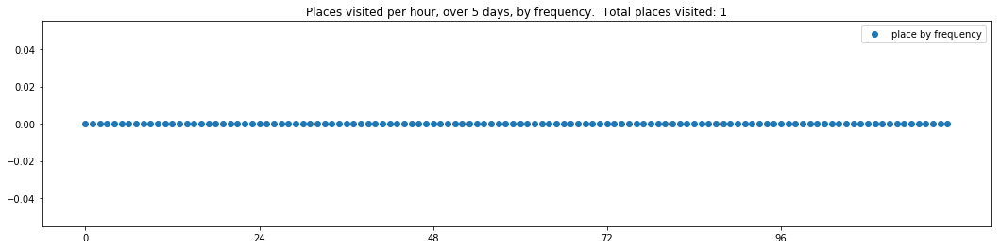

----- vector ----
prefix labels:  [392, 392]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 0, 0, 0]
[0, 0, 0, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]
[392, 392, 392, 392, 392, 392, 392, 392, 392, 0, 0, 0, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]
[392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]


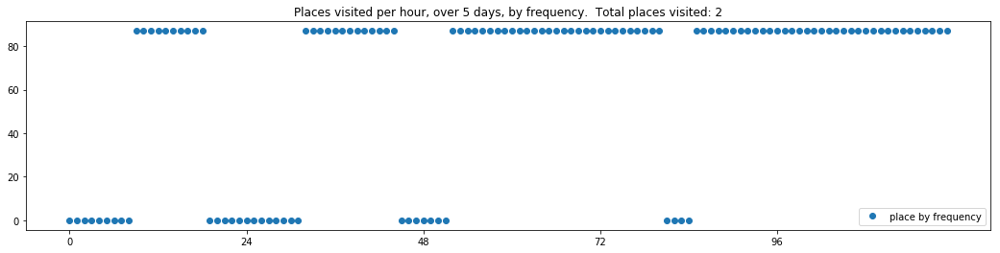

----- vector ----
prefix labels:  [11, 11]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21]
[0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 71, 21, 21, 21, 21, 21, 21]
[21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21]
[11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11]
[11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11]


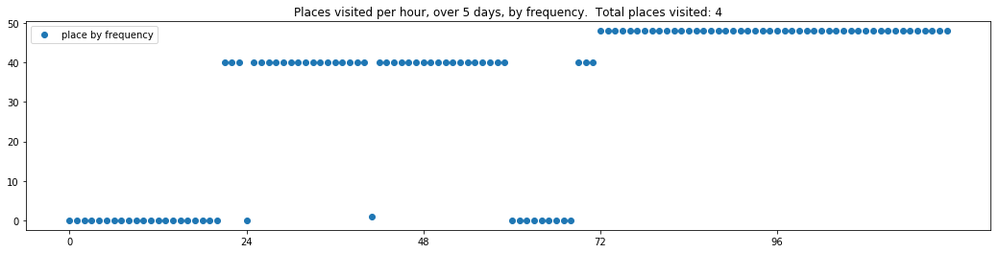

----- vector ----
prefix labels:  [341, 462]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 194, 0, 0, 0, 0, 341, 341, 341, 341, 341, 311, 311, 311]
[311, 311, 0, 0, 0, 0, 0, 0, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 0, 341, 311, 311, 311, 311]
[0, 341, 341, 341, 341, 311, 311, 311, 311, 311, 311, 311, 311, 0, 0, 0, 0, 0, 341, 341, 0, 194, 194, 341]
[0, 19, 56, 56, 56, 56, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 462]
[462, 462, 462, 462, 462, 462, 522, 522, 390, 390, 390, 390, 390, 390, 390, 341, 341, 341, 311, 311, 507, 507, 507, 311]


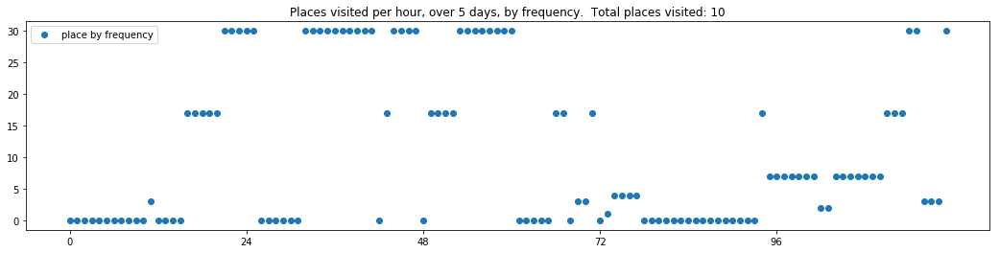


------
 80 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_80.txt 
------

----- vector ----
prefix labels:  [152, 353]
[0, 0, 0, 0, 0, 0, 0, 0, 130, 21, 21, 21, 21, 0, 0, 353, 353, 353, 353, 353, 353, 353, 353, 353]
[353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353]
[353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 0, 0, 0, 353]
[353, 353, 353, 353, 353, 353, 353, 353, 353, 0, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 130, 130]
[130, 130, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353, 353]


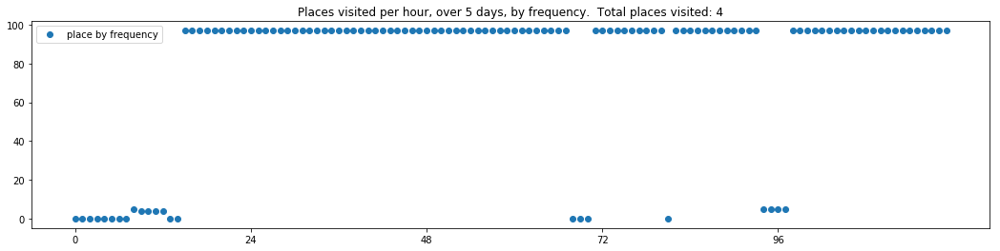

----- vector ----
prefix labels:  [44, 0]
[0, 0, 0, 0, 0, 0, 0, 44, 44, 44, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 80, 80, 80, 80, 80, 80, 80, 80, 80]
[0, 0, 0, 0, 0, 0, 0, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334, 334]


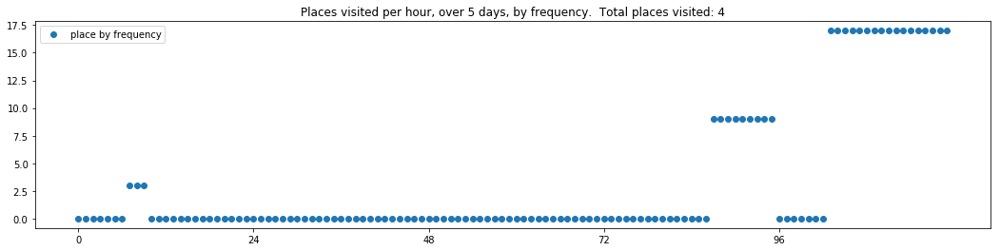

----- vector ----
prefix labels:  [177, 177]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 177, 177, 177, 177, 177, 0, 0, 0, 0, 177]
[177, 177, 84, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 177, 177, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 177, 0, 0, 0, 0, 0, 0, 16, 432, 76, 76, 76, 76, 76]
[76, 76, 76, 76, 76, 0, 0, 0, 0, 0, 0, 0, 0, 177, 177, 177, 177, 177, 177, 177, 177, 177, 177, 177]
[177, 177, 177, 177, 177, 117, 117, 0, 0, 0, 0, 0, 0, 552, 100, 0, 177, 177, 177, 0, 0, 0, 177, 177]


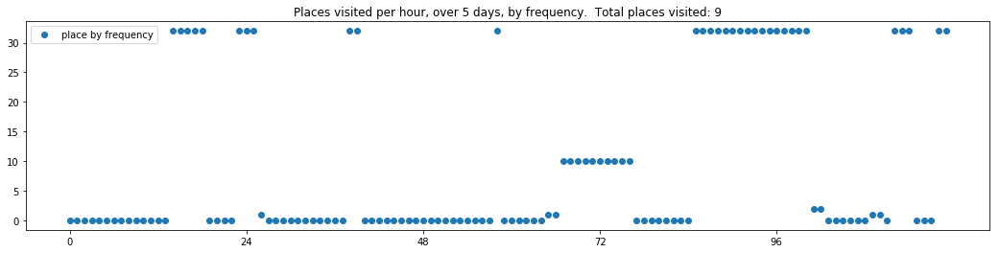

----- vector ----
prefix labels:  [180, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 180, 0, 40, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 40, 0, 180, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


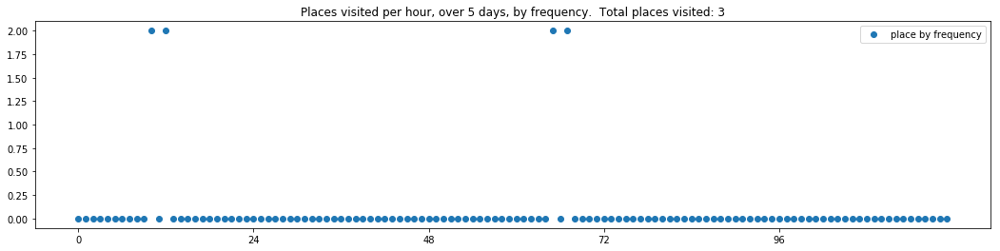

----- vector ----
prefix labels:  [271, 271]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271]
[0, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271]


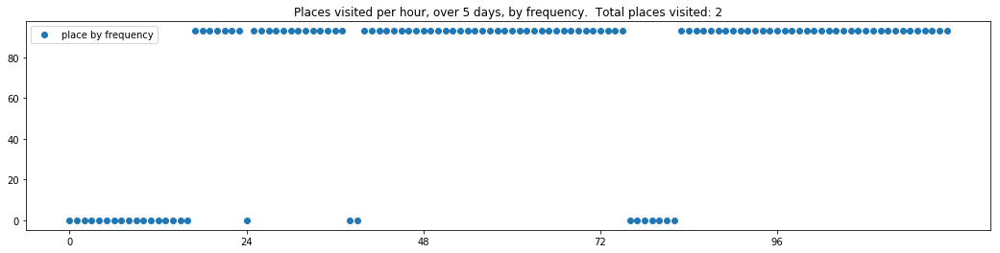

----- vector ----
prefix labels:  [431, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 431, 431, 431, 431, 431, 431, 431, 431, 431, 431]
[431, 431, 431, 431, 431, 0, 0, 0, 308, 0, 0, 0, 0, 0, 0, 0, 0, 0, 590, 590, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 22, 22, 22, 0, 0, 0, 0, 0, 22, 22, 0, 0, 0, 0, 0, 0]
[460, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 351, 0, 0, 0, 0, 0, 0, 0]


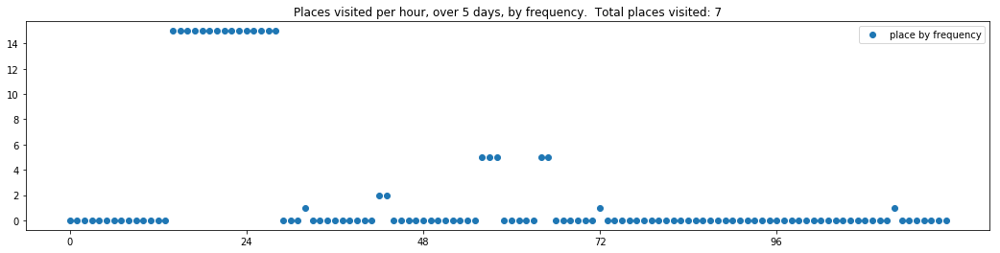

----- vector ----
prefix labels:  [78, 78]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 395, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 78, 0, 214, 214, 214, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 202, 202, 202, 0, 0, 0, 0, 0, 0, 239, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 214, 214, 214, 214, 214, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 214, 214]


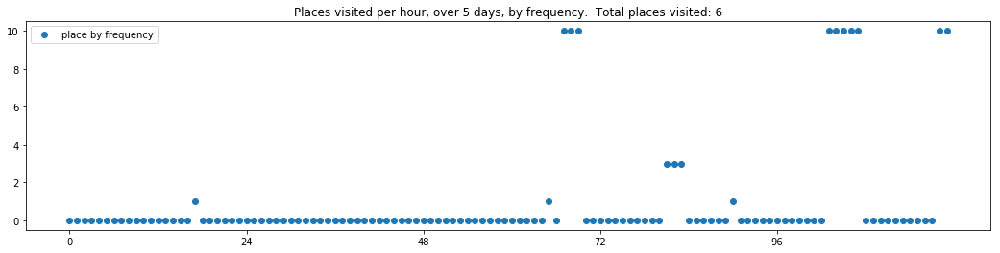

----- vector ----
prefix labels:  [487, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 487, 487, 487, 487, 487, 487, 487]
[487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487]
[487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 0, 0, 0, 0]


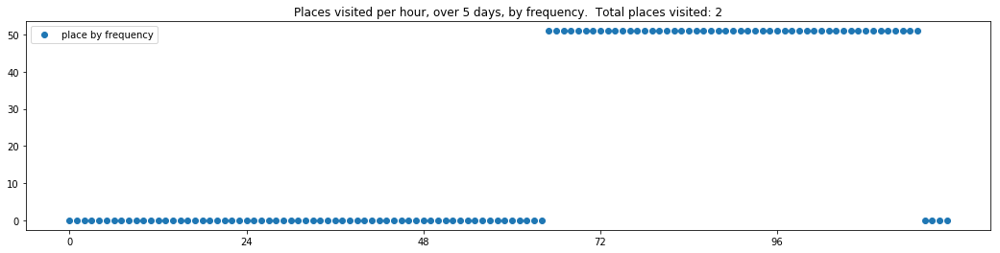

----- vector ----
prefix labels:  [365, 271]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 288, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 317, 317, 317, 317]


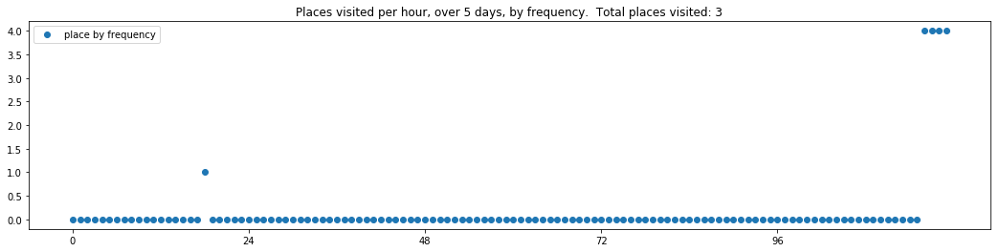

----- vector ----
prefix labels:  [384, 214]
[0, 0, 0, 0, 0, 0, 0, 29, 0, 0, 0, 0, 0, 177, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 214, 0, 8, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 214, 214, 214, 214, 214, 214, 214, 214, 214]


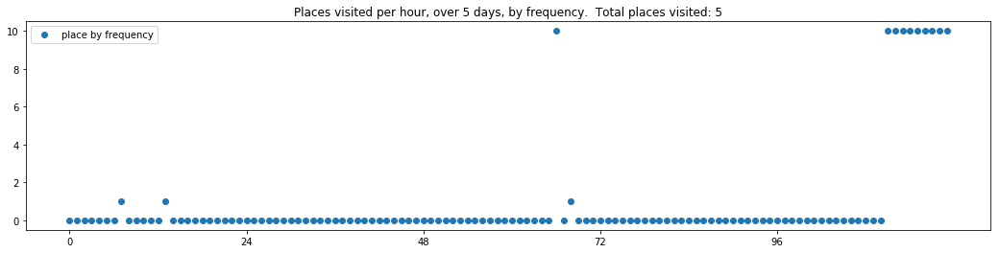


------
 85 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_85.txt 
------

----- vector ----
prefix labels:  [568, 568]
[0, 195, 195, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 568, 568, 568, 568, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 457]
[0, 0, 0, 0, 0, 0, 0, 568, 568, 568, 568, 568, 0, 0, 0, 0, 0, 0, 0, 568, 568, 568, 568, 568]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 568, 568, 568, 568]


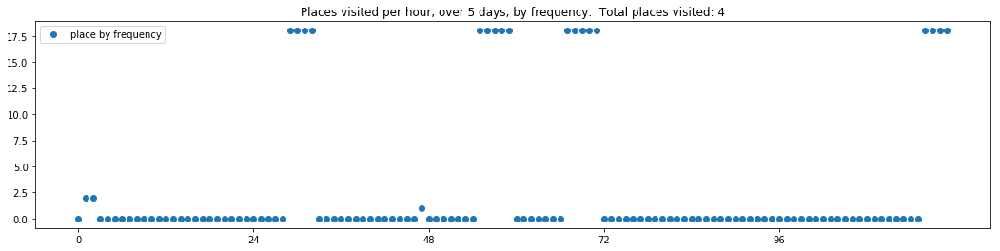

----- vector ----
prefix labels:  [15, 197]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 197, 197, 0, 0, 197, 260, 361]
[361, 199, 199, 199, 199, 199, 199, 199, 199, 199, 197, 85, 523, 580, 580, 580, 580, 580, 580, 580, 580, 580, 580, 580]
[580, 580, 575, 575, 575, 465, 0, 575, 0, 0, 575, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 144]
[144, 144, 144, 144, 144, 144, 144, 144, 144, 199, 199, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270]
[270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 0, 270, 270, 270, 270, 270, 270, 270]


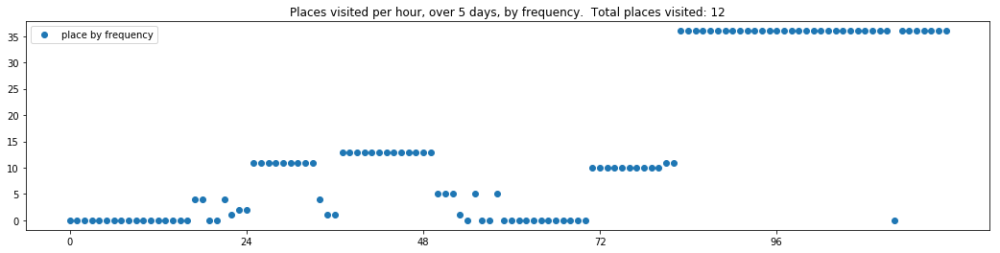

----- vector ----
prefix labels:  [215, 215]
[0, 0, 0, 0, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270]
[270, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 52, 0, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144]
[144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144]
[144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144, 144]


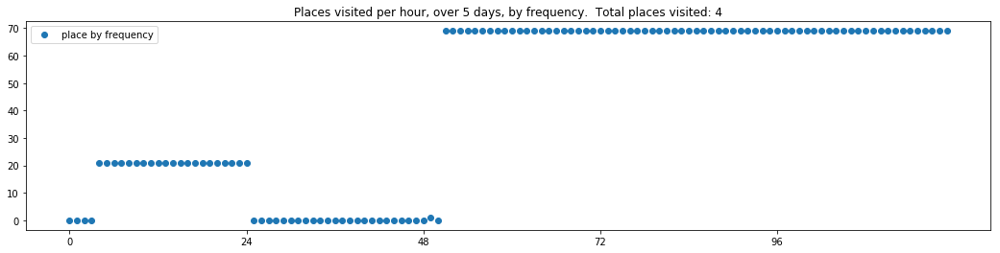

----- vector ----
prefix labels:  [130, 130]
[0, 0, 0, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130]
[130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 0, 130, 0, 0, 0, 130, 0, 0, 0, 0, 0, 130, 130]
[0, 0, 0, 0, 0, 0, 0, 130, 130, 130, 130, 130, 130, 130, 130, 130, 0, 130, 130, 130, 130, 130, 130, 0]
[130, 130, 130, 130, 0, 130, 130, 0, 0, 0, 130, 0, 130, 130, 0, 0, 0, 0, 130, 130, 130, 130, 130, 84]
[84, 84, 130, 130, 0, 0, 0, 0, 130, 130, 130, 130, 130, 130, 0, 130, 130, 130, 130, 0, 130, 130, 130, 130]


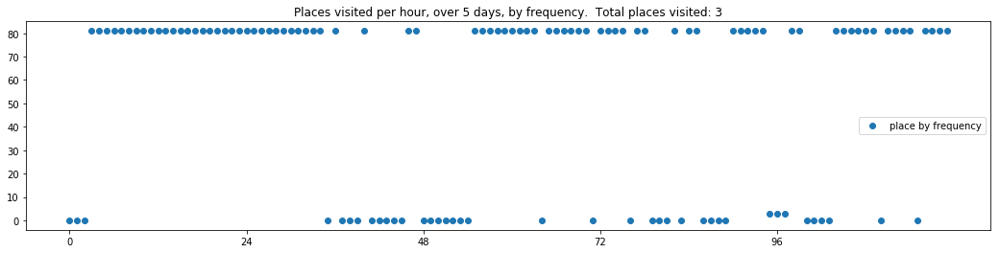

----- vector ----
prefix labels:  [87, 87]
[0, 0, 0, 0, 87, 87, 87, 0, 87, 0, 0, 0, 0, 0, 0, 0, 391, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 162, 162, 162, 162, 162, 0, 0]
[0, 0, 0, 0, 271, 0, 0, 0, 0, 0, 0, 0, 87, 87, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 448, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 0, 271, 271, 271, 271, 271, 271, 271, 266, 0, 87, 87, 87, 87, 87, 87, 87, 0, 0]


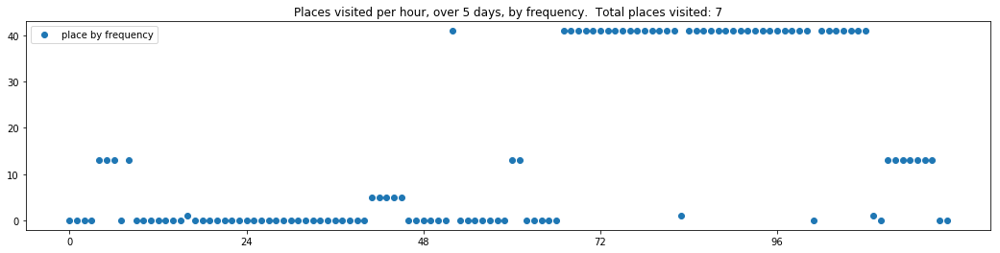

----- vector ----
prefix labels:  [293, 183]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 276, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 276, 0, 0, 0, 0]


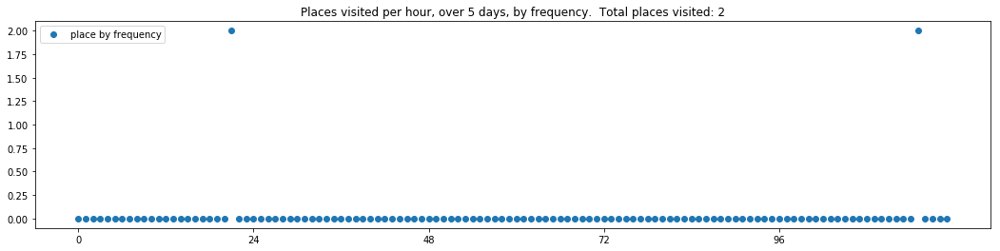

----- vector ----
prefix labels:  [430, 571]
[0, 0, 0, 0, 0, 0, 0, 0, 176, 176, 176, 176, 176, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 439, 0, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176]
[176, 176, 176, 176, 176, 176, 0, 0, 0, 0, 0, 0, 403, 41, 41, 41, 41, 176, 176, 354, 176, 176, 176, 176]
[176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 21, 486, 486, 486, 486, 486, 486, 486, 126, 126, 126, 126, 126]
[126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126]


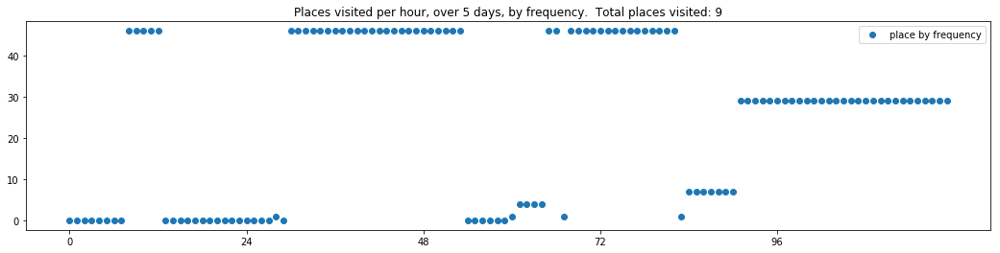

----- vector ----
prefix labels:  [372, 372]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 372, 0, 372, 372, 0, 0, 0, 0, 0, 0, 0, 0, 0, 257]
[0, 257, 257, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 0, 71, 71, 71, 71, 71, 71, 71, 71, 70, 70, 372, 372]
[372, 372, 372, 372, 372, 372, 372, 372, 0, 0, 0, 0, 0, 0, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104]
[104, 104, 104, 104, 104, 104, 104, 150, 150, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104]


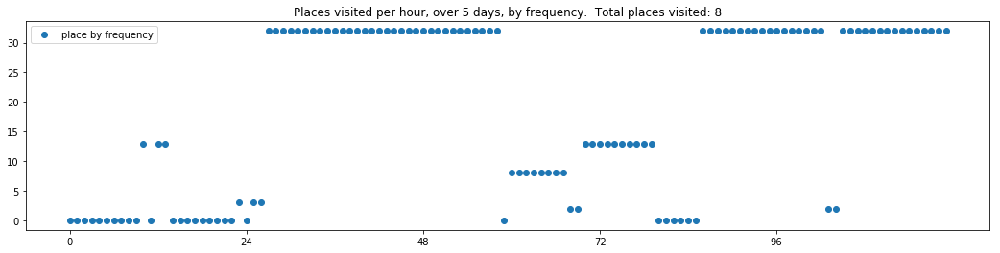

----- vector ----
prefix labels:  [78, 78]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[78, 78, 203, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 78, 78, 0, 0, 0, 0, 0, 0, 0]
[0, 538, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 78, 78, 0, 417, 92, 220, 0, 0, 0, 0, 0, 0, 0, 0, 0, 130, 0, 0, 0, 0, 0, 0, 0]


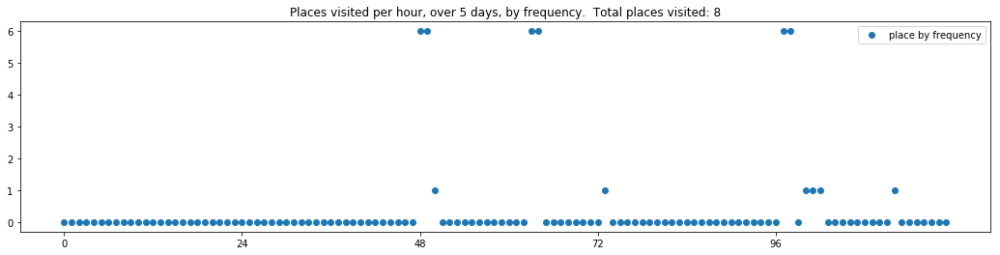

----- vector ----
prefix labels:  [117, 117]
[0, 0, 0, 0, 0, 117, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 268, 268, 268, 268]
[268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268]
[268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268]
[268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268]
[268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268]


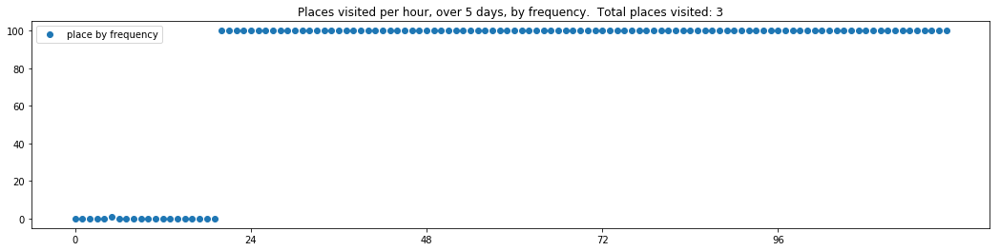


------
 90 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_90.txt 
------

----- vector ----
prefix labels:  [251, 251]
[0, 0, 0, 0, 251, 251, 251, 251, 251, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251]
[251, 251, 251, 251, 251, 251, 32, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251, 251]


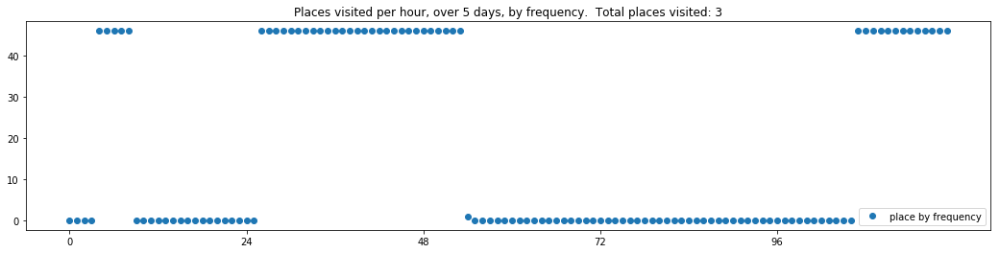

----- vector ----
prefix labels:  [29, 29]
[0, 0, 0, 0, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 277, 0, 0, 0, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]


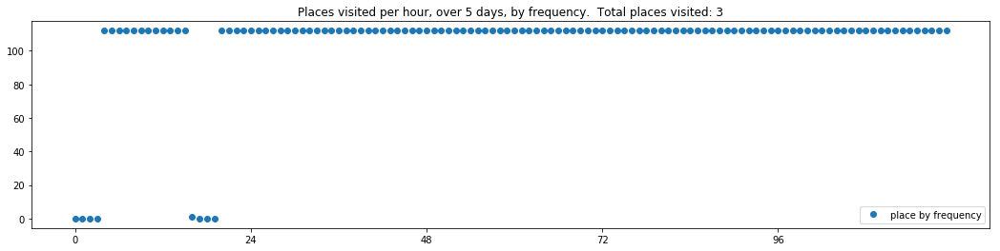

----- vector ----
prefix labels:  [529, 459]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 459, 0, 0, 0, 0]


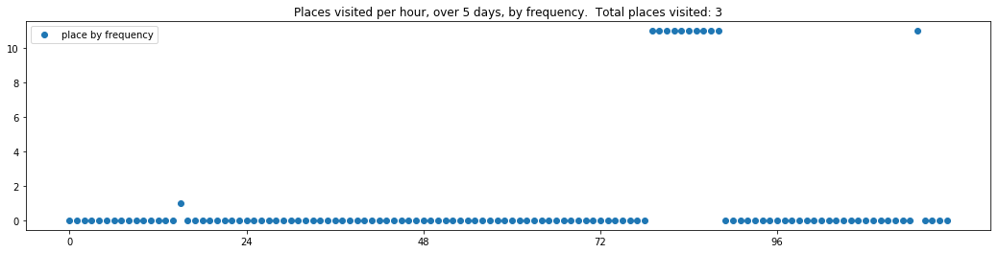

----- vector ----
prefix labels:  [395, 395]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 84, 0, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395]
[395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 84, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395]
[395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395]
[271, 271, 271, 371, 371, 371, 371, 371, 371, 186, 186, 186, 186, 186, 186, 186, 186, 186, 186, 186, 4, 4, 0, 379]
[0, 140, 338, 338, 338, 0, 151, 338, 338, 338, 338, 0, 186, 186, 186, 186, 186, 186, 186, 186, 140, 140, 186, 0]


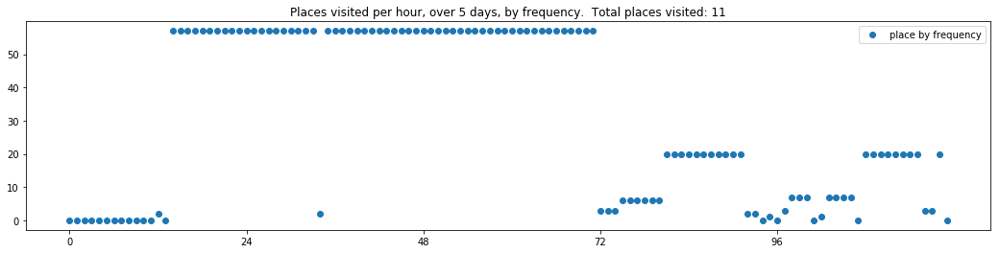

----- vector ----
prefix labels:  [26, 26]
[0, 0, 0, 0, 0, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26]
[26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26]
[26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26]
[26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26]
[26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26]


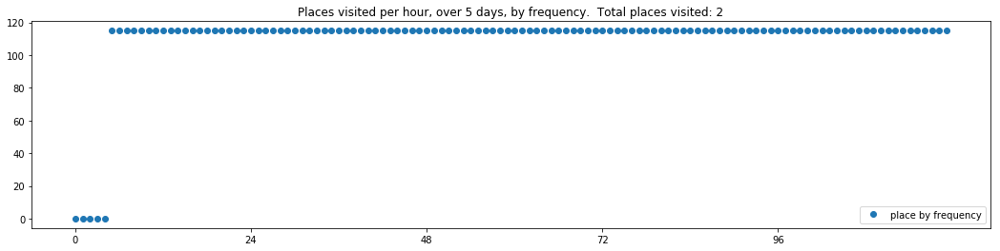

----- vector ----
prefix labels:  [246, 246]
[0, 0, 0, 0, 0, 0, 246, 246, 246, 246, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 246, 246, 246, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 246, 246, 246, 246, 246, 246, 246, 246]


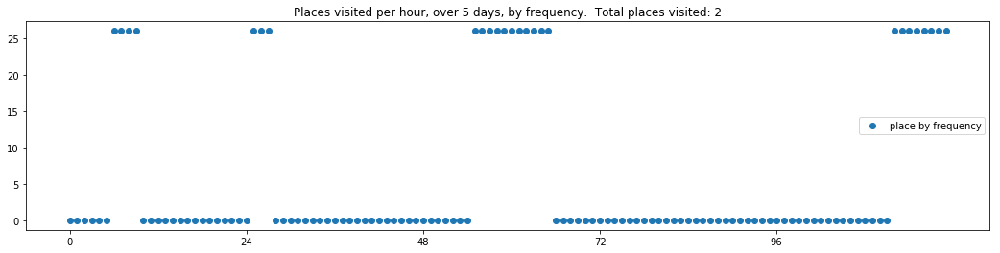

----- vector ----
prefix labels:  [246, 246]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 246, 246, 246, 246, 246, 246, 246, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 48, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 109, 0]


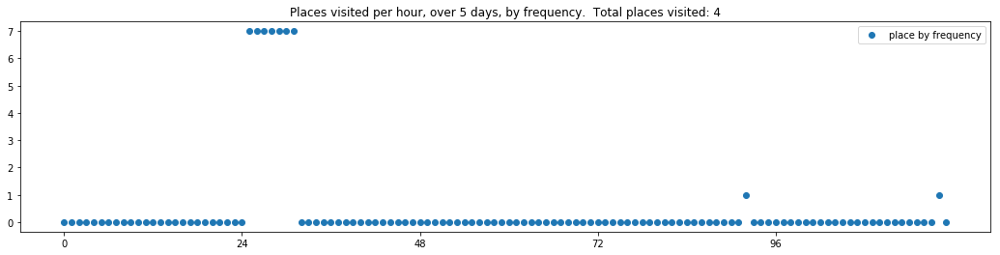

----- vector ----
prefix labels:  [311, 311]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311]
[311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311]
[311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311]
[311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311]
[311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311, 311]


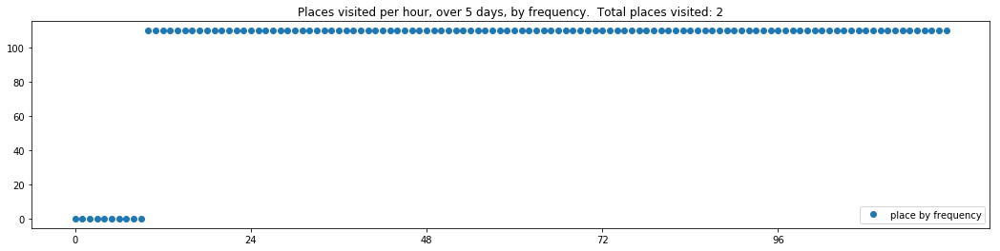

----- vector ----
prefix labels:  [130, 130]
[0, 0, 0, 0, 0, 0, 0, 0, 130, 130, 34, 34, 0, 0, 0, 0, 130, 130, 130, 130, 130, 130, 130, 130]
[130, 130, 130, 130, 0, 130, 130, 130, 130, 130, 130, 130, 0, 130, 34, 0, 0, 0, 0, 0, 0, 0, 130, 130]
[130, 0, 130, 130, 130, 130, 130, 130, 130, 0, 130, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
[69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69]
[69, 69, 69, 69, 69, 69, 69, 69, 69, 0, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130]


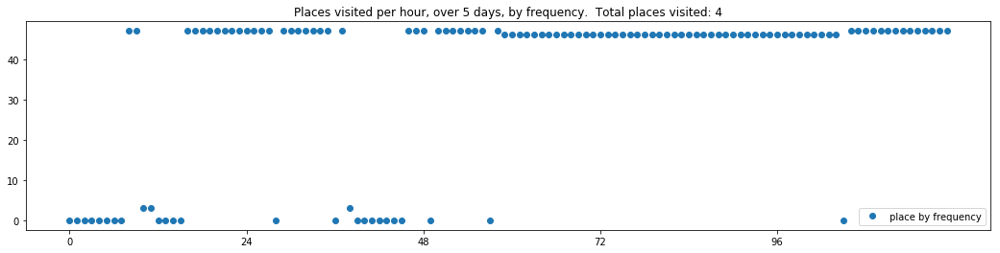

----- vector ----
prefix labels:  [153, 8]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 203, 116, 116, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[116, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 39, 0, 0, 0, 8, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 21, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 21, 364, 364, 364, 364, 253, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126, 126]


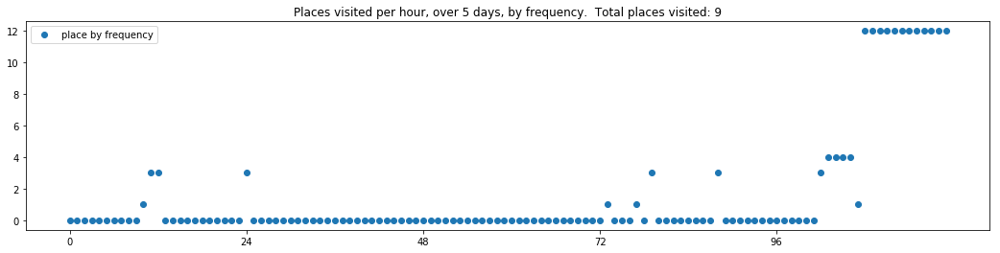


------
 95 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_95.txt 
------

----- vector ----
prefix labels:  [0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


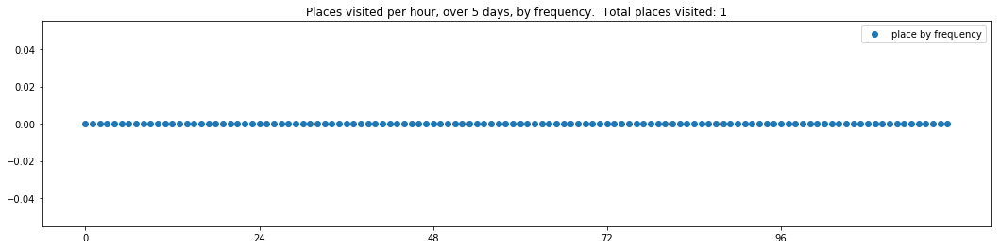

----- vector ----
prefix labels:  [352, 352]
[0, 0, 0, 0, 0, 70, 0, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352]
[352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352]
[352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352]
[352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352]
[352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352, 352]


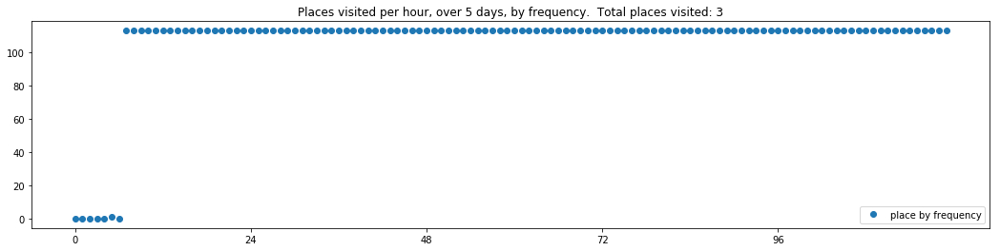

----- vector ----
prefix labels:  [392, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 392, 392]
[392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]
[392, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 570, 570, 374, 374, 374, 374, 374, 374, 374, 374, 374, 374, 374, 374, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 309, 0, 0, 0, 0, 0, 0, 0, 0, 165, 304, 165, 165, 0, 0, 0]


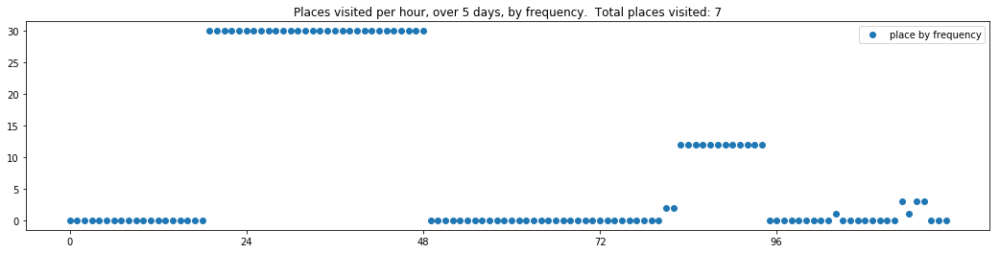

----- vector ----
prefix labels:  [392, 392]
[0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]
[392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]
[392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]
[392, 392, 392, 392, 392, 392, 392, 392, 0, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]
[392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392]


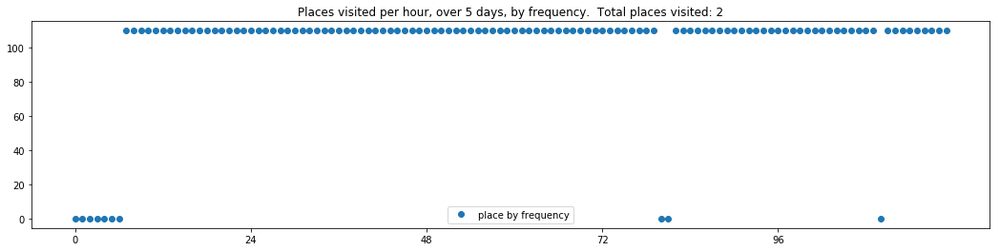

----- vector ----
prefix labels:  [339, 339]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339]
[339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339]
[339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339]
[339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339]
[339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339, 339]


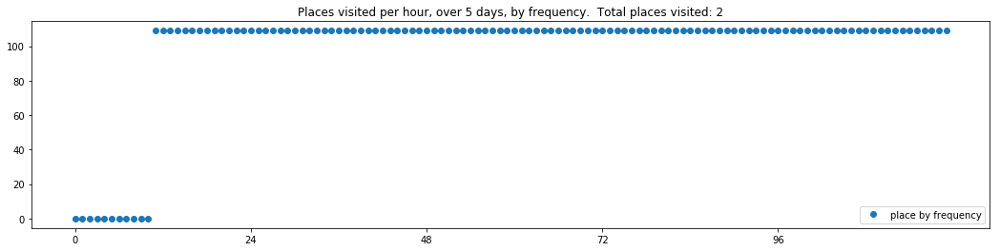

----- vector ----
prefix labels:  [109, 109]
[0, 0, 0, 0, 0, 109, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 109, 109, 109, 109]
[109, 109, 109, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 412, 412, 412, 412, 412]
[412, 412, 412, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 412, 412, 0, 0, 0, 0, 0, 0, 0, 412, 412, 247, 0, 0, 0, 109, 109, 109]


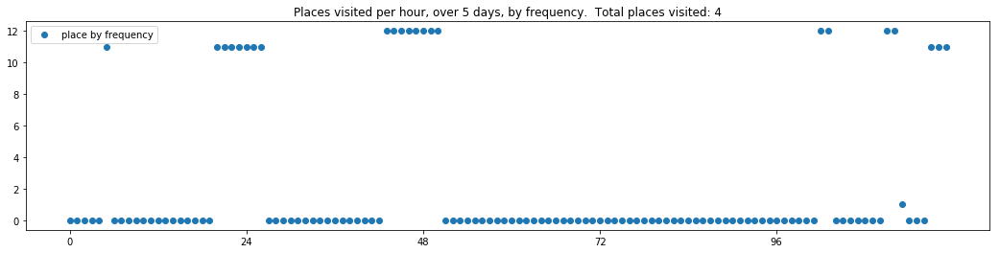

----- vector ----
prefix labels:  [216, 125]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 203, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216]
[216, 216, 216, 0, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216]
[216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216]
[216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216]


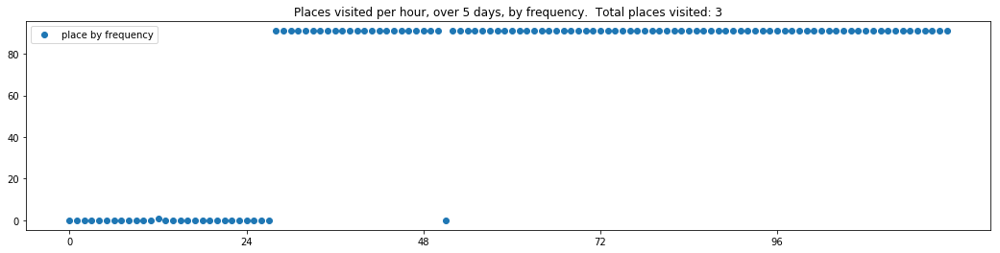

----- vector ----
prefix labels:  [486, 486]
[486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486]
[486, 0, 0, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486]
[486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486]
[486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486]
[486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486, 486]


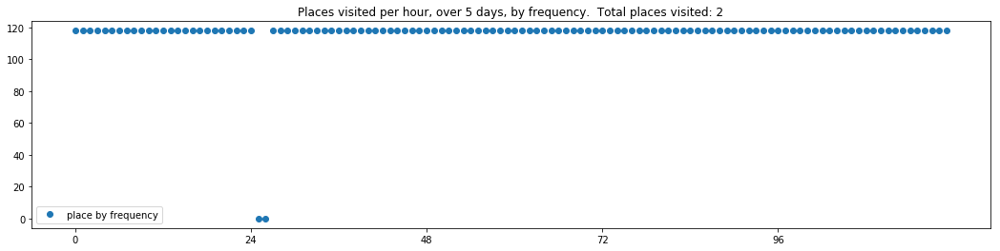

----- vector ----
prefix labels:  [104, 104]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 104, 104, 104, 104, 104]
[104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104]
[104, 0, 0, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104]
[104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104]
[104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104]


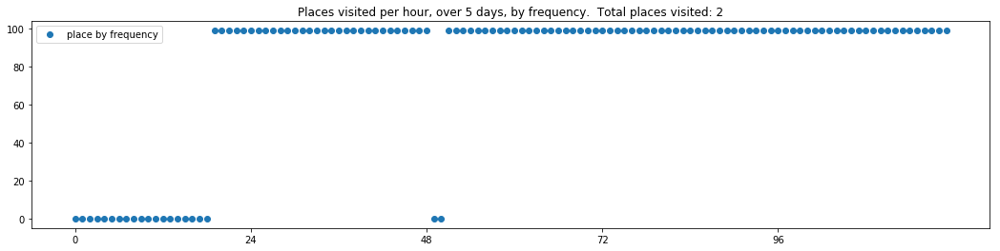

----- vector ----
prefix labels:  [22, 22]
[0, 0, 0, 0, 0, 0, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22]
[77, 77, 0, 22, 22, 22, 22, 22, 22, 22, 22, 0, 0, 0, 0, 77, 77, 77, 77, 77, 77, 77, 77, 77]
[77, 77, 77, 77, 77, 77, 77, 77, 270, 270, 270, 270, 270, 270, 270, 270, 270, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 65, 65, 65, 65, 65, 68, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


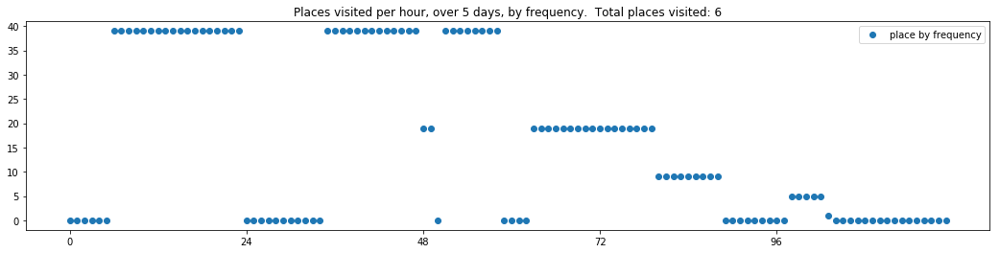


------
 110 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_110.txt 
------

----- vector ----
prefix labels:  [435, 353]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 142, 213, 213, 213, 213, 213]
[213, 0, 0, 0, 0, 0, 0, 0, 0, 435, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 478, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 339, 0, 0, 0, 0, 0, 0, 0]


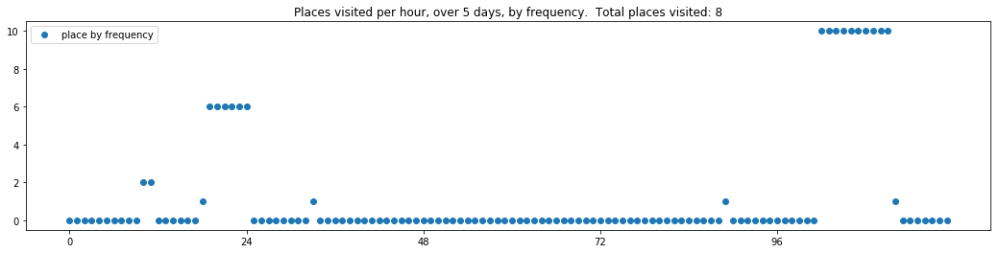

----- vector ----
prefix labels:  [26, 26]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 26, 0, 413, 0]
[0, 0, 0, 0, 0, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 0, 0, 26, 26, 26, 26, 26]
[26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26]
[26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26]


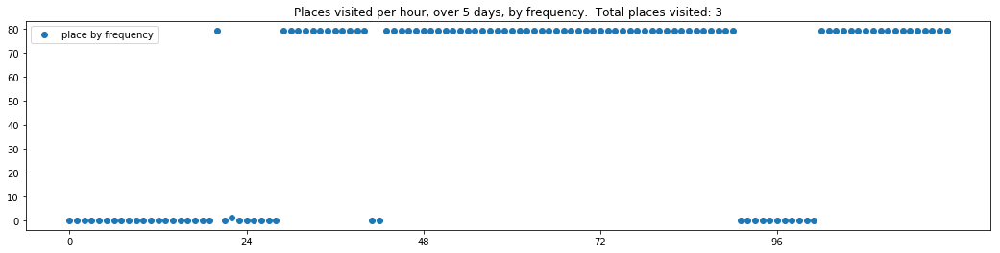

----- vector ----
prefix labels:  [146, 146]
[0, 0, 0, 0, 0, 0, 200, 0, 0, 0, 0, 0, 0, 0, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146]
[146, 146, 222, 146, 146, 146, 146, 146, 146, 146, 146, 146, 0, 0, 0, 222, 222, 146, 146, 559, 559, 0, 0, 0]
[374, 146, 146, 146, 146, 146, 146, 559, 559, 559, 559, 146, 146, 559, 559, 559, 0, 0, 0, 0, 0, 0, 559, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 559, 0, 0, 146, 146, 0, 146, 146, 146, 146]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 146, 0, 0, 0, 0, 0, 0, 146, 0, 0, 0, 0]


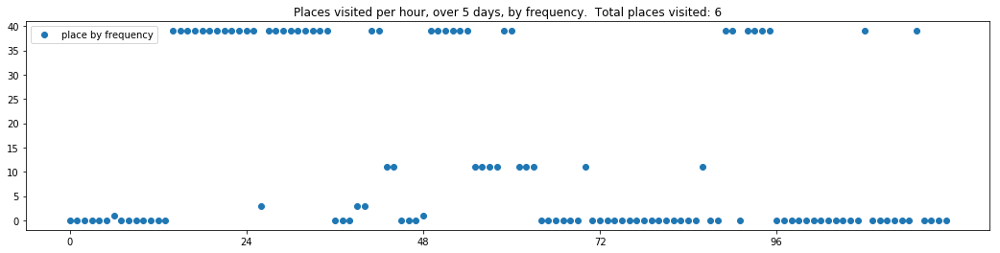

----- vector ----
prefix labels:  [16, 266]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 16, 16, 101]
[0, 0, 0, 0, 0, 411, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 479, 479]
[479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479]
[479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479]
[479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479, 479]


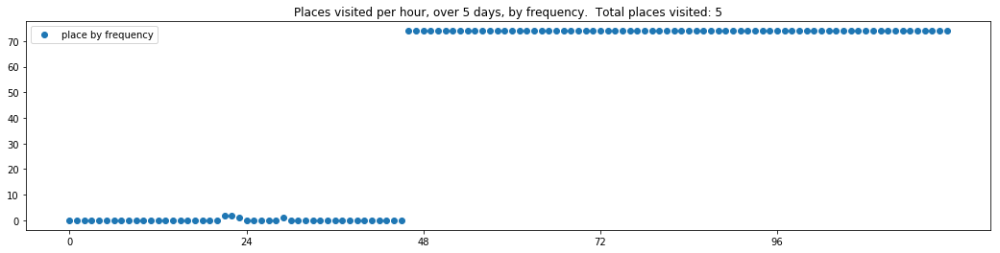

----- vector ----
prefix labels:  [162, 162]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 448, 448, 448, 448, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 245, 0, 0, 0, 0, 0, 0, 0, 162, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


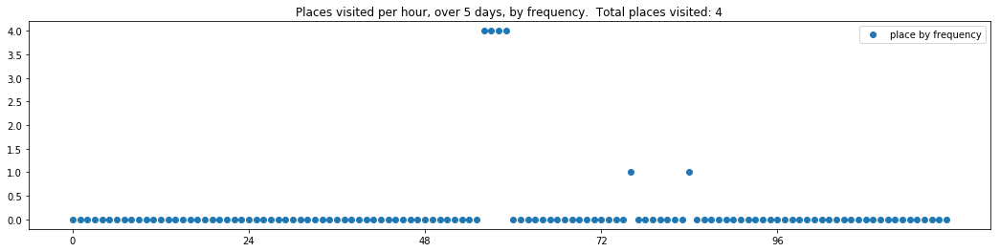

----- vector ----
prefix labels:  [391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]
[391, 391, 391, 391, 391, 391, 195, 195, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391, 391]


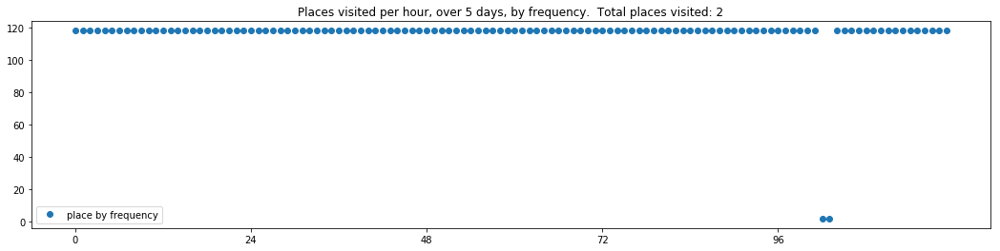

----- vector ----
prefix labels:  [4, 4]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 0, 4]
[4, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


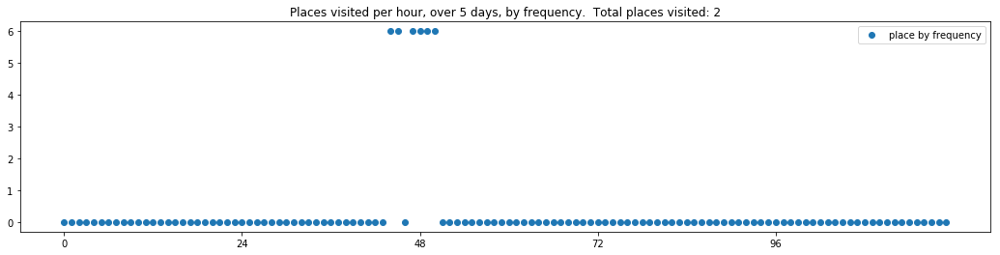

----- vector ----
prefix labels:  [5, 5]
[0, 0, 0, 0, 0, 209, 209, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
[5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
[5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
[5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


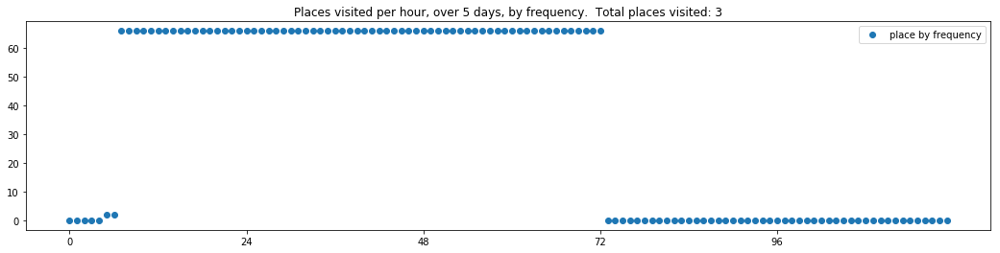

----- vector ----
prefix labels:  [223, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 68, 0, 0, 0, 216, 216, 216, 216]
[216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216, 216]


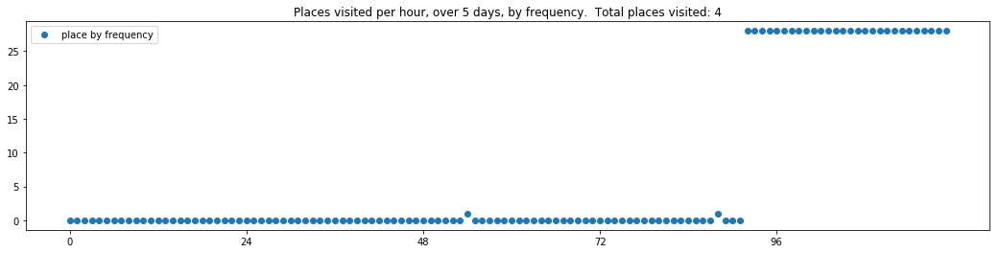

----- vector ----
prefix labels:  [401, 401]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 401, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 0, 0, 0, 0]


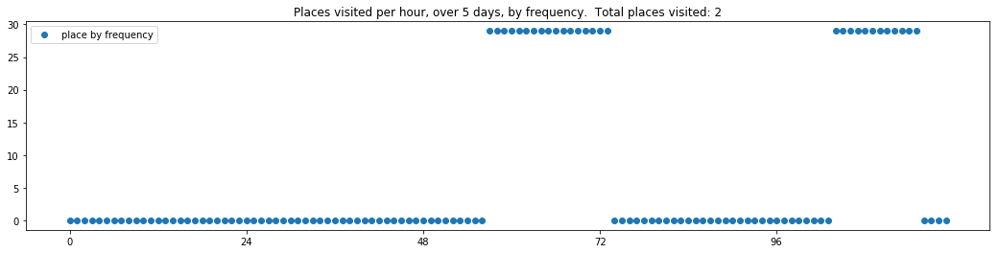


------
 115 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_115.txt 
------

----- vector ----
prefix labels:  [0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


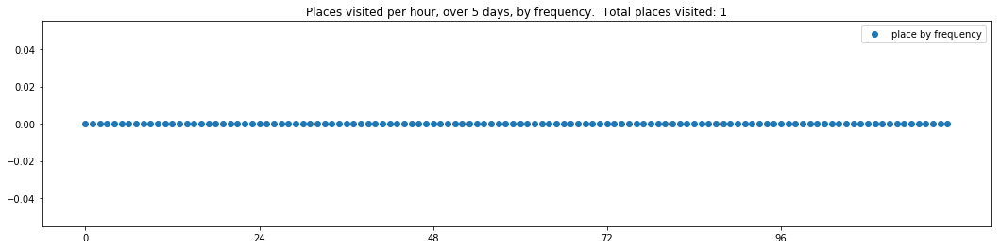

----- vector ----
prefix labels:  [437, 437]
[0, 0, 0, 0, 0, 437, 0, 0, 0, 0, 0, 437, 437, 437, 437, 0, 0, 0, 0, 437, 437, 437, 437, 437]
[437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 0, 0, 0, 0, 437, 437, 437, 437, 437, 437]
[437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 437, 0, 437, 437, 437, 437, 437, 437]
[437, 437, 437, 437, 437, 437, 437, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437, 437, 437, 437, 437, 437]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 437, 437, 437, 437, 437]


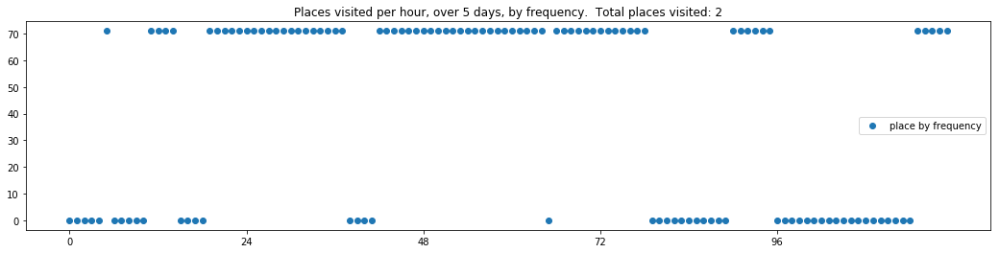

----- vector ----
prefix labels:  [3, 507]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 341, 341, 341, 341, 341, 341, 341, 341, 0, 341, 341, 341, 0, 0, 0, 0, 453]
[453, 0, 0, 0, 0, 0, 0, 0, 453, 453, 453, 453, 453, 341, 341, 341, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 0, 0, 0, 0, 0, 0, 0, 341, 341, 0, 0, 0, 0, 0]
[586, 586, 586, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 87, 87, 87, 87, 87, 87, 87, 87, 0, 0, 0]


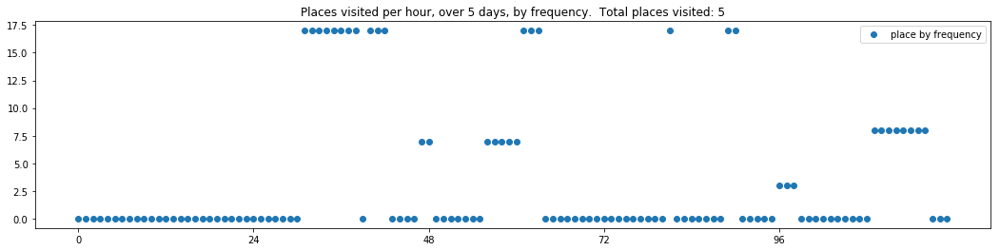

----- vector ----
prefix labels:  [111, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


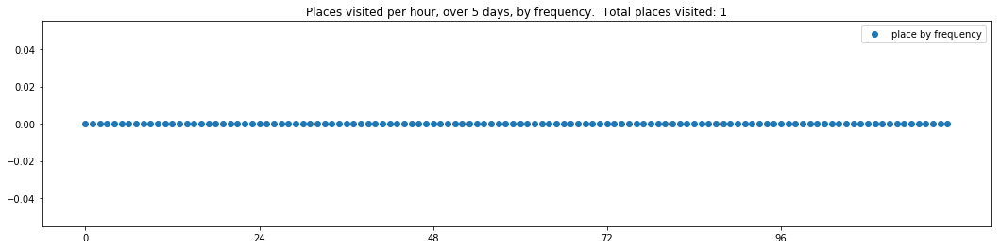

----- vector ----
prefix labels:  [477, 477]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 629, 629, 629, 629, 629, 629]
[629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 629, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629, 629]


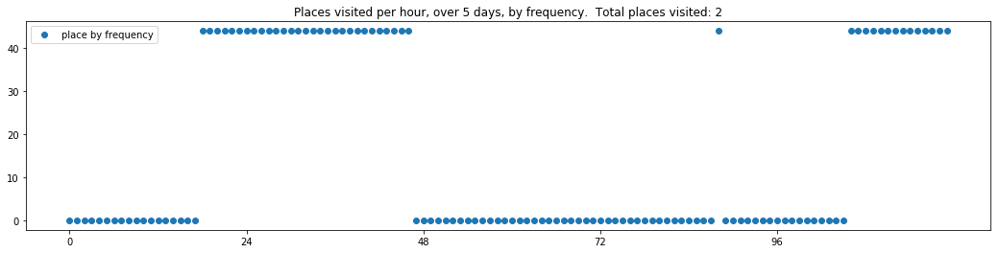

----- vector ----
prefix labels:  [187, 76]
[0, 0, 0, 0, 0, 0, 0, 76, 76, 76, 76, 76, 76, 76, 21, 0, 187, 187, 187, 187, 187, 187, 187, 187]
[187, 187, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 187, 187, 187, 187, 76, 76, 76, 76, 76, 76, 76, 76]
[76, 0, 0, 0, 187, 0, 0, 0, 0, 0, 0, 0, 0, 187, 187, 187, 76, 76, 76, 76, 76, 76, 76, 76]
[76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 640, 640]
[640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640, 640]


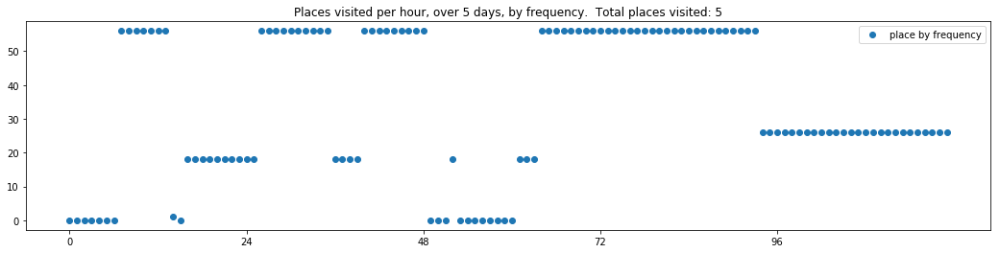

----- vector ----
prefix labels:  [179, 179]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 179, 179, 179, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


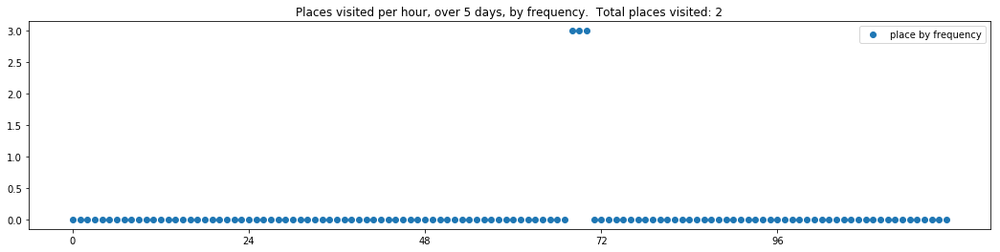

----- vector ----
prefix labels:  [84, 84]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 291, 225, 225, 225, 0, 84, 84]
[0, 0, 0, 0, 0, 0, 0, 0, 416, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 384, 384, 384, 384, 384]
[384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 384, 0, 119, 119]
[119, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 202, 20, 0, 0, 0]


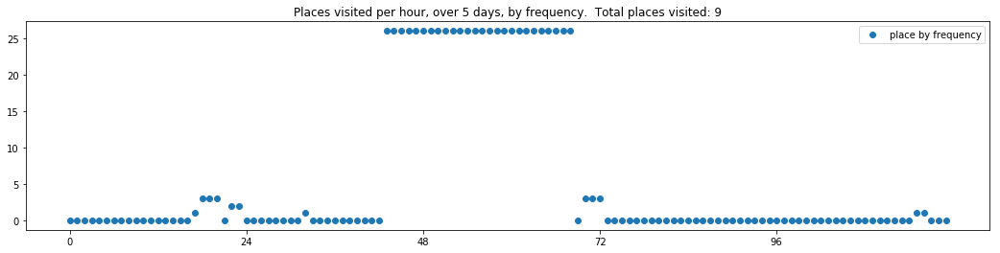

----- vector ----
prefix labels:  [435, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 147, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 204, 204, 204, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 478, 550, 401]


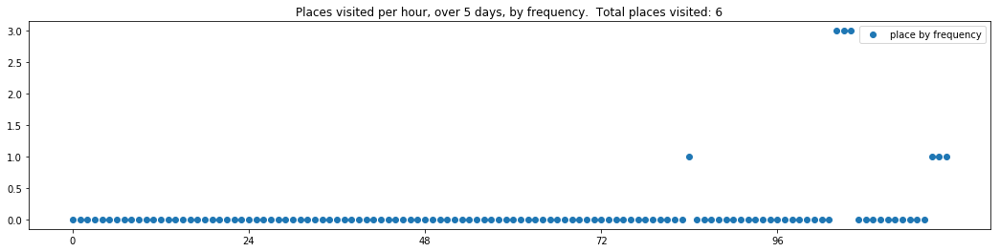

----- vector ----
prefix labels:  [267, 267]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 267, 267, 267, 267, 267, 267, 267]
[267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 267, 267, 267, 267, 267]
[267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267]


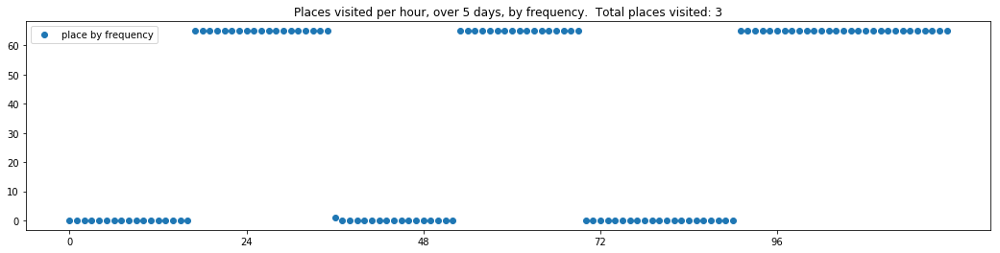


------
 120 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_120.txt 
------

----- vector ----
prefix labels:  [21, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 560, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


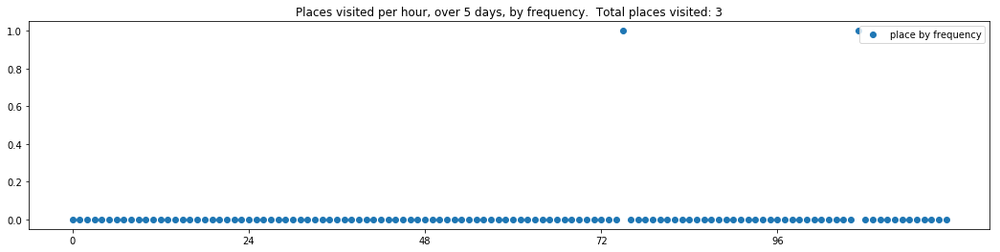

----- vector ----
prefix labels:  [226, 226]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226]
[226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 226, 226, 226, 0, 0, 0, 0, 0, 0, 226]
[226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 181, 226, 0, 0, 0, 0, 226]
[226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226]


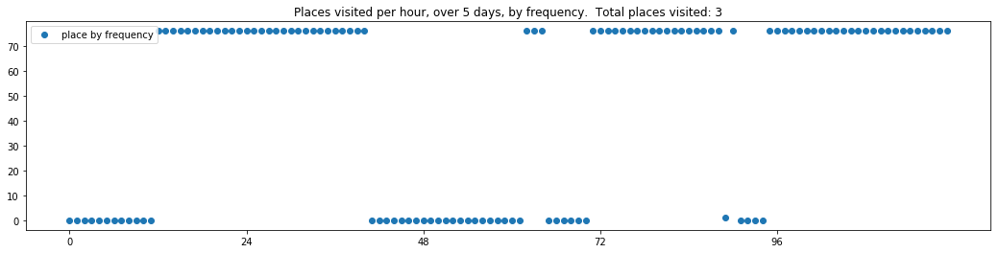

----- vector ----
prefix labels:  [222, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


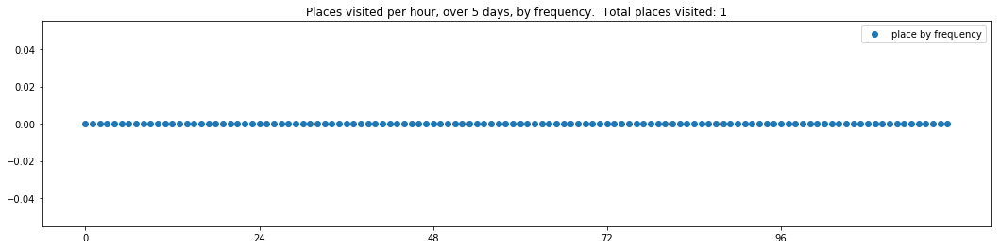

----- vector ----
prefix labels:  [635, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 95]
[95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95]
[95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 0, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22]


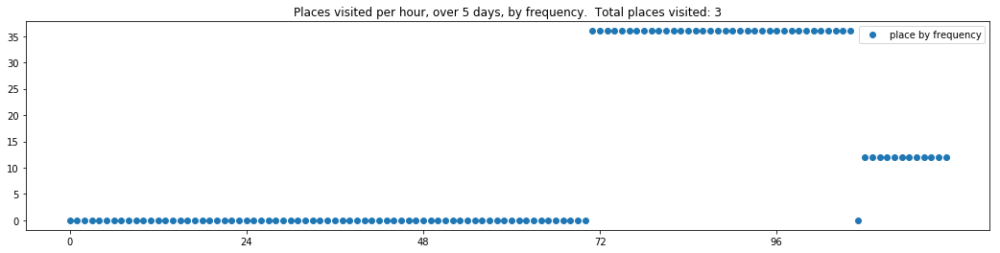

----- vector ----
prefix labels:  [40, 40]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40]
[40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40]
[40, 40, 40, 40, 40, 40, 0, 0, 0, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40]
[40, 40, 40, 40, 40, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 40, 40, 40, 40, 40, 40, 40]


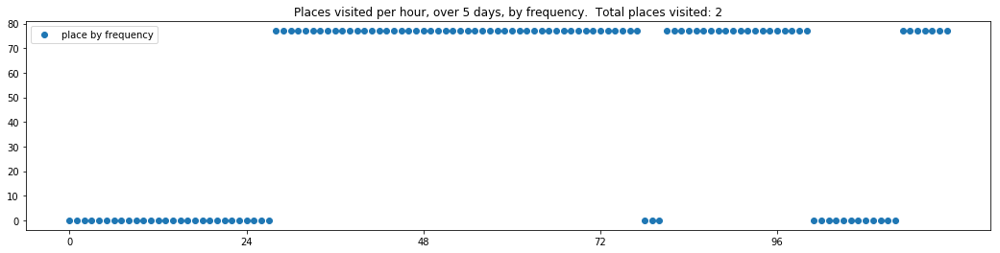

----- vector ----
prefix labels:  [47, 44]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 44, 44, 44, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 44, 44, 0, 0, 0, 0, 0, 0, 44, 0, 0, 0, 44, 0, 0, 0, 0, 0, 0]


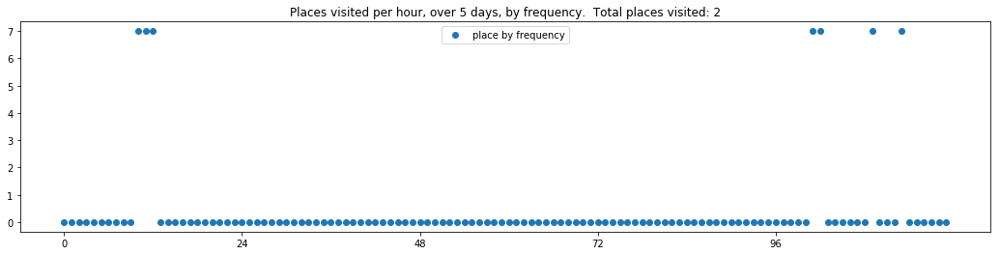

----- vector ----
prefix labels:  [133, 133]
[0, 0, 0, 0, 0, 0, 0, 133, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 94, 94, 94]
[94, 94, 94, 0, 0, 0, 0, 97, 97, 603, 603, 603, 603, 603, 603, 603, 146, 76, 76, 76, 519, 519, 519, 519]
[519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 519, 0]


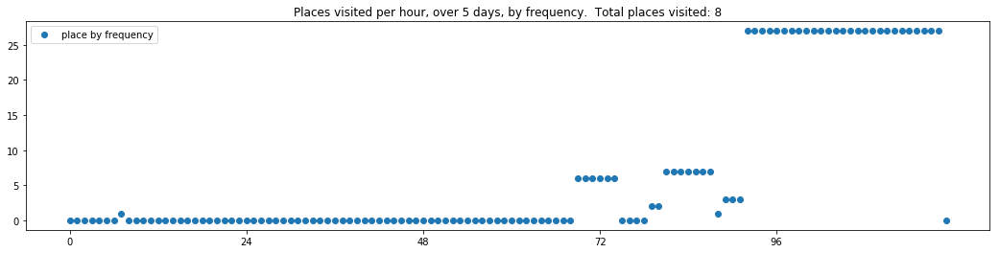

----- vector ----
prefix labels:  [0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


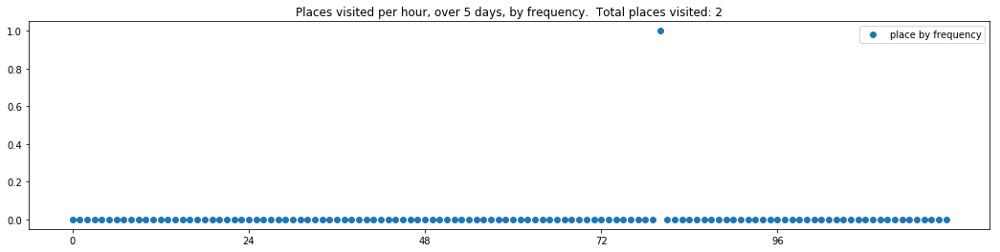

----- vector ----
prefix labels:  [26, 97]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 181, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 181, 192, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


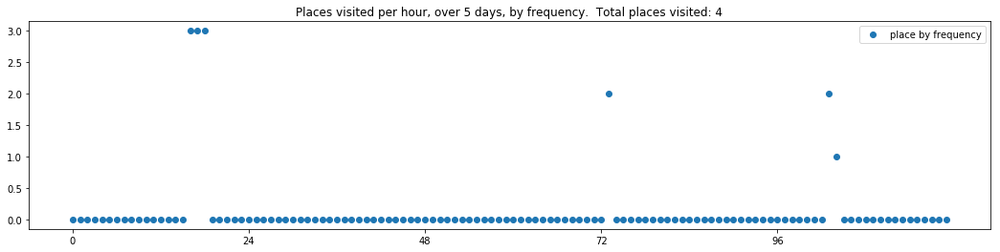

----- vector ----
prefix labels:  [199, 199]
[0, 0, 0, 0, 0, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199]
[199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 0, 199]
[199, 199, 199, 199, 199, 0, 0, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199]
[199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199]
[199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199]


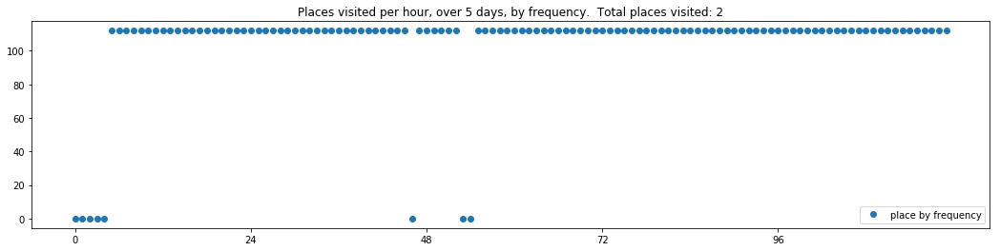


------
 125 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_125.txt 
------

----- vector ----
prefix labels:  [469, 71]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 275, 275, 275, 275, 275, 275, 275, 275, 275, 275, 275, 275]
[275, 275, 275, 275, 112, 0, 187, 0, 0, 0, 187, 469, 469, 469, 469, 469, 203, 469, 469, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 214, 0, 0, 0, 0, 0, 0, 469, 469, 469, 469, 0, 469, 469, 469, 469, 469]
[469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469, 213, 213, 213]
[213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 213, 550]


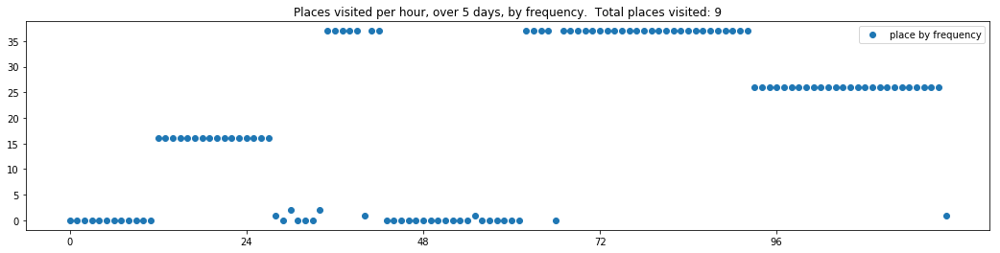

----- vector ----
prefix labels:  [2, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 151, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


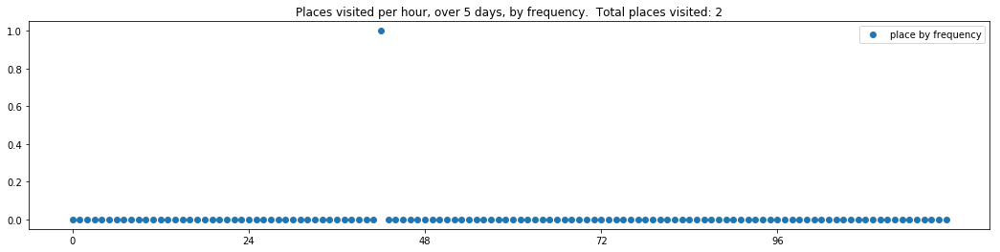

----- vector ----
prefix labels:  [248, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 26, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


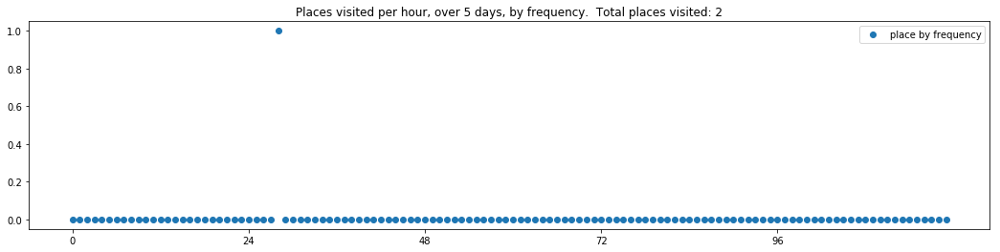

----- vector ----
prefix labels:  [289, 4]
[0, 0, 0, 0, 88, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 88, 289, 289, 289]
[289, 289, 289, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 289, 289, 289, 289, 289, 289, 289]


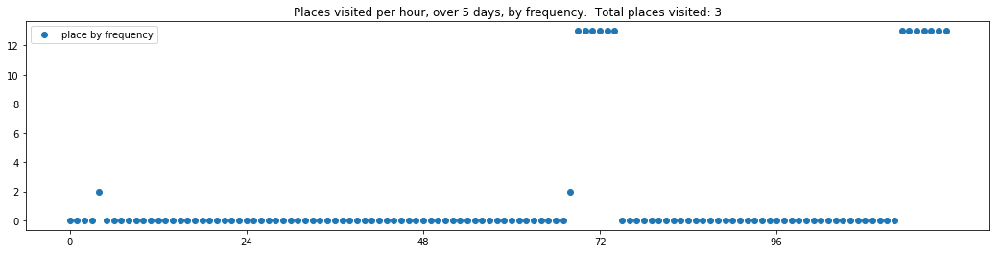

----- vector ----
prefix labels:  [115, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


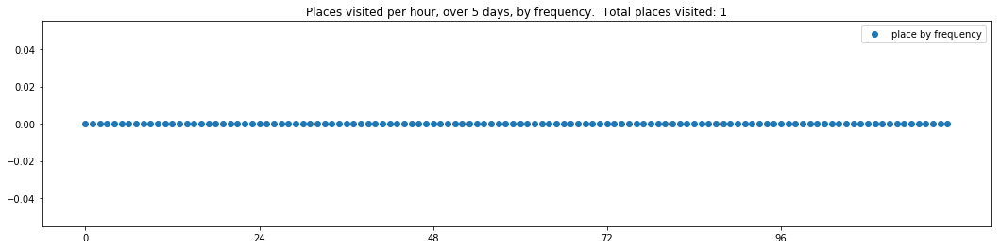

----- vector ----
prefix labels:  [586, 586]
[0, 0, 0, 0, 0, 0, 0, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586]
[586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586]
[586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586]
[586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586]
[586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 0, 586, 586, 586, 586, 586, 586]


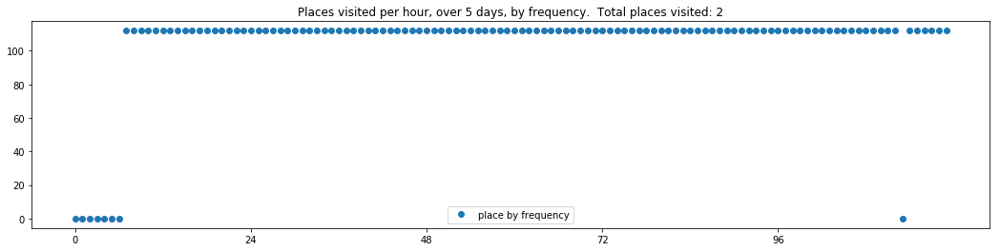

----- vector ----
prefix labels:  [263, 263]
[263, 263, 263, 263, 263, 263, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263]
[263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263]
[263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263]
[263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263, 263]


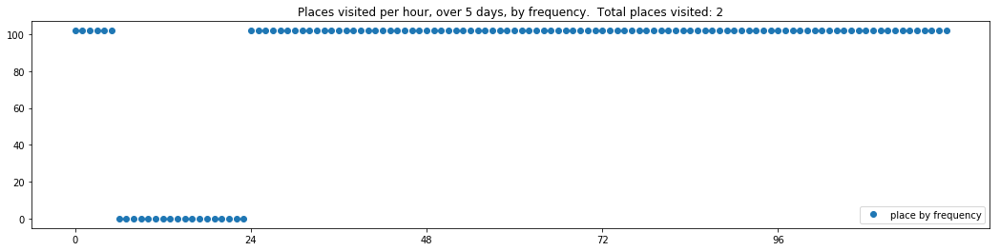

----- vector ----
prefix labels:  [90, 189]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 197, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 90]


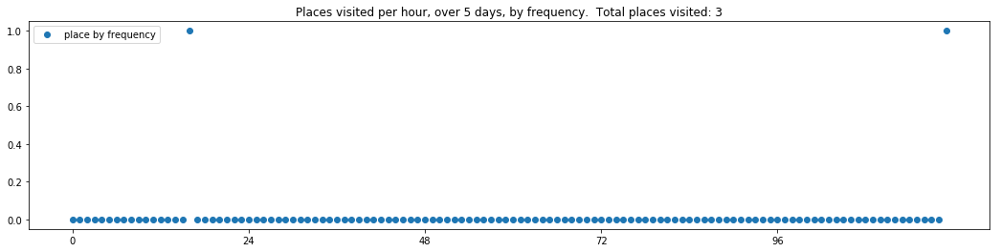

----- vector ----
prefix labels:  [293, 293]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


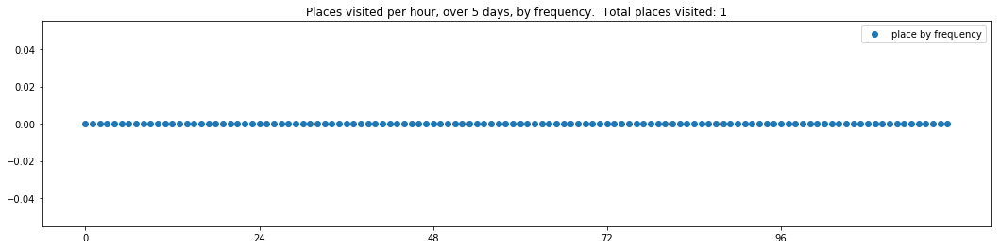

----- vector ----
prefix labels:  [143, 271]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0, 271, 271, 271, 271, 271, 271, 33]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 0, 0, 454, 0, 0]


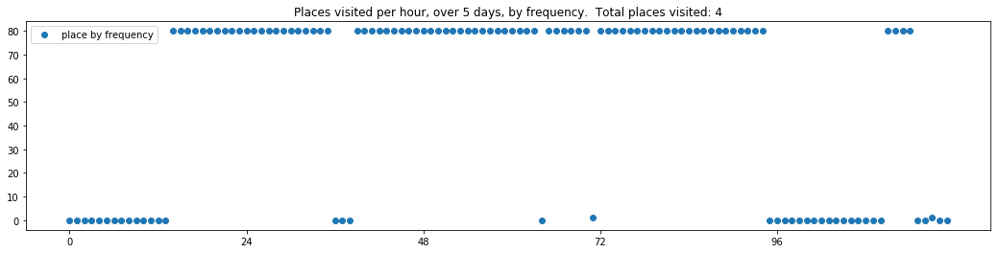


------
 130 /Users/aberke/projects/gan-hacking/SeqGAN/save/eval_file_130.txt 
------

----- vector ----
prefix labels:  [368, 56]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 375, 0]
[0, 0, 0, 0, 0, 100, 199, 199, 199, 503, 503, 503, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56]
[56, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199]
[199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 199, 21, 0, 0, 0, 0, 0, 0, 0, 0]


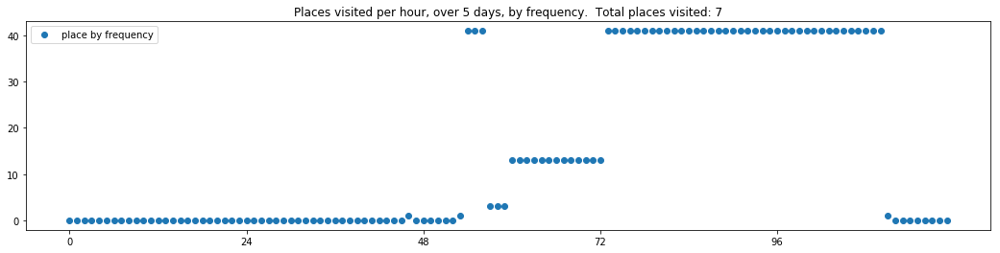

----- vector ----
prefix labels:  [542, 542]
[0, 0, 0, 0, 0, 0, 0, 542, 542, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 542]


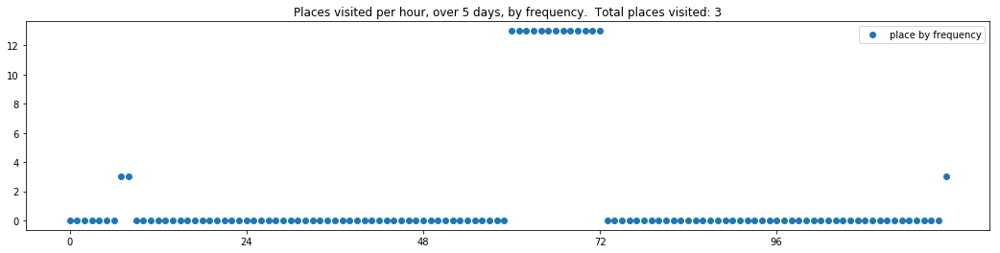

----- vector ----
prefix labels:  [586, 586]
[0, 0, 0, 0, 0, 0, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586]
[586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586]
[586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586]
[586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586]
[586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586]


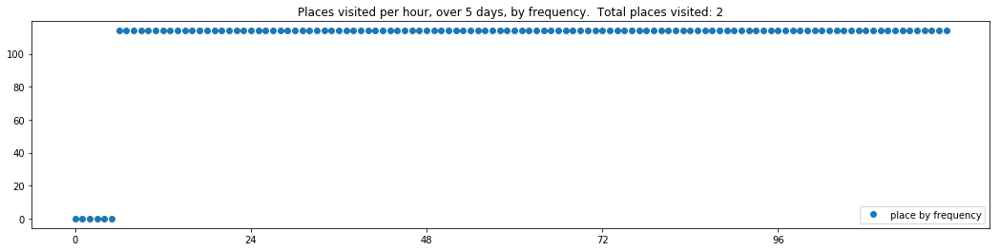

----- vector ----
prefix labels:  [595, 353]
[0, 0, 0, 0, 289, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


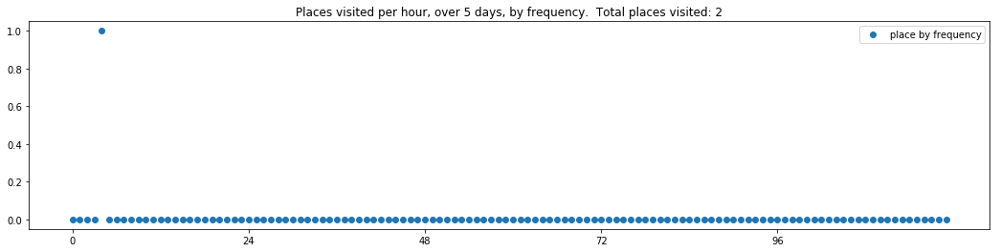

----- vector ----
prefix labels:  [99, 99]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 99, 99, 99, 99, 99, 99, 99, 99, 99]
[99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99]
[99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99]
[99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99]
[99, 99, 99, 99, 99, 99, 99, 99, 99, 551, 551, 551, 551, 551, 551, 0, 0, 0, 0, 438, 0, 0, 0, 0]


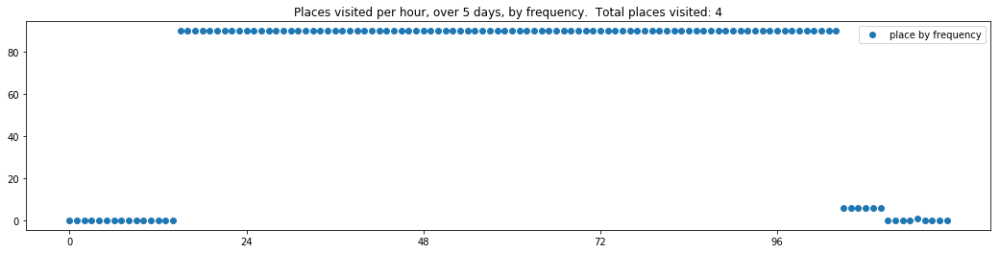

----- vector ----
prefix labels:  [21, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 271, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 21, 76, 76, 76, 0, 0]


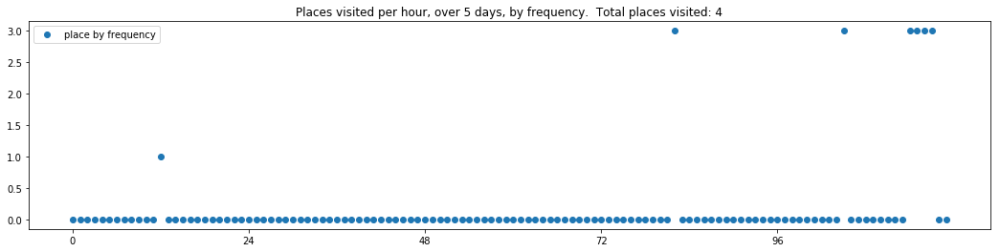

----- vector ----
prefix labels:  [29, 29]
[0, 0, 0, 0, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]
[29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29]


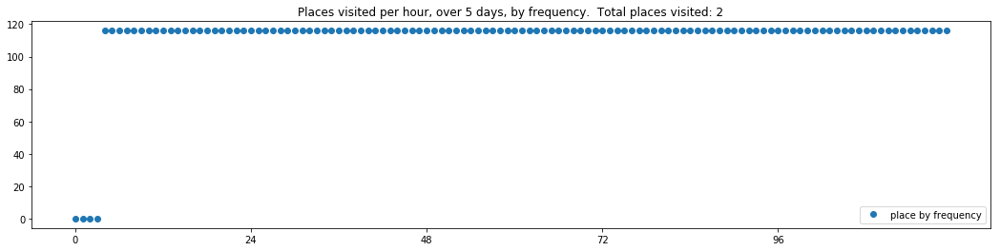

----- vector ----
prefix labels:  [271, 271]
[0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0]
[0, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271]


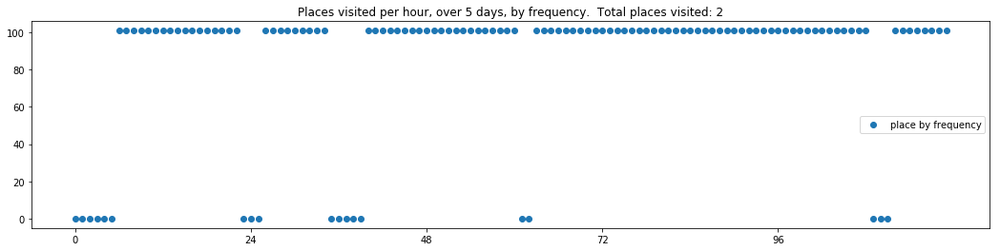

----- vector ----
prefix labels:  [247, 247]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 247, 45, 0, 0, 0, 0, 0, 0, 0, 0, 0, 47, 48, 247, 247, 247, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 247, 0, 0, 0, 0, 0, 0, 0, 0, 0, 247, 247]
[0, 0, 0, 0, 0, 0, 0, 0, 247, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


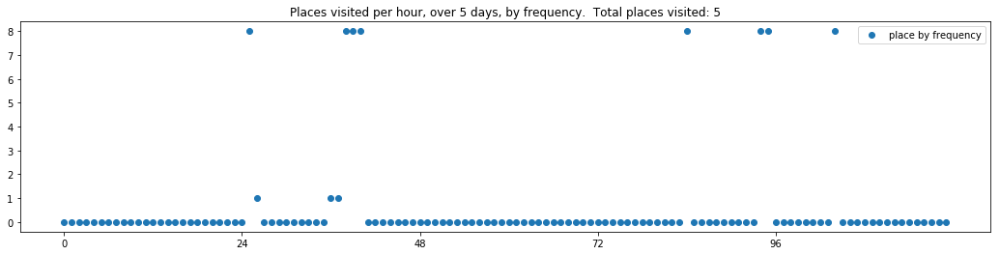

----- vector ----
prefix labels:  [281, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 214, 0, 140, 434, 434, 434, 434, 434, 0, 0, 140, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


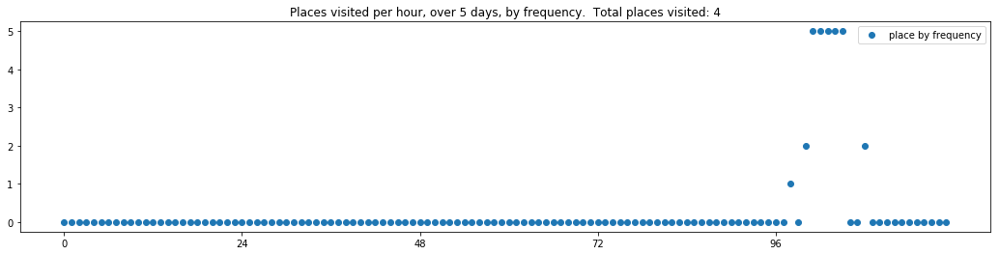

In [88]:
# Inspect the trajectories in these eval files

sample_size = 10

seqgan_generated = []

for eval_num in sorted(eval_filenames.keys()):
    filename = eval_filenames[eval_num]
    print('\n------\n',eval_num, filename, '\n------\n')
    seqgan_generated = read_trajectories_from_file(filename)
    for tv in seqgan_generated[:sample_size]:
        print_dwell_vector_by_days(tv)
        plot_trajectory_vector_frequencies(tv, by_frequency_order=False) 
        

Load and inspect trajectories generated by the textgenrnn model

In [8]:
sample_size = 20

showing sample of trajectories from output with temp 0.8
----- vector ----
prefix labels:  [392, 303]
[0, 0, 0, 0, 0, 0, 0, 0, 391, 0, 0, 0, 0, 0, 303, 303, 303, 303, 303, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 360, 0, 0, 0, 0, 0, 0, 0, 303, 303, 303, 303, 303, 303, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 303, 303, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


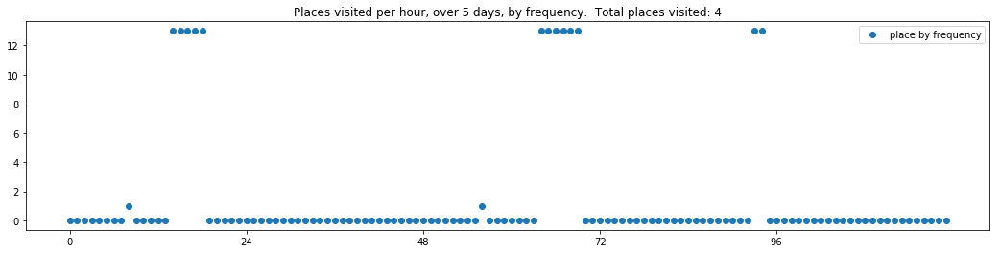

----- vector ----
prefix labels:  [375, 375]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375]
[375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375]
[375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375]
[375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375]
[375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375, 375]


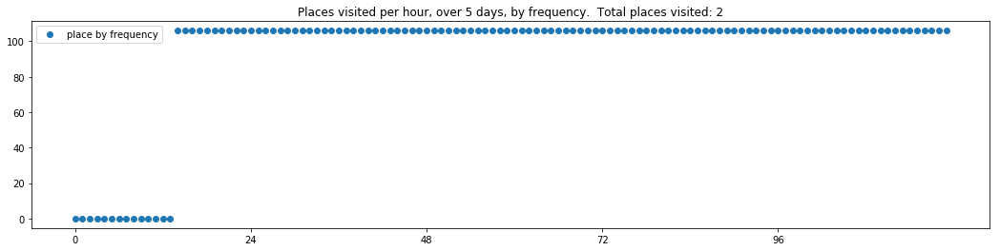

----- vector ----
prefix labels:  [69, 69]
[0, 0, 0, 0, 0, 0, 0, 0, 198, 198, 198, 198, 69, 0, 198, 198, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 69, 69, 69, 69, 69, 69, 69, 69, 0, 0, 0, 0, 0, 0, 0, 0, 0]


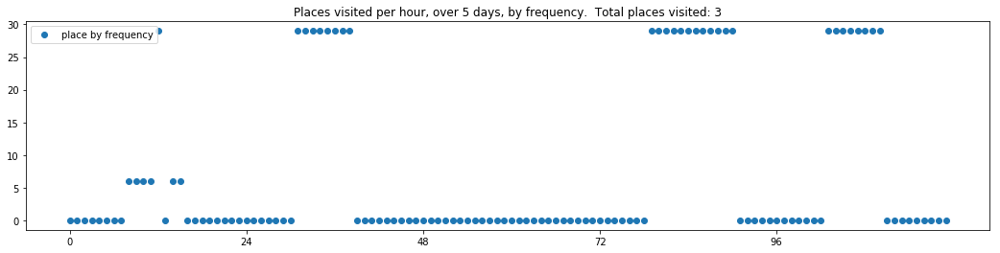

----- vector ----
prefix labels:  [191, 191]
[0, 0, 0, 0, 0, 0, 0, 191, 191, 191, 191, 191, 191, 191, 191, 191, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 191, 191, 191, 191, 191, 191, 191, 191, 191, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 191, 191, 191, 191, 191, 191, 191, 191, 191, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 191, 191, 191, 191, 191, 191, 191, 191, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 191, 191, 191, 191, 191, 191, 191, 191, 191, 191, 191, 191, 191, 191, 191, 191, 191]


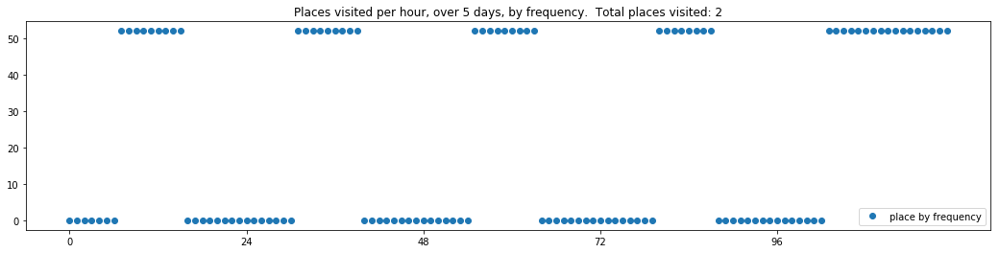

----- vector ----
prefix labels:  [181, 181]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 181, 181, 181, 181, 0, 0, 181, 181, 181, 181, 181, 181, 181, 181]
[181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181, 181]


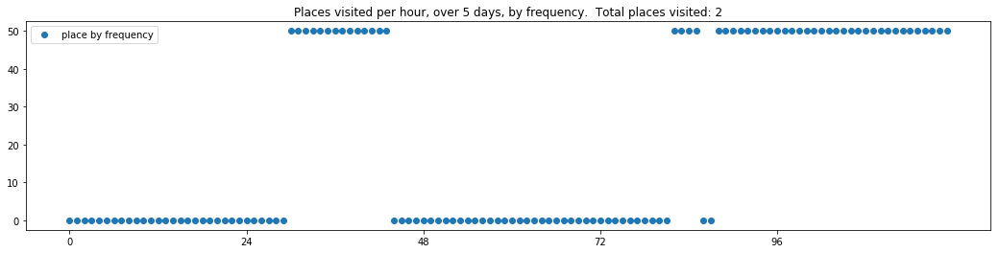

----- vector ----
prefix labels:  [321, 295]
[0, 0, 0, 0, 0, 0, 0, 0, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 321, 321, 321, 321, 321, 321]
[321, 321, 321, 321, 321, 321, 321, 321, 295, 295, 295, 621, 295, 295, 295, 295, 295, 321, 321, 321, 321, 321, 321, 321]
[321, 321, 321, 321, 321, 321, 321, 321, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 321, 321, 321, 321, 321]
[321, 321, 321, 321, 321, 321, 321, 321, 295, 295, 295, 295, 295, 295, 295, 295, 295, 321, 321, 321, 321, 321, 321, 321]
[321, 321, 321, 321, 321, 321, 321, 321, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 321, 321, 321, 321, 321]


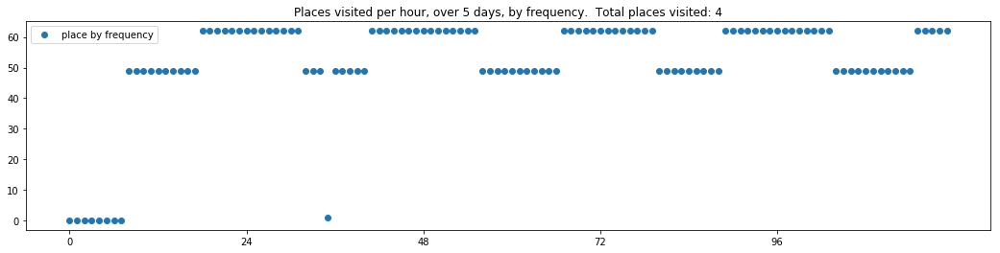

----- vector ----
prefix labels:  [645, 485]
[0, 0, 0, 0, 0, 0, 0, 0, 485, 485, 485, 485, 485, 485, 485, 485, 485, 485, 261, 261, 645, 645, 645, 645]
[645, 645, 645, 645, 645, 645, 645, 645, 485, 485, 485, 485, 485, 485, 485, 485, 485, 485, 645, 645, 645, 645, 645, 645]
[645, 645, 645, 645, 645, 645, 645, 645, 485, 485, 485, 485, 485, 485, 485, 485, 485, 485, 645, 261, 261, 645, 645, 645]
[645, 645, 645, 645, 645, 645, 645, 645, 485, 485, 485, 485, 485, 485, 485, 485, 485, 485, 485, 485, 485, 0, 645, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


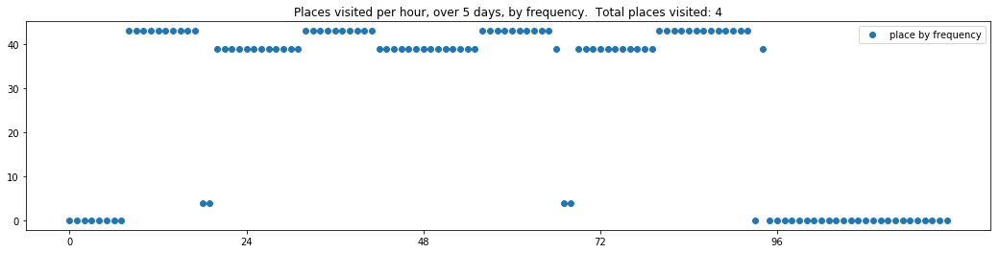

----- vector ----
prefix labels:  [386, 386]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 386, 386, 386, 386, 386, 386, 386, 386, 386, 22, 22, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 386, 386, 386, 386, 386, 386, 386, 386, 386, 20, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


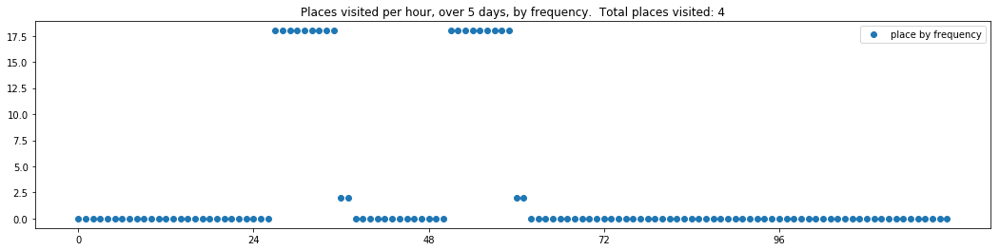

----- vector ----
prefix labels:  [86, 86]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86]
[86, 86, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86]
[86, 86, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


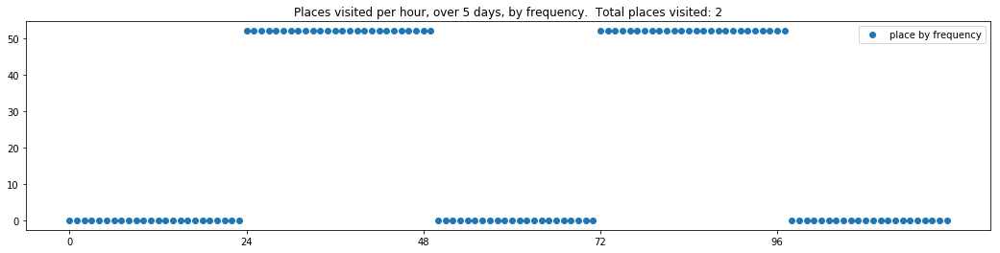

----- vector ----
prefix labels:  [65, 65]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 65, 65, 65, 65, 65, 65, 65, 0, 0, 0, 0]
[0, 0, 0, 0, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 0, 0, 0, 0, 0, 0]
[21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 162, 162, 0, 0, 0, 0]


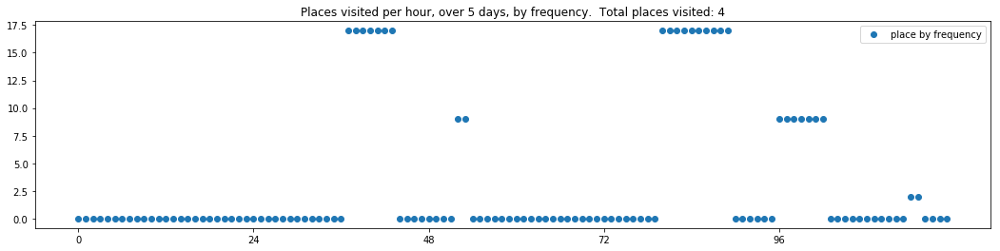

----- vector ----
prefix labels:  [6, 6]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 6, 6, 6, 6, 6, 6, 6]
[6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 0, 0, 0, 0, 0, 6, 6, 6, 6, 6, 6, 6, 6]
[6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 0, 6, 6, 0, 0, 0, 6, 6, 6, 6, 6, 6, 6]
[6, 6, 6, 6, 0, 0, 0, 0, 6, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 0, 0]


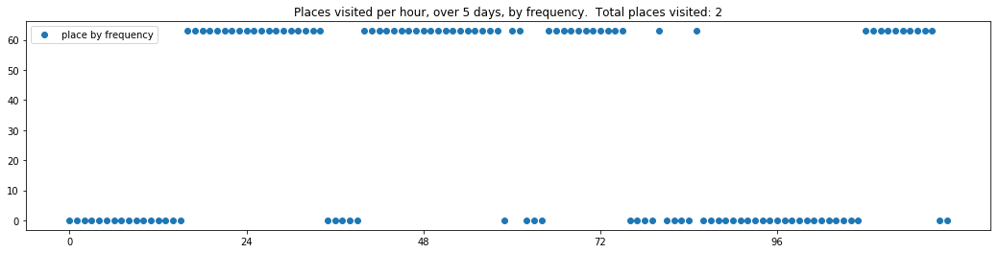

----- vector ----
prefix labels:  [306, 306]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


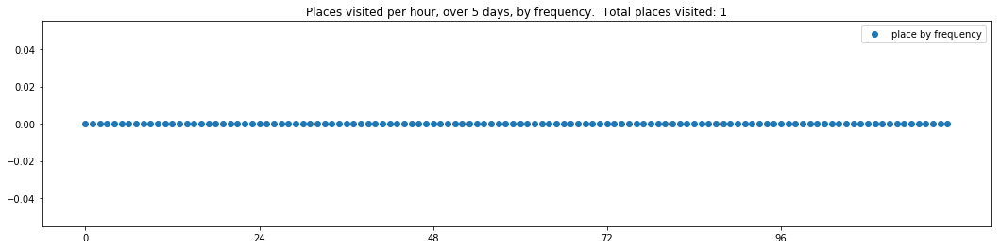

----- vector ----
prefix labels:  [185, 185]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 185, 185, 185, 185, 185, 185, 185, 185, 185, 185, 181, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 185, 185, 185, 185, 185, 185, 185, 185, 185, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 185, 185, 185, 185, 185, 185, 185, 185, 185, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 185, 185, 185, 185, 185, 185, 185, 185, 185, 0, 0, 0, 0, 0, 0]


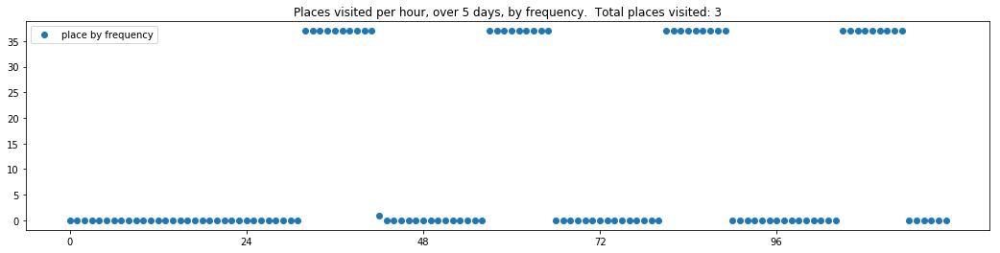

----- vector ----
prefix labels:  [269, 269]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 0, 0, 0, 0, 0, 0, 0, 625, 0, 0, 269, 269, 269]
[269, 269, 269, 269, 269, 269, 269, 269, 269, 269, 269, 269, 0, 0, 8, 0, 0, 0, 0, 8, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 625, 625, 0, 8, 8, 8, 8, 8, 0, 8, 8, 0, 0, 269]
[269, 269, 0, 0, 0, 0, 0, 0, 0, 0, 269, 0, 0, 0, 0, 0, 0, 0, 0, 0, 269, 269, 269, 269]
[269, 269, 269, 269, 269, 269, 269, 269, 0, 0, 269, 269, 0, 0, 0, 0, 0, 0, 0, 8, 0, 0, 0, 0]


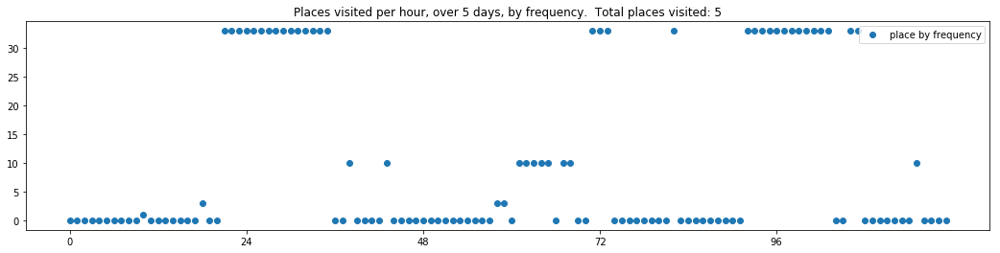

----- vector ----
prefix labels:  [378, 378]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


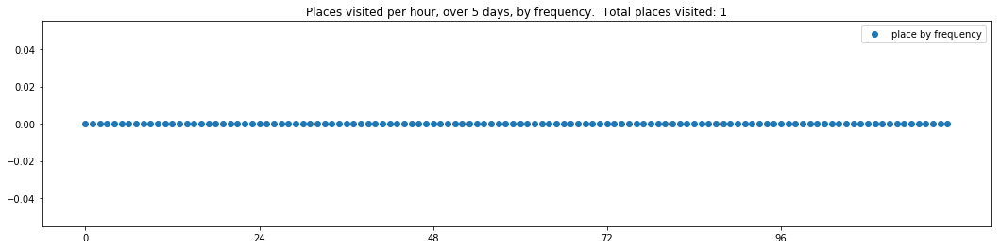

----- vector ----
prefix labels:  [578, 578]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 578, 578]
[578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578]
[578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 578, 167, 0, 578, 578, 578, 578]
[578, 578, 578, 578, 578, 578, 578, 578, 391, 391, 391, 0, 578, 578, 578, 578, 578, 391, 391, 578, 578, 578, 578, 578]


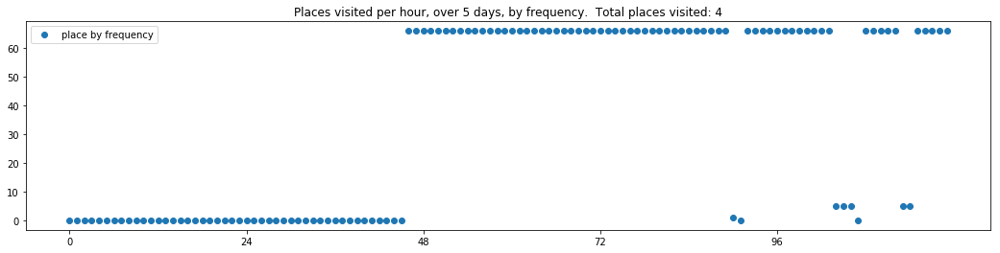

----- vector ----
prefix labels:  [237, 79]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 79, 79, 79, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 79, 79, 79, 79, 79, 79, 79, 79, 237, 237, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 89, 89]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 79, 79, 79, 79, 79, 79, 79, 79, 358, 89, 89]
[89, 89, 89, 89, 89, 89, 89, 89, 89, 89, 89, 89, 0, 79, 79, 79, 79, 79, 79, 79, 79, 0, 0, 0]


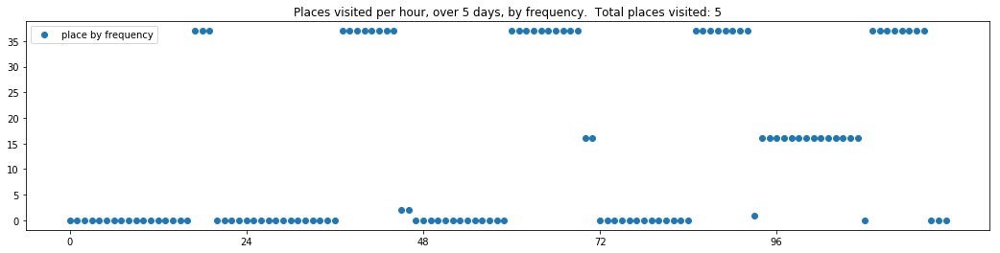

----- vector ----
prefix labels:  [390, 390]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 194, 0, 390, 390, 390, 390, 390]
[390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390]
[390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 0, 0, 0, 0, 0, 0, 0, 390, 390, 390, 390, 390]
[390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 390, 0, 0, 0, 0, 271, 0, 0, 0, 0, 0, 0, 520]
[520, 520, 520, 520, 520, 520, 520, 520, 520, 520, 520, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 520]


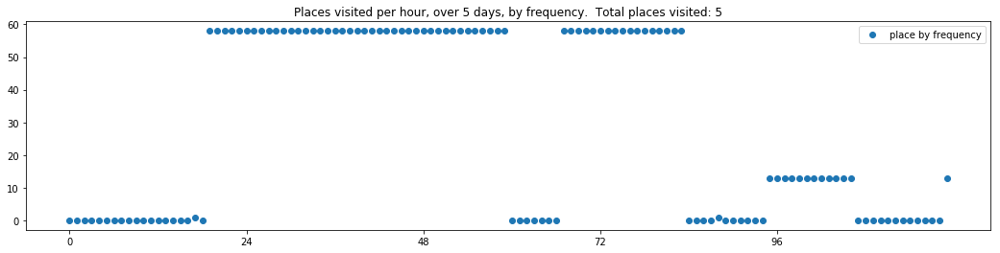

----- vector ----
prefix labels:  [101, 101]
[0, 0, 0, 0, 0, 0, 0, 101, 101, 101, 101, 179, 179, 179, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101]
[101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 0, 0, 101, 101, 101, 101, 101]
[101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 179, 101, 101, 101, 101, 101, 0, 0, 411, 0, 0, 0, 0]
[101, 101, 101, 101, 101, 101, 101, 101, 101, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


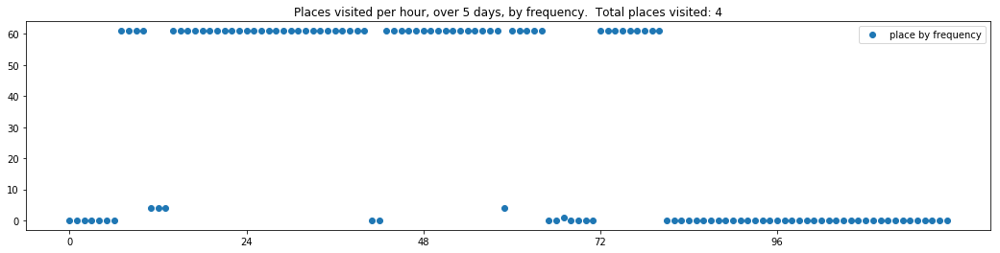

----- vector ----
prefix labels:  [47, 47]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 47, 47, 47, 47, 47, 47, 47, 47, 47]
[47, 47, 47, 47, 47, 47, 47, 47, 0, 0, 0, 0, 0, 0, 0, 0, 0, 47, 47, 47, 47, 47, 47, 47]
[47, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 47, 47, 47, 47, 47, 47, 47]
[47, 47, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 47, 47, 47, 47, 47, 47, 47]
[47, 47, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 47, 47, 47]


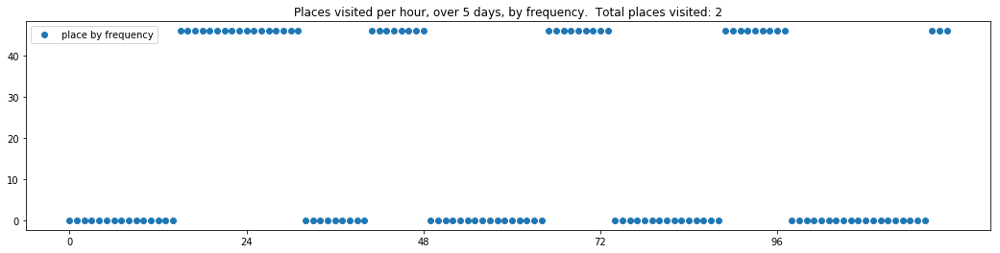

showing sample of trajectories from output with temp 0.9
----- vector ----
prefix labels:  [401, 401]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 0, 0, 0, 0, 0, 0, 0, 401, 401, 401, 401]


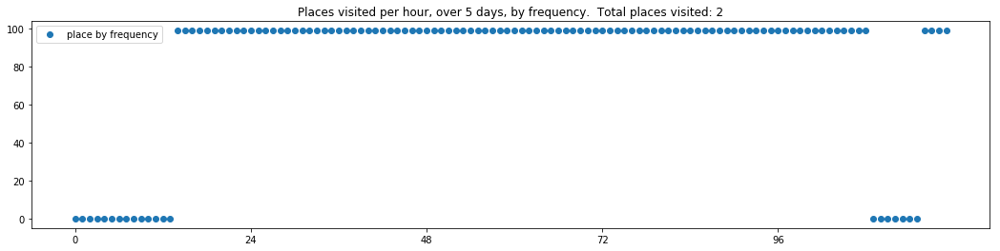

----- vector ----
prefix labels:  [401, 401]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 401, 401, 401, 401, 401, 401, 0, 0, 0, 401, 401, 401, 401]
[401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 401, 0, 401, 0, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 401, 401, 401, 401, 401, 0, 0, 0, 0, 401, 0, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]


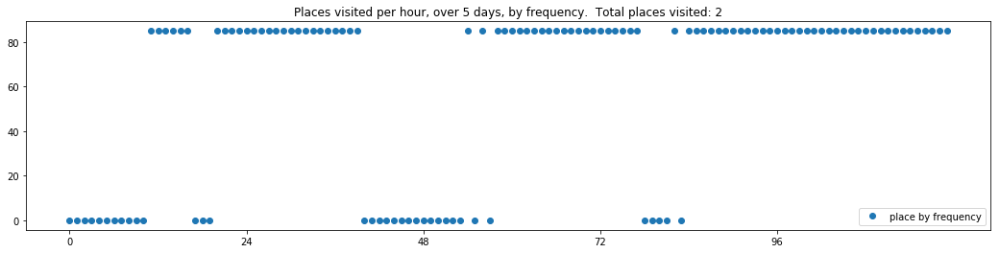

----- vector ----
prefix labels:  [372, 372]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 234, 234, 456, 456, 456, 527, 527, 527, 527, 527, 527, 527, 527, 527]


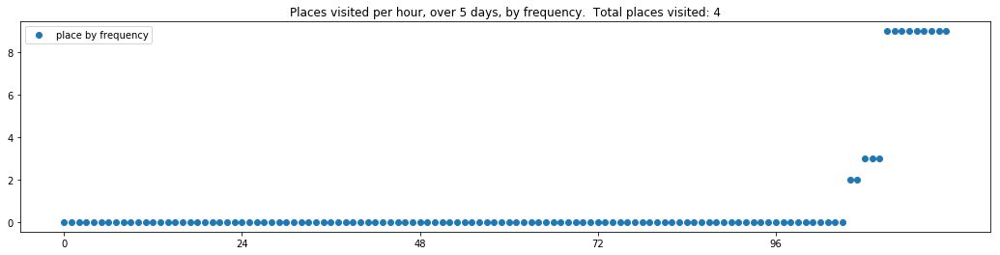

----- vector ----
prefix labels:  [14, 14]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 14, 14, 14, 14, 14, 14, 14, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14]
[14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 0, 14, 14, 14]
[14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 0, 0, 14, 14, 14]


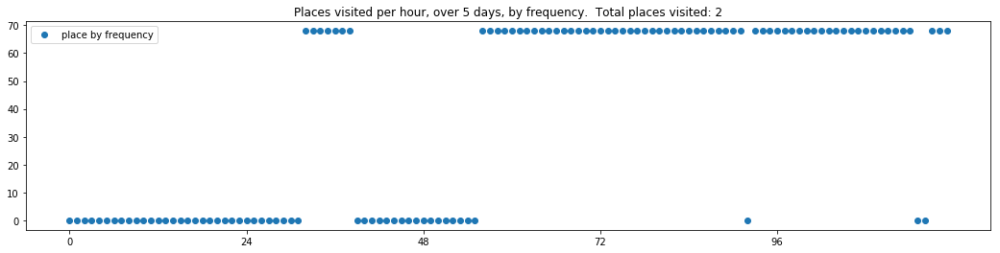

----- vector ----
prefix labels:  [583, 583]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 583, 583, 583, 583, 583]
[583, 583, 583, 583, 583, 583, 583, 583, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 535, 583, 583, 583]
[583, 583, 583, 583, 583, 583, 583, 583, 583, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 583, 583, 583, 583, 583]
[583, 583, 583, 583, 583, 583, 583, 583, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 583, 583, 0, 583]
[583, 583, 583, 583, 583, 583, 583, 583, 583, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 583, 583, 583, 583, 583]


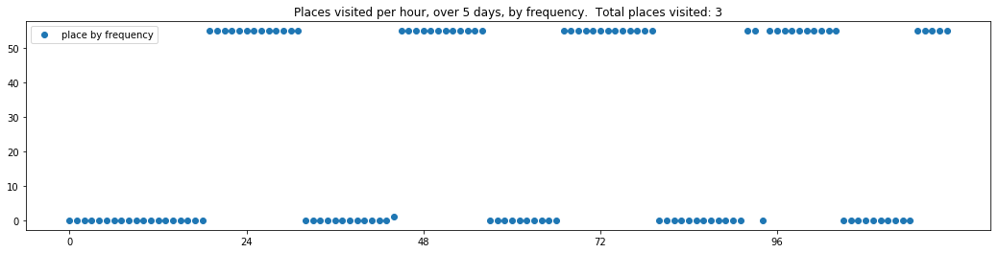

----- vector ----
prefix labels:  [78, 22]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 22, 22, 22, 78, 78, 78, 78, 78]
[78, 78, 78, 78, 78, 78, 0, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 78, 78, 78]
[78, 78, 78, 78, 78, 78, 0, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 0, 78, 78, 78, 78, 78]
[84, 84, 78, 78, 78, 78, 0, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 78, 78, 78, 78]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 78, 78, 78, 22, 22, 22, 22, 22, 22, 22, 22, 22, 78, 78, 395]


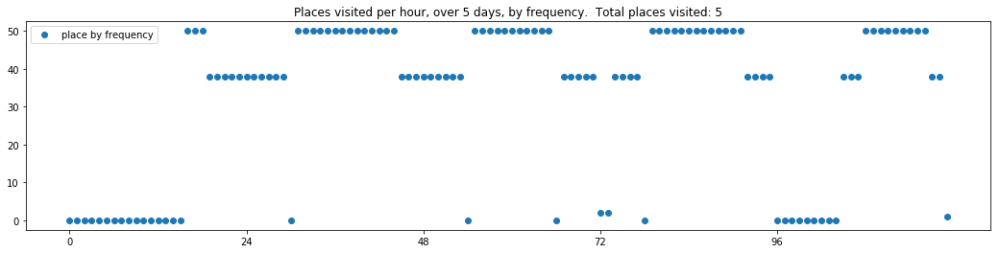

----- vector ----
prefix labels:  [474, 474]
[0, 0, 0, 0, 0, 0, 0, 474, 474, 474, 474, 474, 474, 474, 474, 474, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 120, 0, 0, 434, 434, 0, 0, 0, 120, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


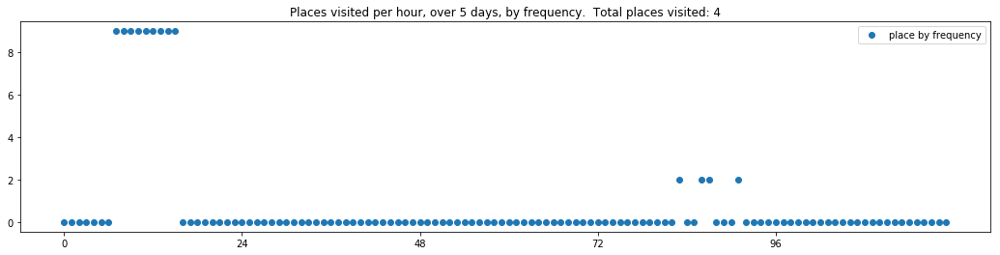

----- vector ----
prefix labels:  [341, 341]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 341, 0, 0, 341, 341, 341, 341]
[341, 341, 341, 341, 341, 341, 341, 0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 341, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 341, 341, 341, 341, 341, 341, 341, 341]
[341, 341, 341, 341, 341, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


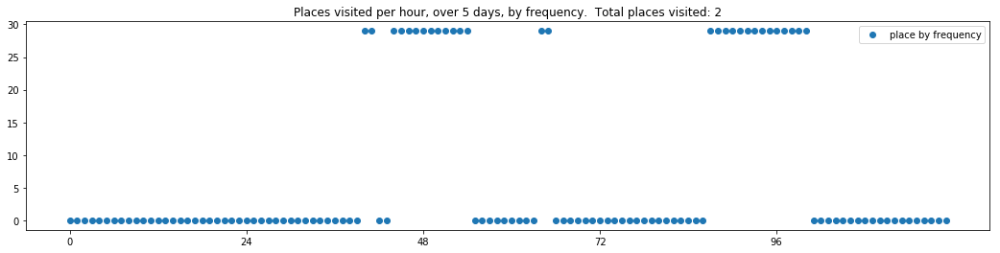

----- vector ----
prefix labels:  [4, 4]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4]
[4, 4, 4, 4, 4, 4, 4, 50, 50, 178, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 0, 0, 334, 557, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 318, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


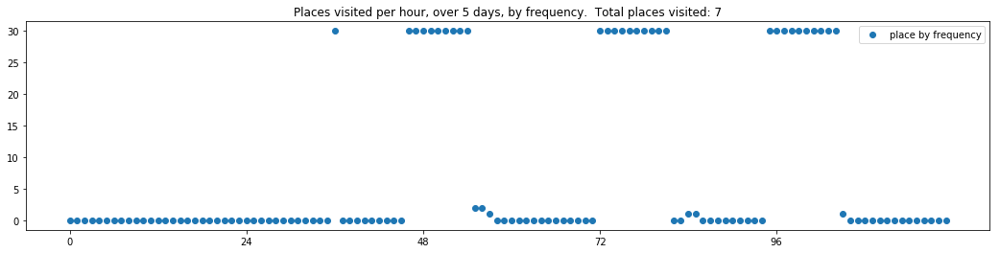

----- vector ----
prefix labels:  [393, 297]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 297, 297, 297, 297, 297, 297, 0, 0, 0, 0, 0, 393]
[393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 0, 0, 297, 297, 297, 0, 0, 0, 0, 482, 482, 359]
[393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 393, 0, 393, 0, 0, 297, 297, 297, 297, 297, 297, 297, 297, 297]
[297, 0, 0, 0, 393, 0, 0, 0, 0, 0, 0, 0, 0, 297, 297, 297, 297, 0, 0, 0, 0, 0, 475, 612]


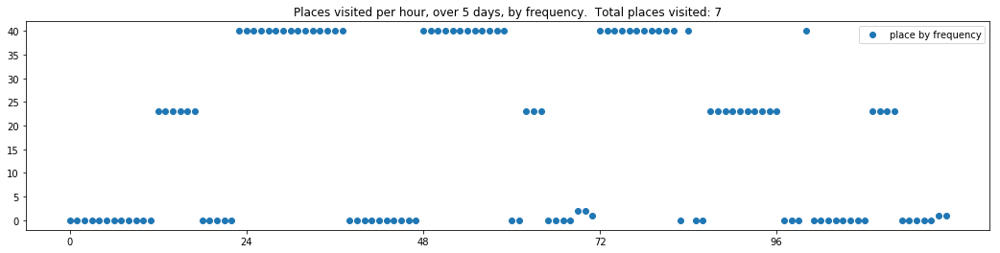

----- vector ----
prefix labels:  [373, 100]
[0, 0, 0, 0, 0, 0, 0, 0, 100, 100, 100, 100, 185, 185, 0, 0, 641, 641, 0, 0, 0, 373, 373, 0]
[0, 0, 0, 0, 0, 0, 0, 495, 0, 0, 0, 0, 100, 100, 100, 100, 100, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 185, 185, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 185, 185, 185, 185, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 185, 185, 0, 185, 185, 185, 185, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


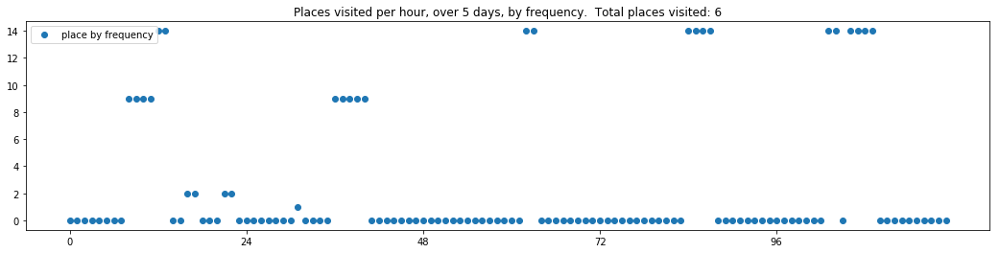

----- vector ----
prefix labels:  [16, 4]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 16, 16, 16, 16]
[16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 17, 17, 88, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 165, 0, 4, 4, 4, 151, 259, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 88, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 55, 55, 0, 0, 115, 0, 0, 590, 0, 0, 0, 0, 0, 0, 0]


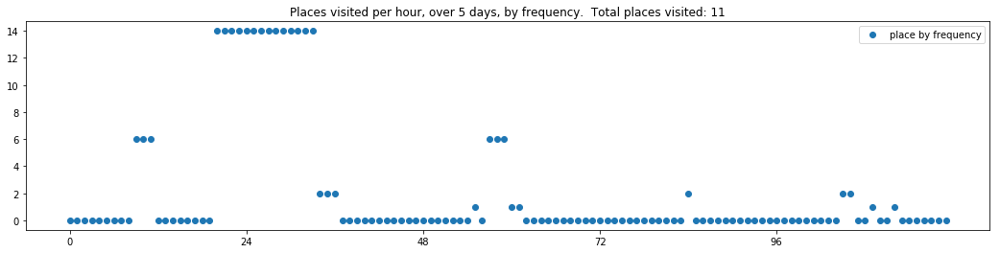

----- vector ----
prefix labels:  [225, 225]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


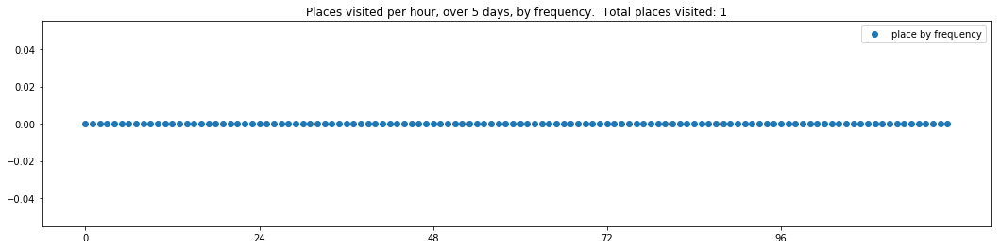

----- vector ----
prefix labels:  [548, 548]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 548, 548, 0, 0, 0, 0, 0, 0, 0, 548, 548]
[548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 0, 0, 0, 0, 0, 548, 0, 0, 548, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 548, 548, 548, 548, 548, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 548, 0, 0, 0, 0, 0, 0, 0, 548, 548, 548, 548, 548]


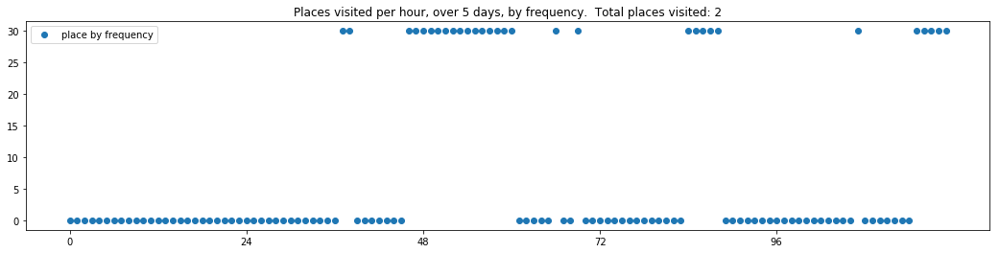

----- vector ----
prefix labels:  [45, 45]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 45, 45, 45, 45, 45, 45]
[45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45]
[45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45]
[45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45]
[45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 0, 0, 0, 0, 0, 0, 0, 0, 0]


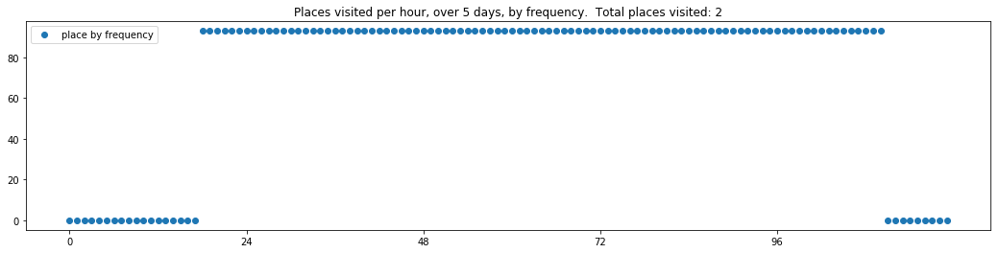

----- vector ----
prefix labels:  [161, 161]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 161, 161, 161, 161, 161, 161, 161]
[161, 161, 161, 161, 161, 161, 161, 0, 161, 0, 0, 0, 0, 0, 0, 0, 0, 161, 161, 161, 161, 161, 161, 161]
[161, 161, 161, 161, 161, 161, 161, 161, 161, 0, 0, 0, 0, 0, 0, 0, 0, 0, 161, 161, 161, 161, 161, 161]
[161, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161]
[161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161, 161]


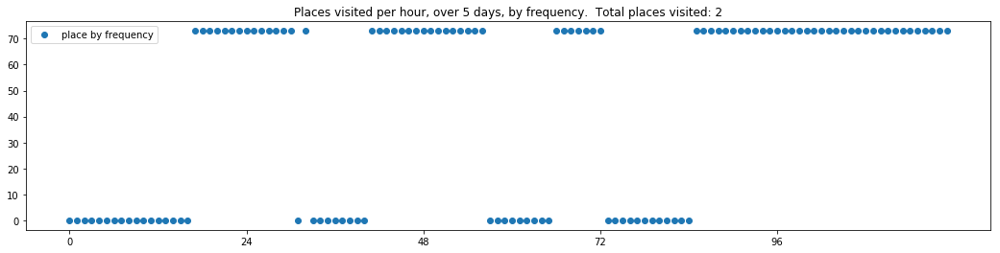

----- vector ----
prefix labels:  [422, 422]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 422, 422, 422, 422, 422]
[422, 422, 422, 422, 422, 422, 422, 422, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 422, 422]
[422, 0, 0, 0, 0, 0, 0, 0, 0, 423, 423, 423, 423, 423, 423, 423, 423, 0, 0, 422, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 422]
[422, 422, 0, 0, 422, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 422, 422, 422, 422, 422]


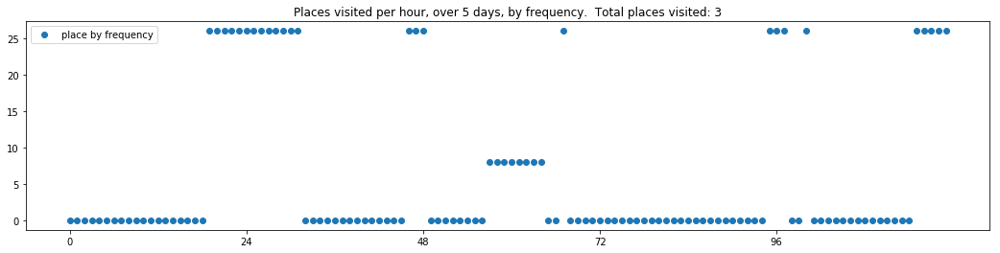

----- vector ----
prefix labels:  [47, 47]
[0, 0, 0, 0, 0, 0, 0, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 47, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 47, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


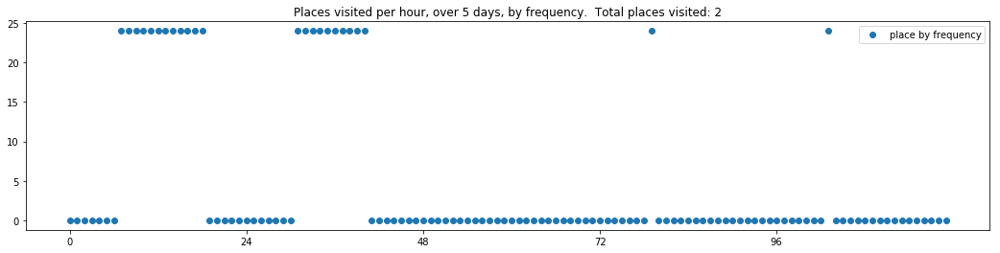

----- vector ----
prefix labels:  [577, 577]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 577, 577, 577, 577, 577, 577, 577, 577, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 577, 577, 577, 577, 577, 577, 577, 577, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 577, 577, 577, 577, 577, 577, 577, 577, 577, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


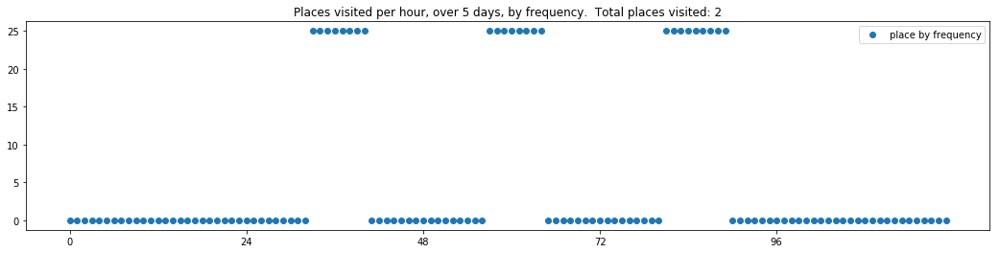

----- vector ----
prefix labels:  [546, 546]
[0, 0, 0, 0, 0, 0, 0, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546]
[546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 0, 546, 546, 546, 546, 546]
[546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 546, 0, 546, 546, 546, 0, 0, 546, 546, 546]
[546, 546, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 205, 0, 0, 0, 0, 0, 546, 546, 546, 546]


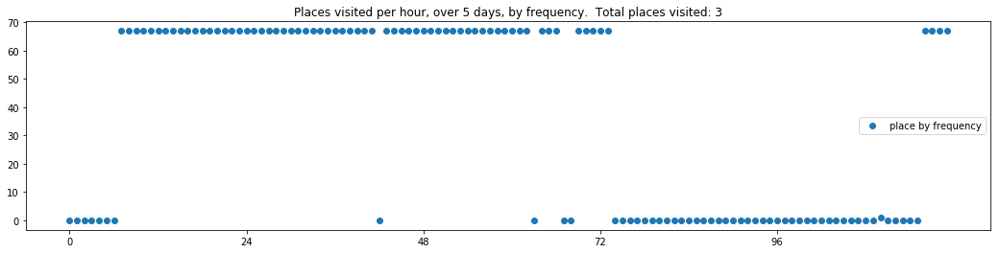

showing sample of trajectories from output with temp 1.0
----- vector ----
prefix labels:  [266, 266]
[0, 0, 0, 0, 0, 266, 266, 266, 266, 266, 266, 266, 266, 0, 0, 231, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266]
[266, 266, 266, 266, 266, 0, 266, 266, 0, 0, 247, 0, 0, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266]
[266, 0, 0, 0, 0, 0, 553, 553, 553, 284, 284, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266]


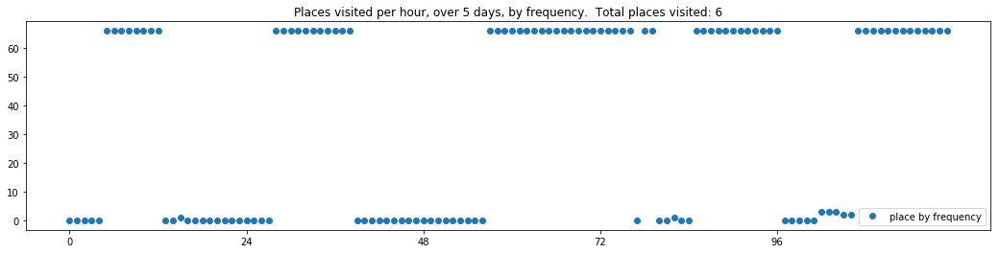

----- vector ----
prefix labels:  [158, 401]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 158, 160, 160, 158, 158, 158]
[158, 158, 158, 158, 158, 158, 158, 158, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 160, 158, 158]
[158, 158, 158, 158, 158, 158, 158, 158, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 158, 158, 158]
[158, 158, 158, 158, 158, 158, 158, 158, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 158, 158, 158, 158, 158, 158, 158, 158, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 158, 158, 158]


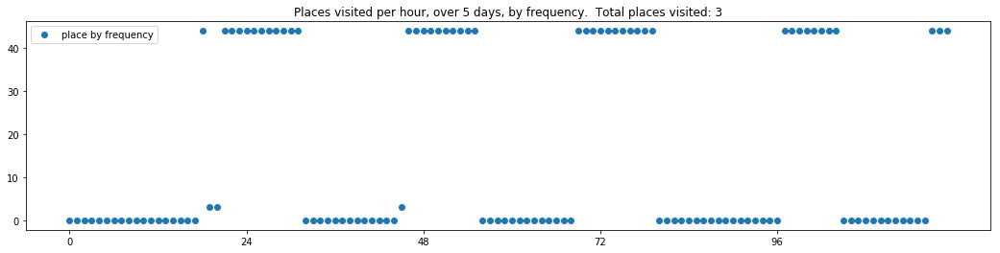

----- vector ----
prefix labels:  [229, 229]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 229, 229, 229, 114, 114, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 114, 114, 114, 114, 229, 229, 229, 229, 229, 229, 229, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 0, 0, 0, 114, 114, 114, 114, 114, 114, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 0, 0, 0, 0, 0, 0, 0, 0, 114, 114, 114, 271, 288, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 114, 114, 114, 0, 0, 0, 271, 271, 307, 271, 271, 271, 271, 271, 271, 271, 271]


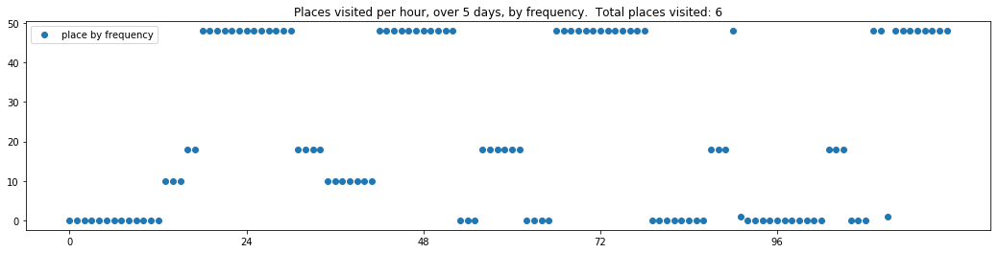

----- vector ----
prefix labels:  [335, 183]
[0, 0, 0, 0, 0, 0, 0, 183, 183, 183, 183, 183, 183, 183, 183, 183, 0, 335, 335, 335, 335, 335, 335, 335]
[335, 335, 335, 335, 335, 335, 335, 183, 183, 183, 183, 183, 183, 183, 183, 335, 335, 335, 335, 373, 373, 335, 335, 335]
[335, 335, 335, 335, 335, 335, 335, 335, 183, 183, 183, 183, 183, 183, 183, 335, 335, 335, 335, 335, 335, 335, 335, 335]
[335, 335, 335, 335, 335, 335, 335, 335, 335, 183, 183, 183, 183, 183, 183, 335, 335, 335, 335, 335, 335, 335, 335, 335]
[335, 335, 335, 335, 335, 335, 335, 335, 183, 183, 183, 183, 183, 183, 183, 183, 335, 335, 335, 335, 335, 335, 335, 335]


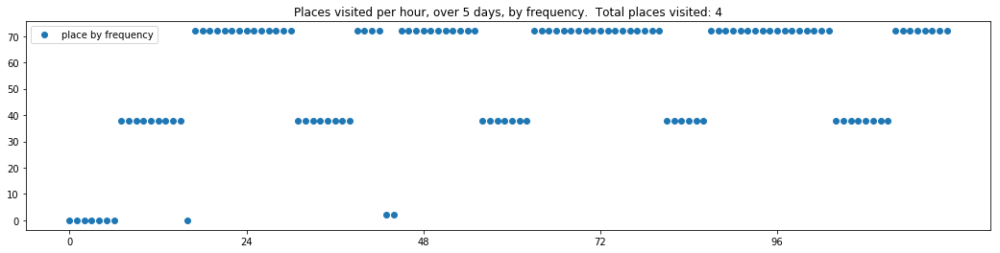

----- vector ----
prefix labels:  [162, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 70, 70, 70, 70, 70, 70, 70, 70, 0, 186, 186, 186, 186, 186, 186, 186, 186, 186]
[186, 186, 186, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 186, 186, 186, 186, 186, 186, 32, 186, 186]
[186, 186, 186, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 186]


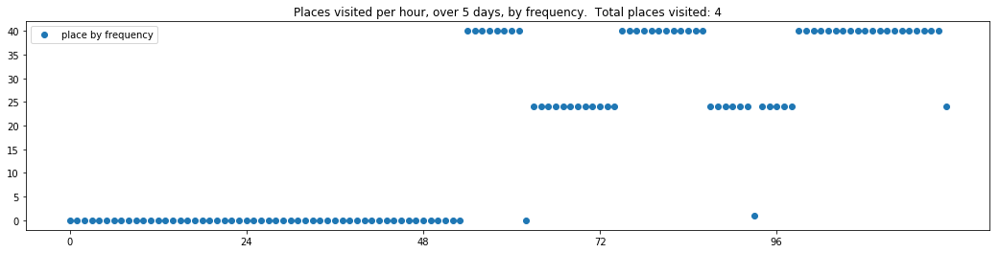

----- vector ----
prefix labels:  [79, 79]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 401, 401, 79, 79, 79, 79, 79, 79]
[79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 6, 6, 79, 79, 79, 79]
[79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


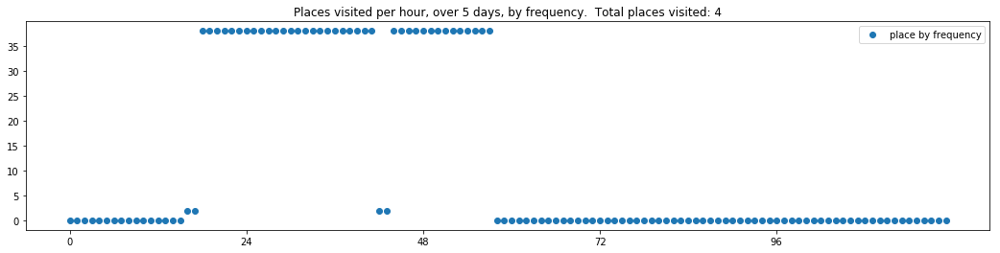

----- vector ----
prefix labels:  [237, 568]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 568, 568, 568, 247, 247, 247, 568, 568, 0, 237, 237, 237]
[237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 568, 568, 568, 568, 568, 568, 568, 568, 0, 237, 237, 237]
[237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 568, 247, 568, 546, 286, 0, 286, 147, 147, 147, 536, 536]
[237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 568, 568, 568, 568, 568, 568, 568, 237, 237, 237, 237, 237]


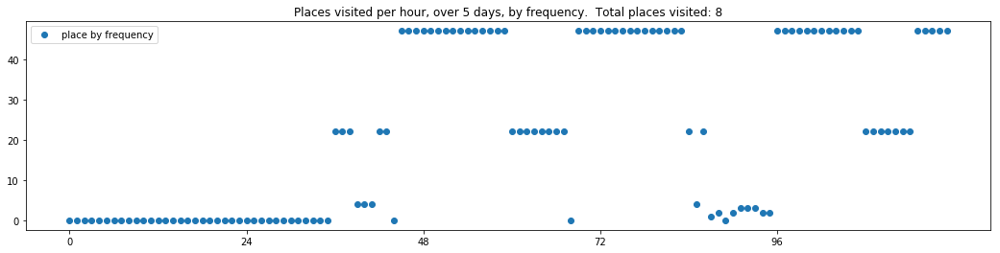

----- vector ----
prefix labels:  [102, 102]
[0, 0, 0, 0, 0, 0, 0, 102, 0, 390, 0, 0, 0, 0, 0, 0, 102, 102, 102, 102, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 102, 102, 102, 102, 102, 102, 102]
[102, 102, 102, 102, 102, 102, 0, 390, 390, 390, 390, 390, 390, 390, 0, 0, 102, 102, 102, 102, 102, 102, 102, 102]
[102, 102, 102, 102, 102, 102, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 102, 102, 102, 102, 102, 102, 102, 102]
[102, 102, 102, 102, 102, 102, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 102, 102, 102, 102, 102, 102, 102, 102]


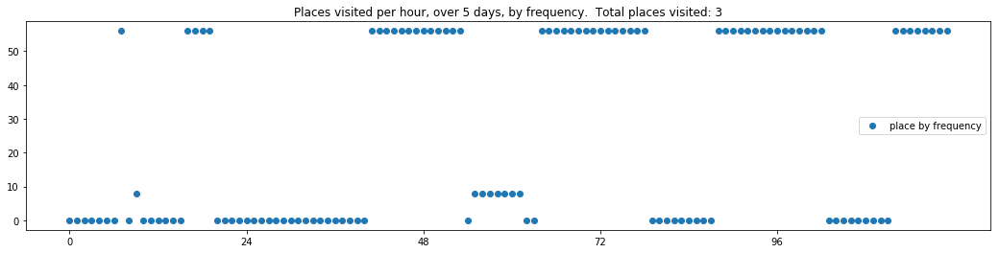

----- vector ----
prefix labels:  [21, 21]
[0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 8, 8, 8, 8, 21, 21]
[21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


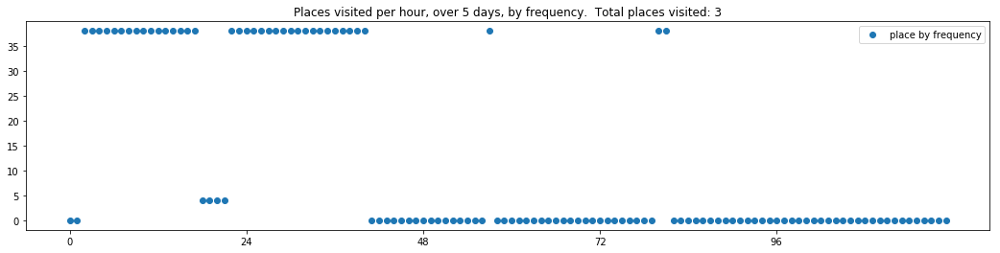

----- vector ----
prefix labels:  [289, 289]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 539, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289]
[289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 0, 0, 0, 0, 289, 289, 289]
[289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 431, 431, 431, 431, 431, 431, 431, 431, 431, 289, 289, 289, 289]
[0, 0, 0, 0, 0, 0, 0, 367, 396, 396, 396, 513, 513, 513, 0, 0, 289, 289, 289, 289, 289, 289, 289, 289]
[289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 431, 431, 0, 0, 0, 431, 0, 0, 0, 289, 173, 289, 289]


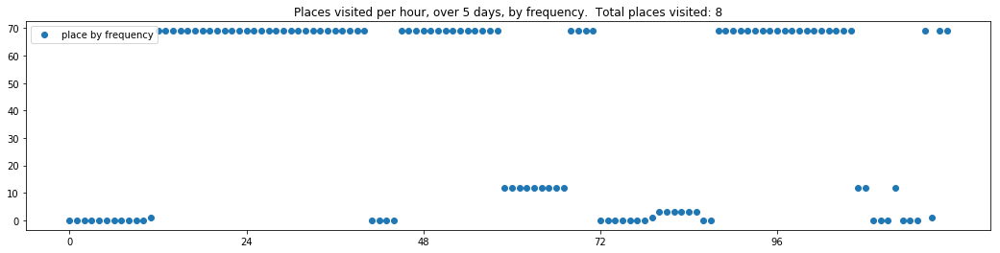

----- vector ----
prefix labels:  [615, 508]
[0, 0, 0, 0, 0, 0, 615, 615, 615, 615, 615, 615, 615, 615, 568, 568, 568, 568, 568, 0, 376, 376, 615, 615]
[615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 0, 479, 615, 615, 615, 615]
[615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 0, 162, 162, 162, 162, 162, 615, 479, 320, 320, 320]
[479, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 303, 479]
[479, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 454, 0, 162, 162, 162, 162, 59, 0, 479, 615, 615, 615]


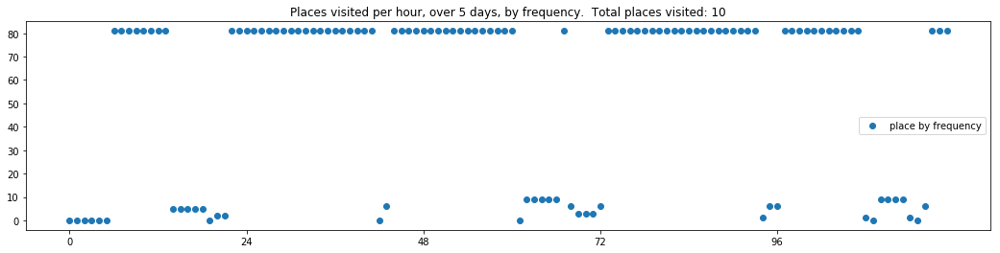

----- vector ----
prefix labels:  [474, 474]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 474, 474, 474, 474, 474]
[474, 474, 474, 474, 474, 474, 307, 307, 307, 69, 69, 74, 569, 21, 0, 0, 0, 0, 0, 307, 474, 474, 474, 474]
[474, 474, 474, 474, 474, 474, 0, 0, 98, 8, 474, 474, 21, 569, 474, 474, 474, 474, 474, 474, 474, 474, 474, 474]
[474, 474, 474, 474, 474, 474, 474, 0, 0, 8, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 474, 474]
[474, 474, 474, 474, 474, 474, 474, 474, 307, 375, 375, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 474, 474, 474]


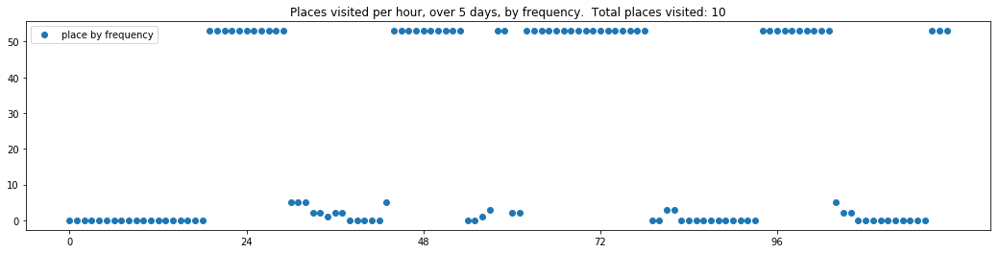

----- vector ----
prefix labels:  [22, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 22, 0, 22, 22]
[22, 0, 185, 185, 185, 185, 185, 185, 185, 185, 185, 185, 185, 185, 185, 0, 22, 22, 22, 22, 22, 22, 22, 22]
[22, 22, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22]
[22, 22, 22, 21, 21, 185, 185, 21, 21, 21, 21, 21, 21, 22, 0, 0, 22, 22, 22, 22, 22, 22, 22, 22]


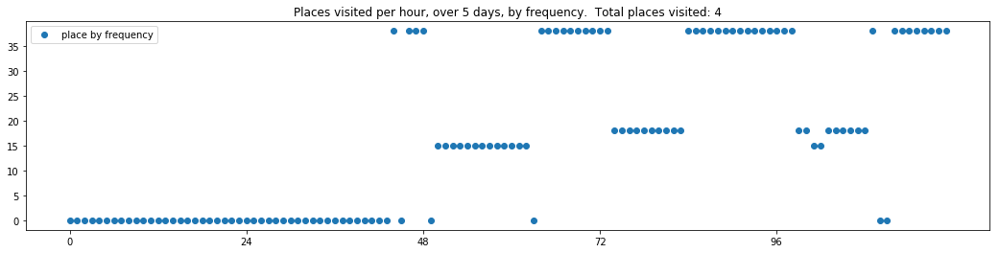

----- vector ----
prefix labels:  [232, 475]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 82, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 475, 475, 475, 475, 475, 475, 0, 0, 0, 0, 0, 232, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 475, 475, 475, 475, 0, 0, 0, 0, 0, 0, 0, 0, 518, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 475, 475, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 518, 187, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 518, 518, 0, 0, 0, 0]


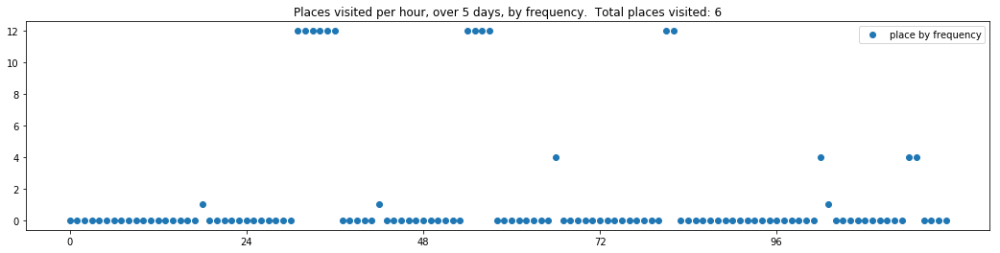

----- vector ----
prefix labels:  [25, 25]
[0, 0, 0, 0, 0, 0, 0, 25, 0, 0, 0, 0, 0, 25, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 25, 25, 25, 25]
[25, 25, 25, 25, 25, 25, 25, 25, 25, 0, 0, 0, 0, 0, 25, 25, 0, 0, 25, 25, 25, 25, 25, 25]
[25, 25, 25, 25, 25, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 25, 25, 25, 0, 0, 0, 0, 0, 25]
[25, 25, 25, 25, 25, 0, 0, 0, 0, 25, 25, 25, 25, 0, 0, 25, 25, 25, 25, 25, 25, 25, 25, 25]


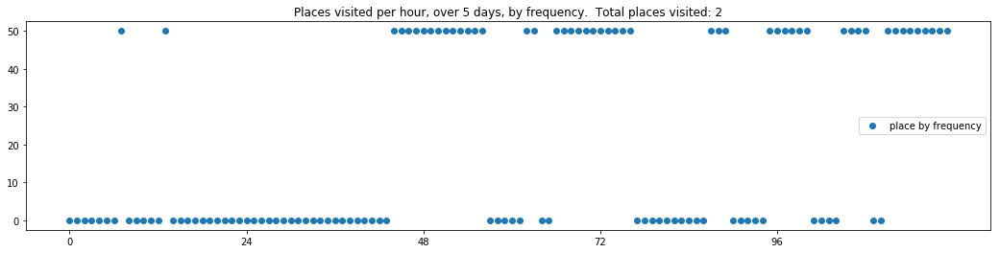

----- vector ----
prefix labels:  [358, 358]
[0, 0, 0, 0, 0, 0, 0, 0, 20, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 358, 358, 358, 358, 247, 247, 87, 358, 358, 358, 358, 358, 358, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 358, 358, 357, 0, 0, 0, 255, 358, 358, 358, 358, 358, 358, 358, 116, 116, 358, 358, 358, 358]
[358, 358, 358, 358, 358, 0, 0, 0, 0, 0, 0, 0, 358, 358, 358, 358, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 358, 0, 0, 0, 429, 0, 358, 358, 358, 358, 0, 0, 0, 0, 0, 0, 0, 0]


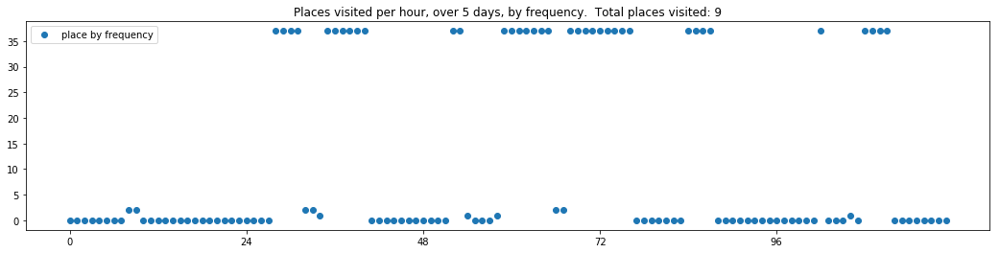

----- vector ----
prefix labels:  [457, 586]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 457, 457, 457]
[457, 457, 457, 457, 457, 457, 457, 0, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 0, 457]
[457, 457, 457, 457, 457, 457, 457, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 116, 2, 2]
[2, 401, 457, 457, 457, 457, 457, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 401, 2, 457]
[457, 457, 457, 457, 457, 457, 457, 457, 116, 116, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 586, 2, 2, 2]


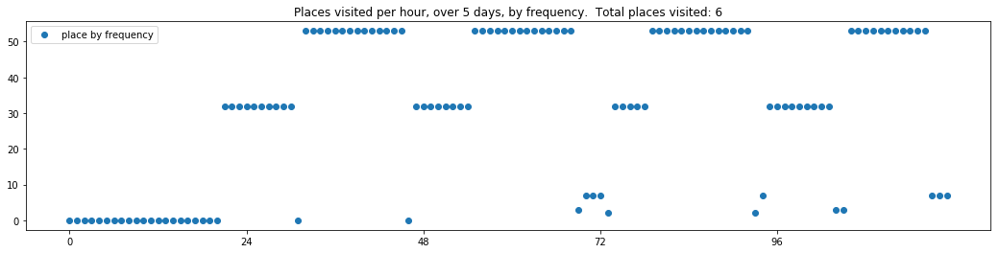

----- vector ----
prefix labels:  [289, 270]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 270, 270, 270, 270, 270, 270, 270, 270, 270, 289, 289, 289, 289, 289]
[289, 289, 289, 289, 289, 289, 289, 289, 289, 270, 270, 270, 270, 270, 270, 270, 270, 270, 289, 289, 289, 289, 289, 289]
[289, 289, 289, 289, 289, 289, 289, 289, 289, 270, 270, 270, 410, 163, 163, 163, 289, 289, 289, 289, 289, 0, 0, 289]
[289, 289, 289, 289, 289, 289, 289, 289, 289, 270, 270, 260, 260, 0, 0, 0, 0, 289, 289, 289, 289, 0, 0, 0]
[0, 0, 289, 289, 289, 289, 289, 289, 0, 387, 260, 260, 260, 260, 260, 0, 0, 289, 289, 289, 289, 289, 289, 289]


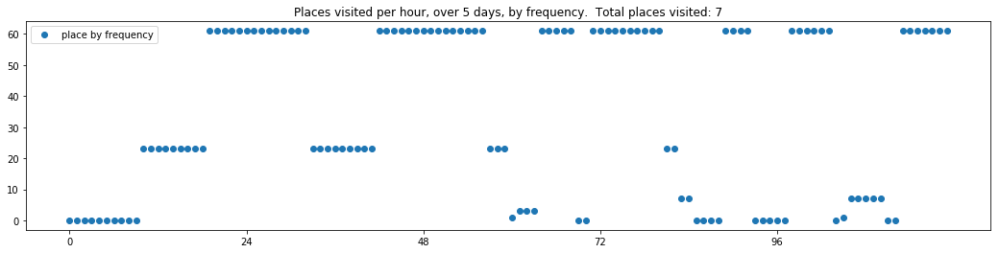

----- vector ----
prefix labels:  [50, 573]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 50, 50, 573, 573, 573, 573, 573, 50, 50, 50, 50, 50, 50, 50]
[50, 50, 50, 50, 50, 50, 50, 50, 50, 573, 573, 573, 573, 573, 573, 573, 573, 50, 50, 50, 50, 50, 50, 50]
[50, 50, 50, 50, 50, 50, 50, 50, 573, 573, 573, 573, 573, 573, 573, 573, 485, 485, 485, 485, 485, 485, 50, 50]
[50, 50, 50, 50, 50, 50, 50, 50, 50, 573, 573, 573, 573, 573, 573, 573, 485, 485, 485, 485, 485, 485, 50, 50]
[50, 50, 50, 50, 50, 50, 50, 50, 573, 573, 573, 573, 573, 573, 573, 573, 485, 485, 485, 485, 485, 485, 50, 50]


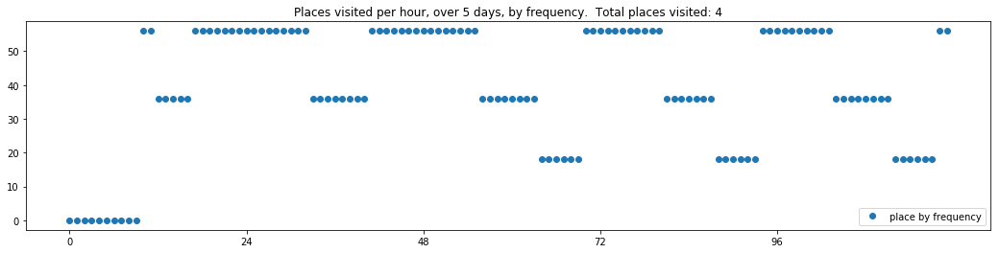

----- vector ----
prefix labels:  [39, 324]
[0, 0, 0, 0, 0, 0, 324, 324, 324, 324, 0, 0, 0, 0, 500, 500, 0, 39, 39, 39, 39, 39, 39, 39]
[39, 39, 39, 39, 39, 0, 324, 324, 324, 324, 324, 324, 0, 0, 0, 500, 39, 39, 39, 39, 39, 39, 39, 39]
[39, 39, 39, 39, 39, 324, 324, 324, 324, 0, 324, 324, 24, 0, 500, 500, 39, 39, 39, 39, 39, 39, 39, 39]
[39, 39, 39, 39, 39, 0, 324, 324, 324, 324, 324, 324, 0, 400, 500, 500, 0, 39, 39, 39, 39, 39, 39, 39]
[39, 39, 39, 39, 39, 0, 0, 0, 586, 586, 586, 324, 324, 324, 630, 630, 630, 39, 39, 39, 39, 39, 39, 39]


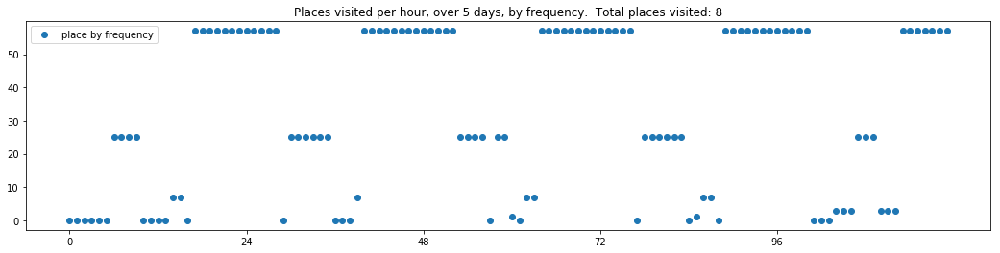

In [9]:
# These trajectories were generated randomly, without any prefix.  We inspect them to understand
# how the model replicated the data overall.

textgenrnn_all_trajectories_08_filename = '../textgenrnn_generator/output/generated-epochs:50:25-temperature:0.8-prefix:None-20191211.txt'
textgenrnn_all_trajectories_09_filename = '../textgenrnn_generator/output/generated-epochs:50:25-temperature:0.9-prefix:None-20191211.txt'
textgenrnn_all_trajectories_1_filename = '../textgenrnn_generator/output/generated-epochs:50:25-temperature:1.0-prefix:None-20191211.txt'

textgenrnn_all_trajectories_set = {
    0.8: read_trajectories_from_file(textgenrnn_all_trajectories_08_filename),
    0.9: read_trajectories_from_file(textgenrnn_all_trajectories_09_filename),
    1.0: read_trajectories_from_file(textgenrnn_all_trajectories_1_filename),
}

for (temp, trajectory_set) in textgenrnn_all_trajectories_set.items():
    print('showing sample of trajectories from output with temp %s' % temp)
    for tv in trajectory_set[:sample_size]:
        print_dwell_vector_by_days(tv)
        plot_trajectory_vector_frequencies(tv, by_frequency_order=False) 

In [10]:
# For these trajectories, we generated trajectories for each of the cambridge census tract areas as home labels.
# When comparing the real and generated output, only data with these home labels should be considered.

textgenrnn_cambridge_trajectories_08_filename = '../textgenrnn_generator/output/generated_trajectories_1_week_cambridge_temp_0.8.txt'
textgenrnn_cambridge_trajectories_09_filename = '../textgenrnn_generator/output/generated_trajectories_1_week_cambridge_temp_0.9.txt'
textgenrnn_cambridge_trajectories_1_filename = '../textgenrnn_generator/output/generated_trajectories_1_week_cambridge_temp_1.0.txt'

textgenrnn_cambridge_trajectories_set = {
    0.8: read_trajectories_from_file(textgenrnn_cambridge_trajectories_08_filename),
    0.9: read_trajectories_from_file(textgenrnn_cambridge_trajectories_09_filename),
    1.0: read_trajectories_from_file(textgenrnn_cambridge_trajectories_1_filename),
}

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


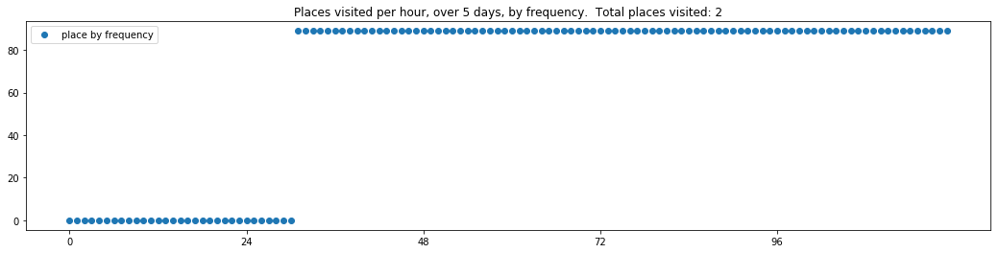

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 401, 401, 401, 401, 401, 401, 0, 401, 401, 401, 248, 248, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]


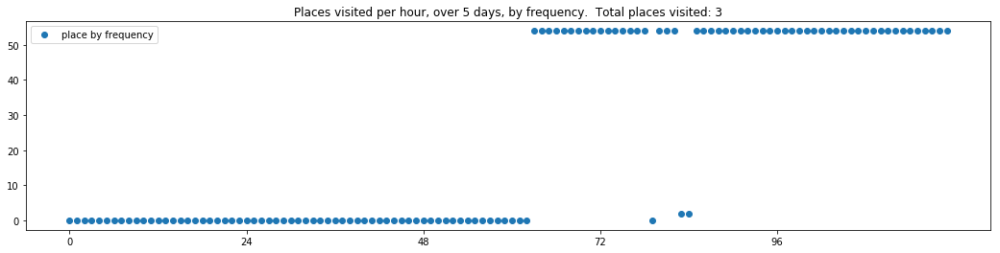

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 386, 386, 386, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 386, 386, 386, 386]
[386, 386, 386, 386, 386, 386, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 386, 386, 386, 386]


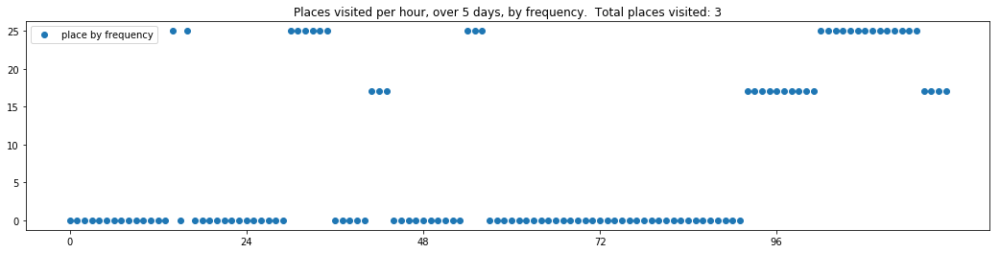

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


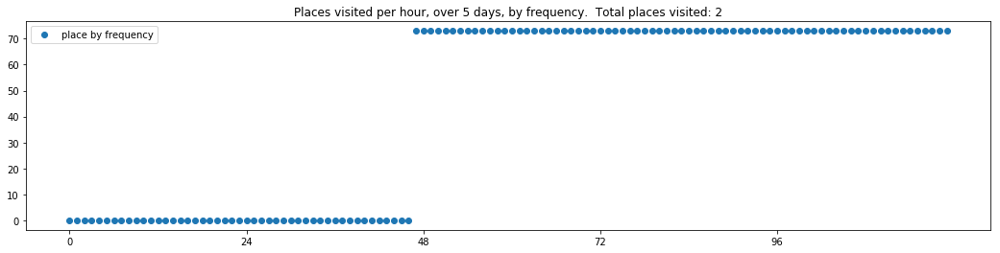

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 59, 10, 10, 0, 0, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 495, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


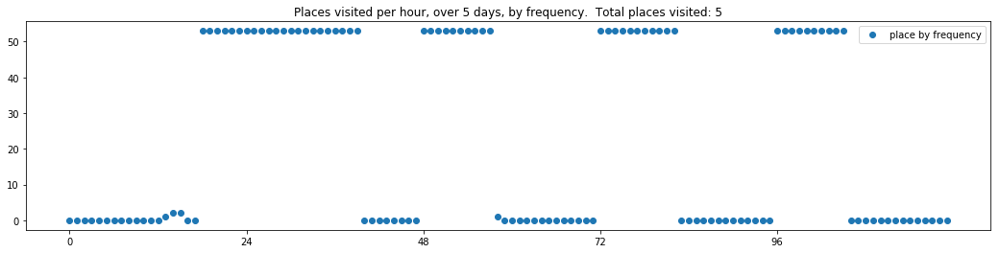

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558]
[558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558]


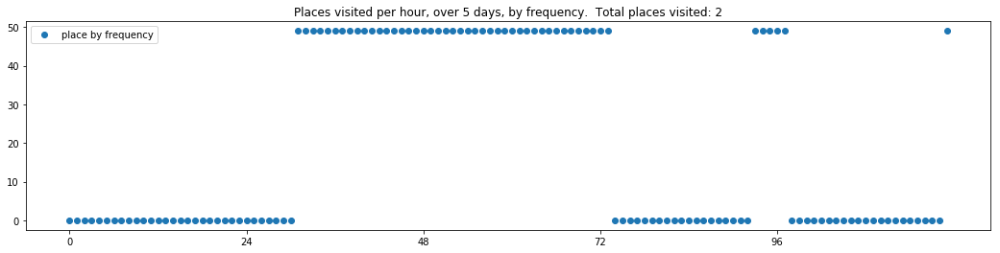

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


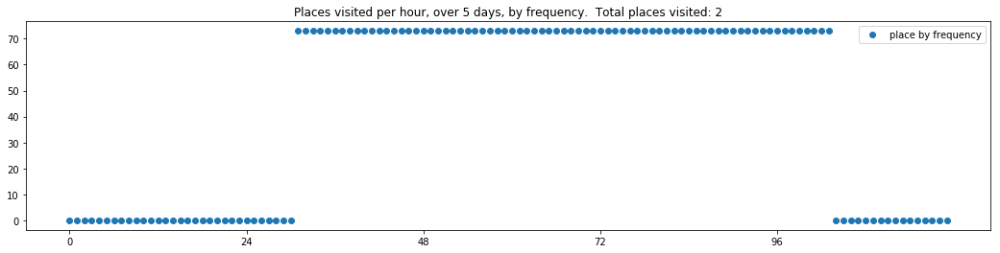

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


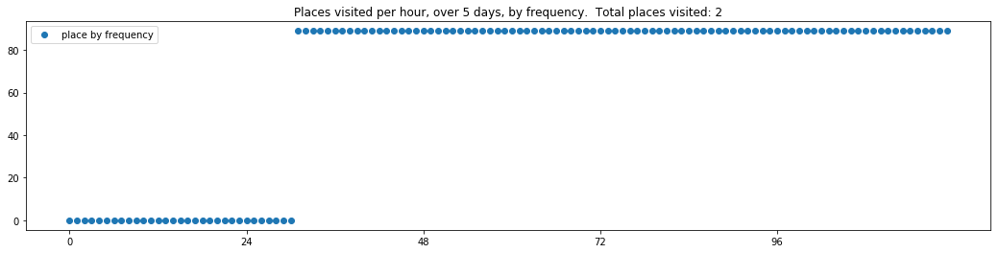

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


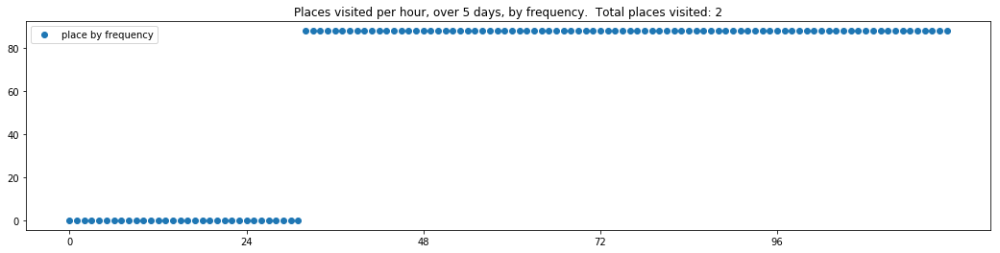

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 193, 461, 461, 461, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 558, 558, 450, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


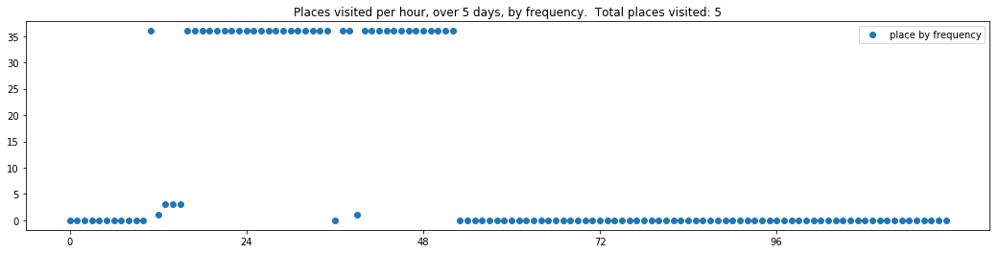

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


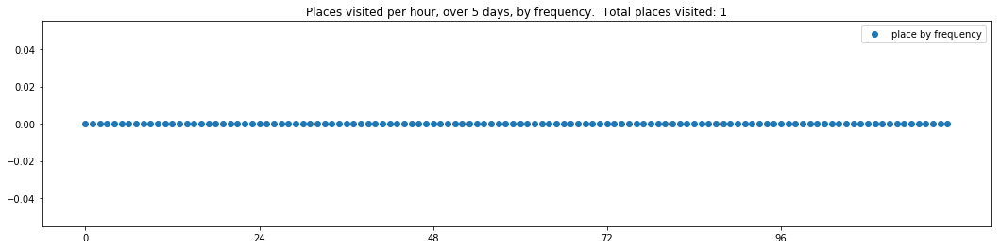

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


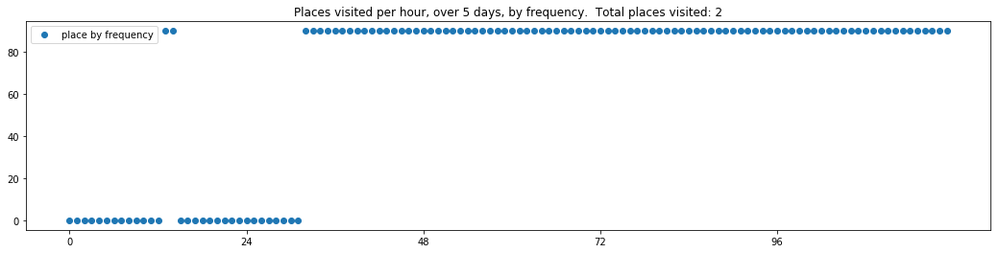

----- vector ----
prefix labels:  [558, 558]
[0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


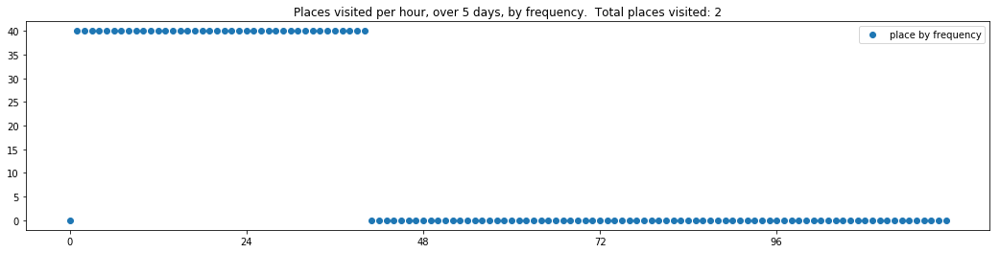

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 214]


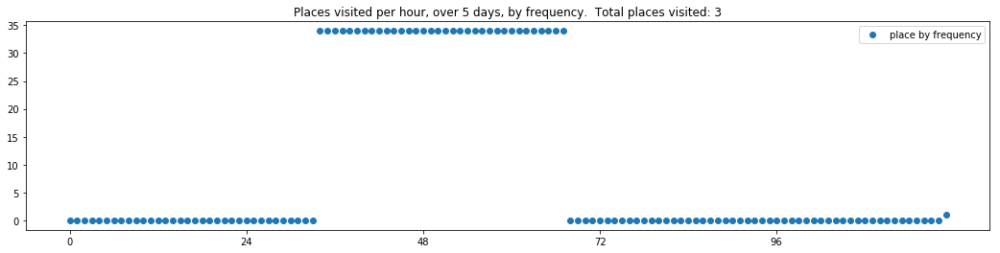

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 171, 171, 495, 558, 0, 373, 373, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 373, 373, 558, 558, 558, 558, 2, 2, 0, 0, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 2, 2, 2, 2]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0]


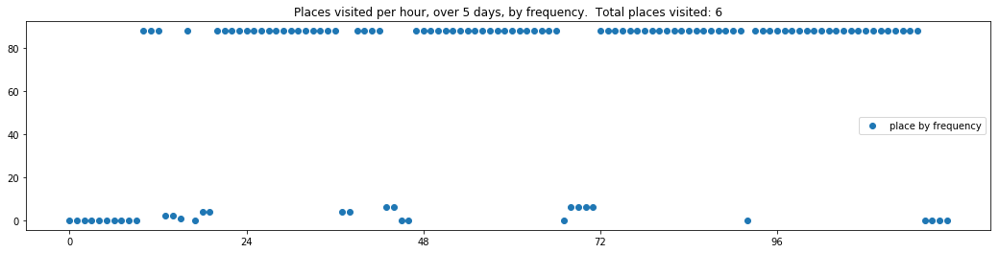

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 247, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 247, 0, 0, 0, 0, 0]


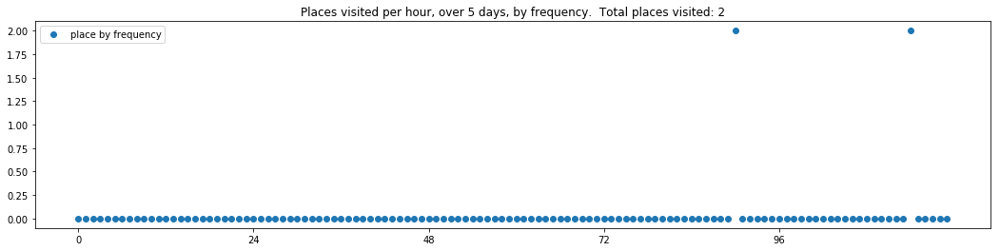

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0]


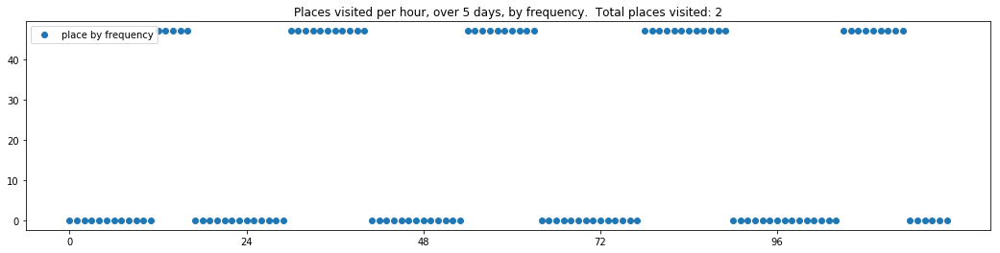

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


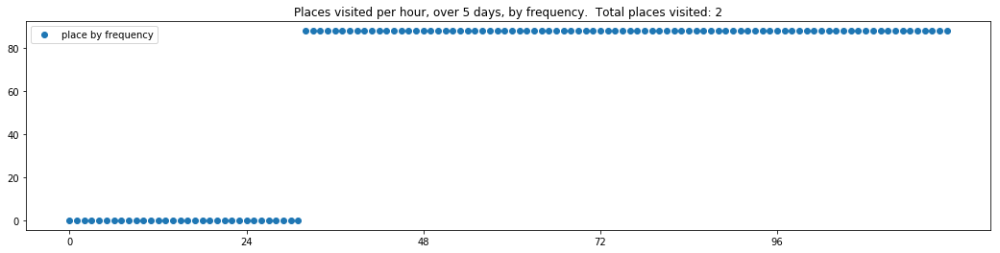

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 21, 21, 21, 21, 21, 21, 212, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 21, 21, 21, 21, 21, 21, 21, 21, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 21, 21, 21, 21, 21, 21, 21, 21, 21, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 485, 558, 558, 558, 558, 558, 184, 184, 184, 184, 184, 184, 558, 558]


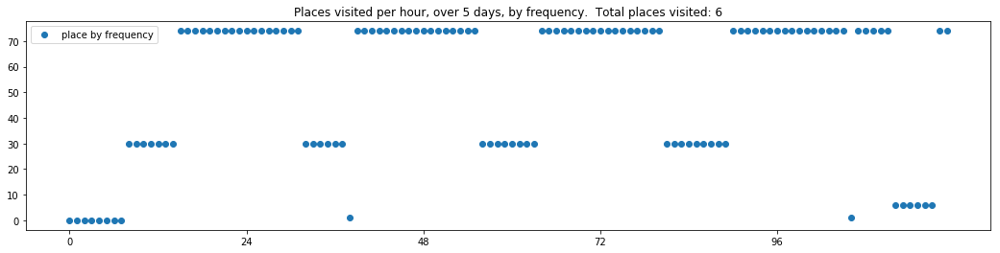

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 456, 0, 456]
[0, 0, 0, 0, 0, 0, 248, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 456, 456, 456, 0, 456]
[456, 456, 0, 456, 456, 535, 535, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 456, 456, 456, 456, 456]
[456, 456, 456, 456, 456, 456, 456, 456, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 456, 456, 456, 456, 456]
[456, 456, 456, 456, 456, 456, 456, 401, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 456, 456, 456, 456, 456, 456]


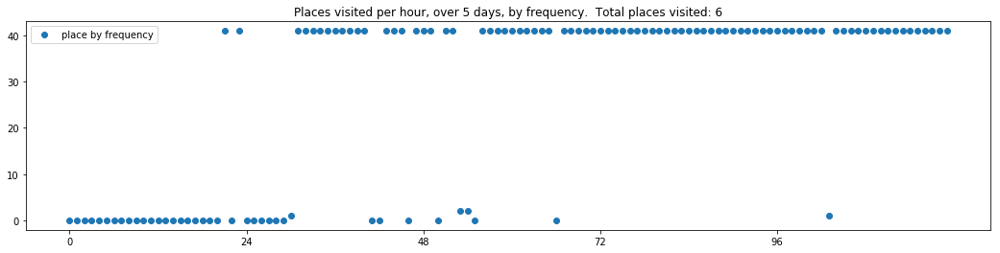

In [11]:
for tv in textgenrnn_cambridge_trajectories_set[0.8][:sample_size]:
    print_dwell_vector_by_days(tv)
    plot_trajectory_vector_frequencies(tv, by_frequency_order=False) 

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 8, 8, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 450, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 267, 212, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 0, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 558, 558, 558, 558, 558, 558, 558, 558, 558]


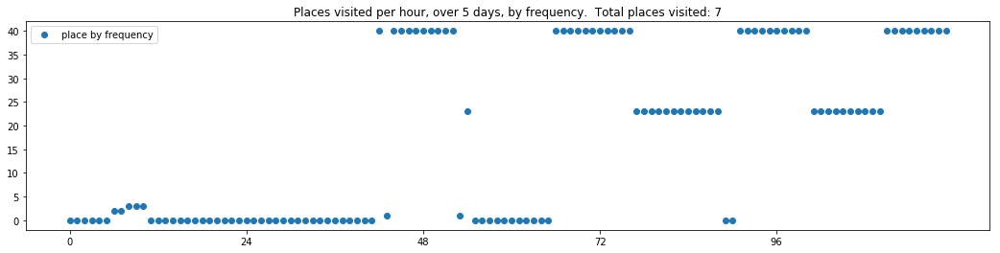

----- vector ----
prefix labels:  [558, 558]
[0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 558, 558, 0, 558, 558, 558, 558, 0, 0, 57]
[57, 57, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 558, 0, 558, 558, 0, 0, 0]
[0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 20, 20, 20, 0, 0, 0, 0, 637]
[637, 637, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


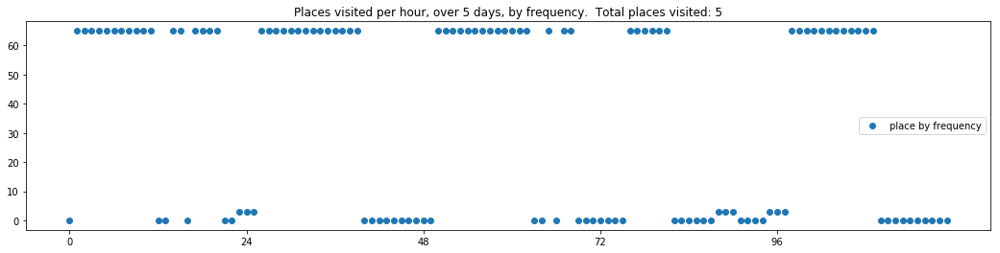

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 204, 204, 204, 151, 558, 558, 558, 558, 558, 448, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 497, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 0, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]


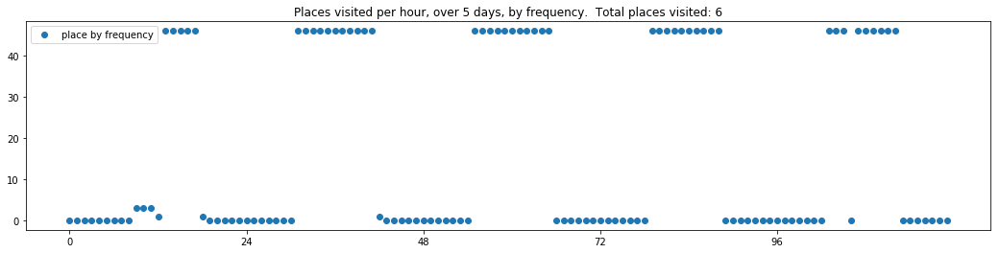

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 56, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


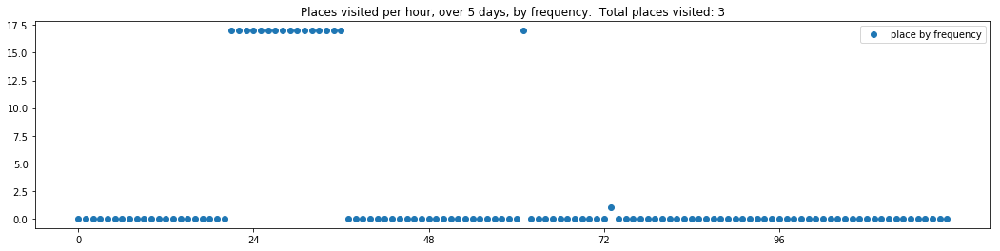

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 0, 0, 0, 558, 558, 558, 558, 132, 132, 373, 373, 373, 373, 373, 373]
[373, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 464, 464, 558, 558, 558, 0, 450, 450, 450, 450, 450, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 558, 558, 637, 637, 558, 558, 558, 558, 450, 566, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 558, 473, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0]


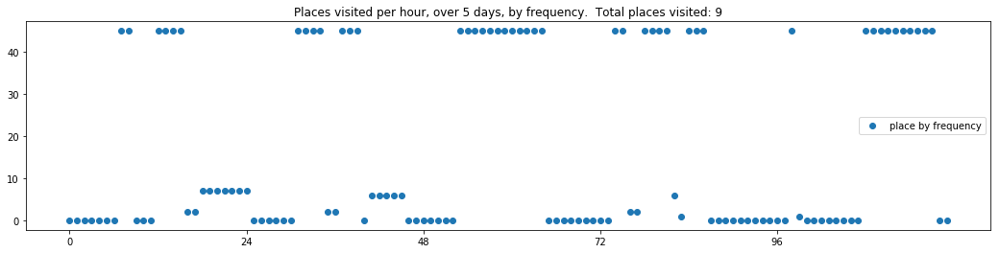

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 21, 21, 21, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 55, 55, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 55, 55, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


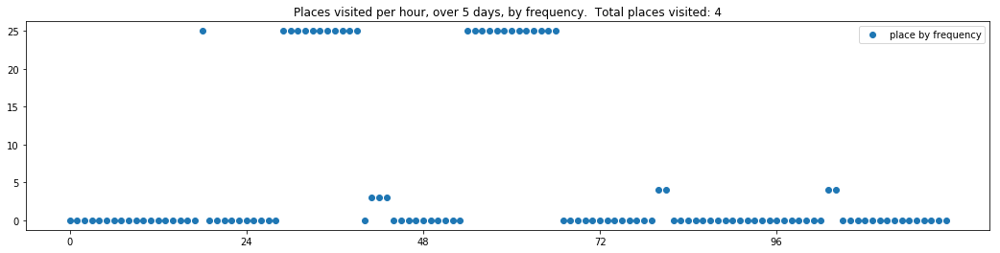

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 298, 298, 0, 0, 0, 0, 0, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 261, 373, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 97, 0, 473, 21, 97, 0, 0, 394, 495, 495, 495, 495, 0, 0, 0, 0, 0]
[558, 558, 558, 558, 558, 482, 558, 558, 558, 558, 558, 558, 228, 452, 452, 0, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 50, 50, 0, 0, 0, 495, 495, 495, 495, 495, 495, 558, 558, 558, 558]


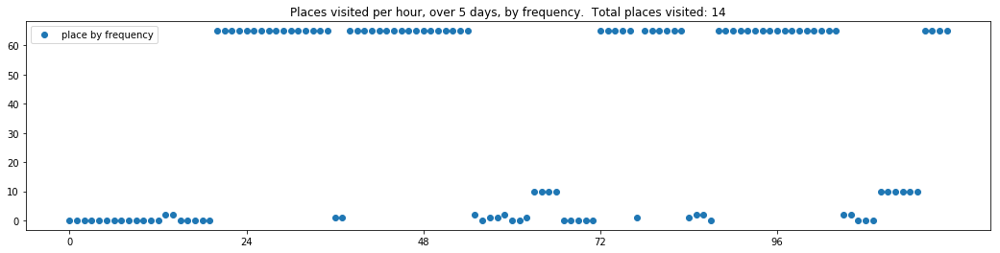

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 0, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 0, 0, 0, 0, 558, 558, 558, 0, 0, 0, 341, 341, 341, 0, 0]
[0, 0, 0, 341, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 0, 522, 0, 0, 0, 0, 341, 341]
[341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 341, 0, 0, 0, 0, 0, 0, 0, 341, 0]


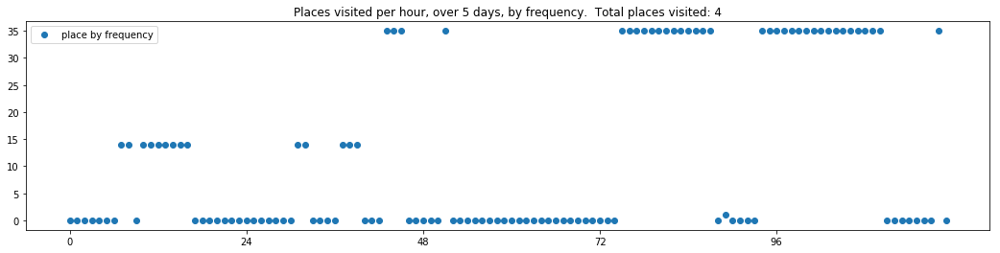

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 558, 450, 450, 450, 450, 450, 450, 450, 450, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 119, 119, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 119, 0, 0, 450, 450, 450, 450, 450, 450, 450, 450, 450, 119, 119, 119, 119, 119, 119, 119]
[119, 119, 119, 8, 8, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 315, 315, 315, 0]
[119, 119, 119, 227, 119, 267, 267, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


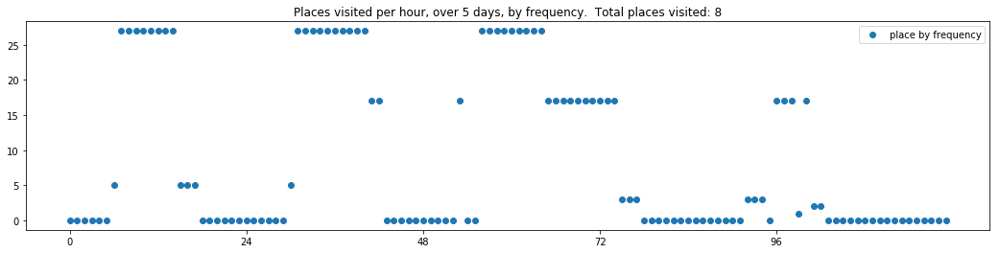

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 145, 576, 576, 576, 85, 0, 0]
[0, 0, 0, 0, 576, 576, 576, 576, 576, 576, 558, 558, 558, 558, 558, 558, 558, 558, 0, 576, 576, 85, 85, 0]


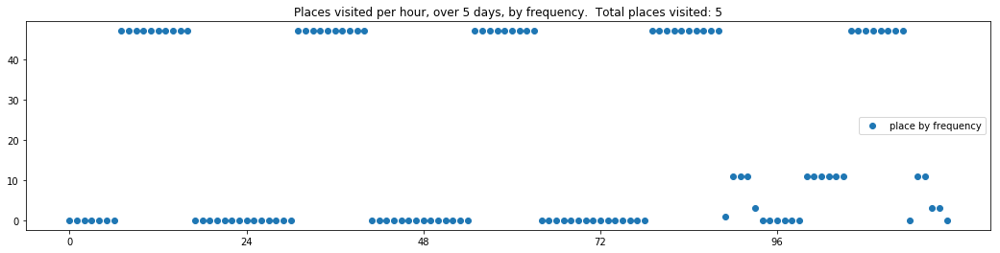

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 183, 183, 183, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 78, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 151, 151, 78, 78, 78, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


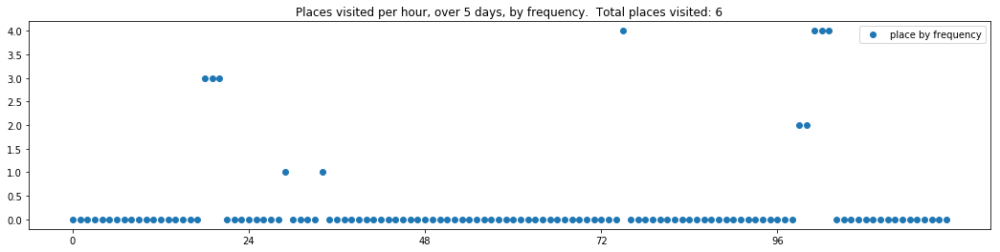

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 447, 447, 183, 183, 184, 184, 184, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 373, 373, 261, 558, 564, 57, 326, 326, 450, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 603, 485, 349, 558, 183, 183, 21, 21, 21, 430, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 274, 558, 558, 558, 558, 558, 558, 495, 495, 644]
[644, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 430, 558, 558, 558, 558, 558, 558, 430, 430, 495, 644]


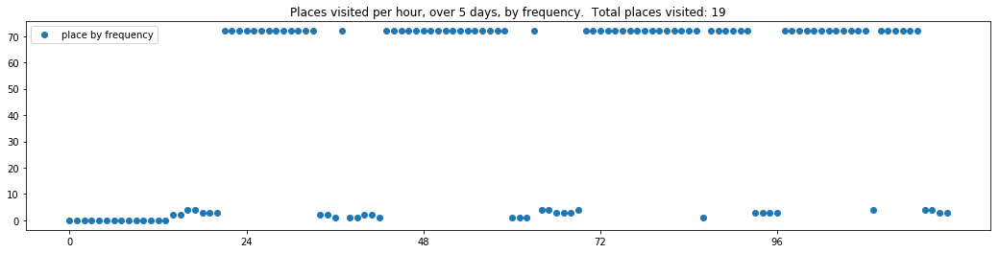

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 33, 33, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558]
[558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 558, 558, 558, 558]


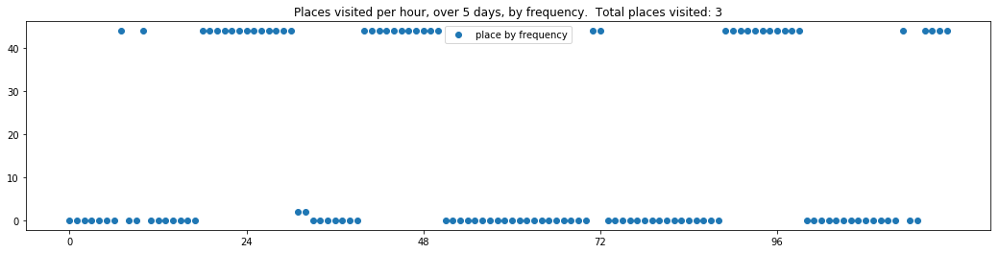

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 450, 0, 0, 0, 0, 0, 0, 558, 88, 0, 4, 0, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 0, 450, 450, 450, 0, 0, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 558, 0, 0, 0, 450, 450, 171, 171, 260, 0, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 450, 450, 450, 450, 450, 450, 450, 450, 450, 450, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 450, 450, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0]


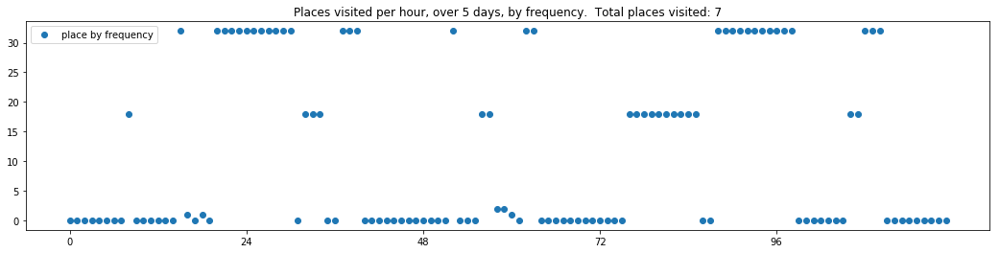

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 287, 287, 287, 558, 558, 287, 287, 287]
[287, 287, 287, 287, 287, 287, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[287, 287, 287, 287, 287, 287, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 287, 287, 287, 287, 287]
[287, 287, 287, 287, 287, 287, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 0, 0, 0, 0, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287]


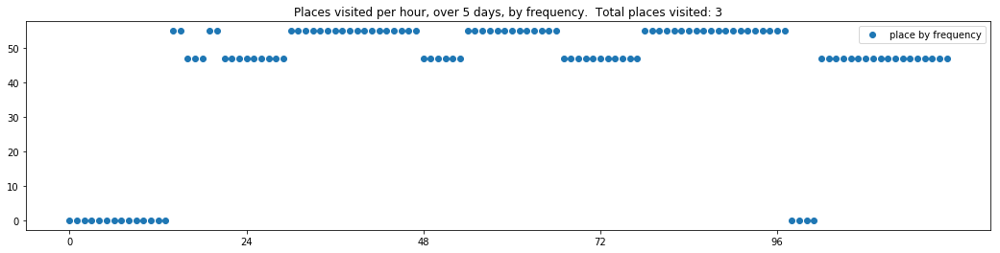

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 323, 323, 558, 76, 76, 558, 558, 373, 558, 558, 558, 267, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 464, 558, 558, 558, 373, 50, 558, 558, 0, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 74, 74, 100, 0, 235, 267, 386, 133, 558, 558, 558, 558, 450, 450, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 267, 267, 485, 485, 221, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 267, 267, 373, 373, 373, 373, 373, 373, 558, 558, 558, 558, 558, 558, 56, 56, 56, 56, 56, 56, 386]


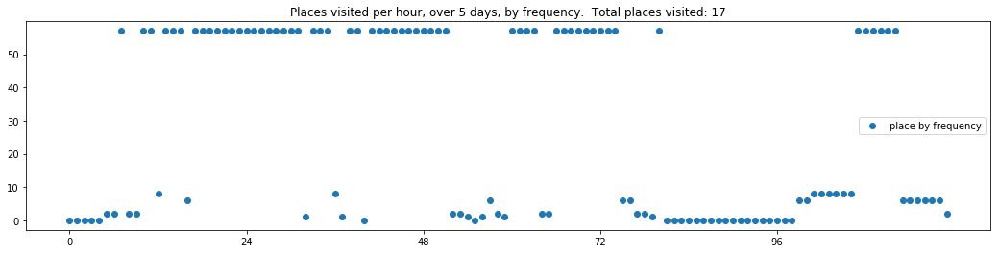

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 0, 0, 558, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 130, 130, 130, 130]


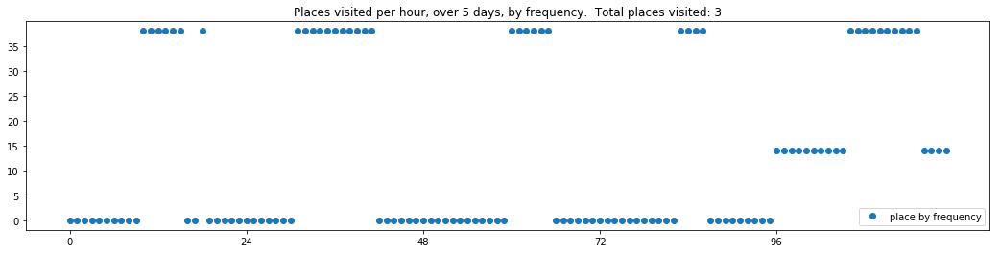

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 430, 326, 558, 558, 558, 558, 558, 430, 382, 276, 558, 450, 450, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 271, 271, 271, 271, 271, 22, 22, 22, 450, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 271, 271, 22, 22, 22, 22, 22, 22, 22, 162, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 349, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 396, 177, 329, 20, 0, 0, 22, 22, 22, 329, 558, 558, 558, 558]


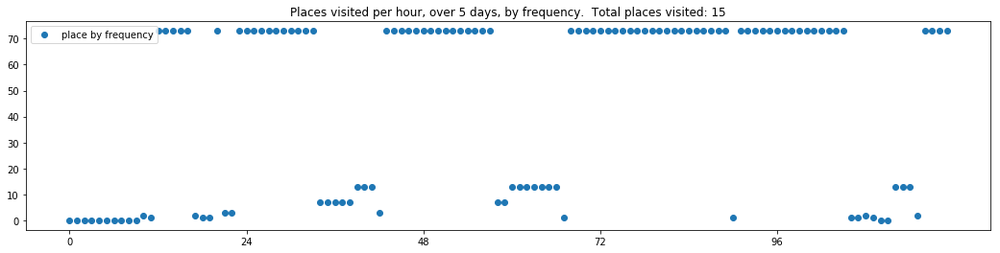

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 374, 42, 558, 558, 558, 558, 558, 558, 321, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 545, 545, 545, 369, 464, 558, 558, 0, 0, 0, 0]
[0, 0, 485, 373, 545, 0, 0, 0, 0, 0, 0, 0, 299, 299, 558, 558, 15, 15, 15, 15, 15, 15, 15, 15]
[15, 0, 0, 94, 94, 94, 0, 0, 0, 0, 0, 0, 373, 373, 573, 573, 261, 261, 0, 0, 0, 0, 0, 15]
[15, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 15, 15, 15, 15, 15, 15, 334]


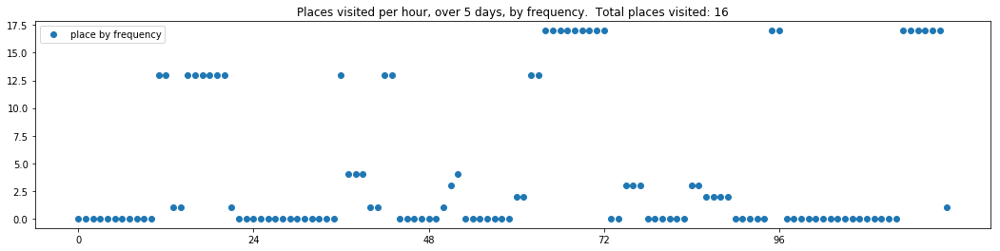

----- vector ----
prefix labels:  [558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 558, 558, 558, 558]
[558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 410, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 69, 185, 171, 558, 558, 0, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 541, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 485, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 541, 541, 541, 0, 0, 0, 0, 541, 541, 20, 0, 541]


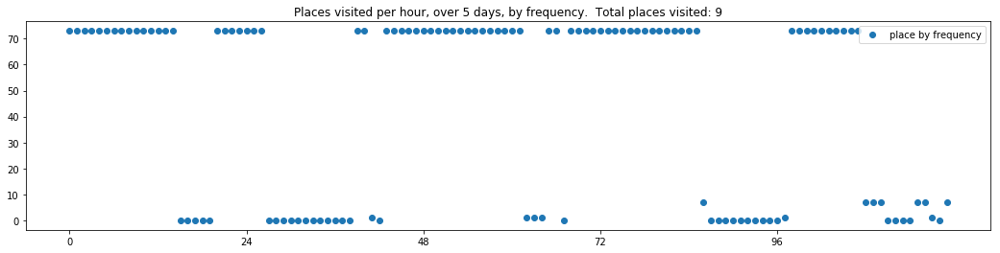

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 183, 183, 183, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 183, 183, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 0, 183, 183, 183, 183, 183, 183, 183, 183, 0, 0, 0, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 386, 386, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


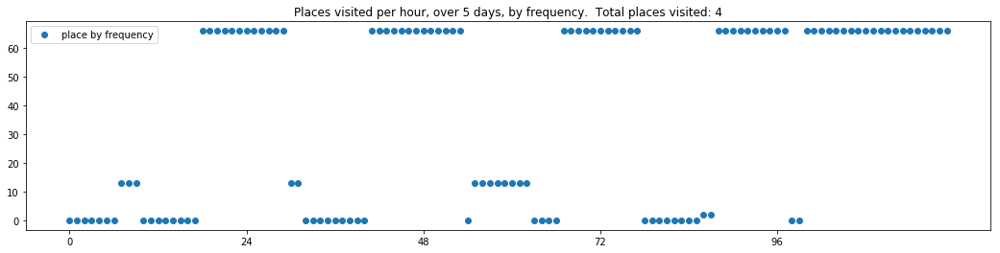

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 385, 20, 0, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0]
[20, 0, 0, 0, 0, 0, 0, 0, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 558, 558, 558, 558, 558, 558]


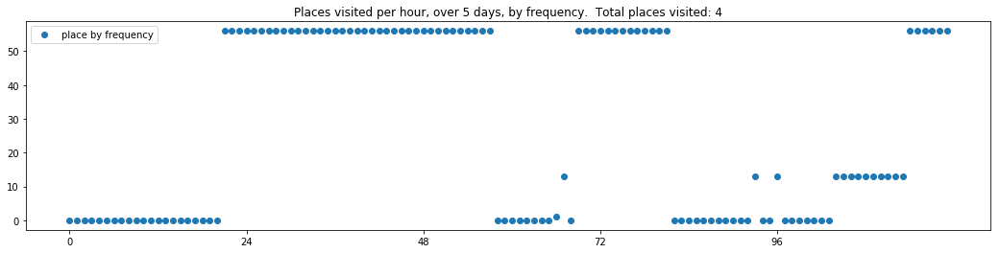

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 558, 0, 558, 0, 0, 0, 0, 0, 558, 0, 0, 558, 76, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 474, 0, 0, 0, 330, 330, 330, 558, 558, 558, 558, 558, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 290, 290, 290, 290, 290, 644, 290, 290, 0, 0, 288, 288, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 450, 450, 498, 498, 558, 558]
[558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 290, 290, 290, 290, 558, 0, 0, 0, 0, 0]


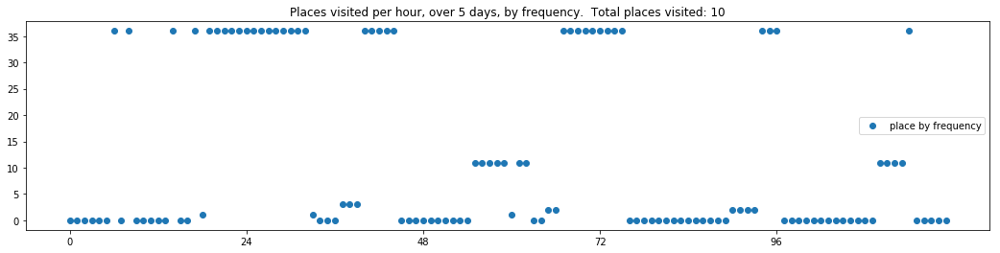

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 236, 236, 236, 236, 558, 558, 236, 236, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 236, 236, 236, 236, 236, 236, 236, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 236, 236, 236, 236, 0, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 545, 545, 545, 373, 236, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 76, 76, 76, 76, 76, 374, 386, 386, 573, 0, 0, 0, 0, 0]


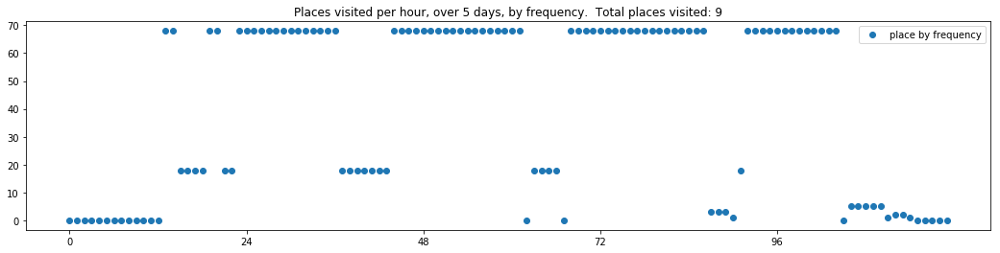

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0]
[0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 450, 373, 373, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 10, 10, 10, 10, 10, 558, 558, 558, 558, 558]


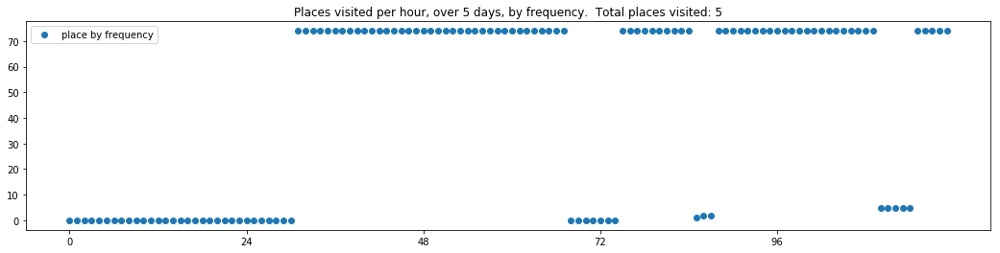

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 346, 132, 132, 132, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 4, 4, 4, 4, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 558, 558, 558]
[0, 0, 0, 0, 0, 317, 317, 317, 317, 317, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 0, 0, 0, 558, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0]


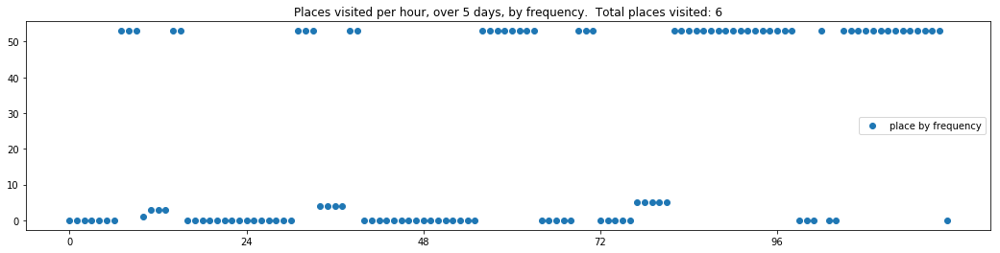

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 558, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


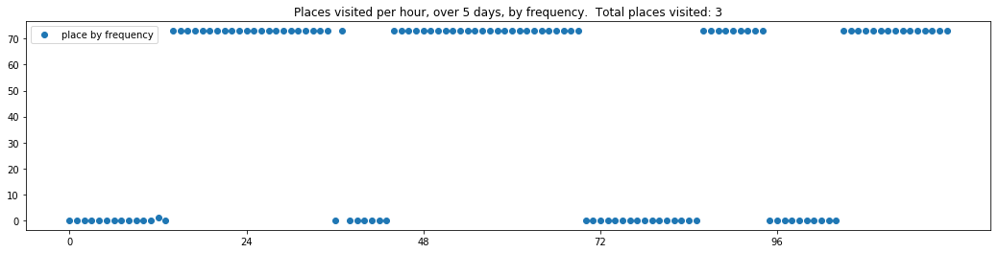

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 364, 364, 364, 0, 100, 100, 552, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558]
[558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 389, 0, 0, 0, 0, 0, 0, 0]


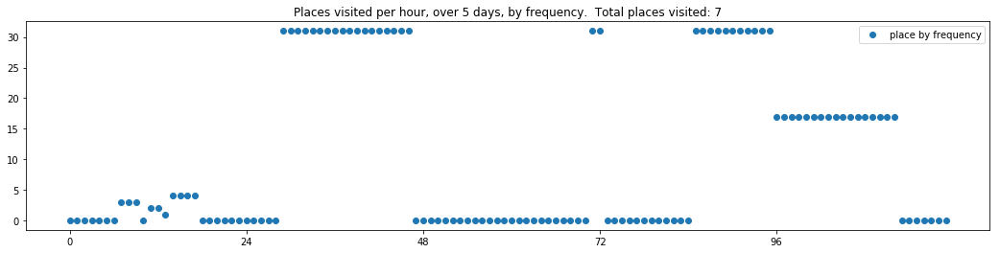

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]


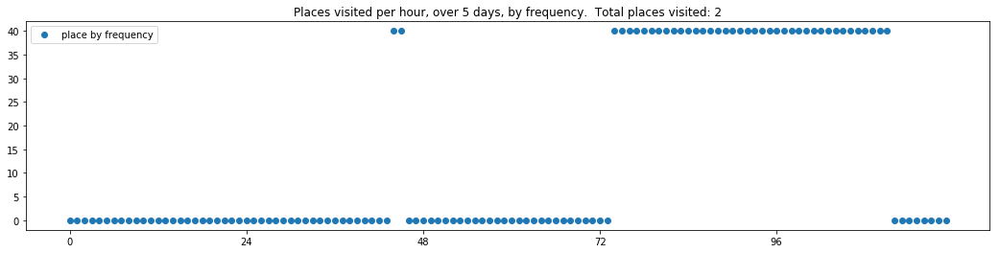

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 574, 558, 558, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 274, 0, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 558, 558, 558]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 157, 432, 24, 24, 0, 558, 558, 558]


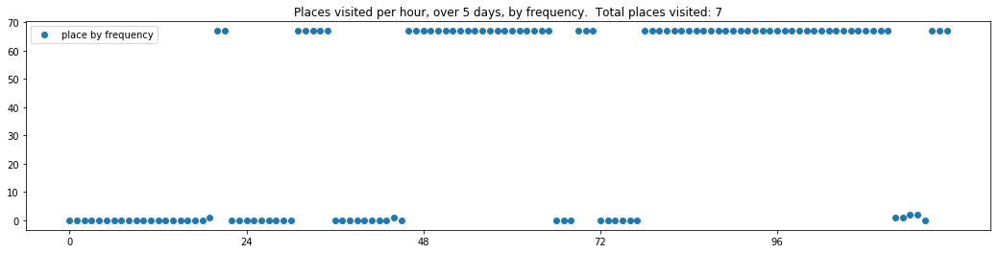

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 143, 143, 143, 143, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 430, 430, 430, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 430, 430, 430, 430, 430]
[430, 430, 430, 430, 430, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 430, 430, 430, 430, 430]
[430, 430, 430, 430, 430, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 430, 430, 430, 430]


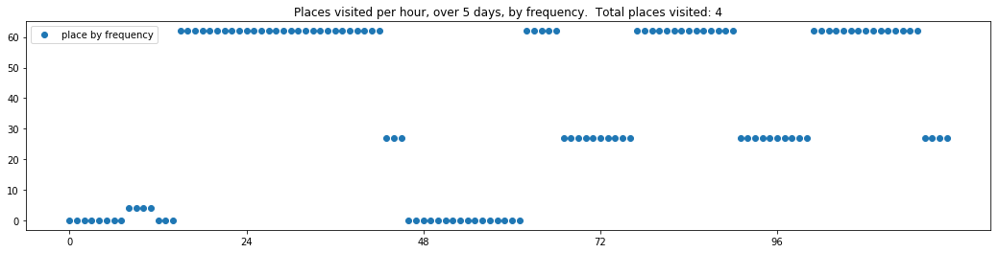

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 173, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 90, 90, 0, 0, 0, 0, 0, 0, 84, 84, 84, 84, 84, 20, 274, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 84, 84, 84, 84, 84, 84, 84, 84]
[84, 84, 458, 0, 0, 0, 90, 0, 122, 0, 0, 0, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84]


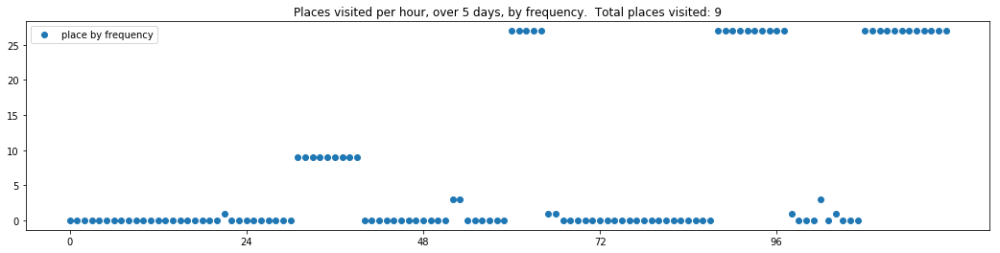

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 236, 236, 558, 558, 0, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 558, 558, 558, 558, 184, 0, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 20, 20, 20, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


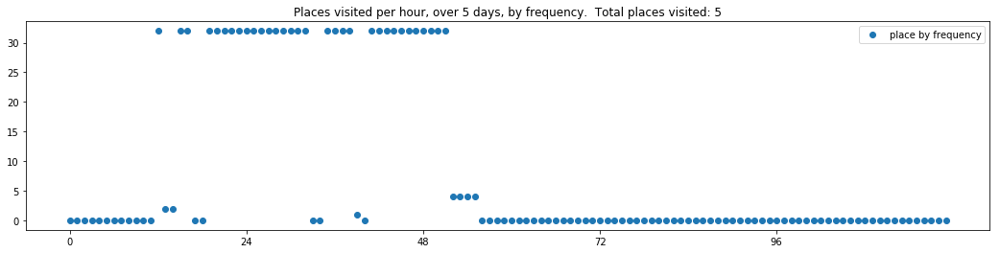

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]


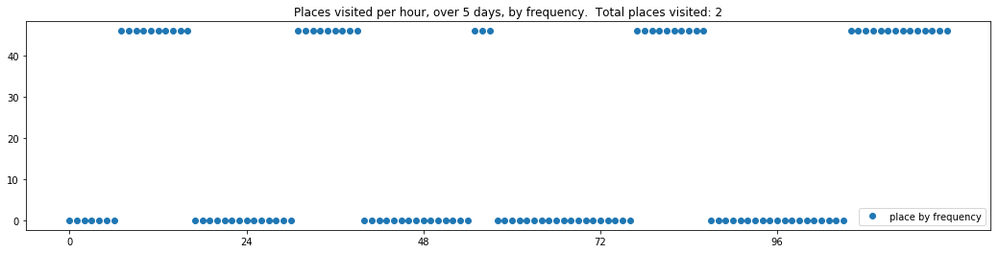

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 0, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558]
[558, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558]


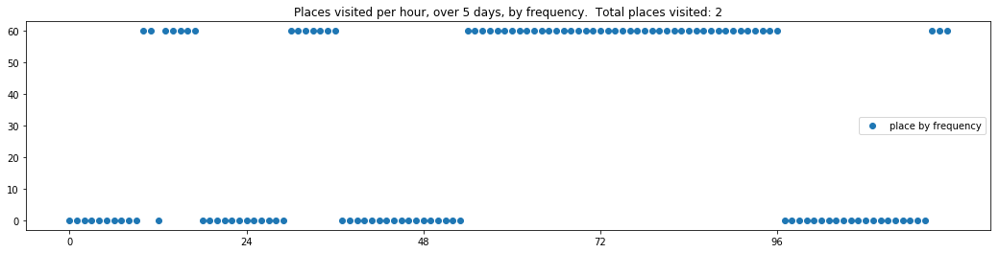

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 571, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 2, 2, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 337, 218, 218, 218, 0, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0]


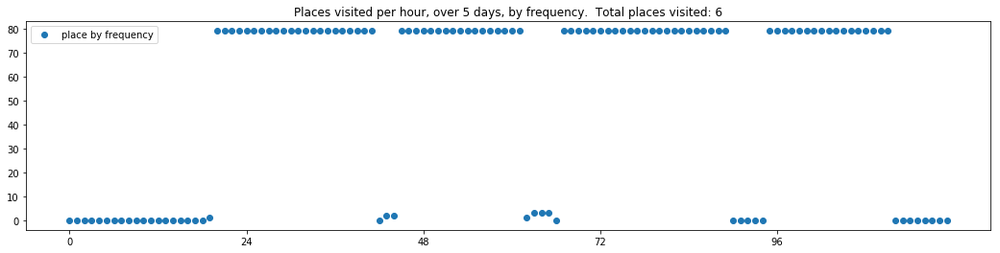

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 450, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 0, 450, 545, 545, 0, 0, 450, 450, 0, 558, 558, 558, 558, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 558, 450, 450, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 0, 0, 558, 558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 450, 450, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0]


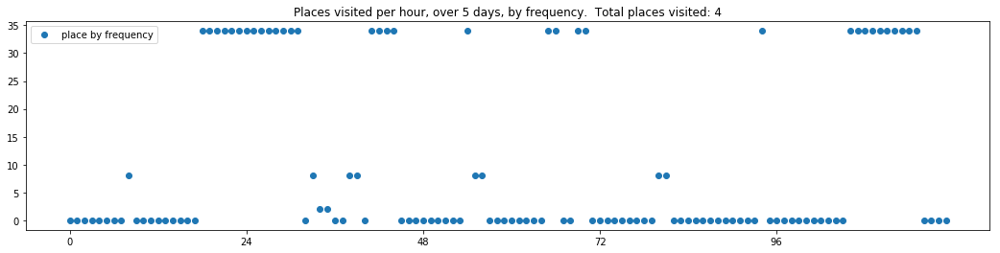

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 323, 495, 495, 495, 495, 603, 386, 386, 386, 386, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 162, 302, 495, 495, 495, 495, 495, 495, 495, 495, 558, 558]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 495, 495, 545, 545, 545, 162, 334, 334, 545, 545, 119, 450]
[558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 519, 519, 571, 271, 545, 404, 447, 0, 0]


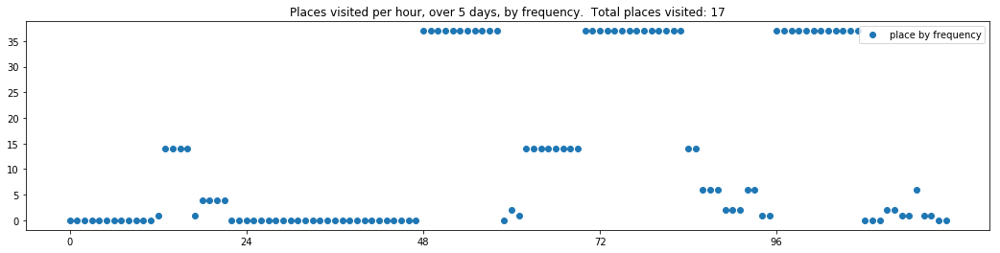

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 558, 373, 373, 373, 373, 373, 373, 373, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 558, 373, 373, 373, 373, 373, 373, 373, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 146, 224]
[4, 4, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 4]


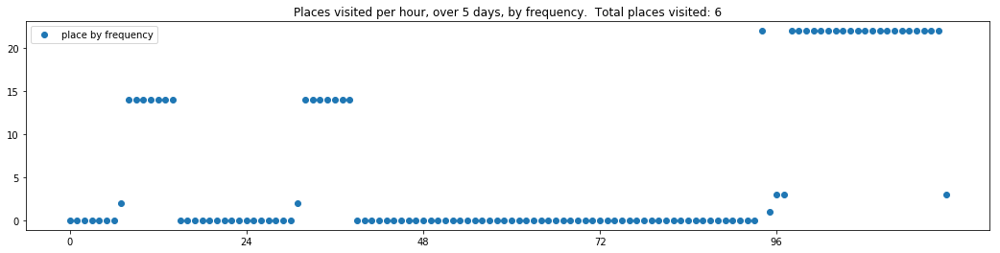

----- vector ----
prefix labels:  [558, 558]
[0, 0, 0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 434, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 558, 558, 558, 558, 558, 558, 558, 558, 558, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 558, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 258]


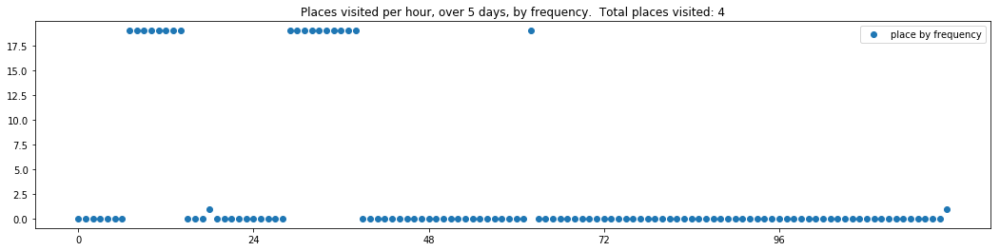

In [12]:
for tv in textgenrnn_cambridge_trajectories_set[1.0][:2*sample_size]:
    print_dwell_vector_by_days(tv)
    plot_trajectory_vector_frequencies(tv, by_frequency_order=False) 

## Models Matrix for Parameter Comparisons

A bunch of models were trained with differenet parameters. Then they generated synthetic trajectoriesfollowing the same rules.
In the below matrix, each column is a list of parameters that were used to generate synthetic trajectories.
We use these parameters to read in the trajectories, and then evaluate each set of parameters by how well the trajectories their model produced performs as per our set of evaluators.

In [325]:
models_matrix_df = pd.read_csv('../textgenrnn_generator/textgenrnn_model_parameters_.csv', index_col=0)
models_matrix_df.loc['rnn_bidirectional'] = (models_matrix_df.loc['rnn_bidirectional'] == 'TRUE')
models_matrix_df = models_matrix_df.loc[models_matrix_df.index.dropna()]

Read in the trajectories produced for each set of parameters.  I.e. a trajectories file for each column.

In [326]:
# first add a row for the generated trajectories names
generated_trajectories_name_idx = 'generated_trajectories_name'
row = pd.Series({c:'' for c in models_matrix_df.columns}, name=generated_trajectories_name_idx)
models_matrix_df = models_matrix_df.append(row)
models_matrix_df

,default,default.1,default.2,A,A.1,A.2,B,B.1,B.2,C,...,X-bidirectional.2,X-bidirectional.3,Y-bidirectional,Y-bidirectional.1,Y-bidirectional.2,Y-bidirectional.3,Z-bidirectional,Z-bidirectional.1,Z-bidirectional.2,Z-bidirectional.3
rnn_bidirectional,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,True,True,True,True,True,True
max_length,24,24,24,24,24,24,24,24,24,24,...,60,60,60,60,60,60,72,72,72,72
rnn_layers,2,2,2,3,3,3,2,2,2,2,...,3,3,3,3,3,3,2,2,2,2
rnn_size,128,128,128,128,128,128,256,256,256,128,...,128,128,256,256,256,256,256,256,256,256
dropout,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.2,...,0.2,0.2,0.3,0.3,0.3,0.3,0.3,0.3,0.3,0.3
dim_embeddings,50,50,50,50,50,50,50,50,50,50,...,128,128,100,100,100,100,100,100,100,100
temperature,0.8,0.9,1,0.8,0.9,1,0.8,0.9,1,0.8,...,1,1.1,0.8,0.8,0.8,0.8,0.8,0.9,1,1.1
batch size,512,512,512,512,512,512,512,512,512,512,...,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024
generated for cambridge,GPU,yes,yes,yes,yes,yes,no,no,no,yes,...,NaN,NaN,NaN,NaN,NaN,NaN,loss after epoch 11:,0.7,NaN,NaN
generated for general sample,GPU,yes,yes,TODO,TODO,NaN,yes,yes,yes,done,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [327]:
# Save in memory a mapping of {generated_trajectories_name -> list of trajectories}
# where the generated_trajectories_name is determined by the models parameters
generated_sample_trajectories_map = {}

for column_name in models_matrix_df.columns:
    col = models_matrix_df[column_name]
    model_name = 'trajectories-rnn_bidirectional:{}-max_len:{}-rnn_layers:{}-rnn_size:{}-dropout:{}-dim_embeddings:{}'.format(
        col['rnn_bidirectional'],col['max_length'],col['rnn_layers'],col['rnn_size'],col['dropout'],col['dim_embeddings'])
    generated_trajectories_name = 'generated-sample-{}-temperature:{}'.format(
        model_name, float(col['temperature']))

    try:
        generated_trajectories_filepath = '../textgenrnn_generator/output/{}.txt'.format(generated_trajectories_name)
        generated_trajectories = read_trajectories_from_file(generated_trajectories_filepath)
        models_matrix_df.loc[generated_trajectories_name_idx][column_name] = generated_trajectories_name
        generated_sample_trajectories_map[generated_trajectories_name] = generated_trajectories
    except FileNotFoundError as e:
        print(e)
        print('dropping column for', generated_trajectories_name)
        models_matrix_df.drop(columns=[column_name], inplace=True)
    continue
    
models_matrix_df

[Errno 2] No such file or directory: '../textgenrnn_generator/output/generated-sample-trajectories-rnn_bidirectional:False-max_len:24-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:0.8.txt'
dropping column for generated-sample-trajectories-rnn_bidirectional:False-max_len:24-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:0.8
[Errno 2] No such file or directory: '../textgenrnn_generator/output/generated-sample-trajectories-rnn_bidirectional:False-max_len:24-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:0.9.txt'
dropping column for generated-sample-trajectories-rnn_bidirectional:False-max_len:24-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:0.9
[Errno 2] No such file or directory: '../textgenrnn_generator/output/generated-sample-trajectories-rnn_bidirectional:False-max_len:24-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:1.0.txt'
dropping column for generated-sample-trajectories-rnn

[Errno 2] No such file or directory: '../textgenrnn_generator/output/generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:2-rnn_size:256-dropout:0.4-dim_embeddings:100-temperature:0.8.txt'
dropping column for generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:2-rnn_size:256-dropout:0.4-dim_embeddings:100-temperature:0.8
[Errno 2] No such file or directory: '../textgenrnn_generator/output/generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:2-rnn_size:256-dropout:0.4-dim_embeddings:100-temperature:0.9.txt'
dropping column for generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:2-rnn_size:256-dropout:0.4-dim_embeddings:100-temperature:0.9
[Errno 2] No such file or directory: '../textgenrnn_generator/output/generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:2-rnn_size:256-dropout:0.4-dim_embeddings:100-temperature:1.0.txt'
dropping column for generated-sample-trajectories-rnn

,default,default.1,default.2,B,B.1,B.2,C,C.1,C.2,E,...,X-bidirectional.2,X-bidirectional.3,Y-bidirectional,Y-bidirectional.1,Y-bidirectional.2,Y-bidirectional.3,Z-bidirectional,Z-bidirectional.1,Z-bidirectional.2,Z-bidirectional.3
rnn_bidirectional,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,True,True,True,True,True,True
max_length,24,24,24,24,24,24,24,24,24,48,...,60,60,60,60,60,60,72,72,72,72
rnn_layers,2,2,2,2,2,2,2,2,2,2,...,3,3,3,3,3,3,2,2,2,2
rnn_size,128,128,128,256,256,256,128,128,128,128,...,128,128,256,256,256,256,256,256,256,256
dropout,0.1,0.1,0.1,0.1,0.1,0.1,0.2,0.2,0.2,0.1,...,0.2,0.2,0.3,0.3,0.3,0.3,0.3,0.3,0.3,0.3
dim_embeddings,50,50,50,50,50,50,50,50,50,50,...,128,128,100,100,100,100,100,100,100,100
temperature,0.8,0.9,1,0.8,0.9,1,0.8,0.9,1,0.8,...,1,1.1,0.8,0.8,0.8,0.8,0.8,0.9,1,1.1
batch size,512,512,512,512,512,512,512,512,512,512,...,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024
generated for cambridge,GPU,yes,yes,no,no,no,yes,yes,yes,no,...,NaN,NaN,NaN,NaN,NaN,NaN,loss after epoch 11:,0.7,NaN,NaN
generated for general sample,GPU,yes,yes,yes,yes,yes,done,done,done,yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [328]:
# And add in these other ones...
# TODO: update this to rename trajectories/models by  parameters and better fit in pipeline

cs = [
    'generated-sample-synthetic_trajectories-temperature:0.8',
    'generated-sample-synthetic_trajectories-temperature:0.9',
    'generated-sample-synthetic_trajectories-temperature:1.0',
]
for c in cs:
    models_matrix_df[c] = [[np.nan]]*len(models_matrix_df)
    generated_trajectories_name = c
    generated_trajectories_filepath = '../textgenrnn_generator/output/{}.txt'.format(generated_trajectories_name)
    generated_trajectories = read_trajectories_from_file(generated_trajectories_filepath)
    models_matrix_df.loc[generated_trajectories_name_idx][c] = generated_trajectories_name
    generated_sample_trajectories_map[generated_trajectories_name] = generated_trajectories

models_matrix_df

,default,default.1,default.2,B,B.1,B.2,C,C.1,C.2,E,...,Y-bidirectional.1,Y-bidirectional.2,Y-bidirectional.3,Z-bidirectional,Z-bidirectional.1,Z-bidirectional.2,Z-bidirectional.3,generated-sample-synthetic_trajectories-temperature:0.8,generated-sample-synthetic_trajectories-temperature:0.9,generated-sample-synthetic_trajectories-temperature:1.0
rnn_bidirectional,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,True,True,True,[nan],[nan],[nan]
max_length,24,24,24,24,24,24,24,24,24,48,...,60,60,60,72,72,72,72,[nan],[nan],[nan]
rnn_layers,2,2,2,2,2,2,2,2,2,2,...,3,3,3,2,2,2,2,[nan],[nan],[nan]
rnn_size,128,128,128,256,256,256,128,128,128,128,...,256,256,256,256,256,256,256,[nan],[nan],[nan]
dropout,0.1,0.1,0.1,0.1,0.1,0.1,0.2,0.2,0.2,0.1,...,0.3,0.3,0.3,0.3,0.3,0.3,0.3,[nan],[nan],[nan]
dim_embeddings,50,50,50,50,50,50,50,50,50,50,...,100,100,100,100,100,100,100,[nan],[nan],[nan]
temperature,0.8,0.9,1,0.8,0.9,1,0.8,0.9,1,0.8,...,0.8,0.8,0.8,0.8,0.9,1,1.1,[nan],[nan],[nan]
batch size,512,512,512,512,512,512,512,512,512,512,...,1024,1024,1024,1024,1024,1024,1024,[nan],[nan],[nan]
generated for cambridge,GPU,yes,yes,no,no,no,yes,yes,yes,no,...,NaN,NaN,NaN,loss after epoch 11:,0.7,NaN,NaN,[nan],[nan],[nan]
generated for general sample,GPU,yes,yes,yes,yes,yes,done,done,done,yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[nan],[nan],[nan]


In [329]:
# Add in originally produced cambridge trajectories
# TODO: update this to rename trajectories/models by  parameters and better fit in pipeline

cs = [
#     'generated_trajectories_1_week_cambridge_temp_0.8',
#     'generated_trajectories_1_week_cambridge_temp_0.9',
#     'generated_trajectories_1_week_cambridge_temp_1.0',
]
for c in cs:
    models_matrix_df[c] = [[np.nan]]*len(models_matrix_df)
    generated_trajectories_name = c
    generated_trajectories_filepath = '../textgenrnn_generator/output/{}.txt'.format(generated_trajectories_name)
    generated_trajectories = read_trajectories_from_file(generated_trajectories_filepath)
    models_matrix_df.loc[generated_trajectories_name_idx][c] = generated_trajectories_name
    generated_sample_trajectories_map[generated_trajectories_name] = generated_trajectories

models_matrix_df


,default,default.1,default.2,B,B.1,B.2,C,C.1,C.2,E,...,Y-bidirectional.1,Y-bidirectional.2,Y-bidirectional.3,Z-bidirectional,Z-bidirectional.1,Z-bidirectional.2,Z-bidirectional.3,generated-sample-synthetic_trajectories-temperature:0.8,generated-sample-synthetic_trajectories-temperature:0.9,generated-sample-synthetic_trajectories-temperature:1.0
rnn_bidirectional,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,True,True,True,[nan],[nan],[nan]
max_length,24,24,24,24,24,24,24,24,24,48,...,60,60,60,72,72,72,72,[nan],[nan],[nan]
rnn_layers,2,2,2,2,2,2,2,2,2,2,...,3,3,3,2,2,2,2,[nan],[nan],[nan]
rnn_size,128,128,128,256,256,256,128,128,128,128,...,256,256,256,256,256,256,256,[nan],[nan],[nan]
dropout,0.1,0.1,0.1,0.1,0.1,0.1,0.2,0.2,0.2,0.1,...,0.3,0.3,0.3,0.3,0.3,0.3,0.3,[nan],[nan],[nan]
dim_embeddings,50,50,50,50,50,50,50,50,50,50,...,100,100,100,100,100,100,100,[nan],[nan],[nan]
temperature,0.8,0.9,1,0.8,0.9,1,0.8,0.9,1,0.8,...,0.8,0.8,0.8,0.8,0.9,1,1.1,[nan],[nan],[nan]
batch size,512,512,512,512,512,512,512,512,512,512,...,1024,1024,1024,1024,1024,1024,1024,[nan],[nan],[nan]
generated for cambridge,GPU,yes,yes,no,no,no,yes,yes,yes,no,...,NaN,NaN,NaN,loss after epoch 11:,0.7,NaN,NaN,[nan],[nan],[nan]
generated for general sample,GPU,yes,yes,yes,yes,yes,done,done,done,yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[nan],[nan],[nan]


## Evaluation

Visualize a random sample of trajectories from each model output


-------showing vectors for model: default-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:False-max_len:24-rnn_layers:2-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:0.8
----- vector ----
prefix labels:  [201, 201]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 48, 48, 48, 48, 48, 48, 48]
[48, 48, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 48, 48, 48, 48, 48, 48]


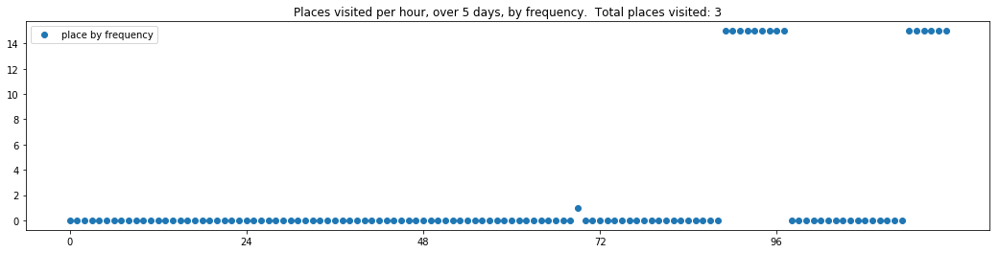

----- vector ----
prefix labels:  [315, 244]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 315, 315, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 78, 78, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


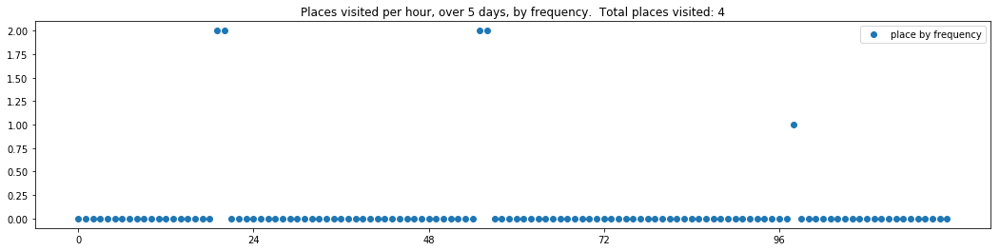

----- vector ----
prefix labels:  [463, 146]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 146, 146, 146, 146, 146, 146, 146, 463, 463, 463, 463, 463, 463, 463, 463]
[463, 463, 463, 463, 463, 463, 463, 463, 146, 146, 146, 146, 146, 146, 146, 146, 463, 463, 463, 463, 463, 463, 463, 463]
[463, 463, 463, 463, 463, 463, 463, 463, 463, 463, 146, 146, 146, 146, 146, 146, 146, 463, 463, 463, 463, 463, 463, 463]
[463, 463, 463, 463, 463, 146, 146, 463, 463, 463, 146, 146, 146, 146, 146, 146, 463, 463, 463, 463, 463, 463, 463, 463]
[463, 463, 463, 463, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 463, 463, 463, 463, 463, 463, 463, 463, 463, 463]


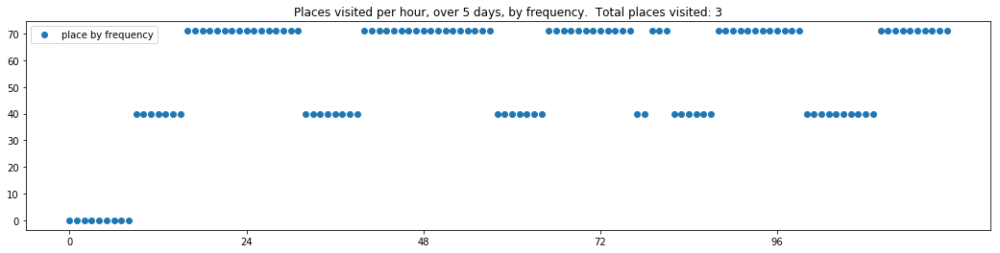


-------showing vectors for model: default.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:False-max_len:24-rnn_layers:2-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:0.9
----- vector ----
prefix labels:  [45, 246]
[0, 0, 0, 0, 0, 0, 0, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 0, 246, 247, 247, 45, 45, 45]
[45, 45, 45, 45, 45, 45, 45, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 45, 45, 45, 45]
[45, 45, 45, 45, 45, 45, 45, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 45, 45, 109, 45]
[45, 246, 246, 45, 45, 45, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 0, 246, 246, 0, 0, 45]
[246, 0, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246]


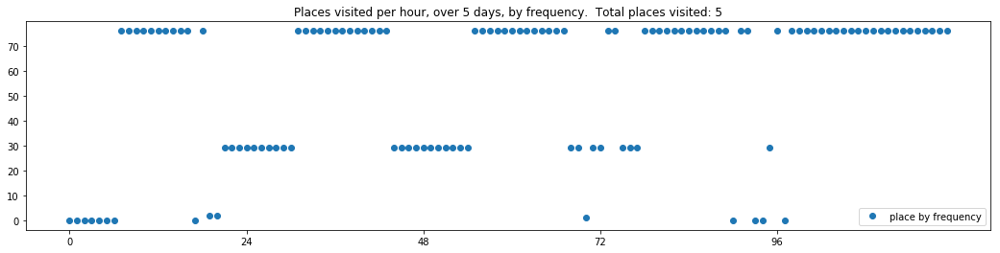

----- vector ----
prefix labels:  [523, 523]
[0, 0, 0, 0, 0, 0, 0, 0, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523]
[523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 332, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 526, 526, 526]
[526, 526, 526, 526, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 526, 526, 526, 526, 526]
[526, 526, 526, 526, 526, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 523, 526, 526, 526, 526]


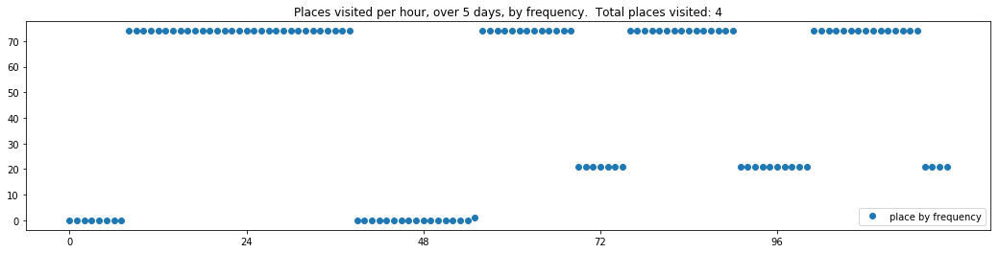

----- vector ----
prefix labels:  [230, 230]
[0, 0, 0, 0, 0, 0, 230, 230, 230, 230, 0, 0, 0, 0, 230, 230, 230, 230, 230, 230, 230, 230, 230, 230]
[230, 230, 230, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 230, 230, 230, 230, 230, 230, 230, 230, 230, 230, 230]
[230, 230, 230, 596, 0, 0, 230, 230, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[230, 230, 230, 230, 230, 230, 230, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[230, 230, 230, 230, 230, 230, 230, 230, 230, 230, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 230]


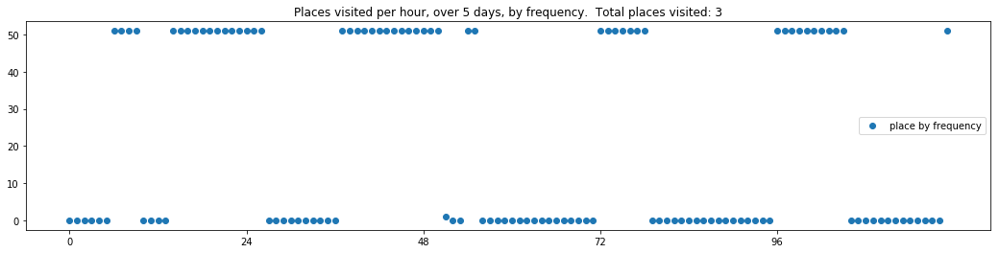


-------showing vectors for model: default.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:False-max_len:24-rnn_layers:2-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:1.0
----- vector ----
prefix labels:  [70, 597]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 252, 252, 70, 70]
[0, 0, 0, 0, 0, 0, 0, 252, 0, 252, 252, 0, 252, 252, 252, 252, 252, 95, 0, 252, 252, 252, 252, 252]
[252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252]
[252, 252, 252, 252, 252, 252, 252, 252, 252, 0, 69, 69, 69, 69, 69, 69, 69, 69, 69, 0, 252, 252, 252, 252]
[252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 252, 0, 151, 252]


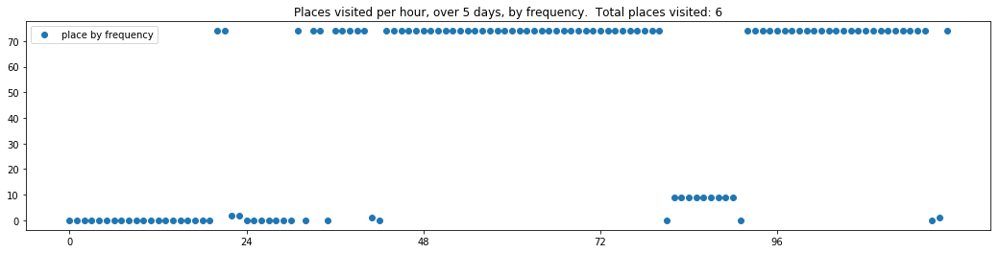

----- vector ----
prefix labels:  [568, 568]
[568, 568, 568, 568, 0, 0, 24, 24, 24, 24, 24, 24, 24, 24, 24, 0, 0, 568, 568, 568, 568, 568, 568, 568]
[568, 568, 568, 568, 568, 568, 124, 24, 24, 24, 24, 24, 24, 24, 24, 24, 568, 568, 568, 568, 568, 568, 568, 568]
[568, 568, 568, 568, 568, 568, 568, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 568, 568, 568, 568, 568, 568]
[568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 568, 0, 0, 0, 0]


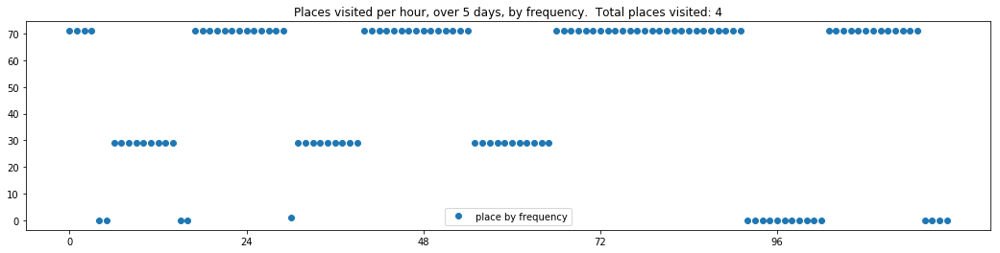

----- vector ----
prefix labels:  [448, 271]
[0, 0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 448, 364, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 364, 364, 364, 364, 364, 364, 393, 393, 364, 364, 364, 364]
[54, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 8, 8, 8, 8, 8, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 8, 8, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


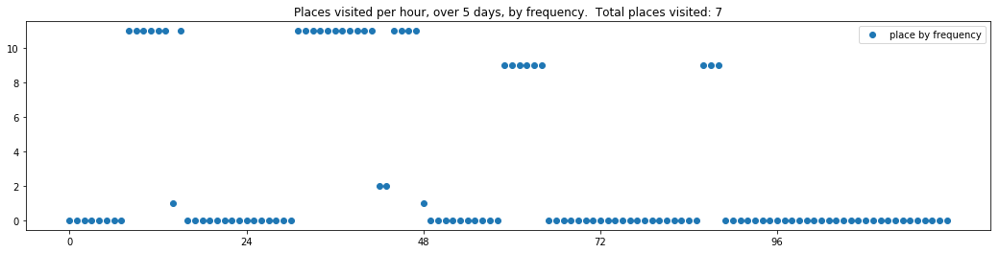


-------showing vectors for model: B-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:False-max_len:24-rnn_layers:2-rnn_size:256-dropout:0.1-dim_embeddings:50-temperature:0.8
----- vector ----
prefix labels:  [423, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 423, 423, 423, 423, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


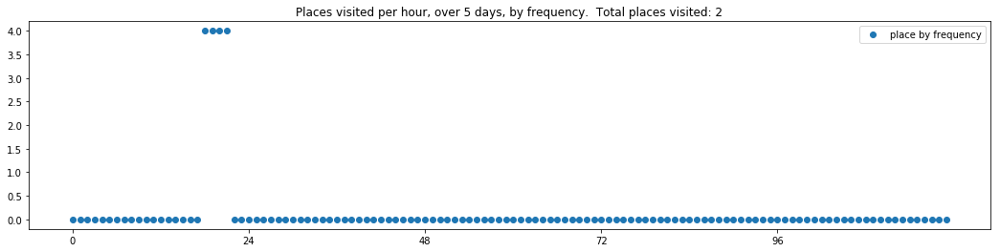

----- vector ----
prefix labels:  [4, 4]
[0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]


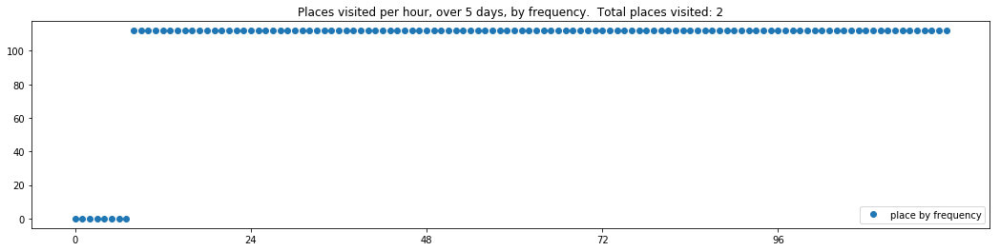

----- vector ----
prefix labels:  [318, 392]
[0, 0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 392, 392, 392, 392, 392, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]
[392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]
[392, 392, 392, 0, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]
[392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392, 392]


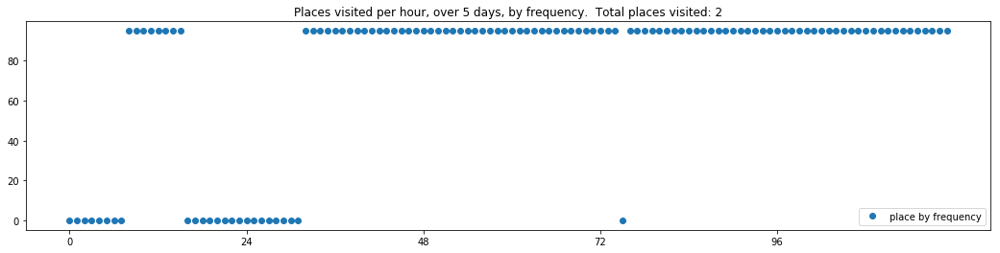


-------showing vectors for model: B.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:False-max_len:24-rnn_layers:2-rnn_size:256-dropout:0.1-dim_embeddings:50-temperature:0.9
----- vector ----
prefix labels:  [49, 49]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 165, 165, 165, 165, 165, 165, 165, 165]
[165, 165, 165, 0, 0, 0, 0, 0, 31, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 165, 165, 165, 165]
[165, 165, 165, 165, 165, 165, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 165, 165, 165, 165]
[165, 165, 165, 165, 165, 165, 165, 165, 165, 165, 165, 165, 165, 165, 165, 165, 165, 165, 165, 165, 165, 165, 165, 165]


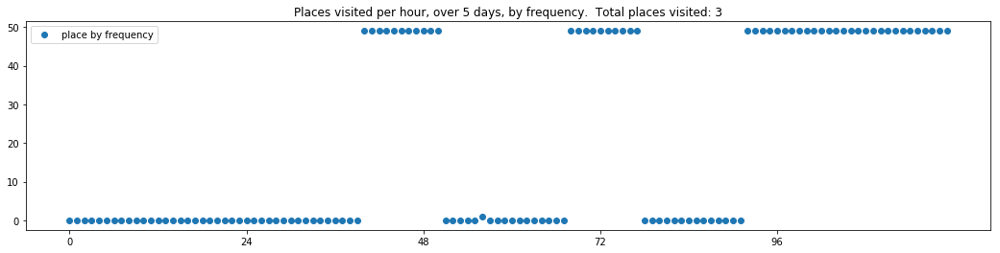

----- vector ----
prefix labels:  [168, 296]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 168, 168, 168, 168, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 193, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 148, 238, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 262, 0, 0, 100, 641]


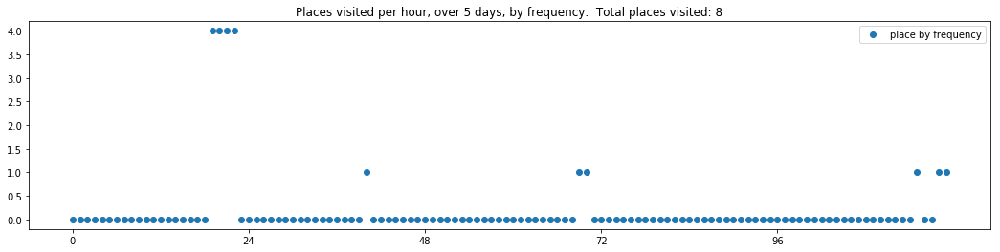

----- vector ----
prefix labels:  [562, 390]
[0, 116, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 206, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


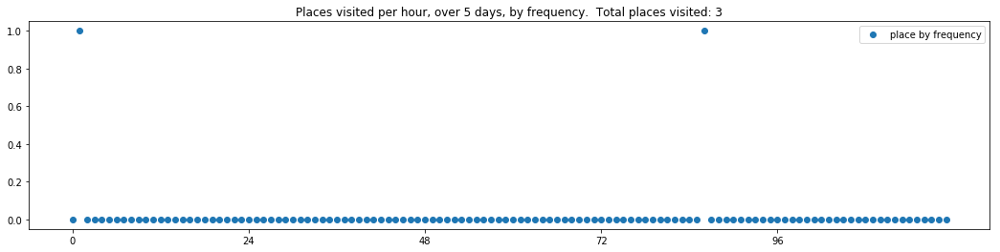


-------showing vectors for model: B.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:False-max_len:24-rnn_layers:2-rnn_size:256-dropout:0.1-dim_embeddings:50-temperature:1.0
----- vector ----
prefix labels:  [281, 434]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 104, 104, 104, 559, 104, 336, 0, 0, 0, 0, 281, 130]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 151, 0, 0, 28, 136, 385]
[313, 0, 515, 515, 463, 0, 0, 0, 0, 0, 401, 0, 0, 0, 0, 0, 0, 0, 36, 36, 268, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 613, 613, 613, 613, 613, 613]
[613, 613, 613, 0, 0, 496, 411, 133, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 482, 269, 0, 0, 0, 615]


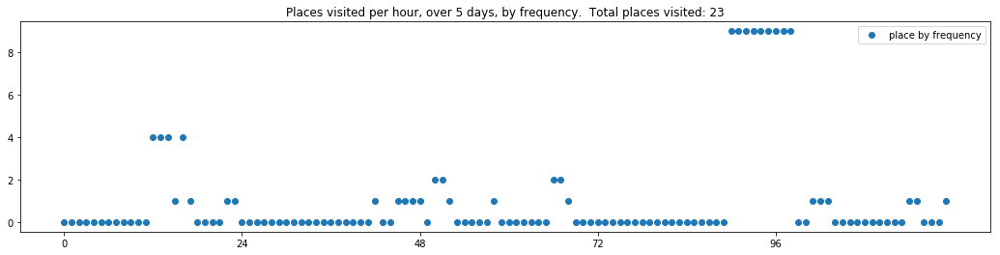

----- vector ----
prefix labels:  [174, 21]
[0, 0, 0, 0, 0, 0, 162, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 22, 22, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 96, 96]
[96, 96, 96, 96, 0, 0, 0, 0, 0, 0, 0, 0, 0, 371, 278, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 412, 412, 412, 412, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 412, 186, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


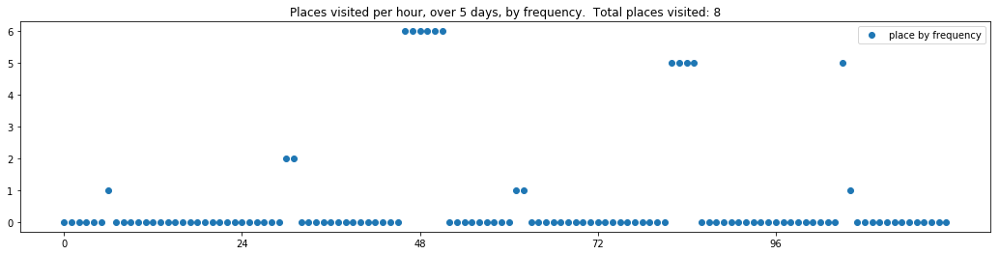

----- vector ----
prefix labels:  [145, 162]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 297, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 225]
[0, 0, 230, 230, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 268, 0, 0, 0, 0, 0, 0]
[0, 0, 230, 0, 130, 130, 318, 130, 130, 130, 111, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 332, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


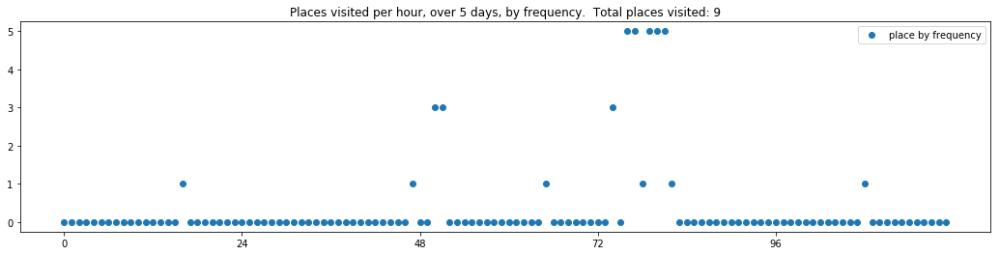


-------showing vectors for model: C-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:False-max_len:24-rnn_layers:2-rnn_size:128-dropout:0.2-dim_embeddings:50-temperature:0.8
----- vector ----
prefix labels:  [115, 61]
[0, 0, 0, 0, 0, 0, 0, 0, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 115, 115, 115, 115, 115, 115]
[115, 115, 115, 115, 115, 115, 115, 115, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 115, 115, 115, 115, 115, 115]
[115, 115, 115, 115, 115, 115, 115, 115, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 115, 0, 115, 115, 115]
[115, 115, 115, 115, 115, 115, 115, 115, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 115, 115]
[115, 115, 115, 115, 115, 115, 115, 115, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61, 115]


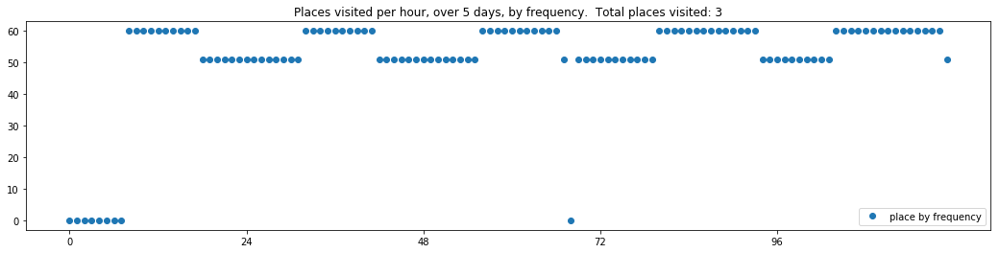

----- vector ----
prefix labels:  [73, 392]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 392, 73, 73, 73, 73, 73, 73]
[73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 0, 119, 119, 0, 73, 73, 73]
[73, 0, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 32, 32, 0, 73, 73, 73, 73, 73]
[73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73]
[73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73, 73]


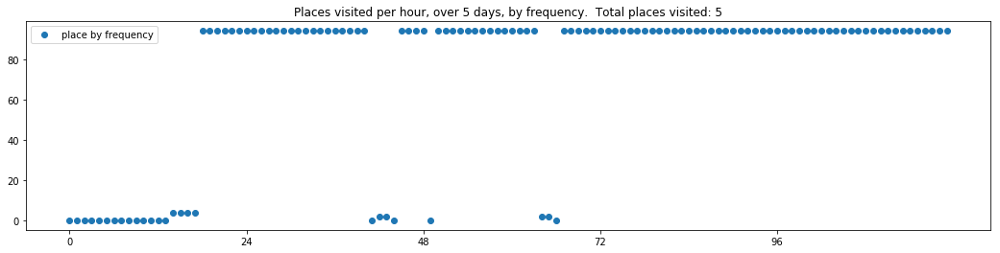

----- vector ----
prefix labels:  [131, 131]
[131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131]
[131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131]
[131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131]
[131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131]
[131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131, 131]


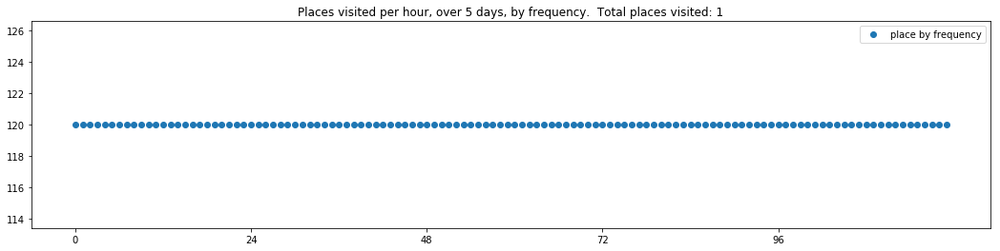


-------showing vectors for model: C.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:False-max_len:24-rnn_layers:2-rnn_size:128-dropout:0.2-dim_embeddings:50-temperature:0.9
----- vector ----
prefix labels:  [563, 563]
[0, 0, 0, 0, 0, 0, 0, 0, 563, 563, 0, 0, 0, 0, 563, 563, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 563, 563, 563, 563, 563, 563, 0, 94, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 0, 0]
[0, 0, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563, 563]


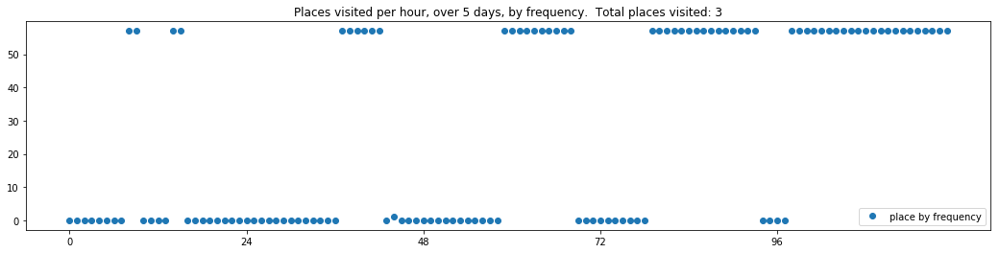

----- vector ----
prefix labels:  [143, 143]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 270, 143, 0, 0, 143, 143, 143, 143, 143, 143, 143, 143, 143]
[143, 143, 143, 143, 143, 143, 143, 143, 143, 0, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143]
[143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143]
[143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143]
[143, 143, 143, 0, 0, 0, 0, 0, 0, 0, 0, 0, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143, 143]


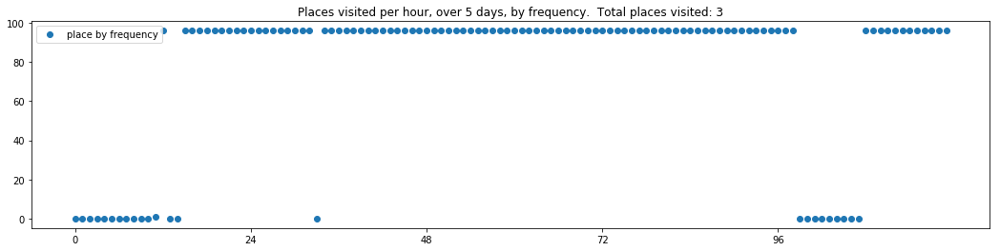

----- vector ----
prefix labels:  [192, 192]
[0, 0, 0, 0, 0, 0, 0, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192]
[192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192]
[192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192]
[192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192]
[192, 192, 192, 192, 192, 192, 192, 192, 192, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


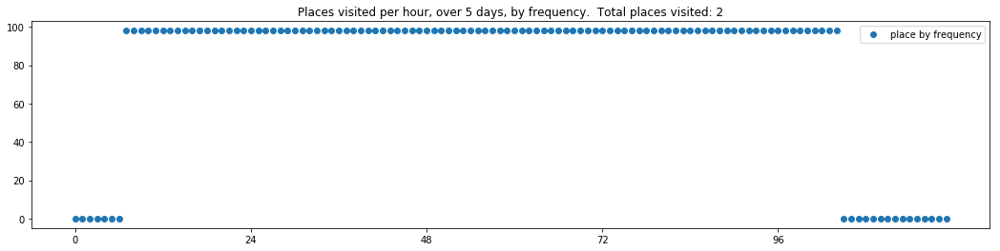


-------showing vectors for model: C.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:False-max_len:24-rnn_layers:2-rnn_size:128-dropout:0.2-dim_embeddings:50-temperature:1.0
----- vector ----
prefix labels:  [12, 12]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 227, 0, 0, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12]
[12, 0, 0, 0, 2, 2, 0, 0, 0, 12, 12, 12, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 12, 12]
[12, 12, 12, 12, 12, 0, 0, 0, 0, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12]
[12, 12, 12, 0, 0, 0, 0, 0, 12, 12, 12, 12, 13, 13, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12]
[12, 12, 12, 0, 0, 0, 18, 12, 12, 12, 12, 12, 13, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12]


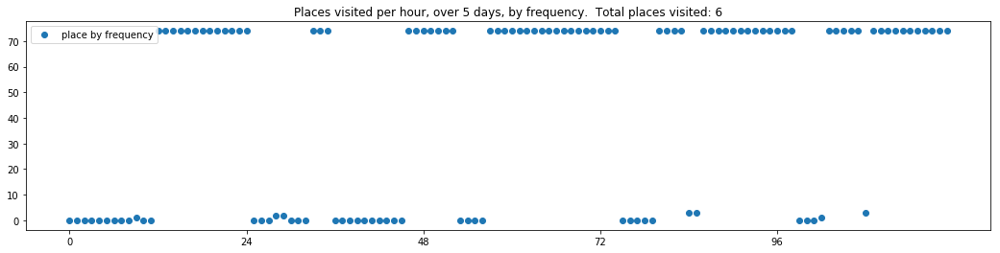

----- vector ----
prefix labels:  [110, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 340, 340, 340, 340, 340]
[340, 340, 340, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 340, 340, 340, 340, 340]
[340, 340, 340, 340, 340, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 340, 340, 340, 340, 340, 340, 340, 340, 340, 340, 340, 340, 340, 340, 340, 340, 340, 340, 340, 338, 338]


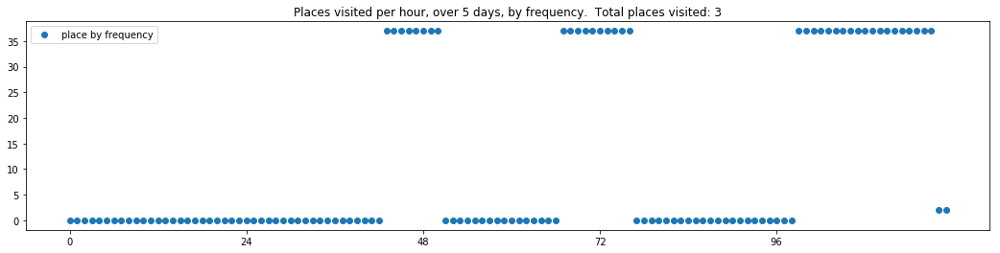

----- vector ----
prefix labels:  [231, 231]
[231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231]
[231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 0, 231, 231]
[231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 185, 185, 185]
[0, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231]
[231, 231, 231, 231, 231, 0, 0, 0, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231, 231]


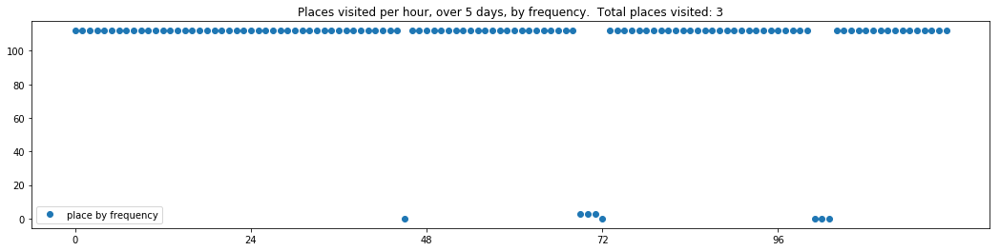


-------showing vectors for model: E-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:False-max_len:48-rnn_layers:2-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:0.8
----- vector ----
prefix labels:  [455, 455]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 455, 455, 455]
[455, 455, 455, 455, 455, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 455, 455, 455, 455, 455, 455]
[455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 0, 0, 0, 0, 0, 0, 0, 0, 455, 455, 455, 455, 455]
[455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455]
[455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455, 455]


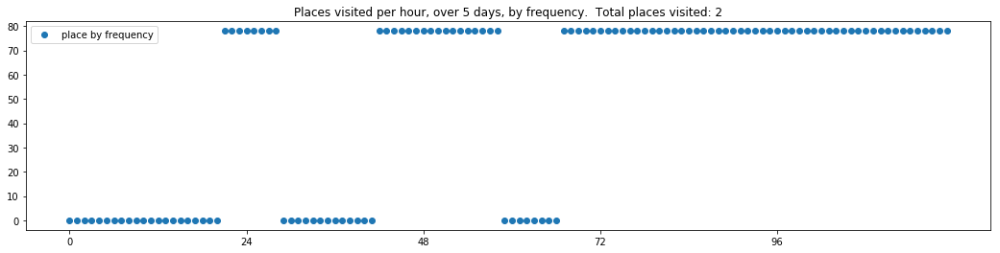

----- vector ----
prefix labels:  [202, 202]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 202, 202, 202]
[202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202]
[202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202]
[202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202]
[202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202]


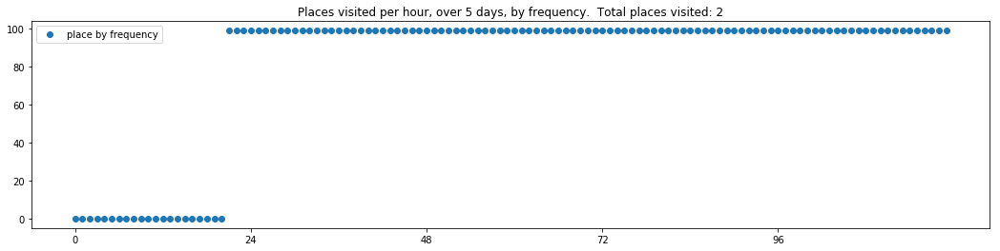

----- vector ----
prefix labels:  [617, 150]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 87, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 87, 87, 87, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 87, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 87, 87, 87, 87, 87, 87, 87, 87, 87, 0, 0, 0, 0, 0, 0, 0, 0]


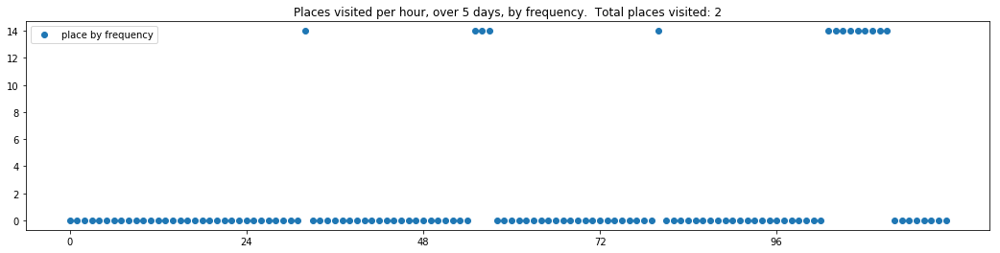


-------showing vectors for model: E.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:False-max_len:48-rnn_layers:2-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:0.9
----- vector ----
prefix labels:  [220, 295]
[0, 0, 0, 0, 0, 0, 0, 0, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 220, 220, 220, 220]
[220, 220, 220, 220, 220, 220, 220, 220, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 0, 0, 220, 220, 220, 220]
[220, 220, 220, 220, 220, 220, 220, 220, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 220, 220, 220, 220]
[220, 220, 220, 220, 0, 0, 0, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 220, 220, 220, 220]
[220, 220, 220, 220, 220, 220, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 295, 220, 220, 220, 220]


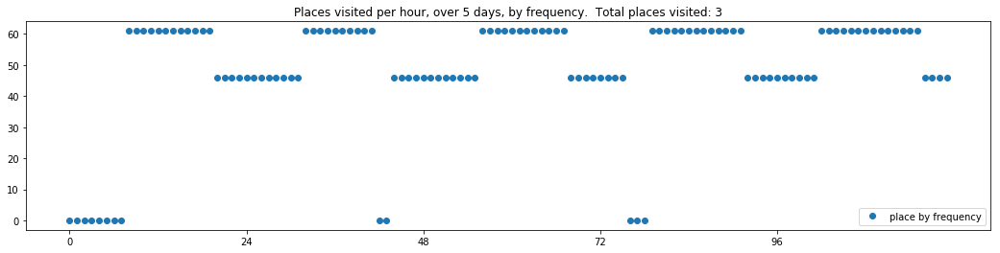

----- vector ----
prefix labels:  [491, 548]
[0, 0, 0, 0, 0, 0, 0, 0, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 255, 333, 455, 308, 491, 491]
[491, 491, 491, 491, 491, 491, 491, 491, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 491, 491, 491, 491, 491, 491]
[491, 491, 491, 491, 491, 491, 491, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 491, 491]
[491, 491, 491, 491, 491, 491, 491, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 548, 491, 491, 491]
[491, 491, 491, 491, 491, 491, 147, 147, 147, 147, 147, 147, 147, 94, 548, 548, 548, 548, 548, 548, 548, 548, 491, 491]


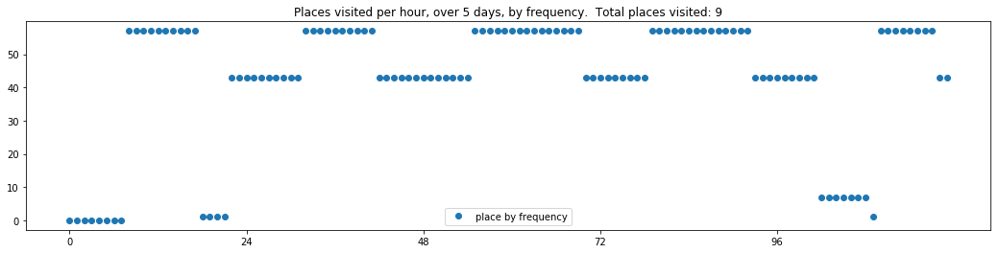

----- vector ----
prefix labels:  [306, 306]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 306, 306, 306, 306, 306, 306, 306, 306]
[306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306]
[306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306]
[306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306]
[306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306, 0, 306, 306, 306, 306, 306, 306]


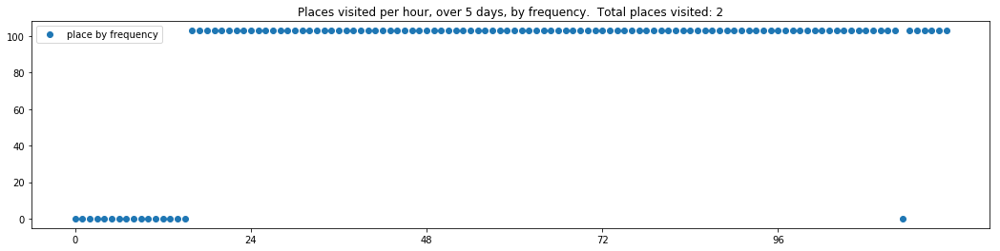


-------showing vectors for model: E.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:False-max_len:48-rnn_layers:2-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:1.0
----- vector ----
prefix labels:  [370, 370]
[0, 0, 0, 0, 0, 370, 370, 370, 370, 370, 370, 370, 370, 370, 370, 370, 370, 370, 370, 370, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 370, 370, 370, 370, 370, 370, 370, 370, 370, 370, 370, 370, 370, 370, 370, 370, 140, 140, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 370, 370, 370, 370, 370, 370, 370, 370, 370, 370, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 370, 370, 370, 370, 370, 370, 370, 370, 370, 370, 370, 370, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 370, 370, 370, 0, 0, 0, 0]


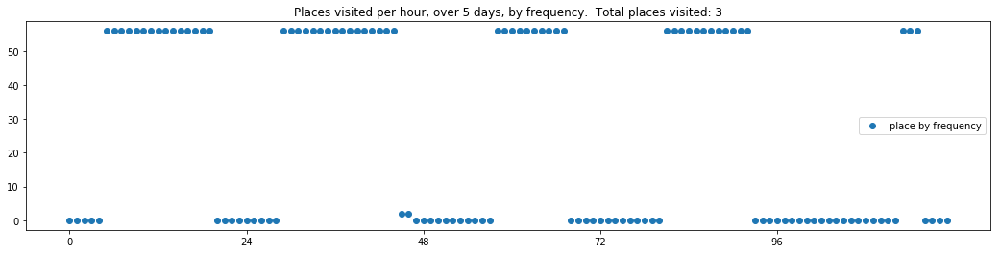

----- vector ----
prefix labels:  [152, 152]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 152, 152, 152, 152, 152, 152, 152, 152]
[152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152]
[152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152]
[152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152]
[152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152, 152]


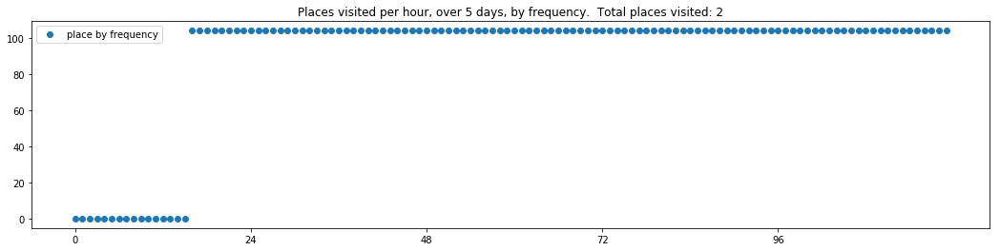

----- vector ----
prefix labels:  [432, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 401, 484, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 353, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 614, 21, 21, 21, 21, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


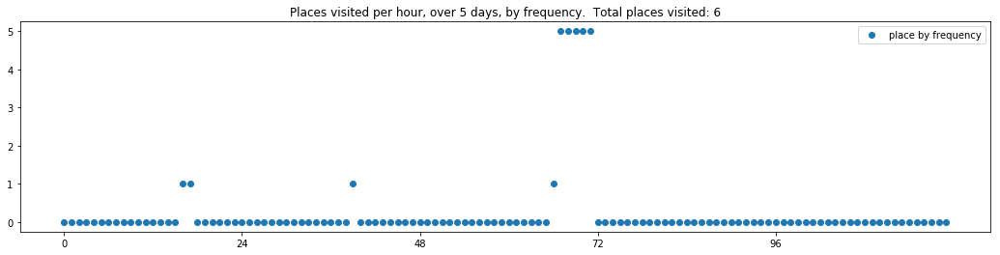


-------showing vectors for model: O-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:False-max_len:48-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:0.8
----- vector ----
prefix labels:  [200, 41]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 41, 0, 424, 570, 570, 570, 570, 570, 570, 570, 570, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 463, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


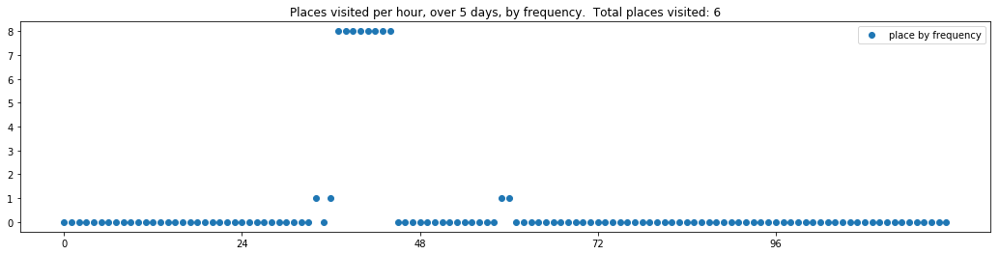

----- vector ----
prefix labels:  [522, 522]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 522, 522, 522]
[522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 0, 0, 0, 522, 522, 522, 522]
[522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522]
[522, 522, 522, 522, 522, 522, 522, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 522, 522, 522, 522, 522]
[522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522, 522]


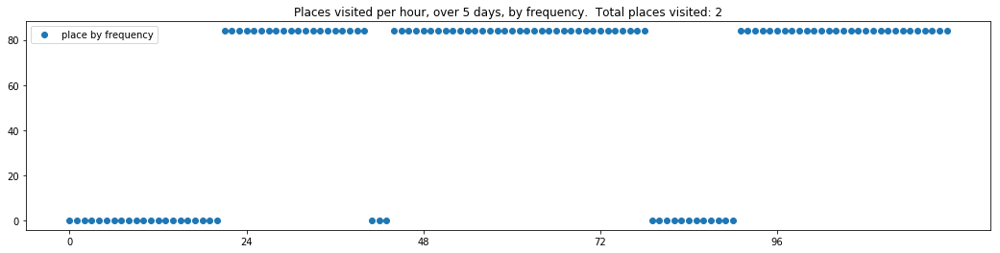

----- vector ----
prefix labels:  [195, 195]
[0, 0, 0, 0, 0, 0, 0, 0, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195]
[195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 200, 195, 195, 195, 195, 195, 195, 195, 195]
[195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195]
[195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195]
[195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195, 195]


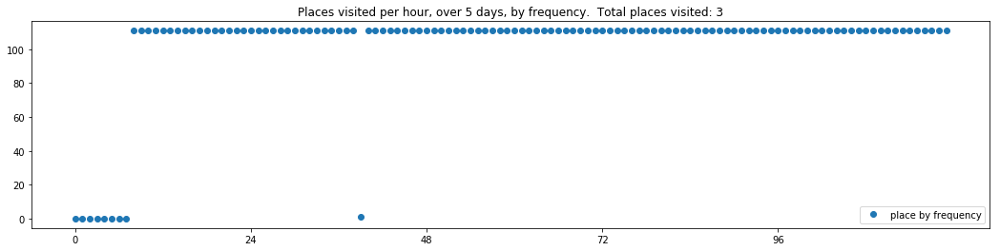


-------showing vectors for model: O.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:False-max_len:48-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:0.9
----- vector ----
prefix labels:  [104, 104]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 104, 104, 104, 104, 104, 104, 104]
[104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104]
[104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 109, 104, 104, 104, 104]
[104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104]
[104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 609, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104]


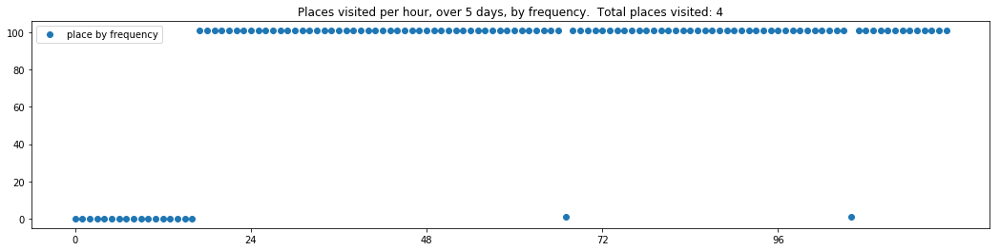

----- vector ----
prefix labels:  [30, 30]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30]
[30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30]
[30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30]
[30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30]
[30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30]


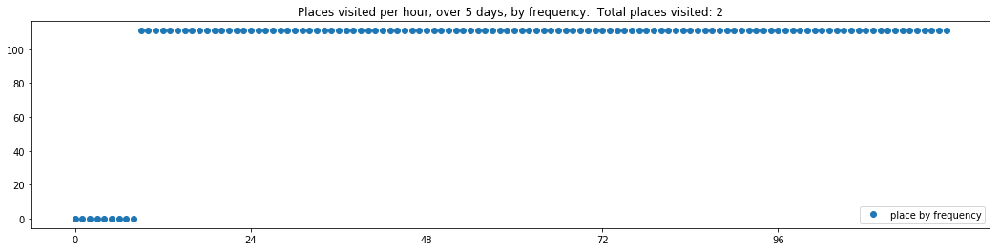

----- vector ----
prefix labels:  [522, 267]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 370, 77, 77, 77, 77, 77, 77, 77, 77, 77, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


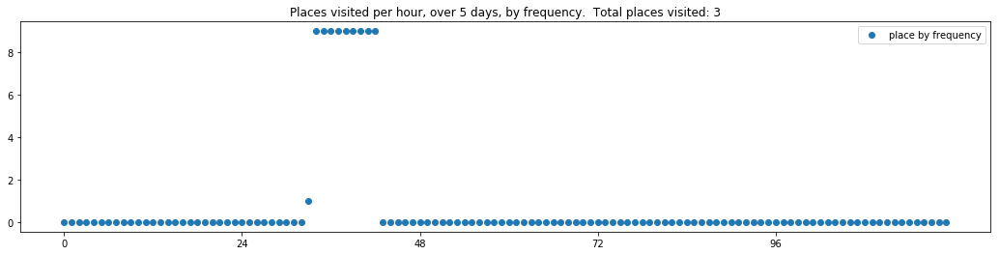


-------showing vectors for model: O.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:False-max_len:48-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:1.0
----- vector ----
prefix labels:  [384, 177]
[0, 0, 0, 0, 0, 0, 116, 116, 116, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 580, 126, 183, 42, 299, 0, 638, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 189, 116, 539, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 95, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


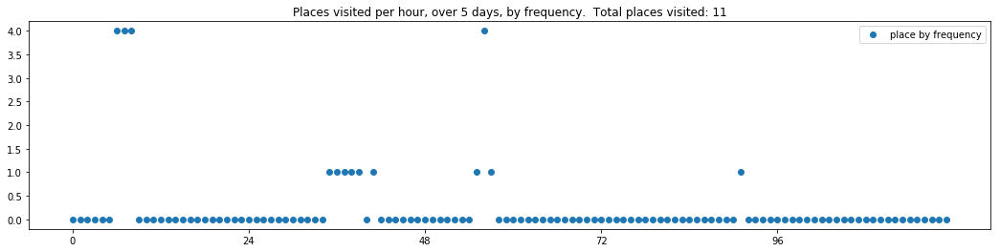

----- vector ----
prefix labels:  [615, 615]
[0, 0, 0, 0, 0, 0, 0, 615, 484, 225, 484, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615]
[615, 615, 615, 615, 0, 479, 225, 615, 615, 615, 615, 151, 151, 615, 0, 0, 0, 0, 615, 615, 615, 615, 615, 615]
[615, 615, 615, 615, 615, 615, 615, 0, 615, 0, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615]
[615, 615, 615, 615, 615, 409, 615, 76, 76, 76, 76, 76, 76, 615, 0, 0, 615, 615, 21, 615, 479, 0, 0, 479]
[0, 0, 615, 615, 615, 615, 615, 615, 409, 409, 225, 615, 615, 0, 615, 615, 615, 615, 615, 615, 615, 615, 615, 615]


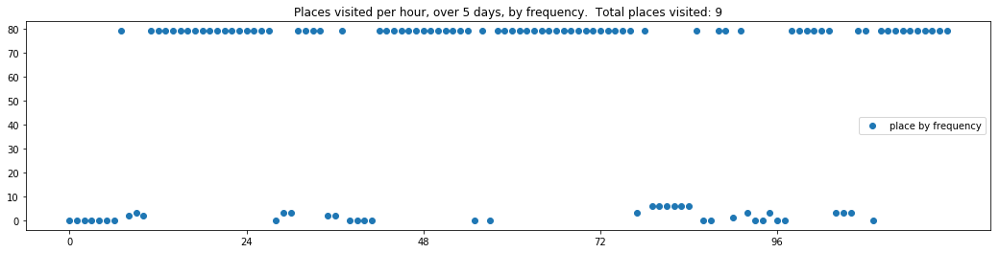

----- vector ----
prefix labels:  [478, 142]
[0, 0, 0, 340, 340, 340, 340, 351, 151, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 0, 0, 0]
[0, 0, 478, 151, 151, 340, 151, 151, 351, 151, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 339, 142, 142, 142]
[142, 142, 142, 142, 142, 142, 0, 0, 0, 0, 142, 142, 142, 142, 142, 0, 142, 142, 142, 142, 142, 142, 142, 142]
[142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142]
[142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142]


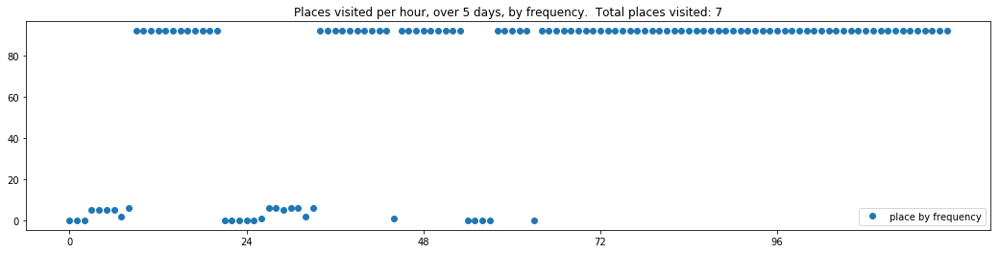


-------showing vectors for model: default-bidirectional-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:24-rnn_layers:2-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:0.8
----- vector ----
prefix labels:  [478, 478]
[478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478]
[478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478]
[478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478]
[478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478]
[478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478, 478]


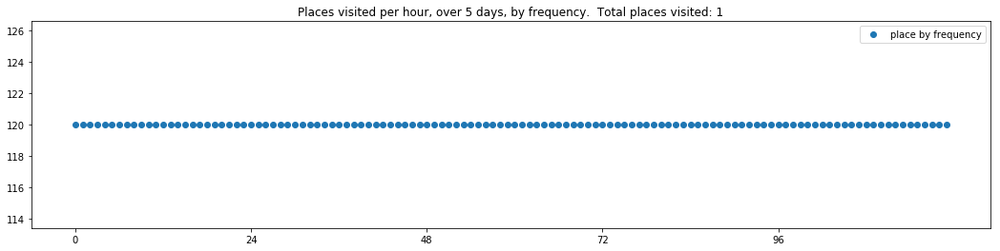

----- vector ----
prefix labels:  [190, 146]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 276, 276, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


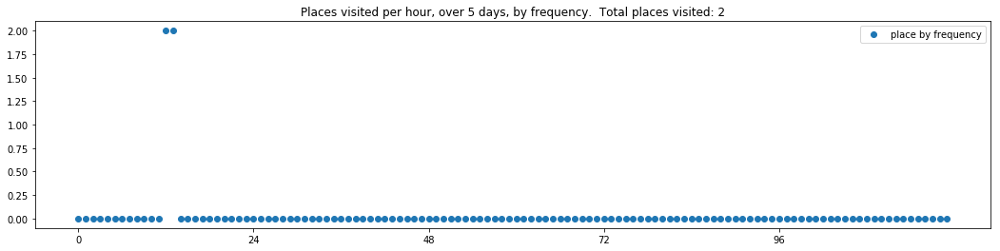

----- vector ----
prefix labels:  [539, 224]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


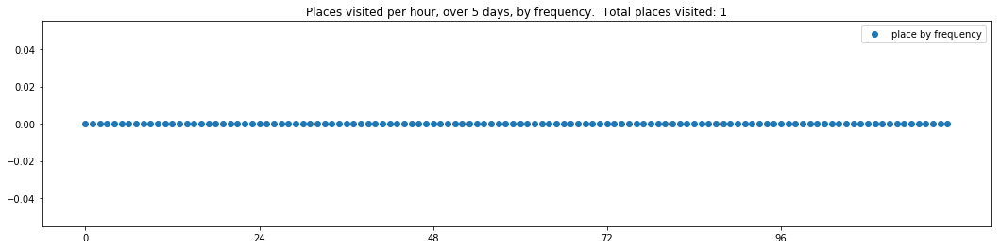


-------showing vectors for model: default-bidirectional.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:24-rnn_layers:2-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:0.9
----- vector ----
prefix labels:  [76, 76]
[0, 0, 0, 0, 0, 0, 0, 76, 76, 76, 76, 0, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76]
[76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76]
[76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76]
[76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76]
[76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76]


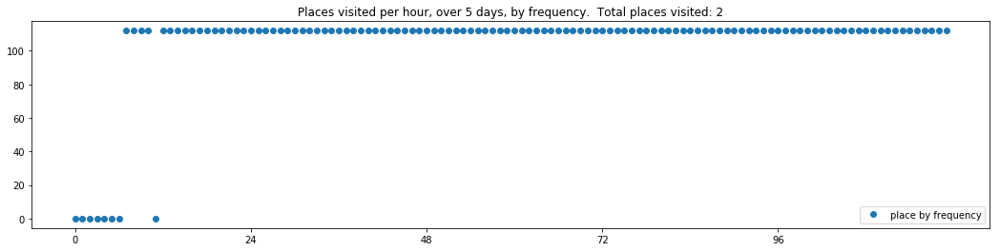

----- vector ----
prefix labels:  [106, 106]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106]
[106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106]
[106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106]
[106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 106, 0, 0, 4, 4, 94, 94, 94, 94, 94, 94, 94, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 94, 94, 94, 94, 94, 94, 94, 94]


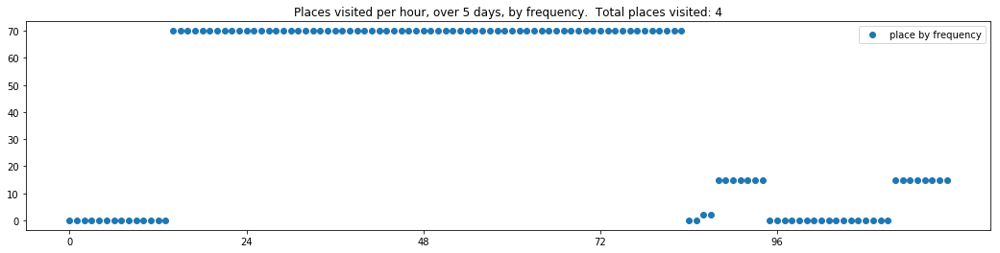

----- vector ----
prefix labels:  [397, 397]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 526, 332, 0, 397, 397, 397, 397, 397, 397, 397, 397, 397, 397]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 397, 397, 397, 397, 397, 397, 397, 397, 397, 397]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 397, 397, 397, 397, 397, 397, 397, 397, 397, 397]
[397, 397, 397, 397, 397, 397, 397, 0, 0, 0, 0, 0, 0, 0, 0, 397, 397, 397, 397, 397, 397, 397, 397, 397]
[397, 397, 397, 397, 397, 397, 397, 397, 397, 397, 397, 397, 0, 0, 397, 397, 397, 397, 397, 397, 397, 397, 397, 397]


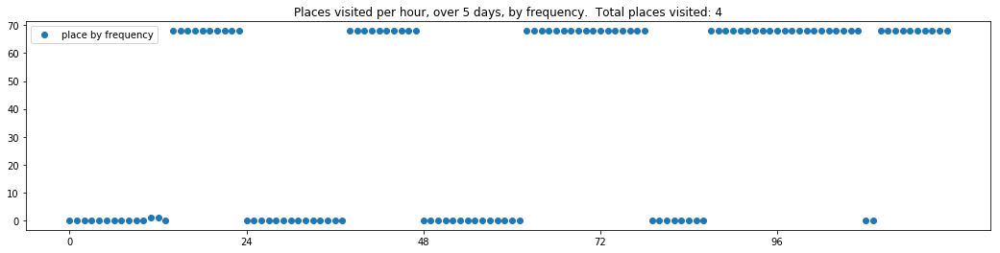


-------showing vectors for model: default-bidirectional.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:24-rnn_layers:2-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:1.0
----- vector ----
prefix labels:  [335, 10]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 591, 591, 591, 591, 591, 462, 453, 453, 591, 591, 0, 0, 335, 335]
[335, 335, 335, 335, 335, 335, 335, 335, 10, 591, 591, 591, 591, 591, 591, 12, 12, 12, 12, 12, 12, 12, 12, 335]
[335, 335, 614, 614, 614, 614, 614, 614, 614, 614, 614, 591, 591, 591, 591, 591, 630, 630, 630, 630, 630, 630, 630, 630]
[335, 335, 614, 614, 614, 614, 614, 614, 614, 614, 614, 591, 591, 591, 591, 591, 591, 591, 323, 98, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 93, 93, 93, 93, 483, 483, 483, 483]


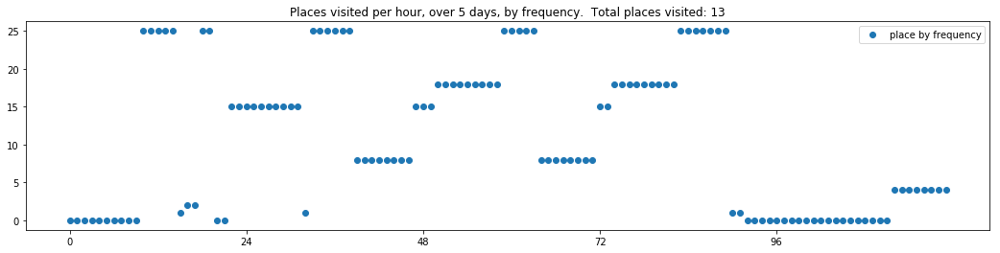

----- vector ----
prefix labels:  [308, 308]
[0, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308]
[308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308]
[308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308]
[308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308]
[308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308]


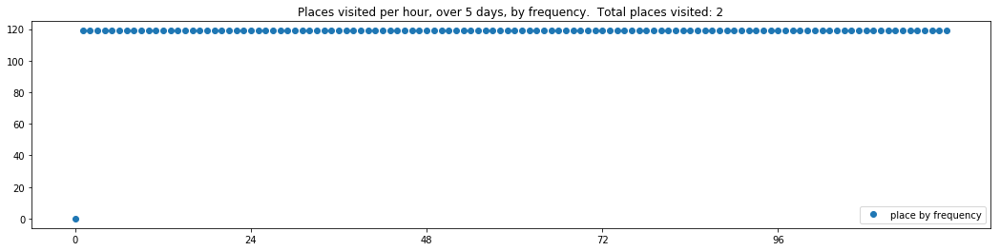

----- vector ----
prefix labels:  [342, 87]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 52, 503, 503]
[503, 503, 503, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


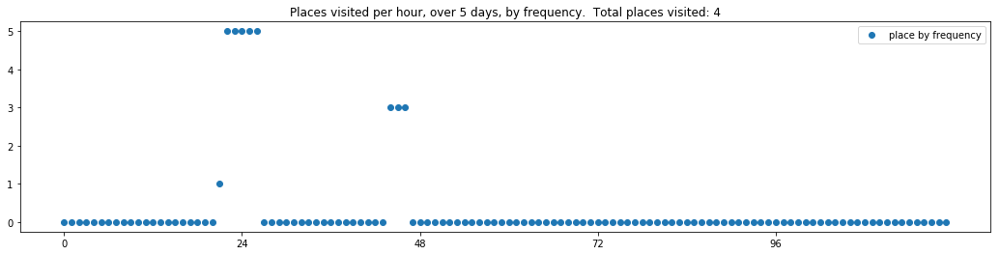


-------showing vectors for model: A-bidirectional-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:24-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:0.8
----- vector ----
prefix labels:  [607, 607]
[0, 0, 0, 0, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607]
[607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607]
[607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607]
[607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607]
[607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607, 607]


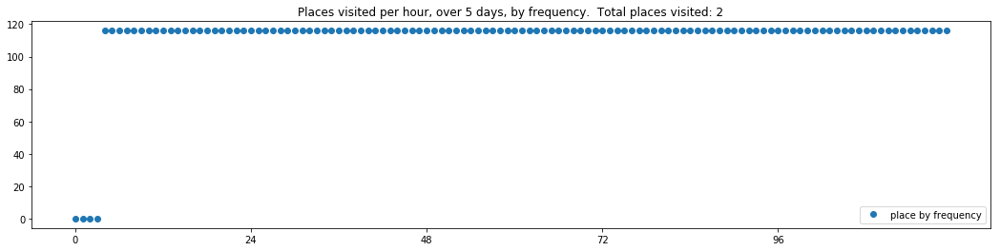

----- vector ----
prefix labels:  [21, 21]
[0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 55, 0, 0, 0, 0, 0, 0]


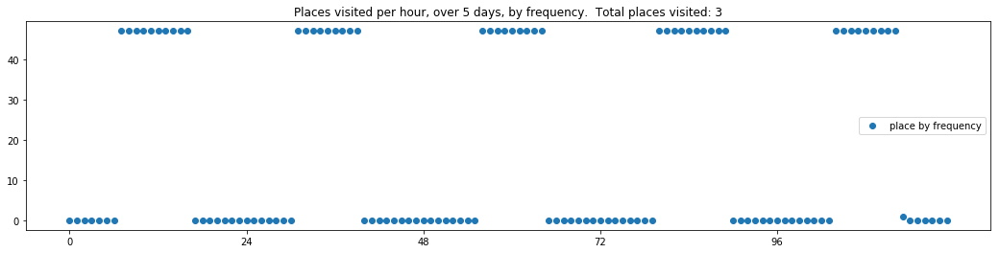

----- vector ----
prefix labels:  [459, 459]
[0, 0, 0, 0, 0, 0, 0, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 436, 436]
[436, 436, 436, 339, 339, 339, 339, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459]
[459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459]
[459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459]
[459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 459, 0, 0, 0, 0, 0]


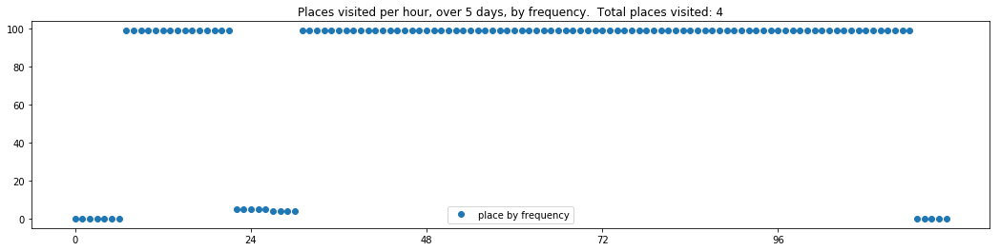


-------showing vectors for model: A-bidirectional.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:24-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:0.9
----- vector ----
prefix labels:  [95, 95]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 95, 95, 95, 95, 95, 95]
[95, 95, 95, 95, 95, 95, 95, 95, 4, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 229, 229, 229, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


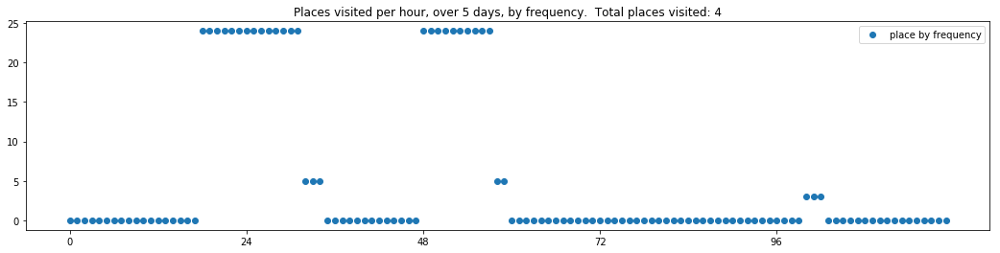

----- vector ----
prefix labels:  [572, 572]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 548, 0, 0, 0, 0, 0, 572, 572, 572]
[572, 572, 572, 572, 572, 572, 572, 0, 0, 0, 0, 0, 0, 0, 0, 548, 572, 572, 572, 572, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 48, 48, 48, 48, 48, 48, 48, 48, 48, 108, 0, 0, 0, 0, 0, 0, 0, 0]


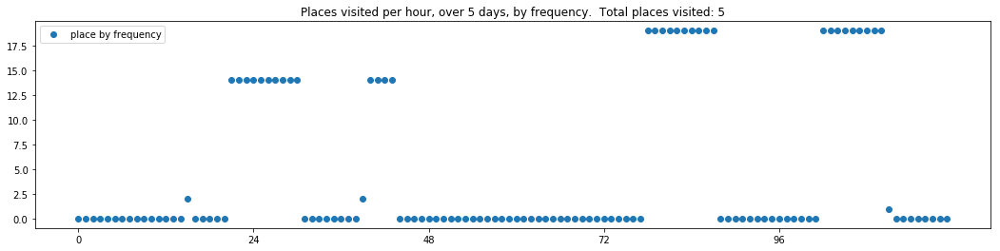

----- vector ----
prefix labels:  [54, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 87, 87, 87, 87, 87, 87, 87, 0, 0, 0, 0, 0, 0, 0, 0, 0]


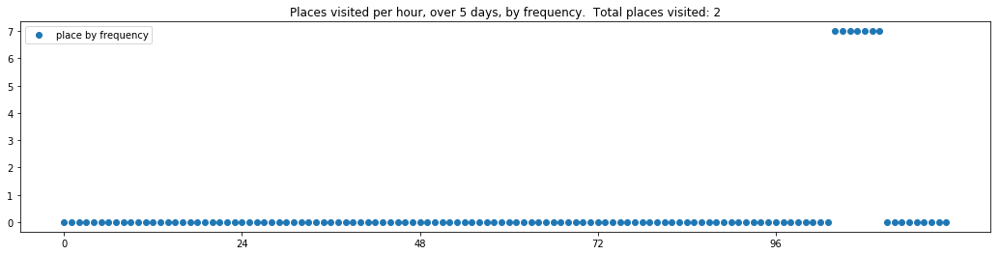


-------showing vectors for model: A-bidirectional.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:24-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:1.0
----- vector ----
prefix labels:  [395, 395]
[0, 0, 0, 0, 0, 0, 395, 395, 78, 78, 78, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395]
[395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395, 395]
[395, 395, 395, 395, 395, 395, 395, 395, 395, 0, 439, 439, 439, 439, 439, 439, 0, 395, 395, 395, 395, 395, 395, 395]
[395, 395, 395, 395, 395, 395, 395, 395, 395, 439, 439, 439, 439, 439, 439, 439, 439, 439, 0, 395, 395, 395, 395, 395]
[395, 395, 395, 395, 395, 395, 395, 395, 396, 439, 439, 439, 439, 439, 439, 439, 439, 439, 0, 395, 395, 395, 395, 395]


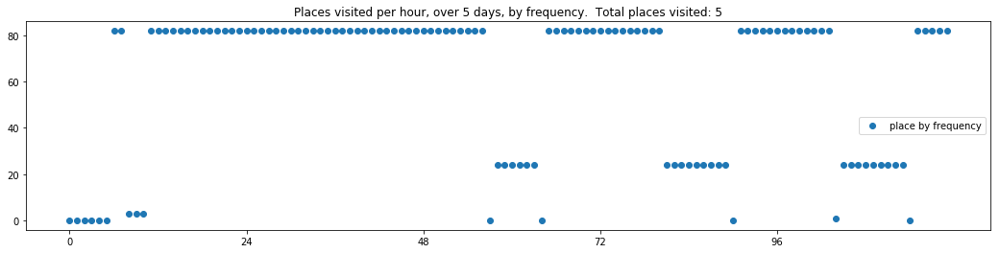

----- vector ----
prefix labels:  [60, 60]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 523, 400, 60, 60, 60, 60, 60, 60, 60, 292, 60, 60, 60, 60, 60]
[60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60]
[60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60]
[60, 60, 60, 60, 60, 60, 0, 0, 0, 0, 0, 0, 0, 0, 60, 60, 60, 60, 60, 60, 60, 60, 60, 259]
[259, 259, 259, 259, 259, 259, 259, 259, 259, 259, 259, 259, 259, 259, 259, 259, 259, 259, 259, 259, 259, 259, 259, 259]


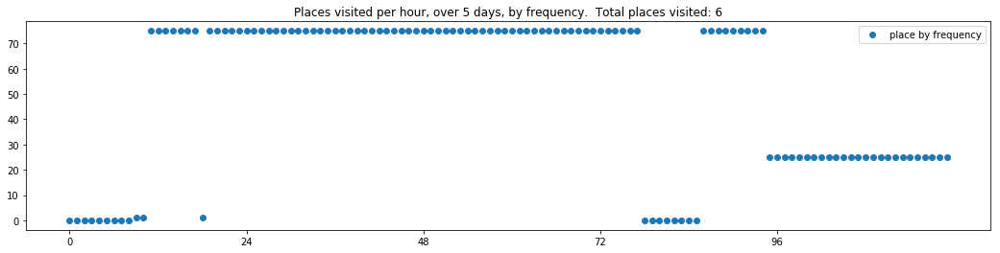

----- vector ----
prefix labels:  [545, 545]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 97, 97, 97, 545, 545, 545, 545, 0, 545, 545, 545, 545, 545, 545, 545]
[545, 545, 545, 545, 545, 545, 545, 274, 0, 0, 0, 0, 0, 0, 171, 0, 545, 545, 545, 545, 545, 545, 545, 545]
[545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 0, 171, 0, 0, 545, 0, 0, 545, 545, 545, 545, 545, 545, 545]
[545, 545, 545, 545, 545, 545, 545, 97, 545, 97, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545]
[545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545]


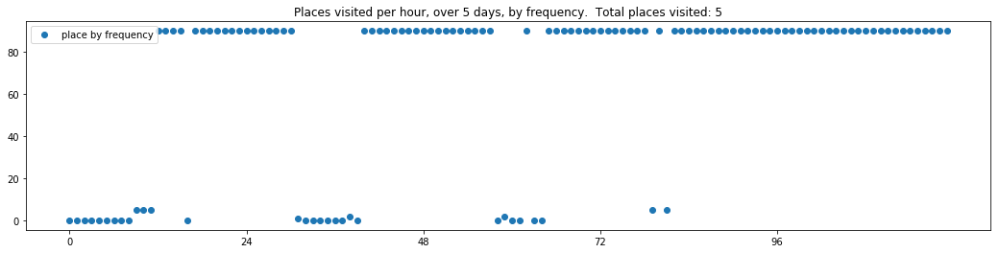


-------showing vectors for model: O-bidirectional-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:48-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:0.8
----- vector ----
prefix labels:  [529, 529]
[0, 0, 0, 0, 0, 0, 0, 0, 529, 529, 529, 529, 529, 0, 0, 0, 0, 0, 0, 0, 0, 0, 529, 529]
[529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529]
[529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529]
[529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529]
[529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529, 529]


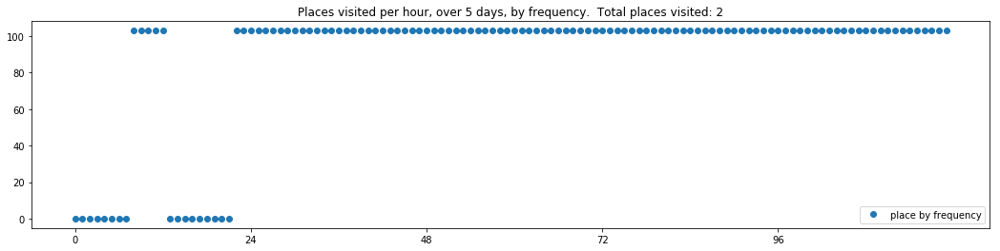

----- vector ----
prefix labels:  [222, 224]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 87, 0, 222, 0, 0, 0]
[222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


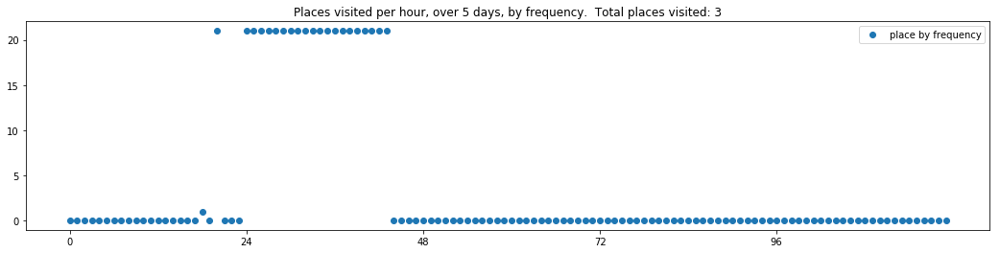

----- vector ----
prefix labels:  [572, 572]
[0, 0, 0, 0, 0, 0, 0, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572]
[572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572]
[572, 572, 572, 572, 572, 572, 572, 572, 572, 0, 0, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572]
[572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 0, 0, 0, 0, 0, 572, 572, 572, 572, 572, 572, 572, 572]
[572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572]


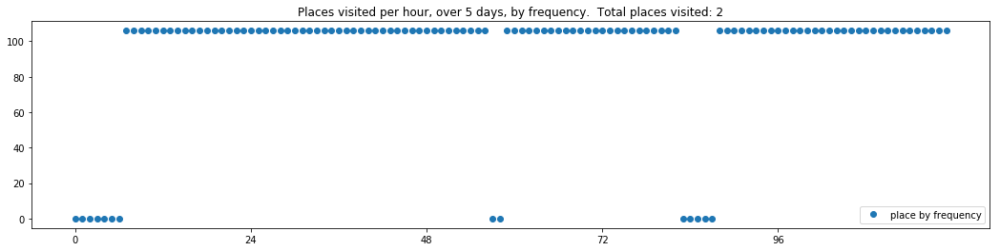


-------showing vectors for model: O-bidirectional.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:48-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:0.9
----- vector ----
prefix labels:  [349, 8]
[0, 0, 267, 267, 267, 267, 267, 267, 267, 267, 0, 0, 0, 0, 0, 0, 0, 0, 0, 71, 71, 71, 71, 71]
[71, 71, 71, 71, 71, 71, 71, 357, 357, 267, 0, 267, 267, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 357, 357, 357, 357, 357, 357, 357, 357, 0, 0, 130, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357, 0, 0, 0, 0]


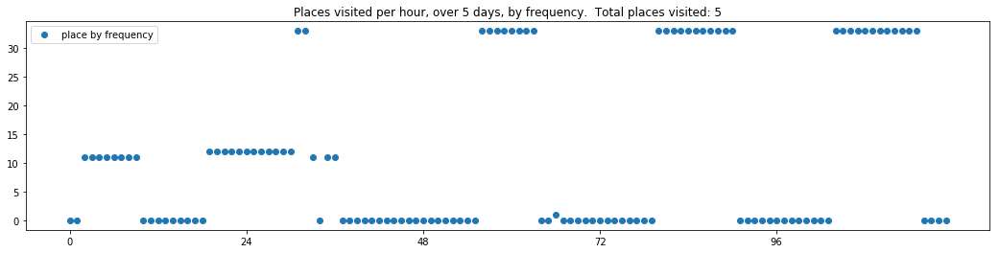

----- vector ----
prefix labels:  [542, 542]
[0, 0, 0, 0, 0, 0, 0, 594, 0, 119, 119, 119, 119, 119, 119, 76, 76, 76, 0, 0, 0, 0, 0, 0]
[0, 542, 542, 542, 542, 542, 542, 0, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542]
[542, 542, 542, 542, 542, 0, 0, 0, 0, 0, 0, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542]
[542, 542, 542, 542, 542, 542, 542, 542, 0, 0, 0, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542]
[542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542, 542]


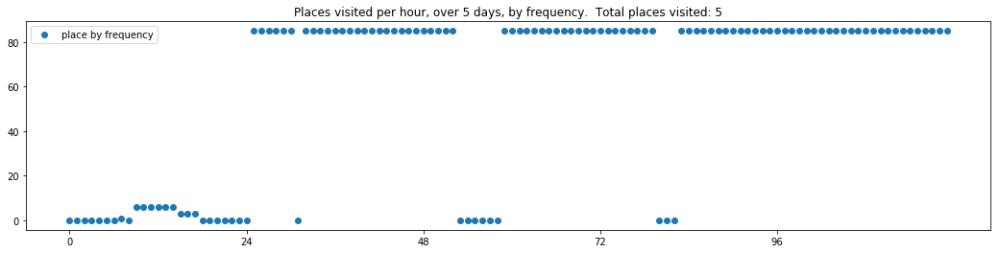

----- vector ----
prefix labels:  [494, 397]
[0, 0, 0, 0, 0, 0, 0, 0, 397, 397, 397, 397, 397, 397, 397, 397, 0, 494, 494, 494, 494, 494, 494, 494]
[494, 494, 494, 494, 494, 494, 494, 397, 397, 397, 397, 397, 397, 397, 397, 397, 494, 494, 494, 494, 494, 494, 494, 494]
[494, 494, 494, 494, 494, 494, 494, 494, 397, 397, 397, 397, 397, 397, 397, 397, 397, 494, 494, 494, 494, 494, 494, 494]
[494, 494, 494, 494, 494, 494, 494, 494, 397, 397, 397, 397, 397, 397, 397, 397, 397, 494, 494, 494, 494, 494, 494, 494]
[494, 494, 494, 494, 494, 494, 494, 494, 397, 397, 397, 397, 397, 397, 397, 397, 397, 494, 494, 494, 494, 494, 494, 494]


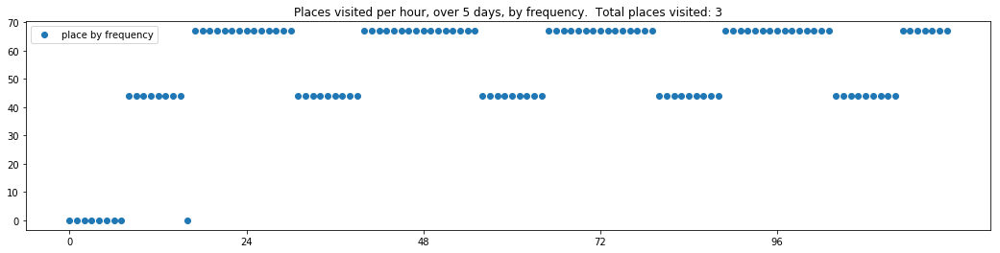


-------showing vectors for model: O-bidirectional.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:48-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:50-temperature:1.0
----- vector ----
prefix labels:  [341, 84]
[0, 0, 0, 0, 605, 605, 605, 605, 605, 605, 341, 341, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 304, 304, 165, 165, 165, 165, 0, 0, 0, 49, 242, 242, 242, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 242, 242, 242, 242, 242, 242, 242, 242, 242, 242]
[242, 242, 0, 0, 0, 0, 0, 0, 0, 0, 242, 242, 0, 0, 0, 242, 242, 242, 242, 242, 242, 242, 242, 242]


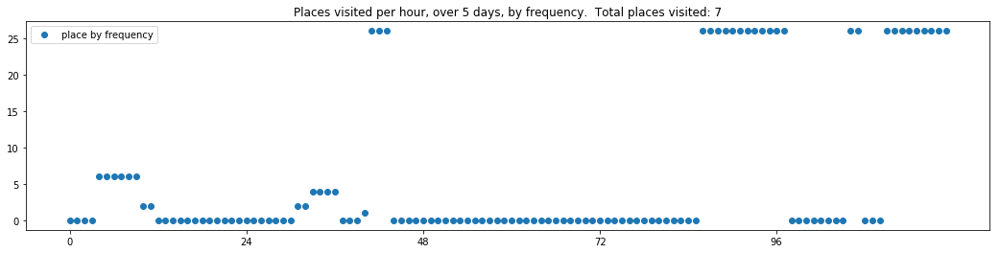

----- vector ----
prefix labels:  [631, 84]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 84, 84, 84, 84, 84, 0, 0, 0, 0, 631, 631, 631]
[631, 631, 631, 631, 631, 631, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 336, 631, 631, 631, 631, 631, 631, 631]
[631, 631, 631, 631, 398, 398, 398, 398, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 631, 631, 631]
[631, 631, 631, 631, 631, 631, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 631, 631, 631]
[631, 631, 631, 631, 631, 631, 398, 398, 398, 398, 398, 84, 84, 84, 84, 84, 84, 84, 84, 84, 84, 631, 631, 631]


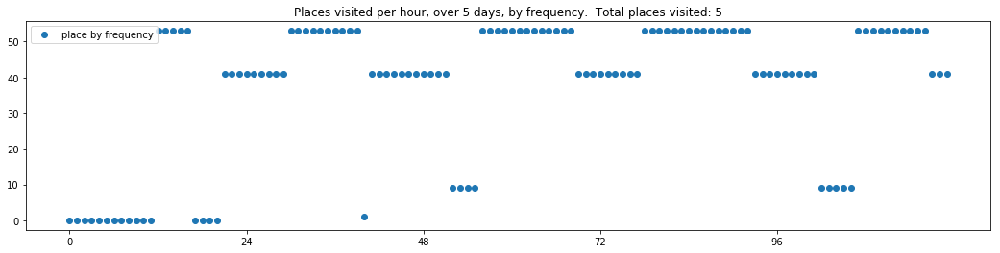

----- vector ----
prefix labels:  [545, 545]
[274, 274, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 171, 171, 545, 545, 495, 178, 274]
[274, 545, 545, 545, 545, 545, 545, 545, 183, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545]
[545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545]
[545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545]
[545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545, 545]


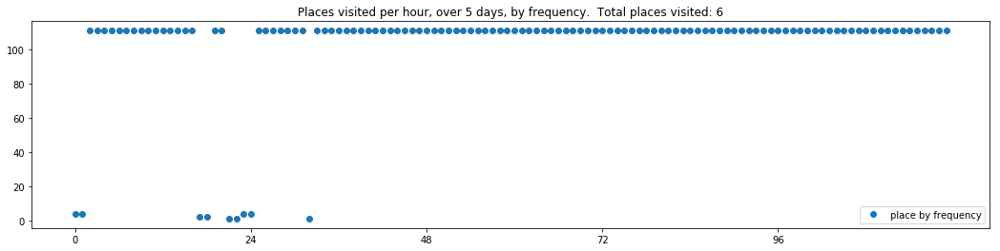


-------showing vectors for model: P-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:False-max_len:50-rnn_layers:3-rnn_size:128-dropout:0.2-dim_embeddings:128-temperature:0.8
----- vector ----
prefix labels:  [51, 271]
[0, 0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 169, 0, 0, 0, 0, 51]
[51, 51, 51, 51, 51, 51, 51, 51, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 51, 51, 51, 51, 51, 51]
[51, 51, 51, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 0, 0, 0, 271, 271, 271, 0, 0, 0, 0, 0, 0]


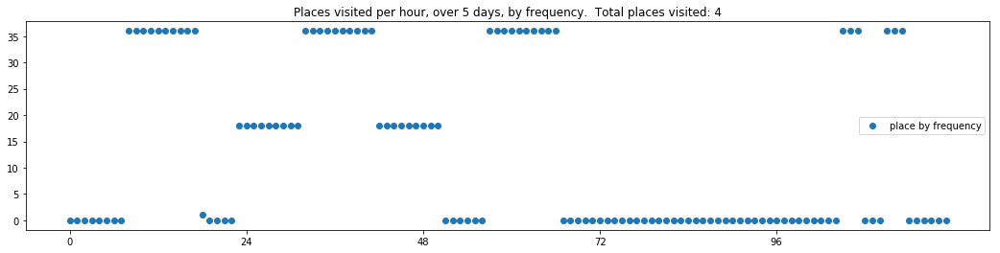

----- vector ----
prefix labels:  [597, 151]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 597, 597]
[597, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


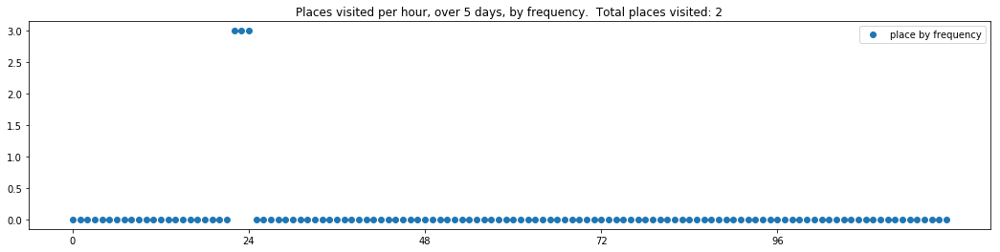

----- vector ----
prefix labels:  [435, 54]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 435, 435, 435, 435, 435]
[435, 435, 435, 435, 435, 435, 435, 435, 435, 435, 435, 435, 435, 435, 435, 435, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 435, 435, 435, 435, 435, 435, 435, 435, 435, 435, 435, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 435, 435, 435, 435, 435, 435, 435, 435, 435, 435, 435, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 435, 435, 435, 435, 435, 435, 435, 435, 435, 435, 0, 0, 0, 0, 0, 0, 0, 0, 0]


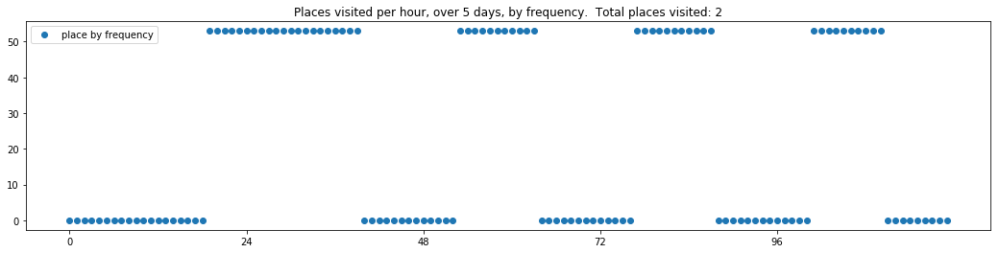


-------showing vectors for model: P.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:False-max_len:50-rnn_layers:3-rnn_size:128-dropout:0.2-dim_embeddings:128-temperature:0.9
----- vector ----
prefix labels:  [347, 76]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 347, 347, 347, 347]
[347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347]
[347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 347, 347, 347, 347]
[347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347]
[347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 347, 347, 347, 347]


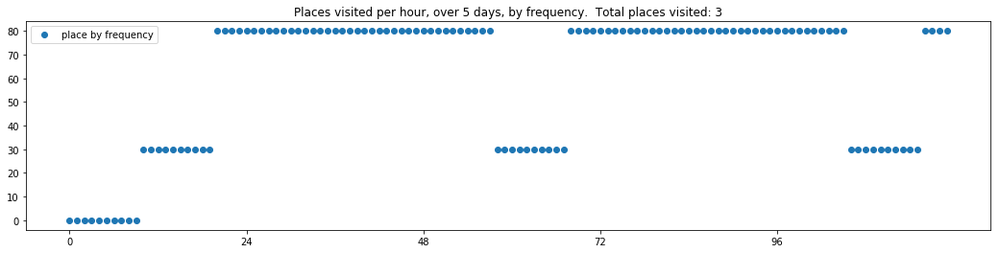

----- vector ----
prefix labels:  [24, 24]
[248, 248, 248, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24]
[24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 0, 0, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24]
[24, 24, 248, 248, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24]
[24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24]
[24, 24, 24, 24, 24, 0, 24, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 24]


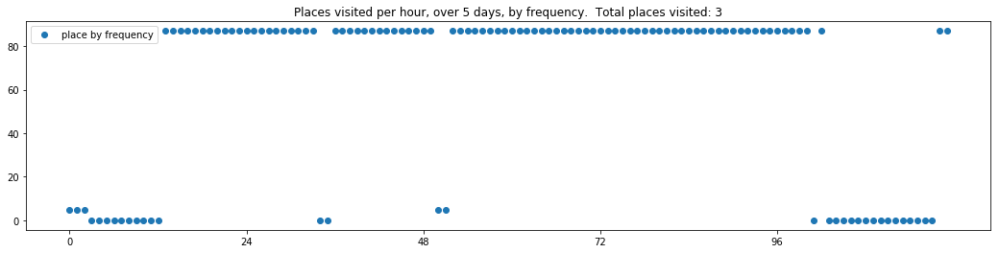

----- vector ----
prefix labels:  [7, 7]
[0, 0, 0, 0, 0, 0, 0, 0, 231, 151, 151, 151, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 435, 435, 435, 435, 435, 435, 435, 435, 435, 435, 435, 435]
[435, 435, 435, 435, 435, 435, 0, 0, 44, 0, 0, 0, 0, 435, 435, 435, 435, 435, 435, 435, 435, 435, 435, 435]


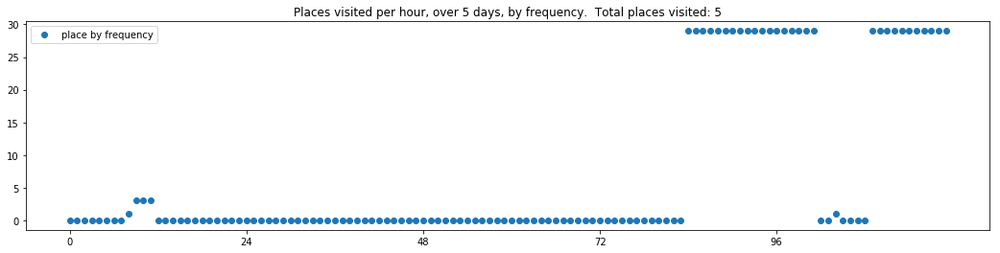


-------showing vectors for model: P.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:False-max_len:50-rnn_layers:3-rnn_size:128-dropout:0.2-dim_embeddings:128-temperature:1.0
----- vector ----
prefix labels:  [646, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 646, 646]
[646, 646, 646, 646, 646, 646, 646, 646, 646, 646, 646, 646, 646, 646, 646, 0, 0, 0, 0, 0, 0, 0, 0, 8]
[8, 8, 646, 646, 646, 646, 646, 646, 646, 646, 646, 646, 646, 0, 0, 0, 0, 0, 0, 0, 0, 646, 646, 646]
[646, 646, 646, 646, 646, 646, 646, 646, 646, 646, 646, 646, 646, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


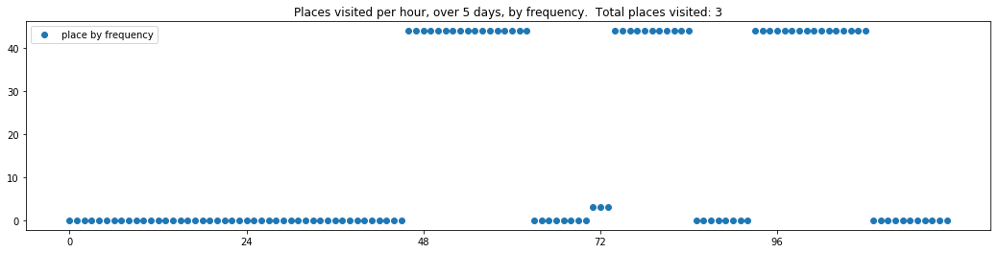

----- vector ----
prefix labels:  [225, 119]
[0, 0, 0, 0, 0, 0, 119, 119, 119, 119, 119, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 119, 119, 119, 119, 119, 119, 119, 119, 119, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 119, 119, 119, 119, 119, 119, 119, 119, 119, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 119, 119, 119, 119, 119, 119, 119, 119, 119, 119, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 119, 119, 119, 119, 119, 119, 119, 119, 119, 0, 0, 0, 0, 0, 0, 0, 0]


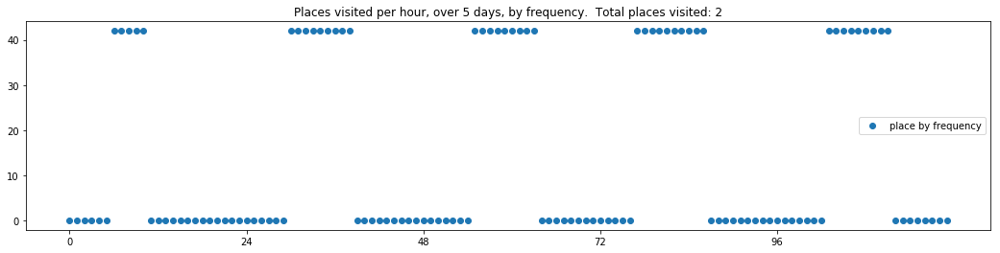

----- vector ----
prefix labels:  [160, 21]
[0, 0, 0, 0, 0, 0, 55, 21, 21, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 93, 0, 21, 21, 21, 21, 21, 21, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


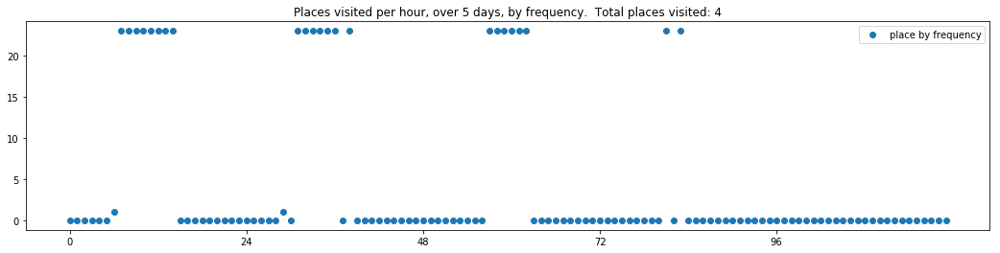


-------showing vectors for model: P-bidirectional-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:50-rnn_layers:3-rnn_size:128-dropout:0.2-dim_embeddings:128-temperature:0.8
----- vector ----
prefix labels:  [87, 87]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 87, 0, 87, 0, 0, 92, 0, 87, 87, 87]
[87, 87, 87, 87, 87, 87, 87, 87, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 87, 87, 87, 87, 87]
[87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 0, 0, 0, 0, 87, 87, 87]
[87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 87, 0, 0, 0, 0, 87, 87, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 87, 87]


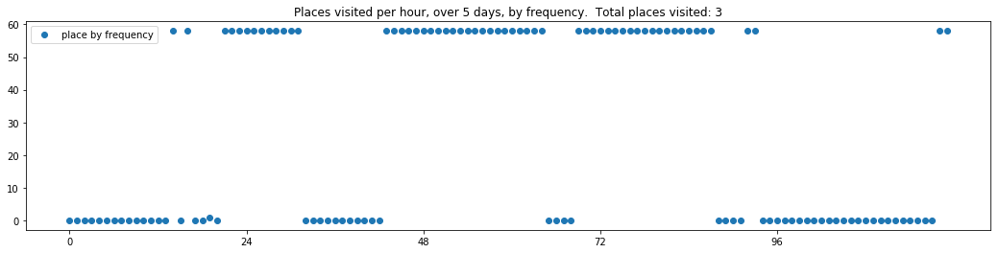

----- vector ----
prefix labels:  [413, 413]
[0, 0, 0, 0, 0, 0, 0, 0, 413, 413, 413, 413, 413, 413, 413, 413, 413, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 413, 413, 413, 413, 413, 413, 413, 413, 413, 413, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 413, 413, 413, 413, 413, 413, 413, 413, 413, 413, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 413, 413, 413, 413, 413, 413, 413, 413, 413, 413, 0, 0, 0, 0, 0, 0]


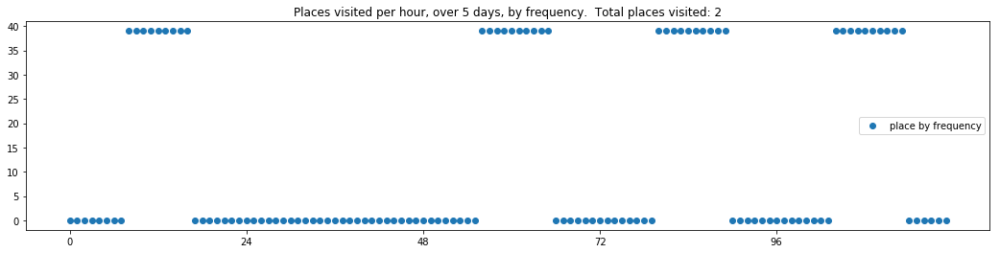

----- vector ----
prefix labels:  [317, 208]
[0, 0, 0, 0, 0, 0, 0, 627, 0, 0, 0, 0, 0, 0, 0, 476, 476, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 317, 317, 317, 317, 317, 317]
[317, 317, 317, 317, 317, 317, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 317, 317, 317, 317, 317, 317, 317, 317, 317, 317]
[317, 317, 317, 317, 317, 317, 317, 317, 317, 317, 317, 317, 317, 317, 317, 317, 317, 317, 317, 317, 317, 317, 317, 317]


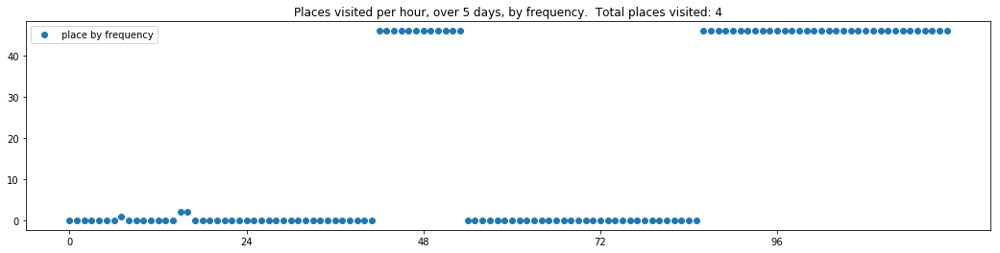


-------showing vectors for model: P-bidirectional.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:50-rnn_layers:3-rnn_size:128-dropout:0.2-dim_embeddings:128-temperature:0.9
----- vector ----
prefix labels:  [293, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 293, 293, 293, 293, 293, 293]
[293, 293, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 293, 293, 293, 293, 293, 293]
[293, 293, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 293, 293, 293, 293, 293, 293]
[293, 293, 293, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 293, 293, 293, 0, 293, 293]


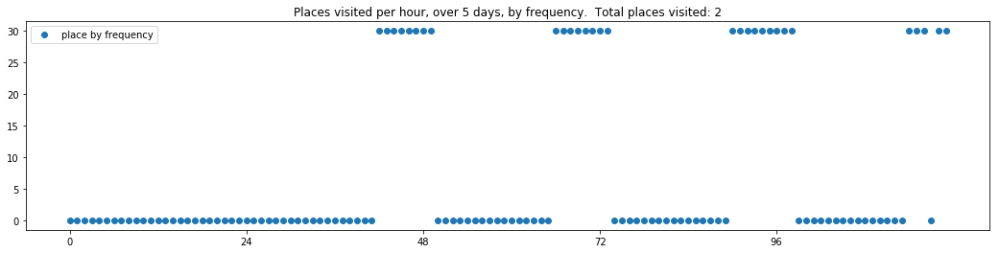

----- vector ----
prefix labels:  [224, 508]
[0, 0, 0, 0, 0, 0, 0, 508, 508, 508, 508, 508, 508, 508, 508, 508, 508, 508, 224, 224, 224, 224, 224, 224]
[224, 224, 224, 224, 224, 224, 224, 508, 508, 508, 508, 508, 508, 508, 508, 508, 508, 224, 224, 224, 224, 224, 224, 224]
[224, 224, 224, 224, 224, 224, 224, 508, 508, 508, 508, 508, 508, 508, 508, 508, 508, 224, 224, 224, 224, 224, 224, 224]
[224, 224, 224, 224, 224, 224, 224, 508, 508, 508, 508, 508, 508, 508, 508, 508, 508, 0, 0, 320, 224, 224, 224, 224]
[224, 224, 224, 224, 224, 224, 224, 508, 508, 508, 508, 508, 508, 0, 0, 0, 0, 0, 0, 224, 224, 224, 224, 224]


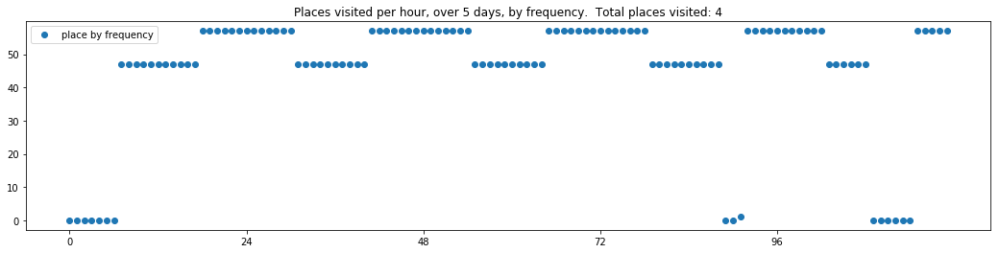

----- vector ----
prefix labels:  [205, 205]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 434, 0, 0, 0, 0, 0, 0]


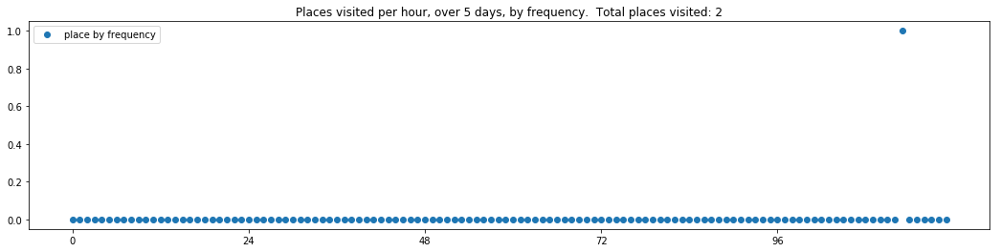


-------showing vectors for model: P-bidirectional.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:50-rnn_layers:3-rnn_size:128-dropout:0.2-dim_embeddings:128-temperature:1.0
----- vector ----
prefix labels:  [198, 558]
[0, 0, 0, 0, 0, 0, 198, 104, 104, 104, 603, 558, 558, 558, 137, 137, 137, 0, 0, 0, 0, 0, 0, 198]
[198, 198, 198, 198, 198, 198, 198, 261, 0, 0, 0, 558, 558, 558, 137, 0, 198, 198, 198, 198, 198, 198, 198, 198]
[198, 198, 198, 198, 198, 198, 198, 198, 104, 104, 104, 104, 104, 104, 137, 0, 0, 0, 198, 198, 198, 198, 198, 198]
[198, 198, 198, 198, 198, 198, 198, 198, 198, 0, 558, 558, 0, 0, 137, 0, 0, 198, 198, 198, 198, 198, 198, 198]
[198, 198, 198, 198, 198, 198, 198, 198, 470, 104, 104, 104, 355, 0, 198, 198, 198, 198, 198, 198, 198, 198, 198, 198]


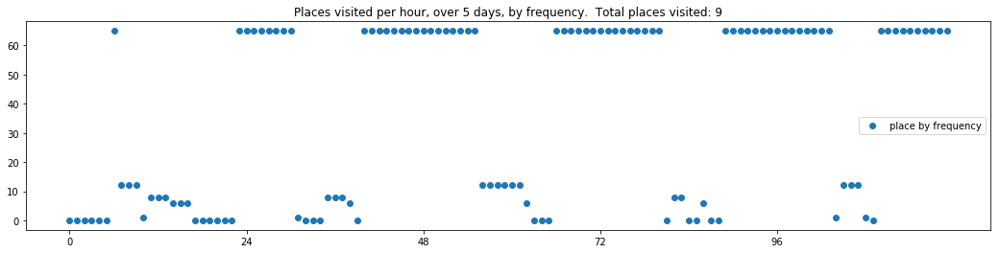

----- vector ----
prefix labels:  [104, 261]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 261, 261, 261, 261, 261, 0, 0, 0, 104, 104, 104, 104, 104, 104]
[104, 104, 104, 104, 104, 104, 104, 104, 0, 0, 0, 0, 0, 0, 0, 0, 0, 261, 261, 0, 104, 104, 104, 104]
[104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104]
[104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104, 104]


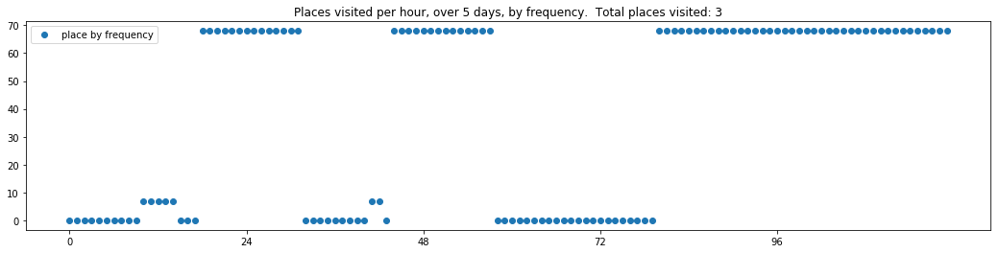

----- vector ----
prefix labels:  [380, 53]
[0, 0, 0, 0, 0, 0, 0, 0, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 380, 380, 380, 380]
[380, 380, 380, 380, 380, 380, 380, 53, 53, 53, 53, 53, 53, 53, 53, 380, 380, 380, 380, 380, 380, 380, 380, 380]
[380, 380, 380, 380, 380, 380, 380, 380, 53, 53, 53, 20, 20, 20, 20, 20, 0, 0, 20, 53, 380, 380, 380, 380]
[380, 380, 380, 380, 380, 380, 380, 380, 380, 380, 380, 20, 20, 20, 20, 20, 20, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 380, 380, 380, 380, 380, 380, 380, 20, 20, 20, 20, 20, 20, 20, 20, 0, 0, 380, 380, 380]


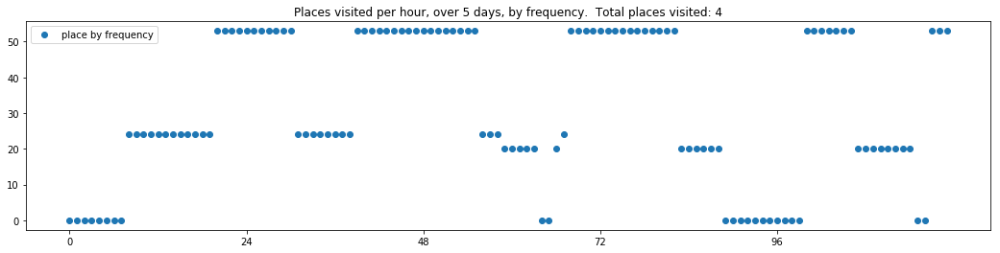


-------showing vectors for model: P-bidirectional.3-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:50-rnn_layers:3-rnn_size:128-dropout:0.2-dim_embeddings:128-temperature:1.1
----- vector ----
prefix labels:  [502, 502]
[0, 0, 0, 0, 0, 0, 0, 0, 502, 502, 502, 502, 502, 502, 502, 502, 502, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 0, 0, 0, 0, 0, 0]


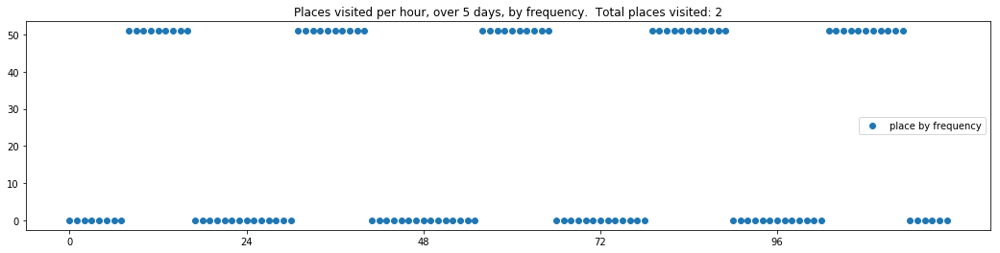

----- vector ----
prefix labels:  [289, 289]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 589, 289, 289, 289, 289, 548, 289, 289, 289, 289, 0, 0, 289]
[289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 87, 0, 0, 0, 289, 289, 289, 0, 289, 542, 289, 289]
[289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 42, 385, 289, 289, 289, 0, 529]
[289, 289, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 295, 0, 289, 289, 289, 0, 0, 289, 0, 4, 289]
[289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289, 224, 289, 289, 289, 289, 289, 289, 289, 307, 0, 0, 0]


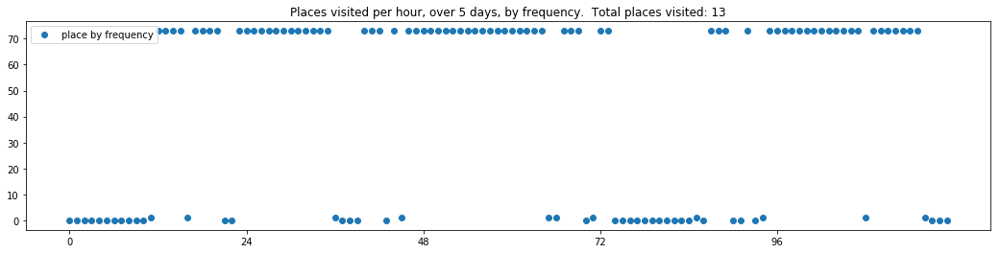

----- vector ----
prefix labels:  [395, 395]
[0, 0, 0, 0, 0, 41, 41, 122, 209, 209, 209, 629, 395, 395, 395, 395, 395, 395, 395, 383, 395, 395, 395, 395]
[395, 395, 395, 395, 0, 0, 0, 179, 179, 179, 179, 179, 395, 395, 181, 395, 395, 395, 395, 395, 395, 395, 395, 395]
[395, 395, 21, 21, 21, 21, 21, 395, 395, 395, 395, 402, 395, 395, 395, 395, 0, 0, 0, 0, 395, 395, 270, 270]
[270, 270, 8, 8, 0, 0, 130, 273, 273, 273, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 260, 260, 0, 0, 0, 0, 0, 615, 431, 84, 395, 395, 395, 395, 395, 0, 0, 0, 0, 0, 240, 240, 240]


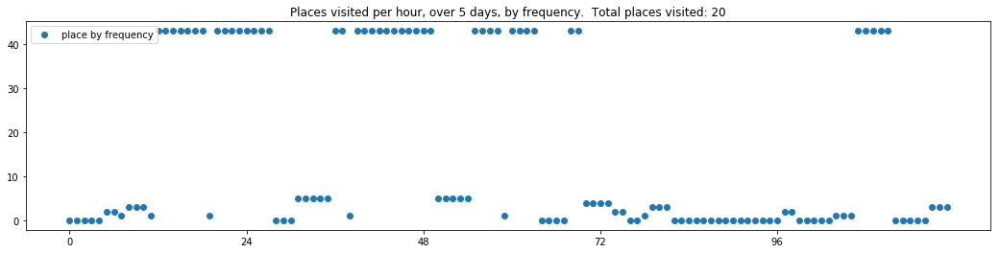


-------showing vectors for model: Q-bidirectional-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:0.8
----- vector ----
prefix labels:  [286, 223]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 531, 0, 0, 0, 0, 0, 0, 0, 0, 0, 286, 286, 286, 286, 286, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 223, 223, 223, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 286, 286, 286, 286, 286]
[286, 286, 286, 286, 286, 286, 286, 286, 286, 286, 286, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


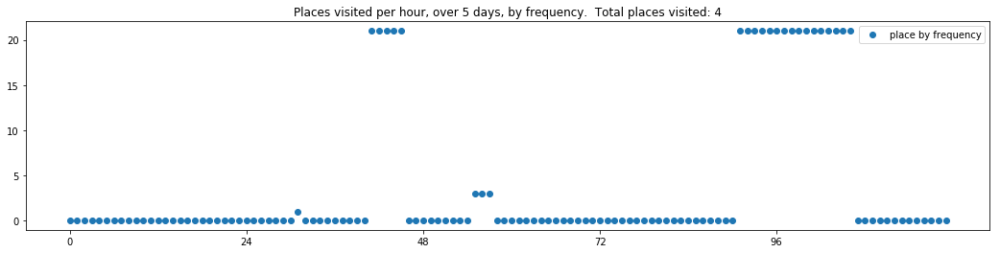

----- vector ----
prefix labels:  [468, 267]
[0, 0, 0, 0, 0, 0, 0, 0, 267, 267, 267, 267, 267, 267, 267, 468, 468, 468, 468, 468, 468, 468, 468, 468]
[468, 468, 468, 468, 468, 468, 468, 468, 267, 267, 267, 267, 267, 267, 267, 468, 468, 468, 468, 468, 468, 468, 468, 468]
[468, 468, 468, 468, 468, 468, 468, 468, 267, 267, 267, 267, 267, 267, 267, 468, 468, 468, 468, 468, 468, 468, 468, 468]
[468, 468, 468, 468, 468, 468, 468, 468, 267, 267, 267, 267, 267, 267, 267, 468, 468, 0, 0, 0, 0, 468, 468, 468]
[468, 468, 468, 468, 468, 468, 468, 468, 267, 267, 267, 267, 267, 267, 267, 468, 468, 0, 468, 468, 468, 468, 468, 468]


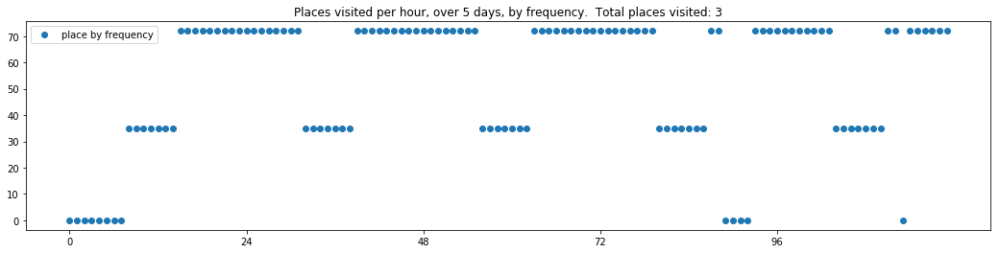

----- vector ----
prefix labels:  [24, 24]
[0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 24, 24, 24, 24, 24, 24]
[24, 24, 24, 24, 24, 24, 24, 24, 24, 0, 0, 0, 0, 0, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24]


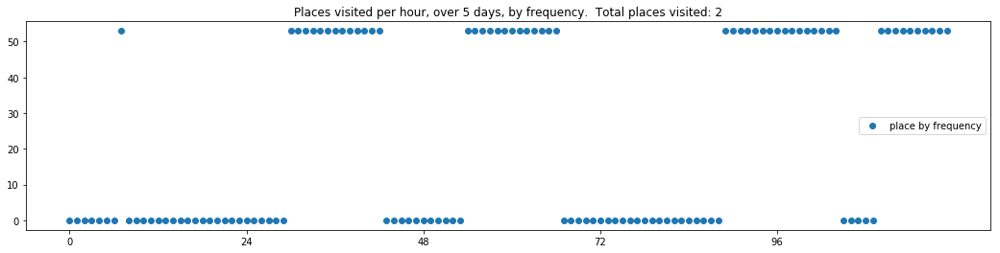


-------showing vectors for model: Q-bidirectional.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:0.9
----- vector ----
prefix labels:  [237, 237]
[0, 0, 0, 0, 0, 0, 0, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 237, 237, 237, 237, 237, 237]
[237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 237]
[237, 237, 237, 237, 237, 237, 237, 237, 237, 237, 247, 237, 237, 237, 0, 0, 0, 237, 237, 237, 237, 237, 237, 237]


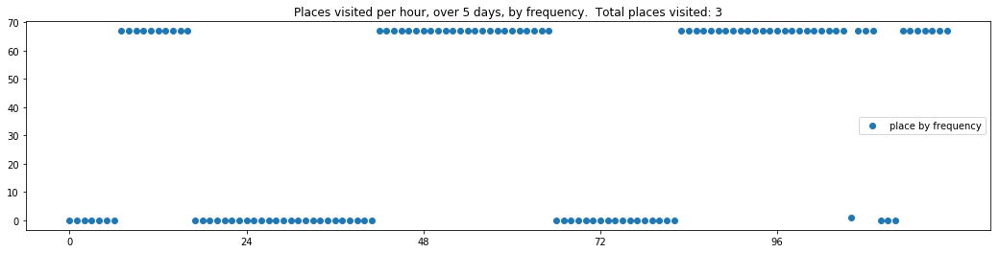

----- vector ----
prefix labels:  [146, 146]
[0, 0, 0, 0, 0, 0, 0, 397, 397, 397, 397, 397, 397, 397, 397, 146, 146, 146, 146, 146, 146, 146, 146, 146]
[146, 146, 146, 146, 146, 146, 397, 397, 397, 397, 397, 397, 397, 397, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146]
[146, 146, 146, 146, 146, 146, 146, 397, 397, 0, 0, 397, 0, 0, 0, 146, 146, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


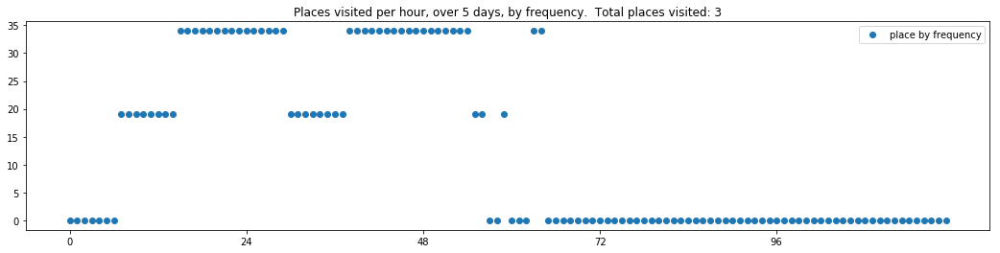

----- vector ----
prefix labels:  [198, 558]
[0, 198, 198, 198, 198, 198, 198, 198, 235, 235, 235, 235, 235, 235, 235, 235, 235, 198, 198, 198, 198, 198, 198, 198]
[198, 198, 198, 198, 198, 198, 198, 198, 198, 235, 235, 198, 198, 198, 198, 198, 198, 198, 198, 198, 198, 198, 198, 198]
[198, 198, 198, 198, 198, 198, 198, 198, 198, 235, 235, 235, 235, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 235, 235, 198, 198, 198, 198, 198, 198, 198, 198, 198, 198, 0, 0, 0]
[0, 0, 198, 198, 198, 198, 198, 198, 198, 235, 235, 235, 235, 235, 235, 235, 235, 235, 235, 235, 0, 0, 0, 0]


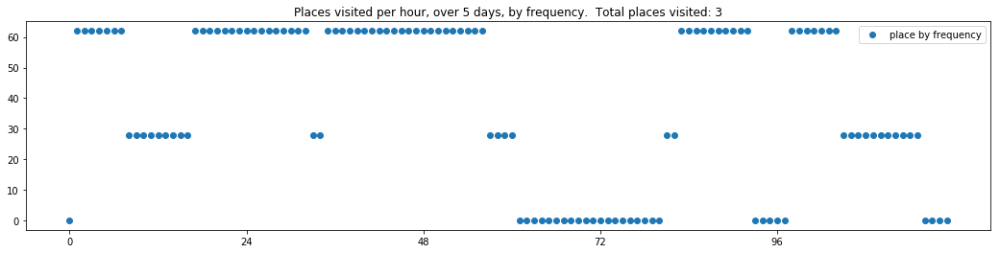


-------showing vectors for model: Q-bidirectional.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:1.0
----- vector ----
prefix labels:  [127, 198]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 198, 198, 198, 198, 127, 127, 0, 127, 127, 127, 127, 127, 127, 127, 127]
[127, 127, 127, 127, 127, 127, 127, 127, 198, 198, 0, 0, 0, 297, 0, 198, 198, 127, 127, 127, 127, 127, 127, 127]
[127, 127, 127, 127, 127, 127, 127, 198, 198, 198, 198, 198, 198, 198, 198, 0, 0, 0, 0, 127, 127, 127, 127, 127]
[127, 127, 127, 127, 127, 127, 127, 198, 198, 198, 198, 198, 198, 198, 198, 198, 198, 198, 127, 127, 127, 127, 127, 127]
[127, 127, 127, 127, 127, 127, 127, 198, 198, 198, 198, 198, 198, 198, 198, 198, 198, 198, 24, 127, 127, 127, 127, 127]


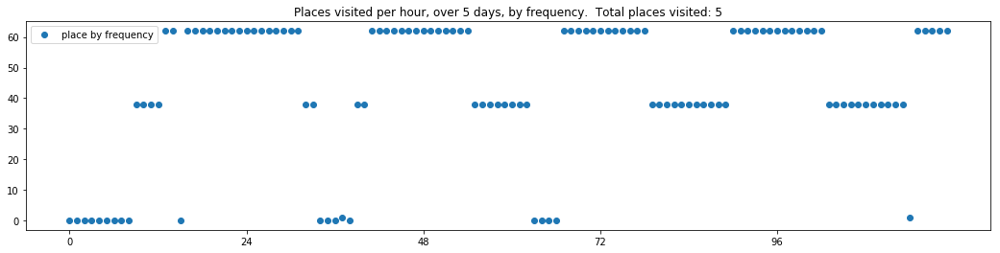

----- vector ----
prefix labels:  [540, 364]
[0, 0, 0, 0, 0, 0, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 364, 540, 540, 540, 540, 540, 540]
[540, 540, 540, 540, 540, 540, 540, 426, 503, 503, 364, 364, 364, 364, 364, 364, 364, 0, 540, 540, 540, 540, 540, 540]
[540, 540, 540, 540, 540, 540, 540, 540, 426, 364, 364, 364, 0, 364, 364, 364, 364, 540, 540, 540, 540, 540, 540, 540]
[540, 540, 540, 540, 540, 540, 540, 540, 31, 31, 366, 364, 364, 364, 364, 364, 540, 540, 540, 540, 540, 540, 540, 540]
[540, 540, 540, 540, 540, 540, 540, 540, 540, 540, 540, 364, 364, 317, 317, 364, 364, 366, 540, 540, 540, 540, 540, 540]


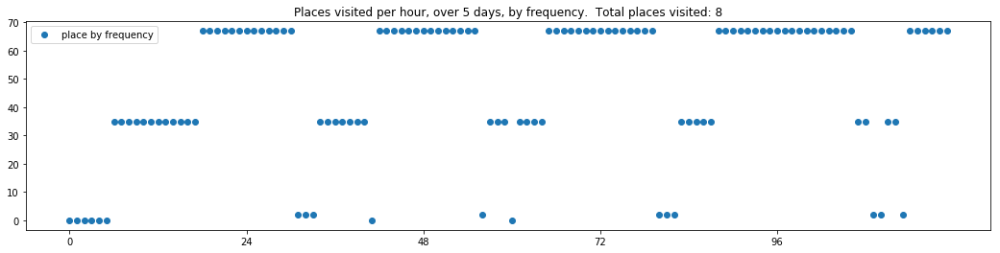

----- vector ----
prefix labels:  [362, 362]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 15, 15, 362, 362, 362, 362, 362, 362, 357, 357, 357, 362, 362]
[362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 334, 362, 362, 362, 357]
[362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 15, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 357]
[362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 357, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362]
[362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362, 362]


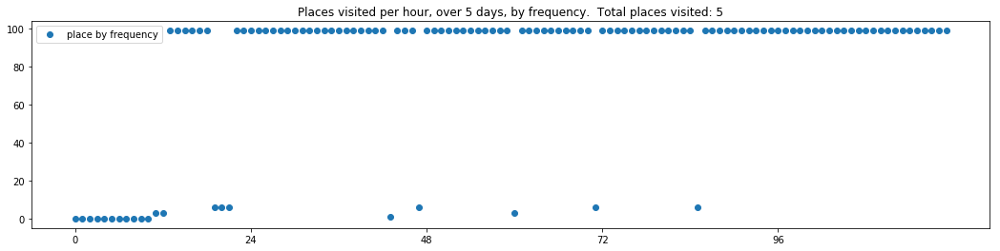


-------showing vectors for model: Q-bidirectional.3-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:1.1
----- vector ----
prefix labels:  [209, 209]
[0, 0, 0, 0, 0, 0, 0, 0, 209, 209, 209, 209, 209, 209, 209, 209, 209, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 189, 0, 0, 22, 42, 209, 209, 209, 209, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 209, 209, 189, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 209, 209, 209, 209, 0, 0]
[0, 0, 0, 0, 0, 246, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 209, 209, 0, 0, 0, 0, 0, 209]


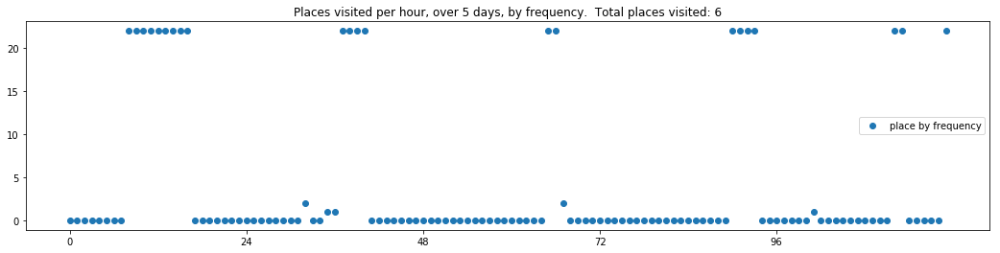

----- vector ----
prefix labels:  [272, 272]
[0, 0, 0, 0, 0, 0, 272, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 272, 272, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 444, 0, 0, 0, 272, 272, 272, 272, 272, 272, 272]
[272, 272, 272, 272, 272, 272, 272, 272, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 272, 272, 272, 272, 272, 272, 272, 272, 395, 0, 0, 0, 0, 0, 0, 0, 0, 0]


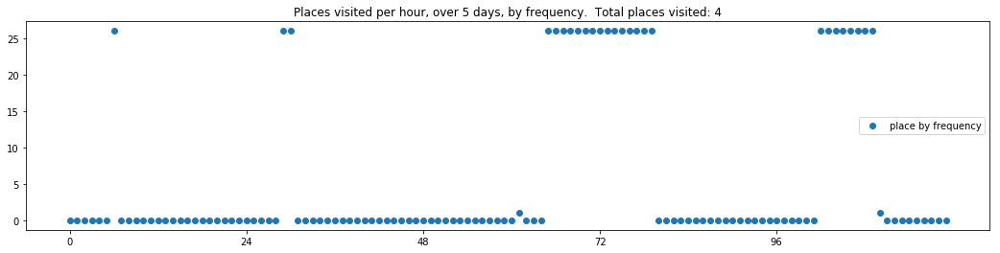

----- vector ----
prefix labels:  [595, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 159, 0, 159, 473, 55, 0, 0, 0, 0, 0, 0, 0, 0, 0, 595, 595]
[595, 595, 595, 595, 595, 595, 595, 595, 0, 14, 0, 38, 14, 212, 212, 0, 0, 0, 0, 0, 0, 0, 0, 595]
[595, 0, 22, 595, 595, 0, 0, 0, 0, 0, 0, 0, 0, 17, 212, 0, 0, 0, 0, 151, 595, 0, 112, 595]
[595, 595, 595, 595, 595, 595, 595, 595, 595, 0, 0, 0, 0, 0, 208, 364, 364, 364, 0, 595, 0, 595, 0, 387]
[595, 595, 595, 410, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 66, 32, 151, 595, 0, 0, 0, 595, 38]


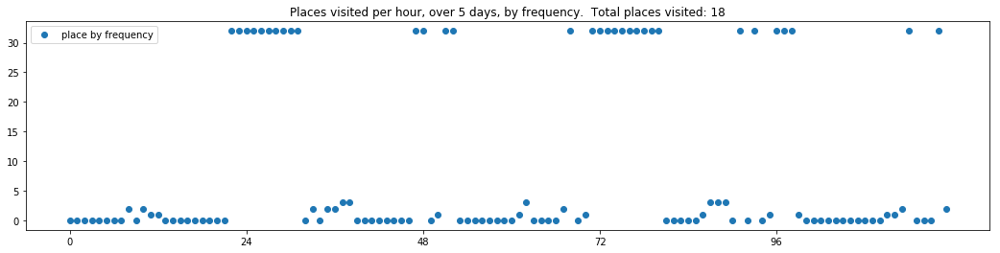


-------showing vectors for model: R-bidirectional-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:50-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:64-temperature:0.8
----- vector ----
prefix labels:  [487, 487]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 487, 487, 0, 0, 0, 0, 487, 487, 487, 487, 487]
[487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487]
[487, 487, 487, 0, 0, 0, 0, 0, 0, 0, 0, 0, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487]
[487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487, 487]


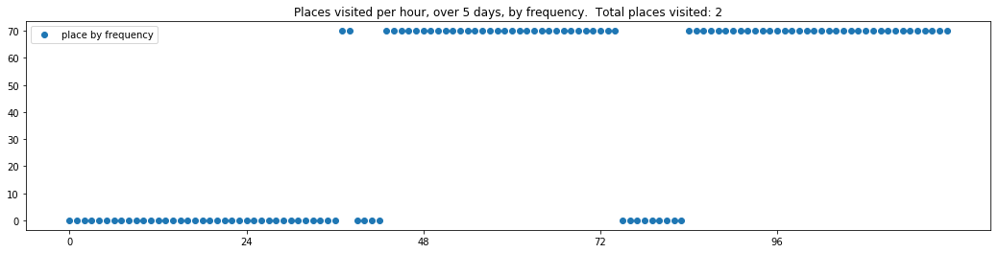

----- vector ----
prefix labels:  [167, 167]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167]
[167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167]
[167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167]
[167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 167]
[167, 167, 167, 167, 167, 167, 167, 0, 0, 167, 167, 0, 167, 167, 167, 0, 0, 0, 167, 167, 167, 167, 167, 167]


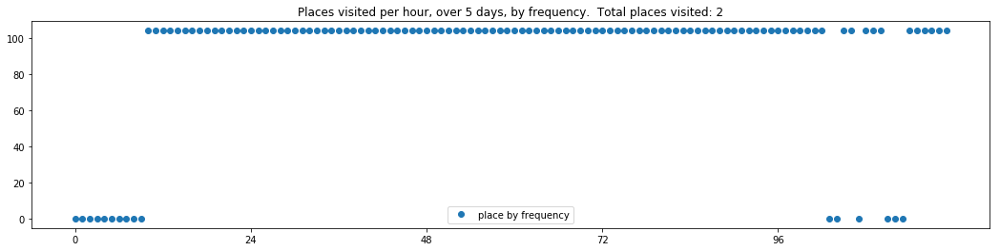

----- vector ----
prefix labels:  [323, 69]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 323, 323, 323, 323, 323, 323]
[323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323]
[323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323]
[323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323]


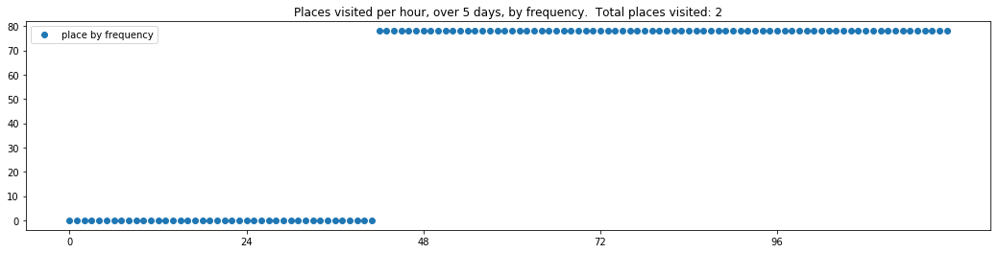


-------showing vectors for model: R-bidirectional.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:50-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:64-temperature:0.9
----- vector ----
prefix labels:  [245, 162]
[0, 0, 0, 0, 0, 0, 0, 0, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 22, 0, 0, 0, 417, 417]
[49, 499, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 245, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593]
[593, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593, 593]


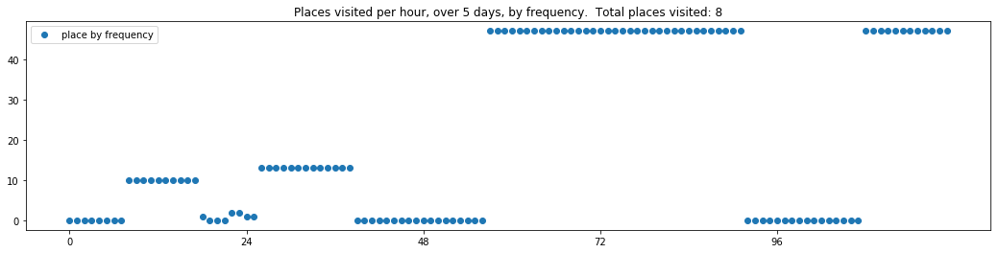

----- vector ----
prefix labels:  [32, 32]
[0, 0, 0, 0, 0, 0, 0, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32]
[32, 32, 32, 32, 32, 32, 32, 32, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 32]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32]
[32, 32, 0, 0, 0, 0, 32, 32, 0, 0, 0, 0, 186, 32, 32, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 32, 32, 0, 0, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 269, 269, 269]


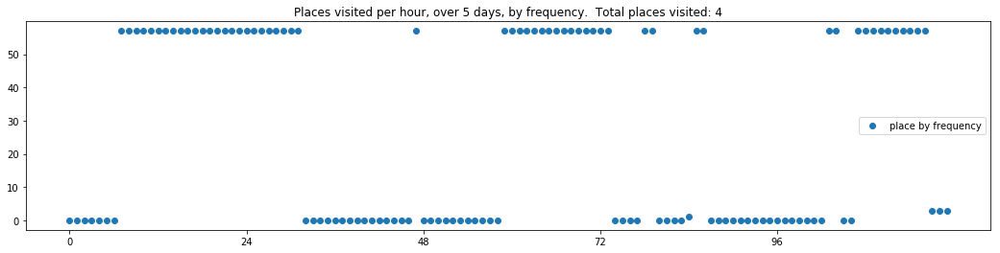

----- vector ----
prefix labels:  [323, 323]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323]
[323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323]
[323, 0, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323]
[323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323]
[323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323]


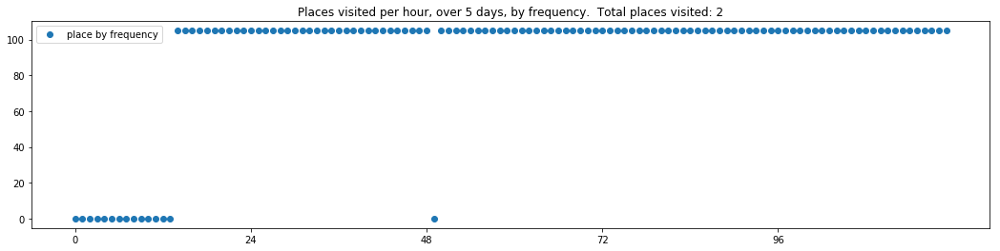


-------showing vectors for model: R-bidirectional.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:50-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:64-temperature:1.0
----- vector ----
prefix labels:  [243, 291]
[0, 0, 0, 0, 0, 216, 284, 51, 51, 51, 0, 430, 243, 69, 69, 69, 69, 243, 243, 243, 243, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 108, 237, 271, 271, 271, 271, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 284, 284, 51, 51, 51, 51, 51, 0, 0, 0, 0, 0, 33, 0, 271, 169, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 34, 569, 569, 0, 0, 0, 0, 0, 0, 0, 288, 271, 271, 271, 553, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 543, 543, 543, 543]


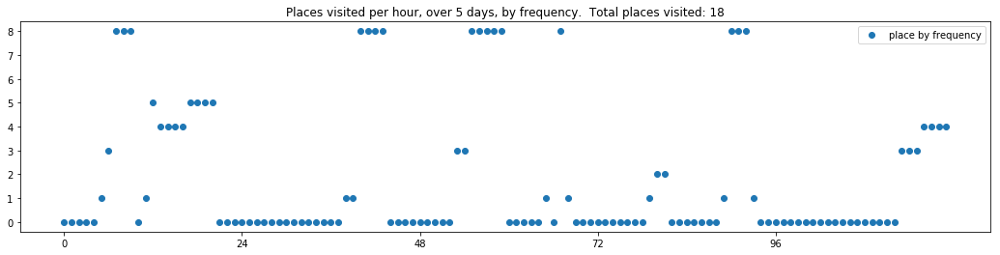

----- vector ----
prefix labels:  [561, 8]
[0, 0, 0, 0, 0, 0, 0, 56, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 8, 22, 347, 0, 0, 88, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561]
[561, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561]
[561, 0, 0, 0, 8, 8, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 561]
[561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 561, 0, 0]


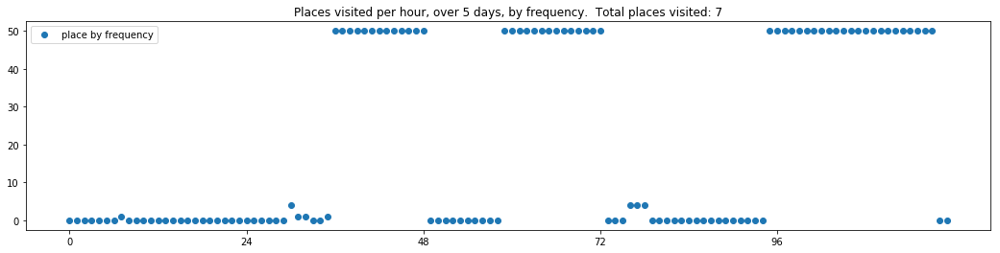

----- vector ----
prefix labels:  [194, 194]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 390, 194, 194, 194, 194, 194, 194]
[194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 0, 194, 194, 194, 194, 194, 194, 194, 194]
[194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194, 194]
[194, 194, 194, 194, 0, 0, 0, 0, 0, 0, 0, 0, 0, 310, 310, 310, 0, 341, 0, 0, 194, 194, 194, 194]
[194, 194, 194, 194, 194, 194, 194, 194, 0, 318, 318, 318, 318, 318, 318, 318, 318, 318, 0, 0, 0, 194, 194, 194]


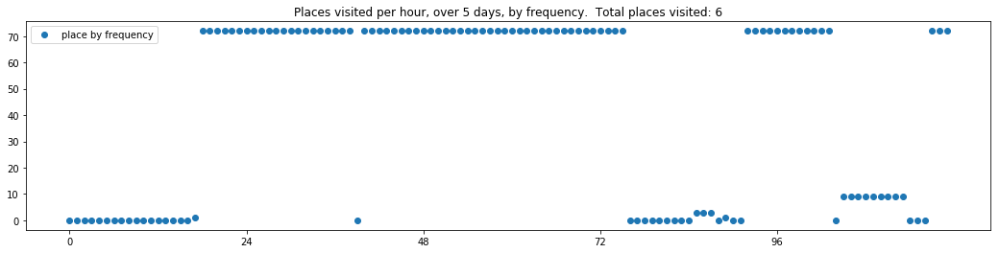


-------showing vectors for model: S-bidirectional-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:50-rnn_layers:2-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:0.8
----- vector ----
prefix labels:  [500, 500]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 500, 500, 500, 500]
[500, 500, 500, 500, 500, 500, 500, 118, 118, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500]
[500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 0, 0, 500, 500, 500, 500, 42, 500, 500, 500, 500, 500, 500]
[500, 500, 500, 500, 500, 500, 118, 118, 118, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500]
[500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500]


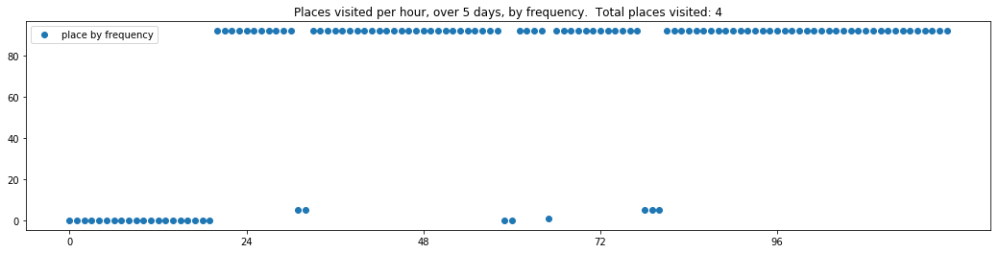

----- vector ----
prefix labels:  [124, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 124]
[124, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


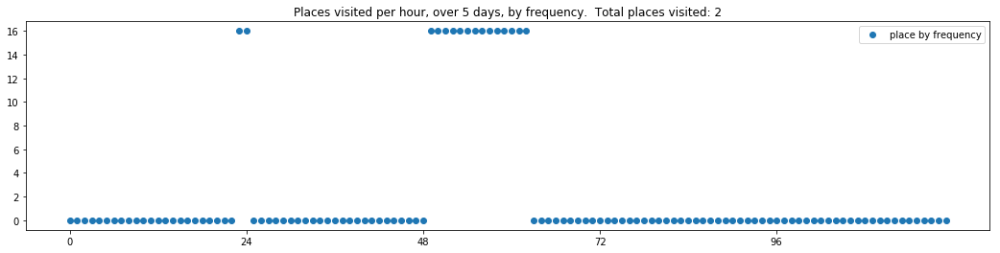

----- vector ----
prefix labels:  [529, 529]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107]


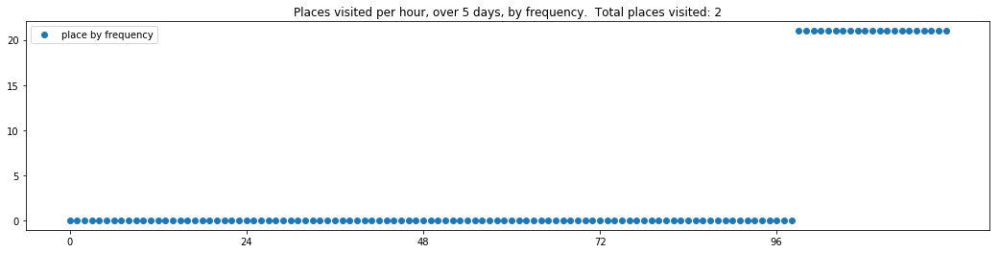


-------showing vectors for model: S-bidirectional.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:50-rnn_layers:2-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:0.9
----- vector ----
prefix labels:  [507, 507]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 507, 507, 507, 507, 514, 514, 514, 507, 507, 389, 0, 0, 0, 491, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 507, 507, 507, 507, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 514, 514, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


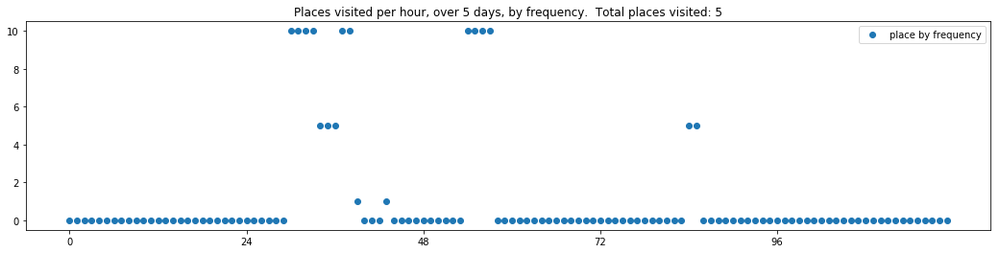

----- vector ----
prefix labels:  [22, 22]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329]
[329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329]
[329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329, 329]


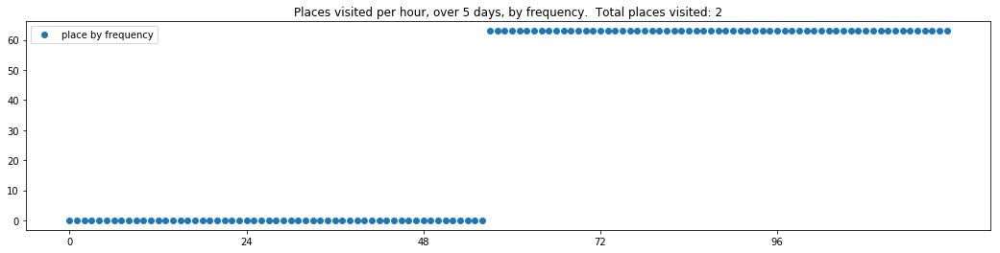

----- vector ----
prefix labels:  [397, 397]
[0, 0, 0, 0, 0, 0, 0, 0, 397, 397, 397, 397, 397, 397, 397, 397, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 397, 397, 397, 397, 397, 397, 397, 397, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 397, 397, 397, 397, 397, 397, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 397, 397, 397, 397, 397, 397, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 397, 397, 397, 397, 397, 397, 0, 0, 0, 0, 0, 0, 0, 0]


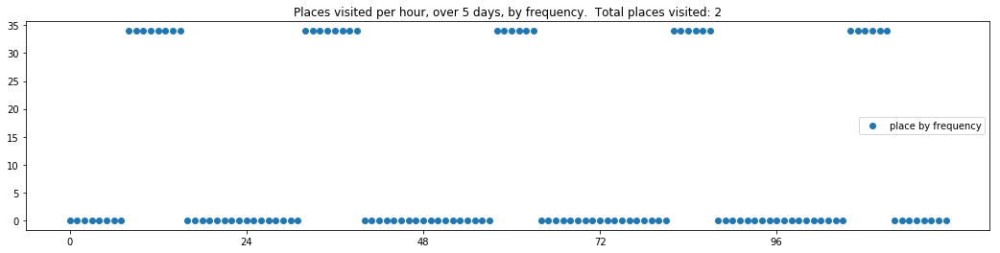


-------showing vectors for model: S-bidirectional.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:50-rnn_layers:2-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:1.0
----- vector ----
prefix labels:  [609, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[609, 609, 609, 609, 609, 609, 609, 609, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 609, 609, 609, 609]
[609, 609, 609, 609, 609, 609, 609, 609, 609, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 609, 609, 609]
[609, 0, 609, 0, 0, 609, 609, 609, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 609, 609, 609]


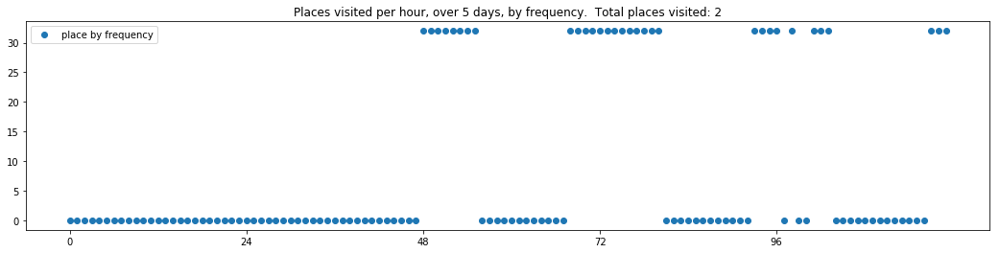

----- vector ----
prefix labels:  [469, 82]
[0, 0, 0, 0, 0, 0, 0, 0, 82, 82, 82, 140, 140, 140, 140, 140, 469, 469, 469, 469, 469, 469, 469, 469]
[469, 469, 469, 469, 469, 469, 469, 469, 36, 36, 197, 197, 197, 197, 197, 197, 197, 197, 197, 197, 0, 581, 469, 469]
[469, 469, 469, 469, 469, 469, 469, 469, 29, 29, 29, 29, 596, 596, 469, 469, 469, 469, 469, 469, 469, 469, 469, 469]
[469, 469, 469, 469, 469, 469, 469, 469, 31, 469, 197, 197, 197, 197, 0, 0, 0, 0, 0, 0, 0, 0, 0, 469]
[469, 469, 469, 469, 469, 469, 469, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 36, 469, 469, 469, 469, 469, 0]


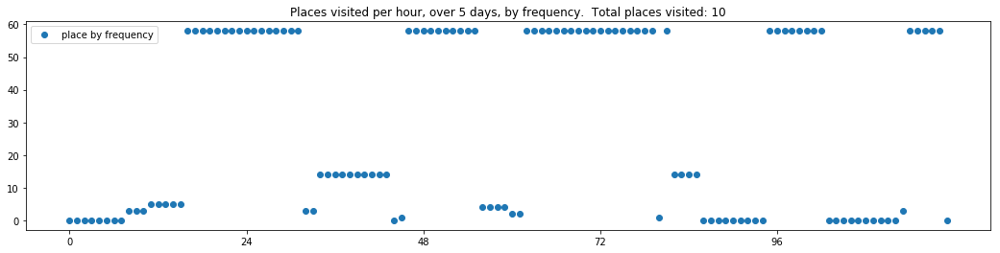

----- vector ----
prefix labels:  [515, 515]
[0, 0, 0, 0, 0, 0, 0, 0, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515]
[515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515]
[515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515]
[515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515]
[515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515]


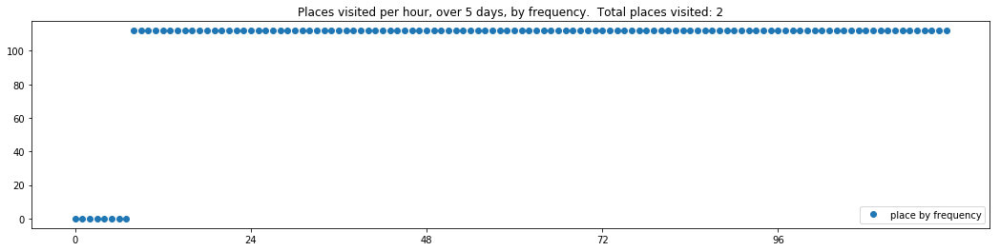


-------showing vectors for model: T-bidirectional-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:50-rnn_layers:2-rnn_size:256-dropout:0.3-dim_embeddings:100-temperature:0.8
----- vector ----
prefix labels:  [190, 223]
[0, 0, 0, 0, 0, 0, 0, 0, 223, 223, 223, 223, 223, 223, 223, 223, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 190, 223, 223, 223, 223, 223, 223, 223, 0, 190, 190, 190, 190, 190, 190, 190, 190]
[190, 190, 190, 190, 190, 190, 190, 190, 223, 223, 223, 223, 223, 223, 0, 223, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 223, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


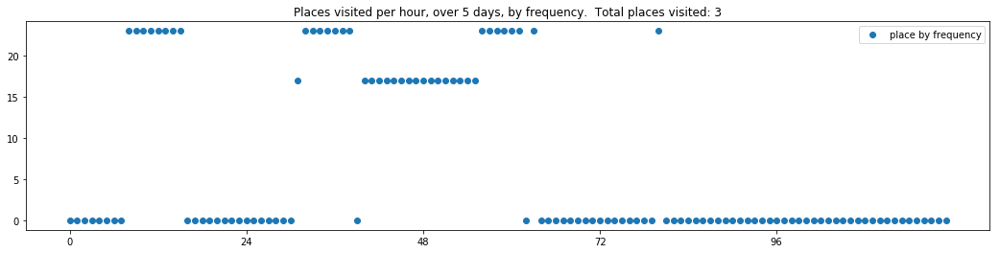

----- vector ----
prefix labels:  [453, 328]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 328, 328, 328, 328, 328, 328, 328, 328, 453, 453, 453, 453, 453, 453]
[453, 453, 453, 453, 453, 453, 453, 453, 453, 328, 328, 328, 328, 328, 328, 328, 328, 328, 328, 453, 453, 453, 453, 453]
[453, 453, 453, 453, 453, 453, 453, 453, 453, 328, 328, 328, 328, 328, 328, 328, 328, 328, 453, 453, 453, 453, 453, 453]
[453, 453, 453, 453, 453, 453, 453, 453, 453, 328, 328, 328, 328, 328, 328, 328, 328, 328, 453, 453, 453, 453, 453, 453]
[453, 453, 453, 453, 453, 453, 453, 453, 453, 328, 328, 328, 328, 328, 328, 328, 328, 328, 453, 453, 453, 0, 0, 0]


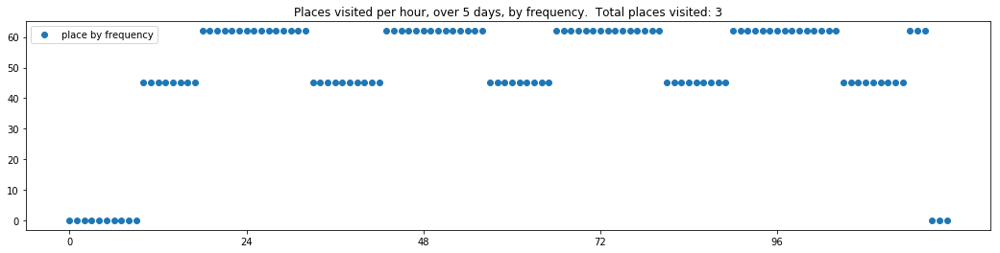

----- vector ----
prefix labels:  [22, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 22, 22, 22, 22]
[22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 21, 21, 21, 21, 21, 21, 21, 21, 21, 162, 162, 162, 162, 162]
[162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162]
[162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162, 162]


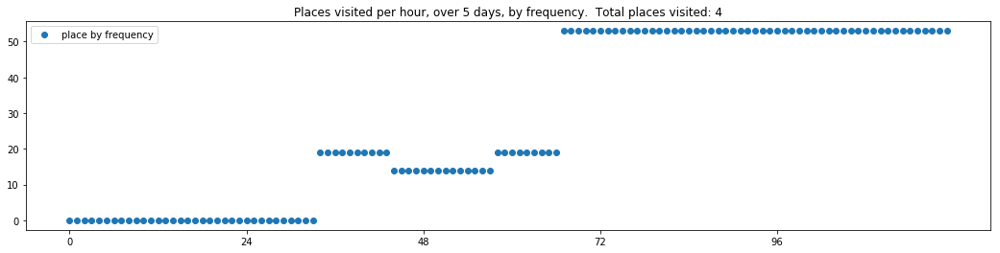


-------showing vectors for model: T-bidirectional.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:50-rnn_layers:2-rnn_size:256-dropout:0.3-dim_embeddings:100-temperature:0.9
----- vector ----
prefix labels:  [68, 112]
[0, 0, 0, 0, 68, 68, 112, 112, 112, 112, 0, 204, 204, 112, 112, 112, 112, 460, 68, 68, 68, 0, 0, 0]
[0, 0, 0, 24, 0, 0, 0, 112, 112, 112, 112, 112, 112, 112, 112, 112, 112, 112, 68, 68, 68, 68, 0, 0]
[68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68]
[68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68]
[68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68]


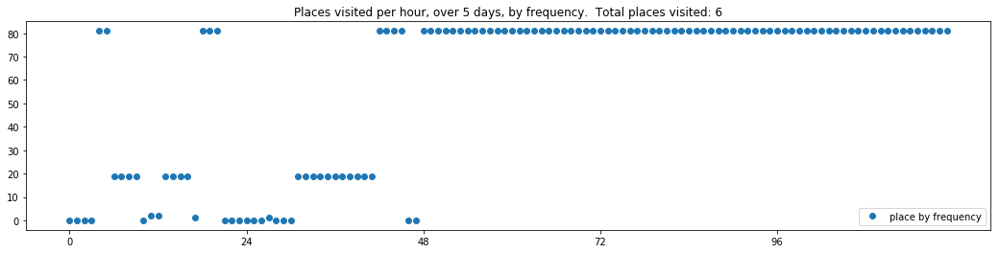

----- vector ----
prefix labels:  [271, 271]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55]
[55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55]


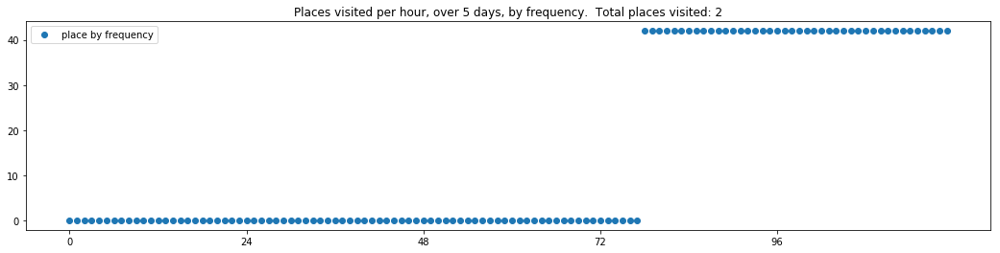

----- vector ----
prefix labels:  [26, 0]
[0, 0, 188, 24, 24, 24, 0, 0, 0, 0, 0, 0, 0, 90, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 188, 188, 0, 124, 124, 124, 124, 124, 124, 124, 124, 124, 90, 0, 90, 90, 0, 0, 0, 0, 0, 0, 0]
[0, 90, 90, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124]
[124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 0, 0, 0, 0, 0, 0, 0, 0, 0]


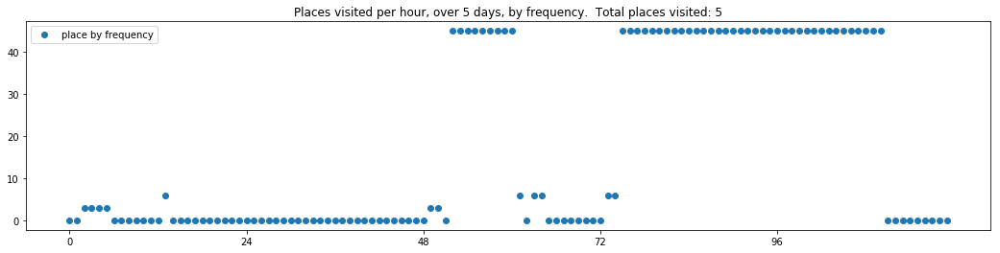


-------showing vectors for model: T-bidirectional.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:50-rnn_layers:2-rnn_size:256-dropout:0.3-dim_embeddings:100-temperature:1.0
----- vector ----
prefix labels:  [352, 484]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 352, 352, 352, 352, 352, 352]
[352, 352, 352, 352, 352, 352, 340, 574, 574, 574, 574, 574, 574, 574, 574, 574, 574, 10, 10, 10, 10, 352, 352, 352]
[352, 352, 352, 352, 352, 352, 352, 574, 574, 574, 574, 574, 574, 574, 574, 574, 574, 574, 574, 574, 574, 574, 0, 0]
[352, 352, 352, 352, 352, 352, 352, 466, 466, 466, 466, 466, 574, 574, 574, 574, 574, 574, 574, 574, 574, 574, 574, 0]
[352, 352, 352, 352, 352, 352, 352, 574, 574, 574, 574, 574, 574, 574, 574, 574, 574, 574, 574, 574, 574, 574, 574, 574]


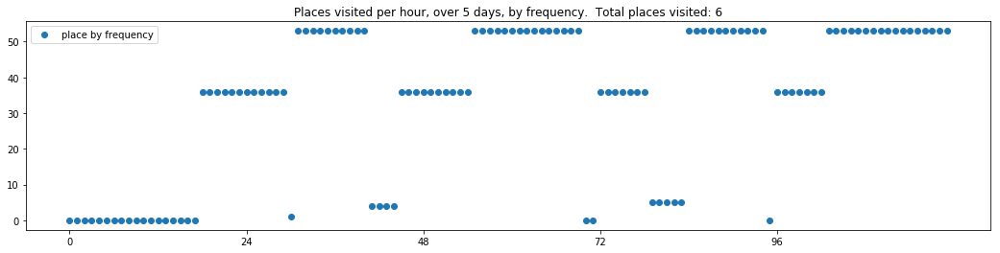

----- vector ----
prefix labels:  [157, 157]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[157, 157, 157, 157, 157, 157, 157, 157, 157, 157, 59, 59, 51, 234, 555, 73, 73, 73, 8, 8, 8, 21, 21, 21]
[21, 21, 21, 21, 157, 157, 129, 129, 136, 136, 51, 51, 51, 51, 51, 94, 94, 94, 94, 0, 0, 0, 0, 0]
[0, 21, 21, 21, 0, 157, 157, 157, 157, 157, 157, 157, 157, 382, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


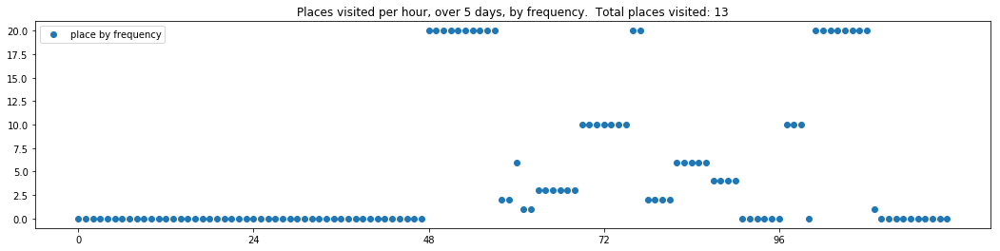

----- vector ----
prefix labels:  [124, 116]
[0, 0, 0, 0, 0, 0, 0, 586, 116, 116, 116, 116, 116, 116, 116, 116, 140, 127, 161, 124, 124, 124, 124, 124]
[124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 567, 0, 0, 0, 544, 124, 124, 124, 124, 124, 124]
[124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 24, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124]
[124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124]
[124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124, 124]


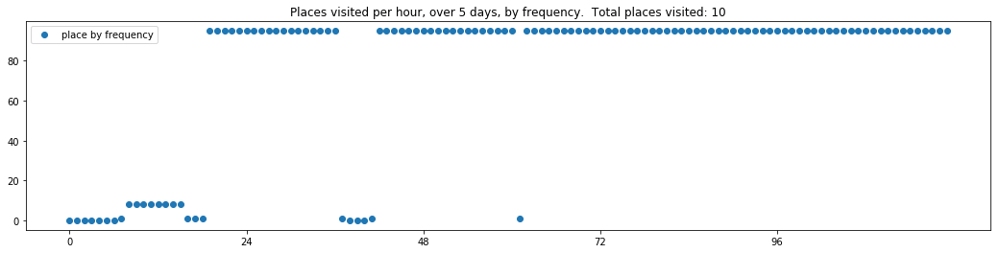


-------showing vectors for model: V-bidirectional-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:70-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:0.8
----- vector ----
prefix labels:  [121, 404]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 404, 404, 404, 404, 404, 404, 0, 0, 0, 121, 121, 121, 121, 121]
[121, 121, 121, 121, 121, 121, 121, 121, 404, 404, 404, 404, 404, 404, 404, 404, 404, 404, 121, 121, 121, 121, 121, 121]
[121, 121, 121, 121, 121, 121, 121, 121, 404, 404, 404, 404, 404, 404, 404, 404, 404, 404, 121, 121, 121, 121, 121, 121]
[121, 121, 121, 121, 121, 121, 121, 121, 404, 404, 404, 404, 404, 404, 404, 404, 404, 404, 121, 121, 121, 121, 121, 121]
[121, 121, 121, 121, 121, 121, 121, 121, 404, 404, 404, 404, 404, 404, 404, 404, 404, 404, 121, 121, 121, 121, 121, 121]


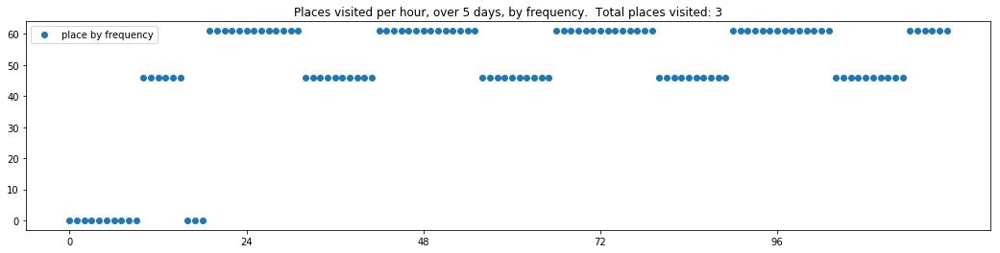

----- vector ----
prefix labels:  [613, 449]
[0, 0, 0, 0, 0, 0, 0, 449, 449, 449, 449, 449, 449, 449, 449, 449, 449, 449, 613, 613, 613, 613, 613, 613]
[613, 613, 613, 613, 613, 613, 613, 449, 449, 449, 449, 449, 449, 449, 449, 449, 449, 613, 613, 613, 613, 613, 613, 613]
[613, 613, 613, 613, 613, 613, 613, 613, 449, 449, 449, 449, 449, 449, 449, 449, 449, 449, 613, 613, 613, 613, 613, 613]
[613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613]
[613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613, 613]


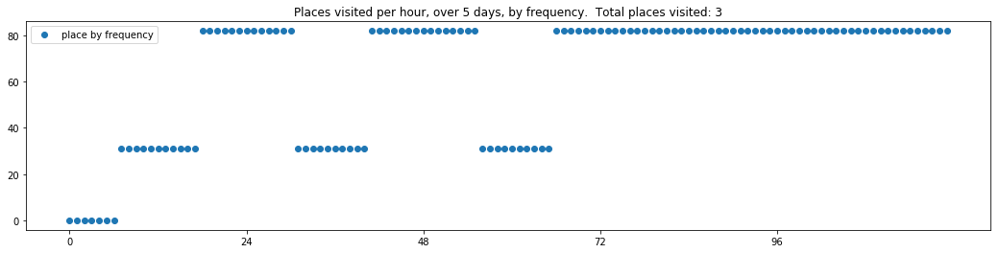

----- vector ----
prefix labels:  [109, 109]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 109, 109, 109]
[109, 109, 109, 109, 109, 109, 109, 109, 0, 0, 0, 0, 0, 0, 0, 0, 0, 109, 109, 109, 109, 109, 109, 109]
[109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 247, 247, 247, 247, 247, 109, 109]
[109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 247, 247, 247, 247, 247, 247, 247]
[247, 109, 109, 109, 46, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 247, 247, 247, 247, 247, 247, 247, 247]


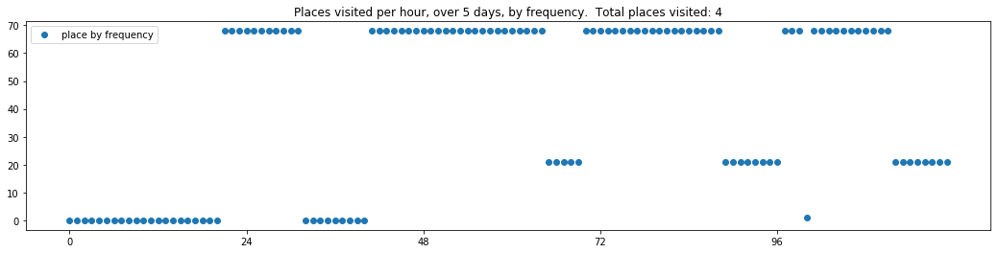


-------showing vectors for model: V-bidirectional.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:70-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:0.9
----- vector ----
prefix labels:  [271, 271]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0, 21, 271, 271]
[271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 22, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 271, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271]


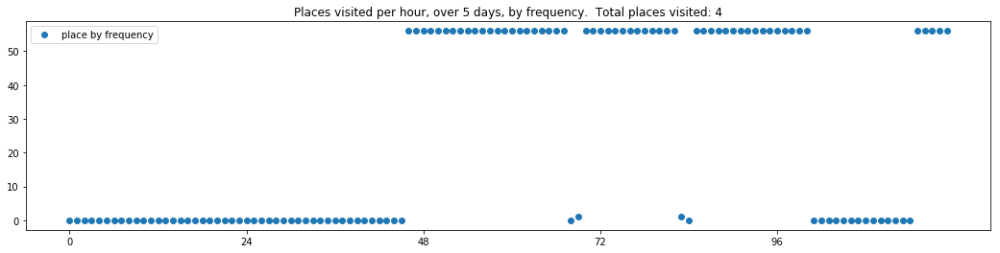

----- vector ----
prefix labels:  [214, 214]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 214, 214, 214, 214, 214, 214, 0, 0, 434, 434, 434, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 214, 214, 0, 0, 214, 214, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 214, 214, 214, 214, 214, 214, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 214, 214, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 214, 214, 214, 214, 214, 214, 214, 0, 0, 0, 0, 0, 0, 0, 0, 0]


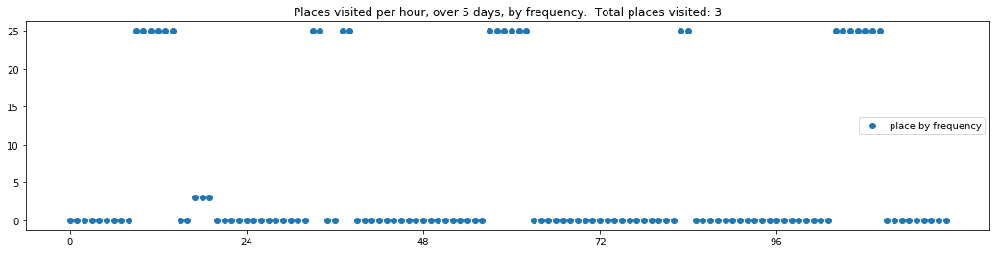

----- vector ----
prefix labels:  [502, 502]
[0, 0, 0, 0, 0, 0, 0, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 502, 0, 0, 0, 0, 0, 0, 0]


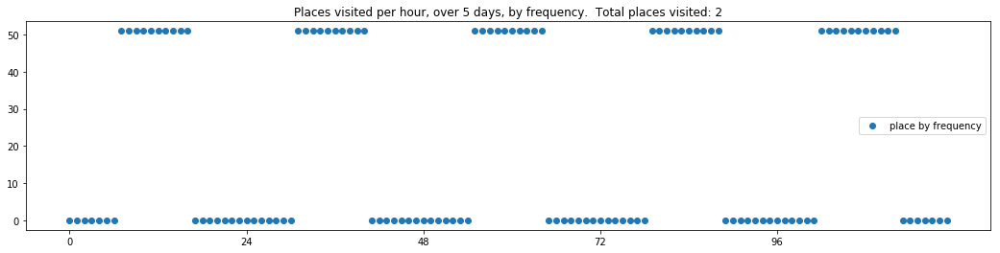


-------showing vectors for model: V-bidirectional.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:70-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:1.0
----- vector ----
prefix labels:  [276, 456]
[0, 0, 0, 0, 0, 0, 0, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 276, 276, 276, 276]
[0, 0, 0, 0, 0, 0, 0, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 0]
[0, 0, 0, 0, 0, 0, 0, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456]
[456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456, 456]


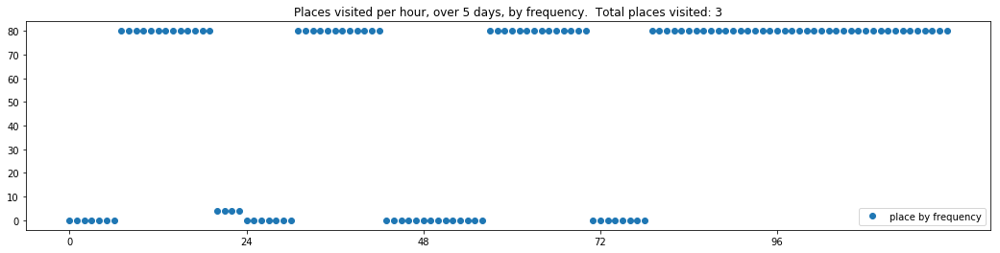

----- vector ----
prefix labels:  [285, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 285, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 285, 285, 370, 0, 0, 0, 0, 0, 0, 108, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 135, 0, 0, 0, 0, 0, 130, 339, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 533, 533, 186, 0, 0, 0, 596, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 232, 232, 232, 0, 216, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


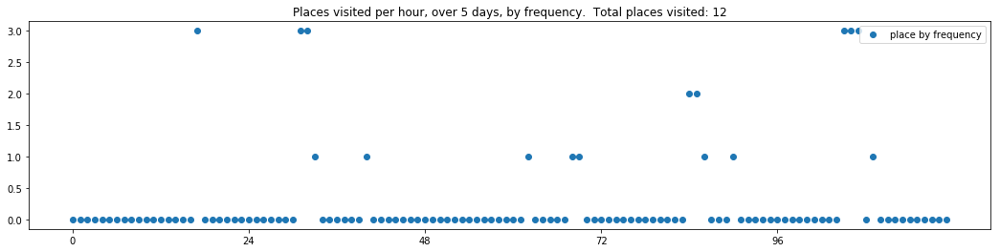

----- vector ----
prefix labels:  [46, 46]
[0, 0, 0, 0, 0, 0, 0, 0, 46, 46, 46, 46, 46, 46, 46, 0, 0, 0, 0, 109, 109, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 0, 0, 0, 0, 0, 0, 0, 0, 46, 247, 247, 109, 109, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 45, 46, 46, 46, 46]
[46, 46, 0, 0, 0, 0, 46, 46, 46, 46, 46, 46, 0, 0, 0, 0, 0, 46, 46, 46, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46]


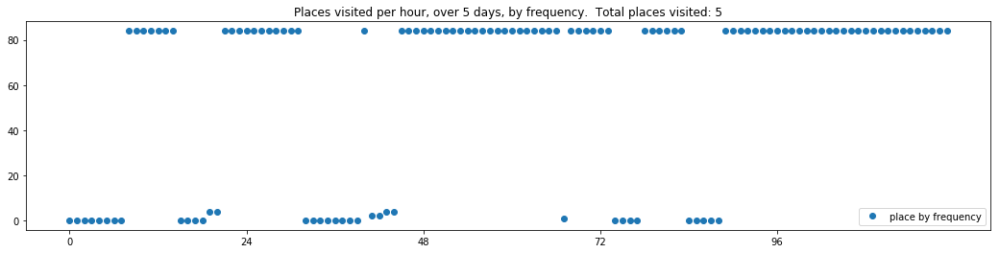


-------showing vectors for model: V-bidirectional.3-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:70-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:1.1
----- vector ----
prefix labels:  [183, 97]
[0, 0, 0, 0, 0, 0, 0, 0, 208, 208, 132, 558, 558, 558, 0, 373, 97, 183, 183, 183, 183, 184, 183, 183]
[183, 183, 183, 183, 183, 183, 183, 569, 97, 97, 97, 97, 97, 97, 97, 97, 183, 183, 183, 183, 183, 183, 183, 183]
[183, 183, 183, 183, 183, 183, 183, 183, 97, 97, 97, 97, 97, 97, 97, 183, 183, 183, 0, 0, 183, 183, 183, 183]
[183, 183, 183, 183, 183, 183, 183, 178, 299, 299, 0, 0, 0, 0, 0, 0, 183, 183, 183, 183, 183, 183, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 644, 183, 183, 183, 183, 183, 183]


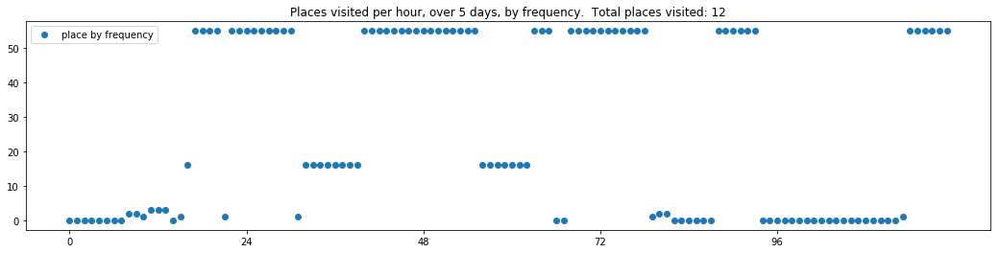

----- vector ----
prefix labels:  [46, 46]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 583, 583, 0, 0, 0, 0, 46, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 46, 46, 46, 46, 0, 0, 46, 46, 46, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 46, 46, 46, 46, 46, 46, 24, 45, 45, 45, 45, 46, 46, 46, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 0, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46]


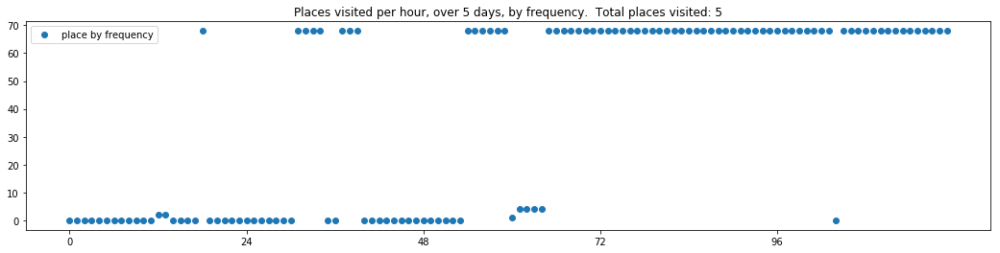

----- vector ----
prefix labels:  [212, 212]
[0, 0, 0, 0, 0, 0, 0, 0, 364, 364, 364, 212, 114, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 240, 162, 55, 55, 55, 55, 330, 330, 278, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 212, 212, 212, 212, 212, 0, 0, 0, 0, 0, 0, 266, 22, 212, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 266, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 21, 21, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 100, 100, 0, 0, 0, 0]


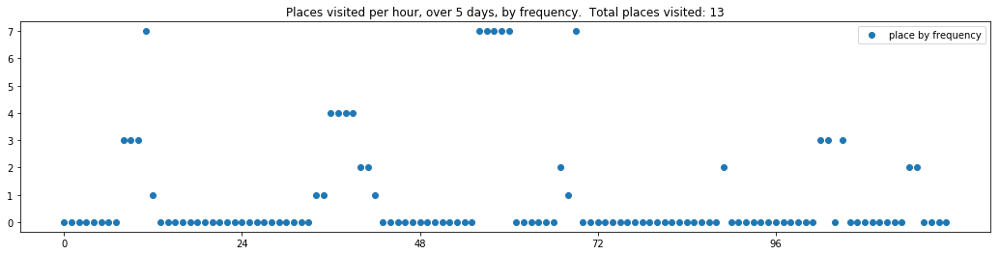


-------showing vectors for model: W-bidirectional-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:84-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:0.8
----- vector ----
prefix labels:  [597, 597]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597]
[597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597]
[597, 597, 597, 597, 597, 597, 597, 597, 597, 0, 0, 0, 0, 0, 0, 0, 0, 0, 597, 597, 597, 597, 597, 597]
[597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597]


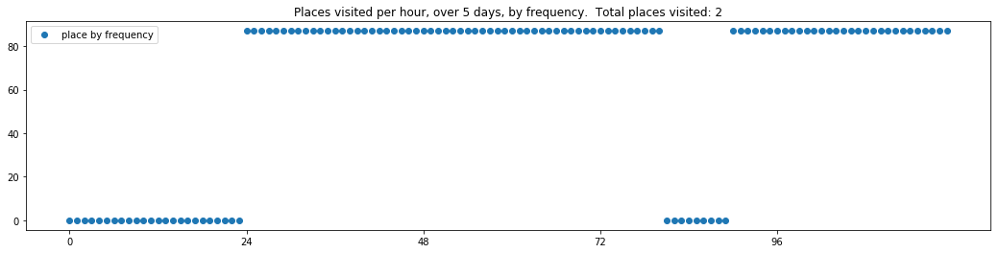

----- vector ----
prefix labels:  [308, 107]
[0, 0, 0, 0, 0, 0, 0, 0, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[107, 107, 107, 107, 107, 0, 0, 0, 0, 0, 0, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


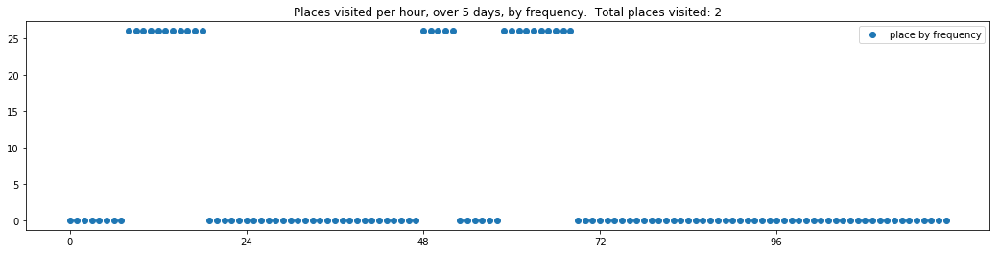

----- vector ----
prefix labels:  [249, 250]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 249]
[249, 249, 249, 249, 249, 249, 249, 249, 249, 254, 254, 254, 0, 0, 0, 0, 0, 250, 250, 0, 0, 0, 0, 249]
[249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 0, 254, 254, 254, 249, 249, 249, 249, 249, 249, 249]
[249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 0, 0, 0, 0, 0, 249, 249, 249, 249, 249]
[249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249, 249]


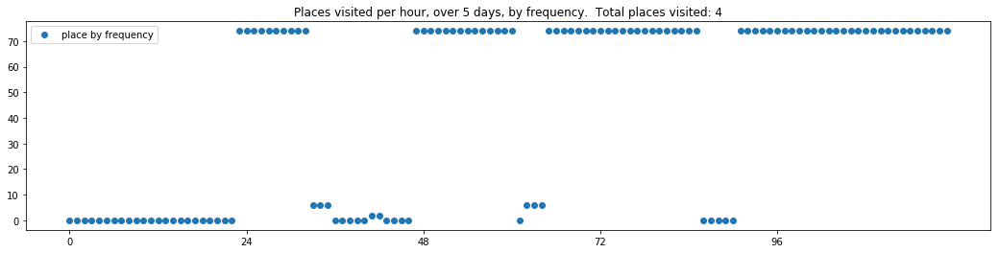


-------showing vectors for model: W-bidirectional.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:84-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:0.9
----- vector ----
prefix labels:  [632, 632]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 632, 0, 0, 0, 632, 632, 632, 632, 632]
[632, 0, 632, 632, 632, 632, 632, 632, 632, 632, 632, 296, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632]
[632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632]
[632, 0, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632]


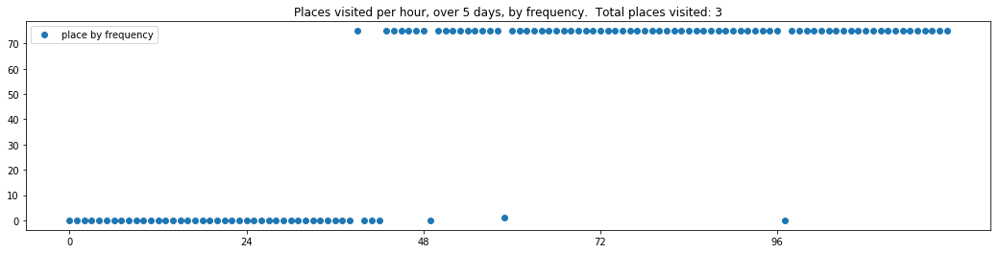

----- vector ----
prefix labels:  [214, 214]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 635, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 506, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


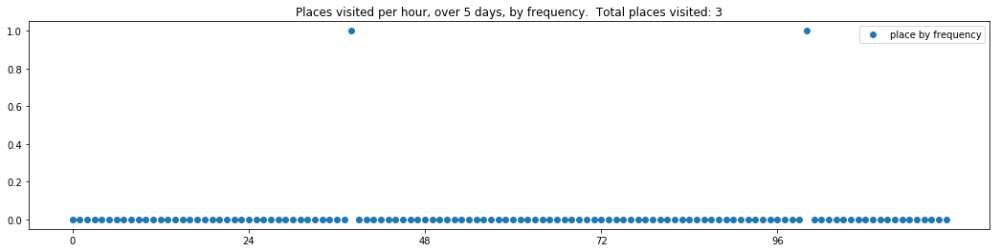

----- vector ----
prefix labels:  [456, 456]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 456, 456, 456, 456, 456, 456, 456]
[456, 456, 456, 456, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 456, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 44, 0, 635]
[635, 635, 635, 635, 635, 635, 635, 635, 635, 635, 0, 0, 70, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


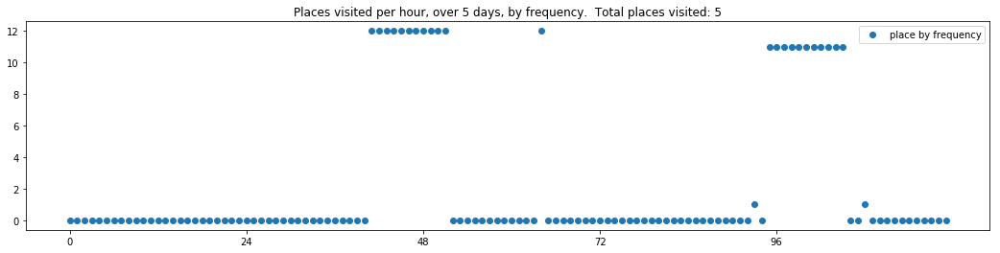


-------showing vectors for model: W-bidirectional.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:84-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:1.0
----- vector ----
prefix labels:  [491, 491]
[0, 0, 0, 0, 0, 0, 0, 491, 491, 491, 491, 491, 491, 491, 491, 491, 0, 0, 0, 68, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 491, 491, 491, 491, 491, 491]
[491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 0, 0, 0, 491, 491, 491, 491, 491, 491, 491]
[491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 0, 0, 0, 0, 0, 0, 0, 491, 491]
[491, 491, 491, 491, 0, 0, 0, 0, 0, 0, 153, 0, 0, 0, 491, 0, 0, 0, 0, 0, 491, 491, 491, 491]


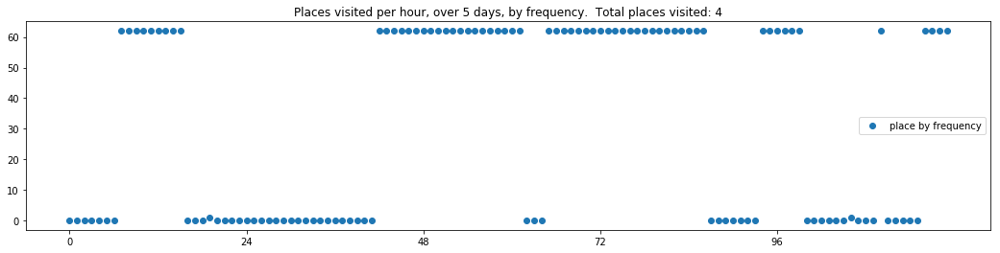

----- vector ----
prefix labels:  [439, 439]
[0, 0, 0, 0, 0, 229, 0, 0, 0, 439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 439]
[439, 439, 439, 0, 439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 0, 439, 439, 439, 439, 439, 439, 439, 439]
[439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 0, 0, 0, 439, 0, 240, 0, 0, 439, 439, 439]
[439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 439, 0, 439, 439, 439, 439, 439, 439]
[439, 439, 439, 439, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46]


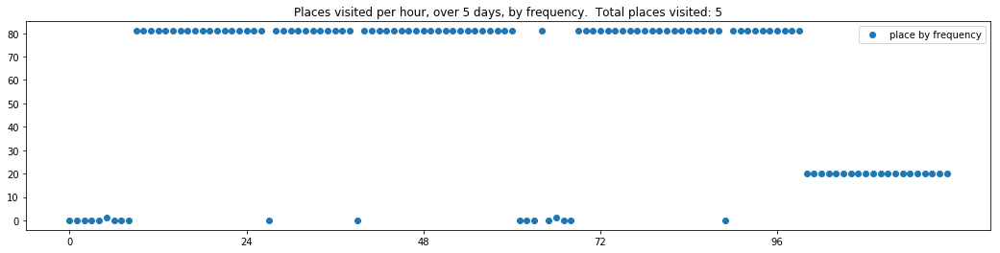

----- vector ----
prefix labels:  [109, 109]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 109, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[109, 109, 0, 0, 0, 0, 0, 0, 0, 48, 48, 0, 0, 109, 109, 109, 109, 109, 109, 109, 109, 109, 0, 0]
[109, 109, 109, 109, 109, 109, 109, 109, 109, 109, 0, 0, 0, 0, 0, 230, 0, 0, 0, 0, 0, 0, 0, 0]
[109, 109, 109, 109, 109, 109, 109, 109, 109, 247, 247, 247, 247, 247, 247, 247, 247, 247, 247, 48, 385, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 109, 109, 109, 109, 109]


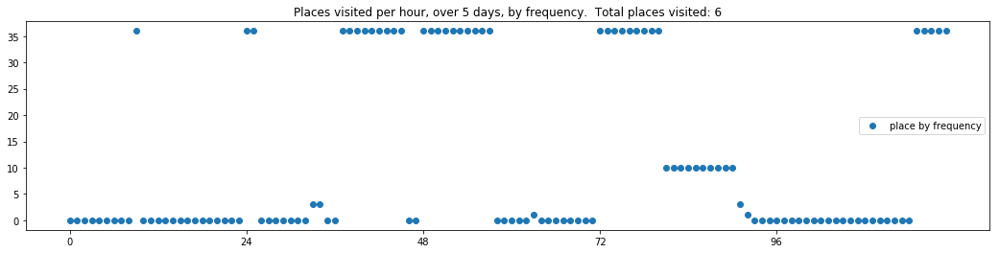


-------showing vectors for model: W-bidirectional.3-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:84-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:1.1
----- vector ----
prefix labels:  [459, 142]
[0, 0, 0, 0, 142, 142, 142, 142, 142, 142, 550, 550, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142]
[142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142]
[142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142]
[142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142]
[142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142, 142]


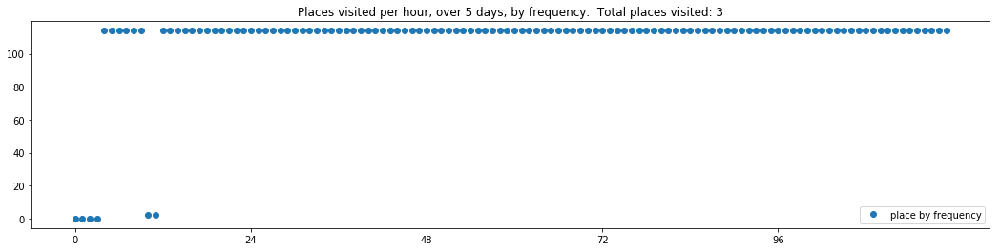

----- vector ----
prefix labels:  [317, 8]
[0, 0, 0, 0, 0, 317, 317, 0, 497, 468, 239, 239, 271, 271, 468, 0, 0, 0, 0, 0, 0, 410, 317, 317]
[317, 317, 317, 317, 208, 208, 0, 0, 0, 0, 238, 317, 0, 0, 0, 0, 545, 65, 52, 162, 0, 97, 0, 317]
[271, 0, 0, 98, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 410, 0, 0, 0, 0, 0, 0, 271, 271, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 323, 8, 8, 8, 0, 557, 175, 0, 0, 0, 0, 0, 0, 271, 271, 271]
[271, 271, 271, 271, 434, 434, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


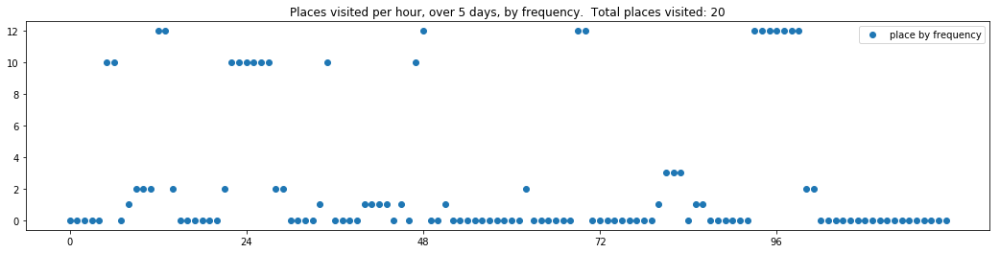

----- vector ----
prefix labels:  [84, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 47, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 374, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 222, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 97, 420, 0, 397, 397]
[397, 55, 21, 0, 0, 0, 111, 111, 0, 0, 377, 377, 377, 377, 377, 377, 377, 377, 377, 377, 0, 0, 0, 0]


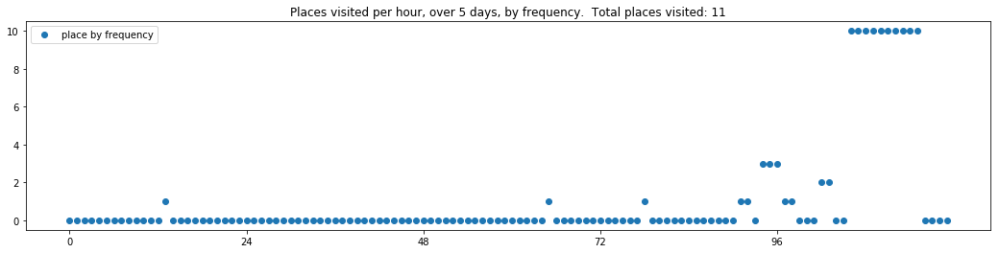


-------showing vectors for model: X-bidirectional-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:128-dropout:0.2-dim_embeddings:128-temperature:0.8
----- vector ----
prefix labels:  [101, 116]
[0, 101, 101, 101, 101, 101, 101, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 101, 101, 101, 101, 101, 101, 101]
[101, 101, 101, 101, 101, 101, 101, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 101, 101, 101, 101, 101, 101, 101]
[101, 101, 101, 101, 101, 101, 101, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 101, 101, 101, 101, 101, 101, 101]
[101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101]
[101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101]


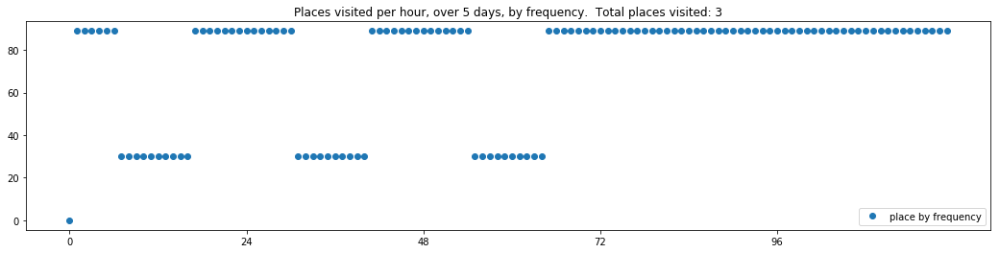

----- vector ----
prefix labels:  [229, 271]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 0]
[0, 271, 271, 271, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271]
[271, 271, 271, 271, 0, 0, 0, 0, 0, 0, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271]


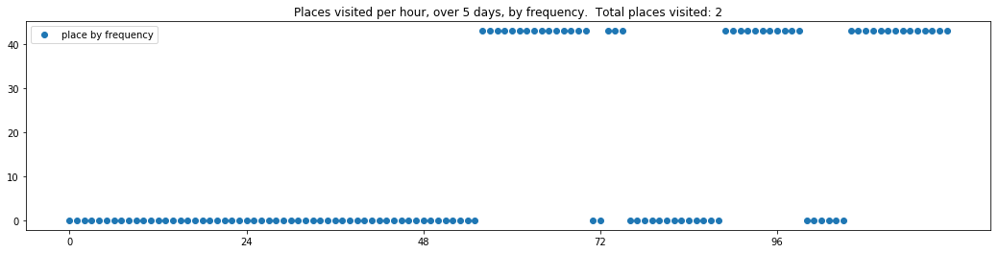

----- vector ----
prefix labels:  [516, 416]
[0, 0, 0, 0, 0, 0, 0, 416, 416, 416, 416, 416, 416, 416, 416, 516, 516, 516, 516, 516, 516, 516, 516, 516]
[516, 516, 516, 516, 516, 516, 416, 416, 416, 416, 416, 416, 416, 416, 416, 416, 516, 516, 516, 516, 516, 516, 516, 516]
[516, 516, 516, 516, 516, 516, 416, 416, 416, 416, 416, 416, 416, 416, 416, 416, 516, 516, 516, 516, 516, 516, 516, 516]
[516, 516, 516, 516, 516, 516, 416, 416, 416, 416, 416, 416, 416, 416, 416, 416, 516, 516, 516, 516, 516, 516, 516, 516]
[516, 516, 516, 516, 516, 516, 416, 416, 416, 416, 416, 416, 416, 416, 416, 516, 516, 516, 516, 516, 516, 516, 516, 516]


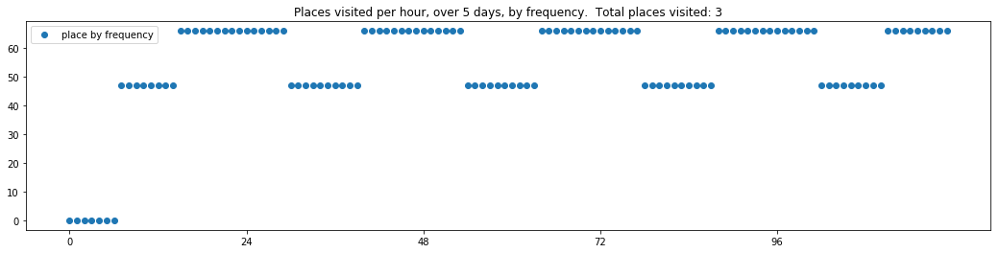


-------showing vectors for model: X-bidirectional.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:128-dropout:0.2-dim_embeddings:128-temperature:0.9
----- vector ----
prefix labels:  [116, 116]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116]
[116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 116, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


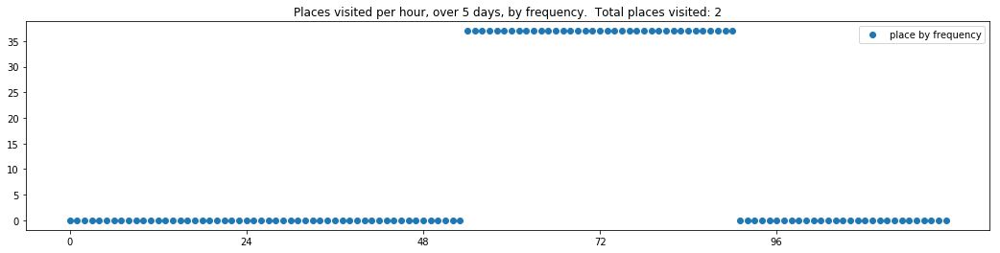

----- vector ----
prefix labels:  [154, 21]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 21, 0, 0, 0, 0, 0, 0, 0, 154, 154, 154, 154, 154]
[154, 154, 154, 154, 154, 154, 154, 154, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 154, 112]
[112, 112, 112, 112, 112, 112, 0, 112, 112, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 112]
[112, 112, 112, 112, 112, 112, 0, 112, 112, 112, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 112, 112]


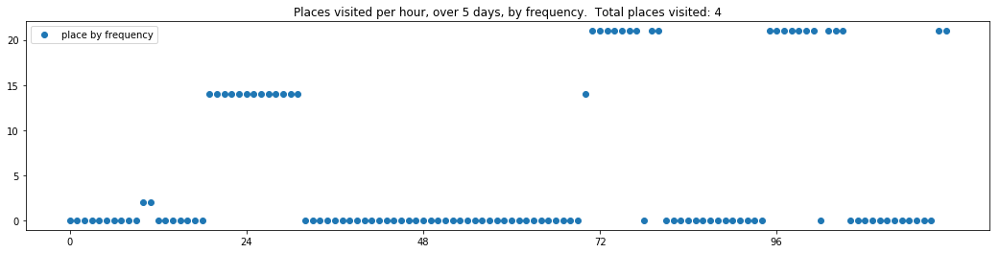

----- vector ----
prefix labels:  [532, 420]
[0, 0, 0, 0, 0, 0, 0, 0, 420, 420, 420, 420, 420, 420, 420, 420, 420, 420, 420, 420, 420, 420, 420, 420]
[532, 532, 532, 532, 532, 532, 532, 532, 420, 420, 420, 420, 420, 420, 420, 420, 420, 420, 420, 420, 420, 420, 532, 532]
[532, 532, 532, 532, 532, 532, 532, 532, 420, 420, 420, 420, 420, 420, 420, 420, 420, 420, 420, 420, 420, 532, 532, 532]
[532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532]
[532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532]


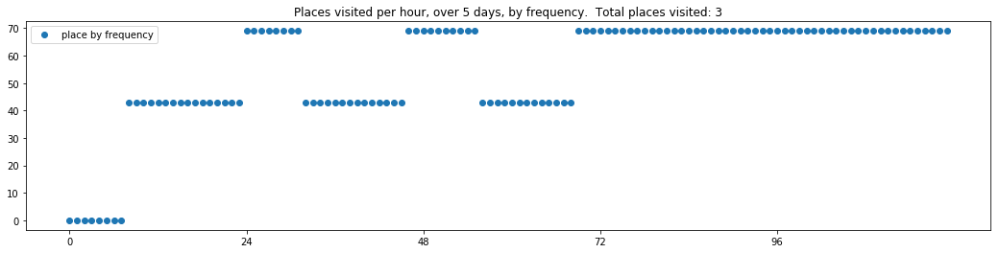


-------showing vectors for model: X-bidirectional.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:128-dropout:0.2-dim_embeddings:128-temperature:1.0
----- vector ----
prefix labels:  [5, 5]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 5, 5, 5, 5]
[5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
[5, 5, 5, 5, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8]
[8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8]
[8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8]


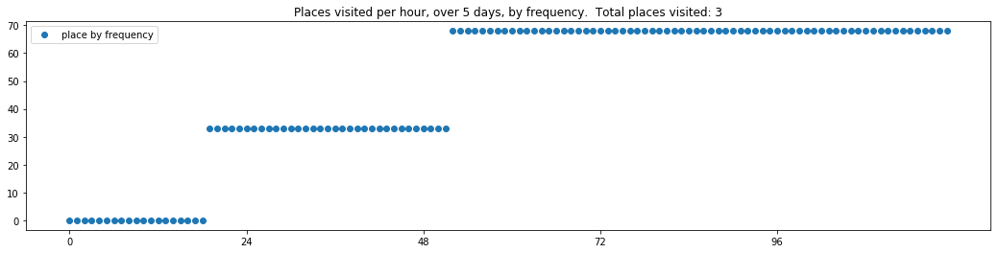

----- vector ----
prefix labels:  [626, 626]
[0, 0, 0, 0, 0, 0, 0, 0, 626, 626, 626, 626, 626, 626, 626, 626, 626, 626, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 626, 626, 626, 626, 626, 626, 626, 626, 626, 626, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 626, 626, 626, 626, 626, 626, 626, 626, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 626, 626, 626, 626, 626, 626, 626, 626, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


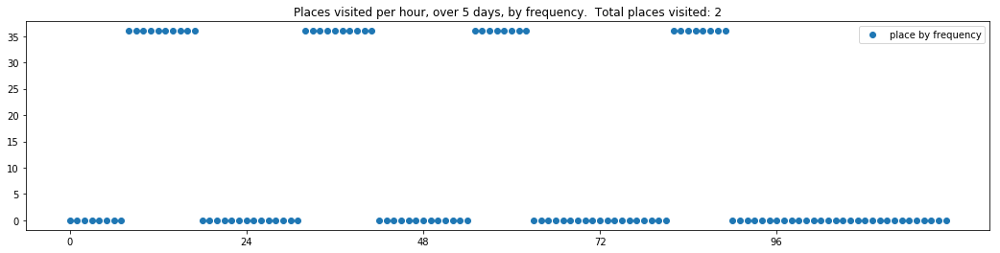

----- vector ----
prefix labels:  [464, 274]
[0, 0, 0, 0, 0, 0, 0, 0, 274, 274, 274, 274, 274, 274, 274, 274, 274, 464, 464, 464, 464, 464, 464, 464]
[464, 464, 464, 464, 464, 464, 464, 464, 274, 274, 274, 274, 274, 274, 0, 0, 274, 485, 464, 464, 464, 464, 464, 464]
[464, 464, 464, 464, 464, 464, 464, 0, 274, 274, 274, 274, 274, 274, 274, 274, 274, 261, 261, 464, 464, 464, 464, 464]
[464, 464, 464, 464, 464, 464, 464, 464, 274, 274, 360, 360, 360, 360, 360, 360, 274, 274, 464, 464, 464, 464, 464, 464]
[464, 464, 464, 464, 464, 464, 464, 464, 274, 274, 274, 274, 274, 274, 274, 274, 464, 42, 0, 464, 464, 464, 464, 464]


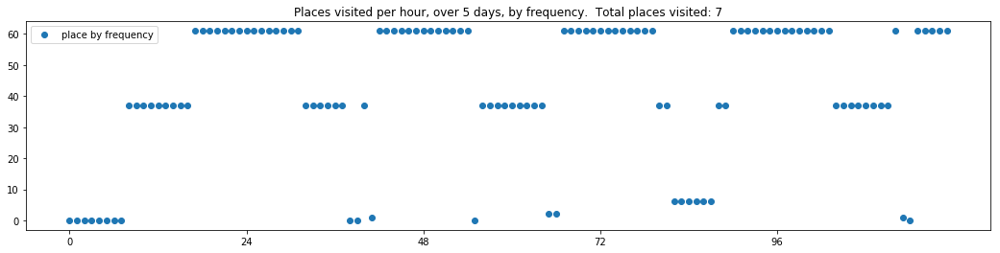


-------showing vectors for model: X-bidirectional.3-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:128-dropout:0.2-dim_embeddings:128-temperature:1.1
----- vector ----
prefix labels:  [388, 388]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 388, 388, 388, 453, 453, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 388, 388, 388, 388, 106, 374, 0, 26, 26, 26, 26, 609, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 388, 388, 388, 388, 105, 84, 260, 360, 249, 249, 249, 379, 379, 586, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 259, 0, 0, 0, 551, 184, 0, 7, 7, 7, 7, 7, 7, 71, 71, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 254, 544, 83, 475, 193, 70, 0, 55, 8, 169, 0, 316, 565]


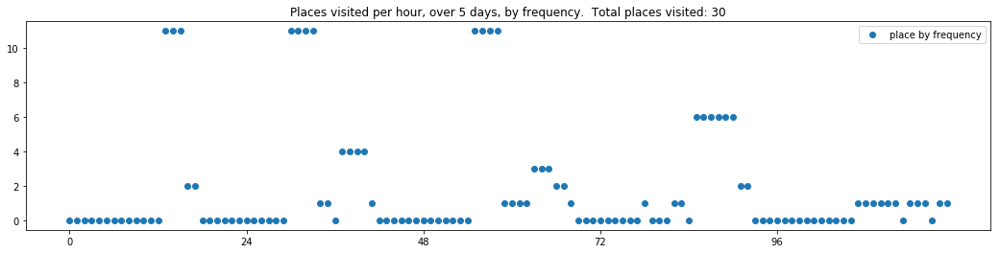

----- vector ----
prefix labels:  [222, 224]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 224, 0, 0, 0, 463, 462, 222, 222, 0, 0, 0, 0, 222, 222, 222]
[222, 222, 222, 222, 222, 222, 222, 222, 222, 536, 0, 0, 0, 320, 0, 0, 0, 530, 0, 0, 0, 222, 222, 222]
[222, 222, 222, 222, 222, 222, 222, 222, 222, 0, 0, 559, 184, 184, 0, 0, 0, 222, 0, 222, 222, 222, 222, 222]
[222, 222, 222, 222, 222, 222, 222, 222, 222, 0, 0, 0, 530, 0, 0, 0, 0, 224, 222, 222, 222, 222, 222, 222]
[222, 222, 222, 222, 222, 222, 222, 222, 0, 0, 0, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222]


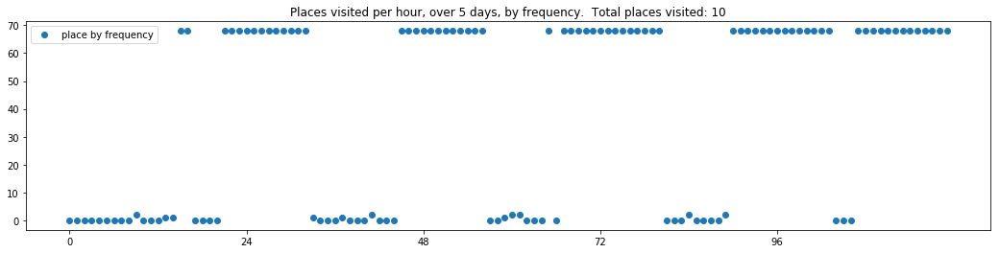

----- vector ----
prefix labels:  [223, 223]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 223, 223, 223, 0, 223, 223, 223, 223, 223, 223, 223]
[223, 223, 223, 223, 223, 223, 223, 0, 0, 0, 0, 0, 223, 223, 223, 0, 0, 0, 205, 223, 223, 223, 223, 223]
[223, 223, 223, 223, 223, 223, 223, 0, 0, 0, 223, 223, 0, 0, 222, 0, 0, 0, 90, 90, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 223, 0, 0, 0, 0, 0, 0, 0, 0, 0, 72, 72, 72, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 140, 0, 0, 0]


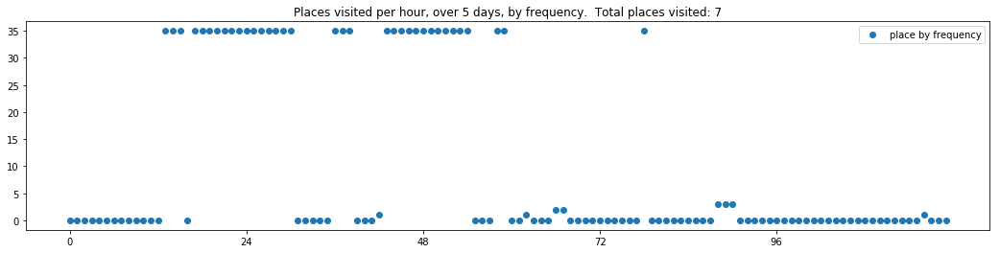


-------showing vectors for model: Y-bidirectional-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:256-dropout:0.3-dim_embeddings:100-temperature:0.8
----- vector ----
prefix labels:  [409, 409]
[409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 0, 0, 0, 0, 409, 409, 409, 409, 409, 409, 409, 409, 409]
[409, 409, 409, 409, 409, 409, 409, 409, 0, 0, 0, 0, 0, 0, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409]
[409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 0, 0, 0, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409]
[409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409]
[409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409, 409]


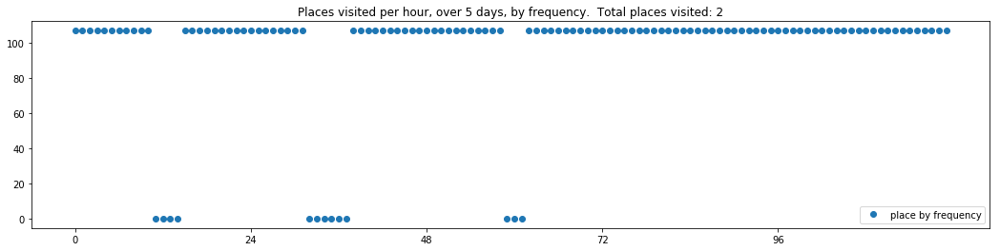

----- vector ----
prefix labels:  [177, 8]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 248, 248, 248, 248, 248]
[248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248]
[248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248]


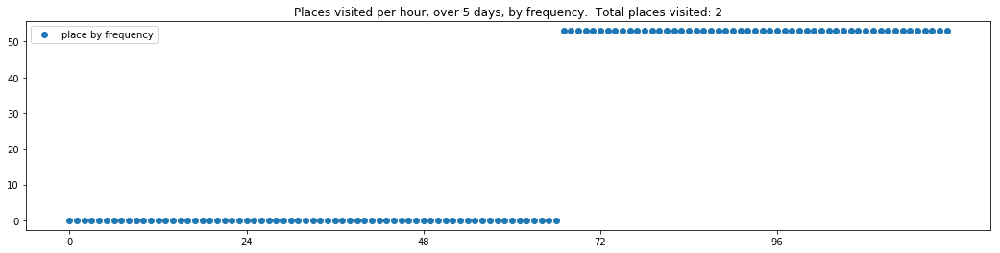

----- vector ----
prefix labels:  [557, 557]
[0, 0, 0, 0, 0, 0, 0, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557]
[557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557]
[557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557]
[557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557]
[557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557, 557]


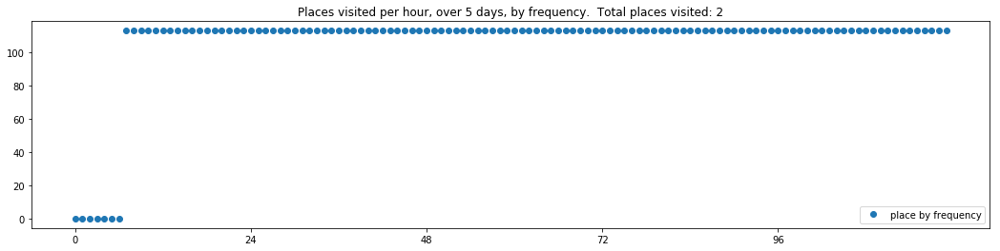


-------showing vectors for model: Y-bidirectional.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:256-dropout:0.3-dim_embeddings:100-temperature:0.8
----- vector ----
prefix labels:  [46, 46]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46]
[46, 45, 45, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46]
[46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46]


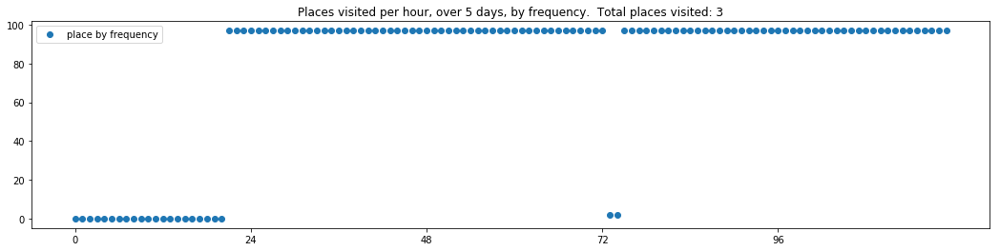

----- vector ----
prefix labels:  [632, 632]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 632, 632, 632, 632]
[632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632]
[632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 0, 0, 632, 632, 632, 632]
[632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632]
[632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 632, 0, 0, 632, 632, 632]


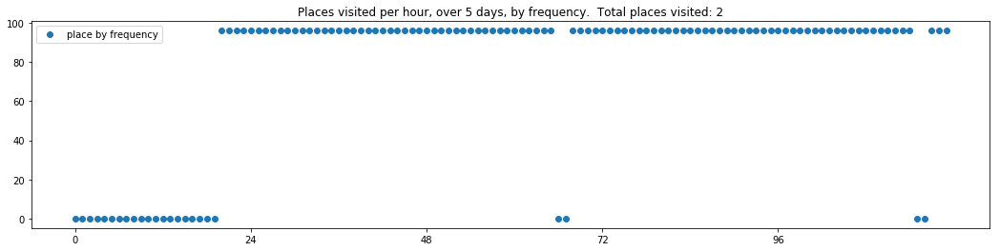

----- vector ----
prefix labels:  [168, 168]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 168, 168]
[168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168]
[168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168]
[168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168]
[168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168]


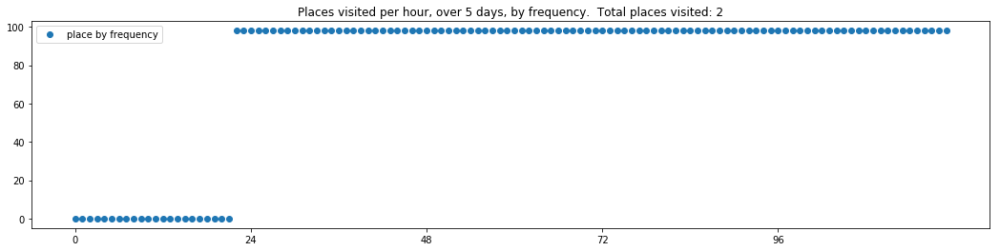


-------showing vectors for model: Y-bidirectional.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:256-dropout:0.3-dim_embeddings:100-temperature:0.8
----- vector ----
prefix labels:  [225, 225]
[0, 0, 0, 0, 0, 0, 0, 225, 323, 323, 225, 225, 225, 225, 225, 225, 225, 225, 225, 225, 225, 225, 225, 225]
[225, 225, 225, 225, 225, 225, 225, 225, 323, 323, 323, 323, 323, 323, 323, 225, 225, 225, 225, 225, 225, 225, 225, 225]
[225, 225, 225, 225, 225, 225, 225, 225, 323, 323, 323, 323, 323, 323, 225, 225, 225, 225, 225, 225, 225, 225, 225, 225]
[225, 225, 225, 225, 225, 225, 225, 225, 323, 323, 323, 323, 323, 323, 323, 323, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 323, 323, 323, 323, 323, 323, 225, 225, 225, 225, 225, 225, 225, 225, 225, 225]


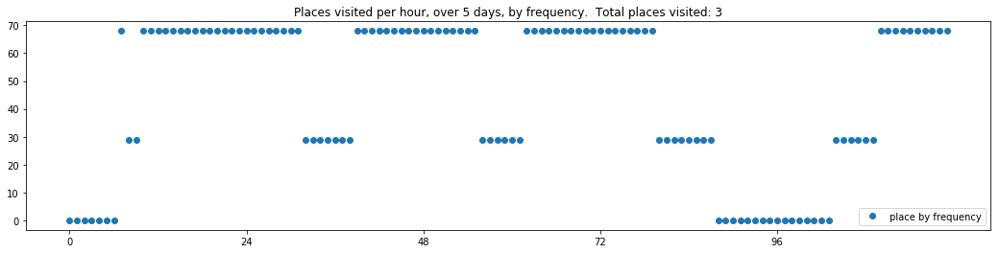

----- vector ----
prefix labels:  [365, 240]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 365, 365, 365, 365, 365, 365, 365]
[365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365]


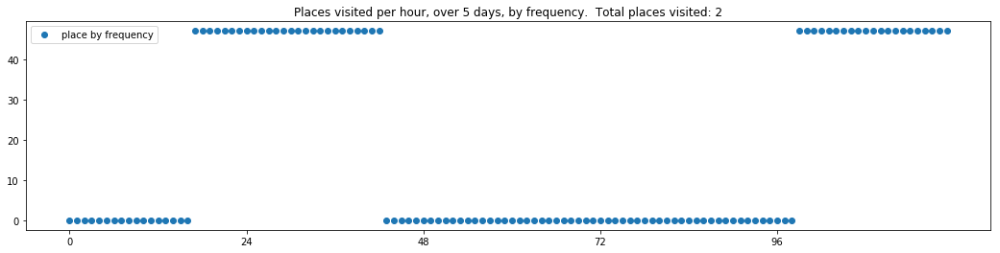

----- vector ----
prefix labels:  [303, 389]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 303, 303, 303, 303]
[303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 0, 0, 0, 0, 0, 0, 0, 0, 303, 303, 303]
[303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303]


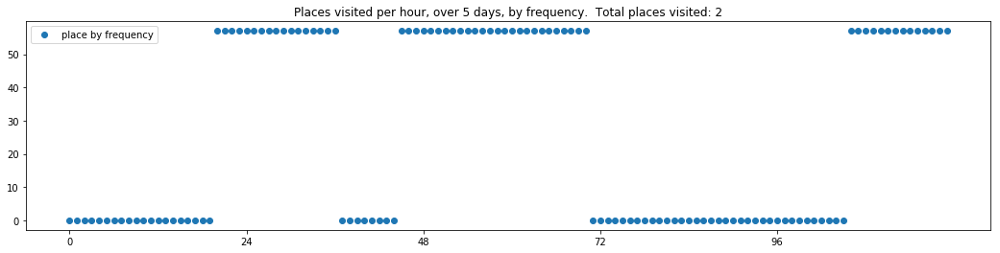


-------showing vectors for model: Y-bidirectional.3-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:256-dropout:0.3-dim_embeddings:100-temperature:0.8
----- vector ----
prefix labels:  [616, 616]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 616, 616, 616, 616]
[616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616]
[616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616]
[616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616]
[616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616, 616]


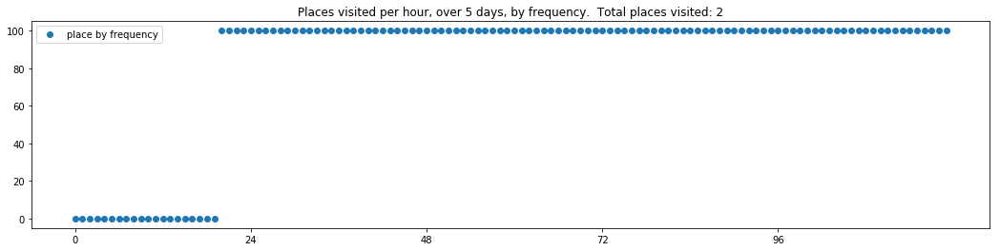

----- vector ----
prefix labels:  [466, 317]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 466, 466, 466, 466, 466]
[466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 317, 317, 317, 317, 317, 317, 317, 317, 317, 466, 466, 466, 466, 466]
[466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466]
[466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466]
[466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466, 466]


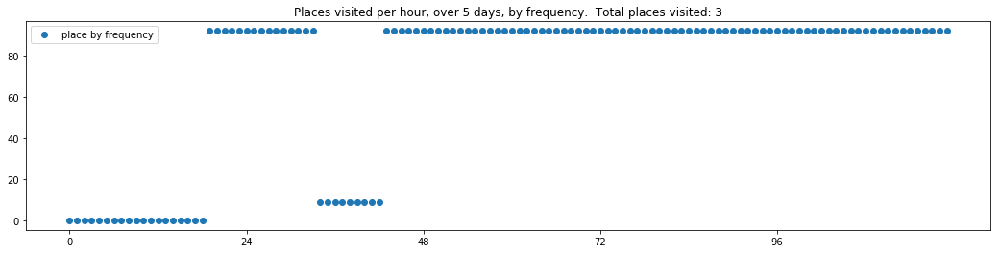

----- vector ----
prefix labels:  [358, 8]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 8, 8, 8, 8, 8, 0, 0, 0, 358, 358, 358]
[358, 358, 358, 358, 358, 358, 358, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


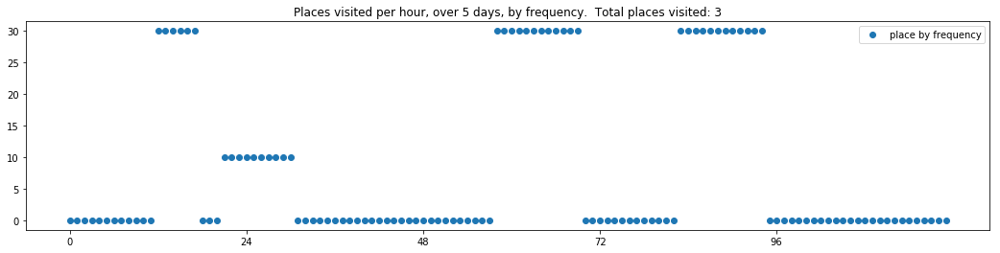


-------showing vectors for model: Z-bidirectional-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:72-rnn_layers:2-rnn_size:256-dropout:0.3-dim_embeddings:100-temperature:0.8
----- vector ----
prefix labels:  [396, 92]
[0, 0, 0, 0, 0, 0, 0, 92, 92, 92, 92, 92, 92, 92, 92, 92, 396, 396, 396, 396, 396, 396, 396, 396]
[396, 396, 396, 396, 396, 396, 396, 396, 92, 92, 92, 92, 92, 92, 92, 92, 396, 396, 396, 396, 396, 396, 396, 396]
[396, 396, 396, 396, 396, 396, 396, 396, 92, 92, 92, 92, 92, 92, 87, 87, 396, 396, 396, 396, 396, 396, 396, 396]
[396, 396, 396, 396, 396, 396, 396, 396, 92, 92, 92, 92, 92, 92, 92, 92, 396, 396, 396, 396, 396, 396, 396, 396]
[396, 396, 396, 396, 396, 396, 396, 396, 92, 92, 92, 92, 92, 92, 92, 92, 396, 396, 396, 396, 396, 396, 396, 396]


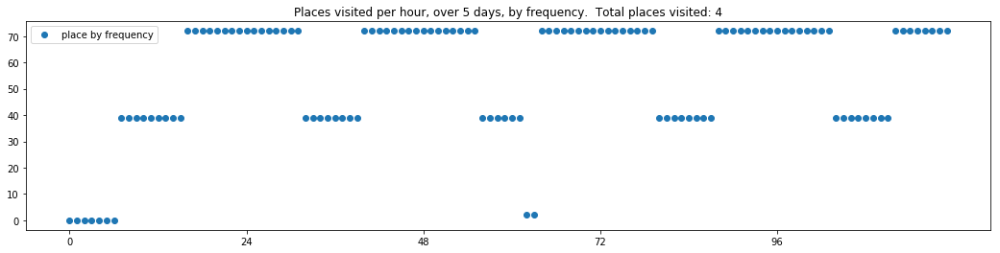

----- vector ----
prefix labels:  [8, 8]
[0, 0, 0, 0, 0, 0, 0, 0, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 8, 8, 8, 8, 8, 8, 8, 8, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 124, 8, 8, 8, 8, 8, 8, 8, 8, 8, 21, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 8, 8, 8, 8, 8, 8, 8, 8, 8, 0, 0, 0, 0, 0, 0, 0]


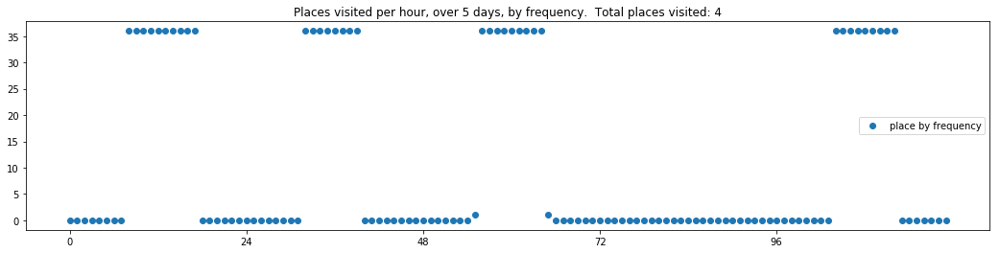

----- vector ----
prefix labels:  [392, 195]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 392, 392, 392, 392]
[392, 392, 392, 392, 392, 392, 392, 392, 195, 195, 195, 195, 195, 195, 0, 0, 0, 0, 0, 392, 392, 392, 392, 392]
[392, 392, 392, 392, 392, 392, 392, 195, 195, 195, 195, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


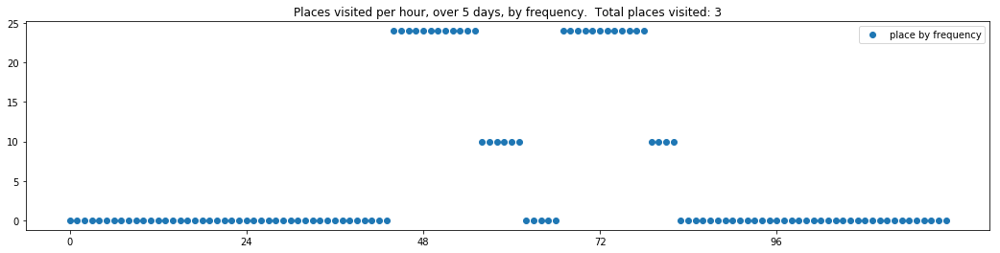


-------showing vectors for model: Z-bidirectional.1-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:72-rnn_layers:2-rnn_size:256-dropout:0.3-dim_embeddings:100-temperature:0.9
----- vector ----
prefix labels:  [217, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 217, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 217, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 217, 217, 0, 217, 217, 217, 217, 217, 217, 217, 217, 217, 0, 0, 0, 0, 0, 0, 0, 217, 217, 217, 0]


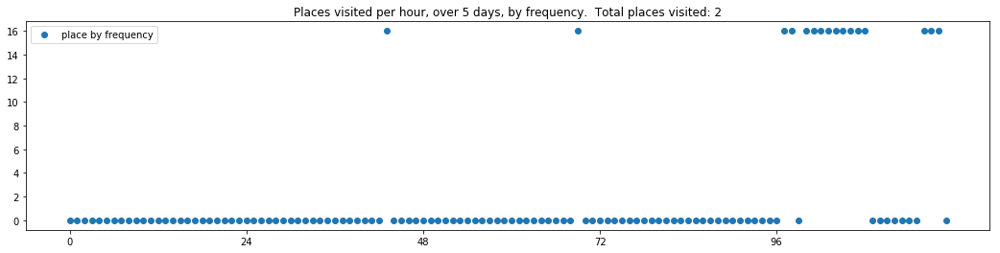

----- vector ----
prefix labels:  [491, 491]
[0, 0, 0, 0, 0, 0, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491]
[491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 0, 0, 491, 491, 491, 491, 491, 491, 491, 491, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491, 491]


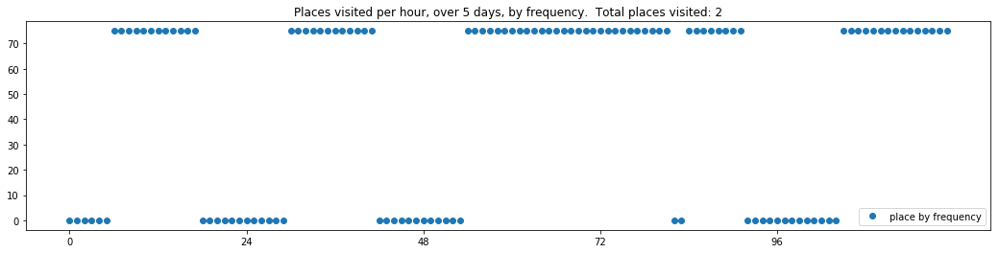

----- vector ----
prefix labels:  [14, 7]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 7, 7, 7, 7, 7, 7, 7, 7, 152, 14, 14, 14, 14]
[14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 7, 7, 7, 7, 7, 7, 7, 351, 351, 152, 14, 14, 14, 14]
[14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 7, 7, 7, 351, 7, 7, 7, 285, 285, 285, 14, 14, 14, 14]
[14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 7, 7, 7, 7, 7, 7, 7, 7, 7, 14, 153, 14, 14, 14]
[14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 14, 14]


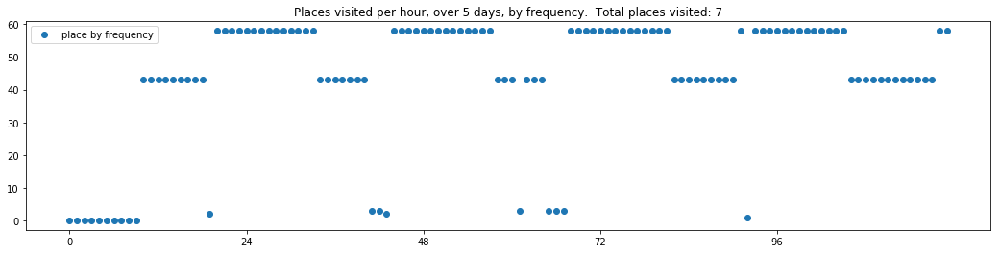


-------showing vectors for model: Z-bidirectional.2-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:72-rnn_layers:2-rnn_size:256-dropout:0.3-dim_embeddings:100-temperature:1.0
----- vector ----
prefix labels:  [647, 2]
[0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 647, 647, 647, 647, 647]
[647, 647, 647, 647, 647, 647, 647, 647, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 647, 647, 647, 647, 647]
[647, 647, 647, 647, 647, 647, 647, 647, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 647, 647, 647, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 647, 647, 647, 647]
[647, 647, 647, 647, 647, 647, 647, 647, 647, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 647, 647, 647, 647]


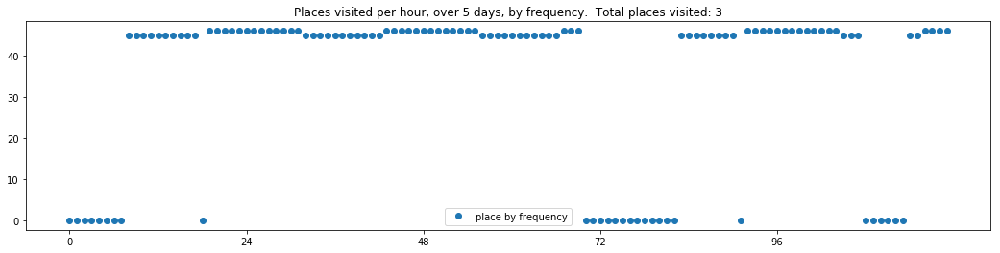

----- vector ----
prefix labels:  [395, 271]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 395, 395, 395]
[395, 395, 395, 395, 395, 395, 395, 271, 271, 271, 271, 271, 271, 271, 271, 271, 395, 395, 395, 395, 395, 395, 395, 395]
[395, 395, 395, 395, 395, 395, 395, 395, 271, 271, 271, 271, 271, 271, 271, 271, 271, 395, 395, 395, 395, 395, 395, 395]
[395, 395, 395, 395, 395, 395, 395, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 395, 395, 395, 395, 395, 395, 395]
[395, 395, 395, 395, 395, 395, 395, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 239, 395, 395, 395, 395, 395, 395]


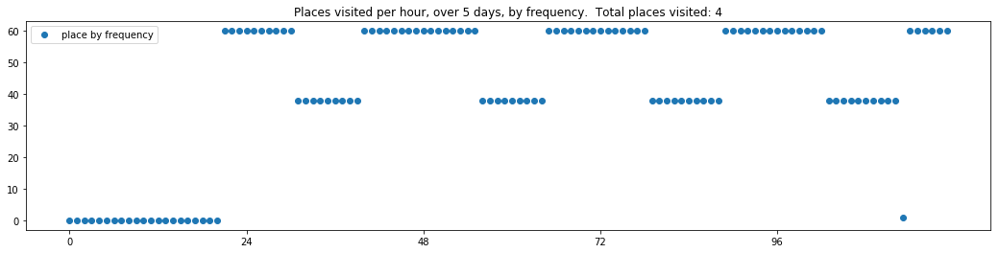

----- vector ----
prefix labels:  [212, 212]
[0, 0, 0, 0, 0, 212, 212, 212, 212, 212, 212, 212, 212, 212, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 212, 212, 212, 212, 212, 212, 212, 0, 212, 212, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 0, 0, 0, 0, 0, 79, 79, 0, 0]
[0, 0, 0, 0, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 208, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 0, 0, 0, 0, 0, 0, 0, 0]


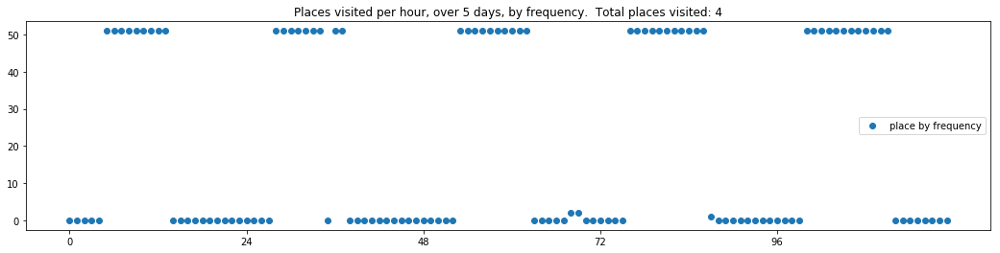


-------showing vectors for model: Z-bidirectional.3-------

trajectories from: generated-sample-trajectories-rnn_bidirectional:True-max_len:72-rnn_layers:2-rnn_size:256-dropout:0.3-dim_embeddings:100-temperature:1.1
----- vector ----
prefix labels:  [118, 118]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 535, 118, 118, 118, 118, 118, 647, 647, 647, 647, 118, 118, 118, 118, 118]
[118, 118, 118, 118, 118, 118, 118, 76, 386, 118, 248, 248, 248, 248, 118, 118, 253, 253, 0, 0, 118, 118, 118, 118]
[118, 118, 118, 118, 118, 118, 118, 220, 486, 456, 209, 475, 475, 271, 583, 647, 647, 118, 118, 118, 118, 118, 118, 118]
[118, 118, 118, 118, 118, 118, 118, 583, 248, 209, 583, 583, 118, 118, 118, 400, 400, 400, 122, 118, 118, 118, 118, 118]
[118, 118, 118, 118, 125, 118, 118, 118, 118, 118, 248, 248, 248, 209, 118, 118, 118, 118, 118, 118, 118, 118, 118, 118]


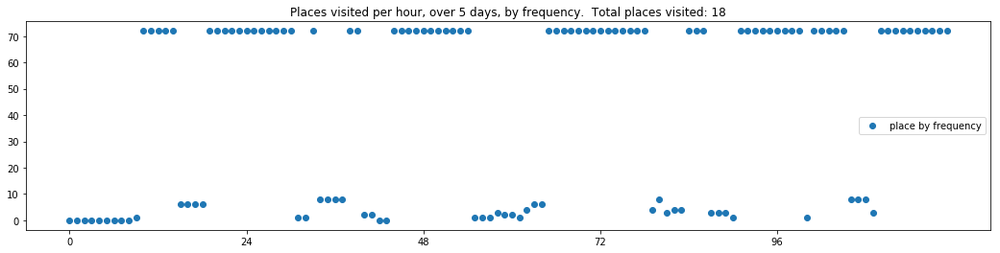

----- vector ----
prefix labels:  [79, 276]
[0, 79, 79, 79, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 276, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 79, 79, 79, 79, 79, 79, 276, 276, 276, 0, 0, 276, 334, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 79, 79, 79, 79, 79, 79, 79, 79, 2, 276, 276, 276, 276, 276, 276, 0, 0, 0, 0, 0, 0, 0]
[0, 79, 79, 79, 79, 79, 79, 79, 276, 276, 276, 276, 276, 276, 276, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 79, 79, 79, 79, 6, 6, 276, 276, 276, 276, 276, 276, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


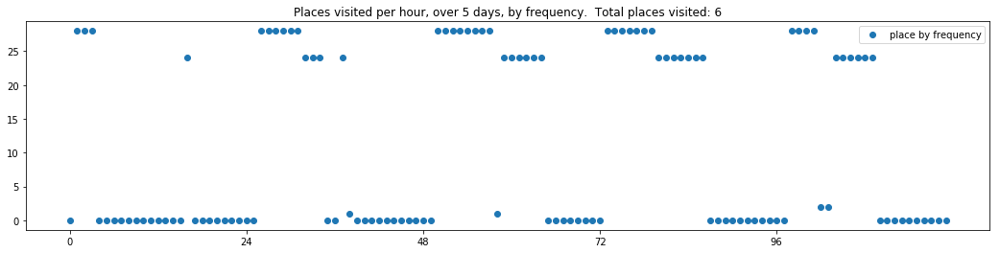

----- vector ----
prefix labels:  [276, 412]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 412, 0, 484, 484, 484, 276, 276, 276]
[276, 276, 276, 276, 276, 276, 276, 276, 412, 412, 412, 412, 412, 412, 412, 412, 412, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 484, 484, 484, 484, 484, 276]
[276, 276, 276, 276, 276, 276, 276, 276, 412, 412, 412, 412, 412, 412, 412, 412, 412, 0, 484, 484, 484, 276, 276, 276]
[276, 276, 276, 276, 276, 276, 276, 0, 412, 412, 412, 412, 412, 412, 412, 412, 412, 412, 484, 484, 484, 484, 484, 276]


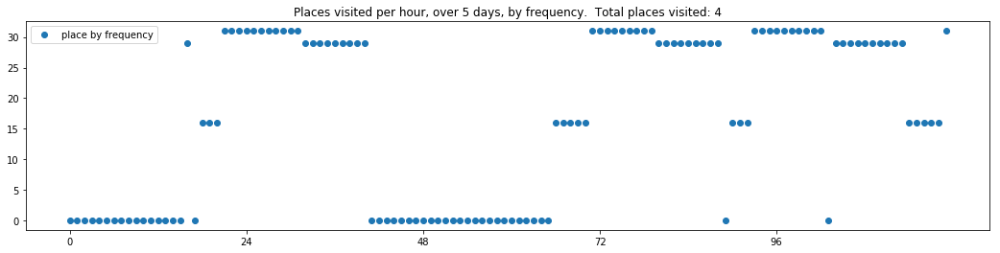


-------showing vectors for model: generated-sample-synthetic_trajectories-temperature:0.8-------

trajectories from: generated-sample-synthetic_trajectories-temperature:0.8
----- vector ----
prefix labels:  [515, 585]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 585, 585, 585, 585, 585, 585, 585, 585, 585, 341, 341, 341, 341, 515, 515]
[515, 515, 515, 515, 515, 515, 515, 515, 585, 585, 585, 585, 585, 585, 585, 585, 585, 585, 515, 515, 515, 515, 515, 515]
[515, 515, 515, 515, 515, 515, 515, 515, 515, 585, 585, 585, 585, 585, 585, 585, 585, 585, 585, 585, 585, 585, 0, 515]
[515, 515, 515, 515, 515, 515, 515, 515, 515, 585, 585, 585, 585, 585, 585, 585, 585, 585, 515, 515, 515, 515, 515, 515]
[515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 515, 0, 0, 0, 0, 0, 515, 515, 515]


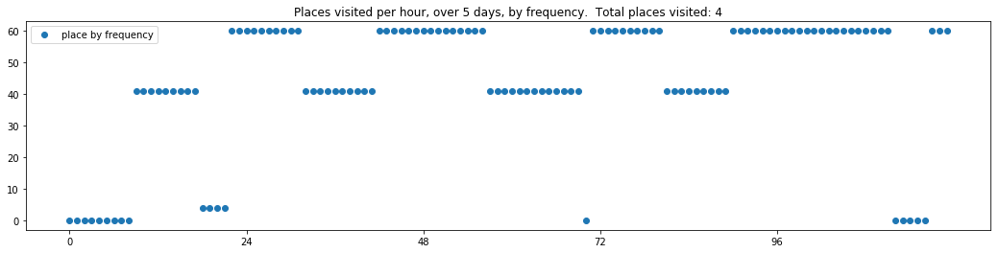

----- vector ----
prefix labels:  [70, 597]
[0, 0, 0, 0, 0, 0, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 70, 70, 70, 70, 70, 70]
[70, 70, 70, 70, 70, 0, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 70, 70, 70, 70, 70, 70]
[70, 70, 70, 70, 70, 70, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 70, 70, 70, 70, 70, 70]
[70, 70, 70, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 597, 70, 70, 70, 70, 70, 70]
[70, 597, 597, 597, 597, 597, 70, 70, 72, 597, 597, 597, 597, 597, 597, 597, 597, 597, 70, 70, 70, 70, 70, 70]


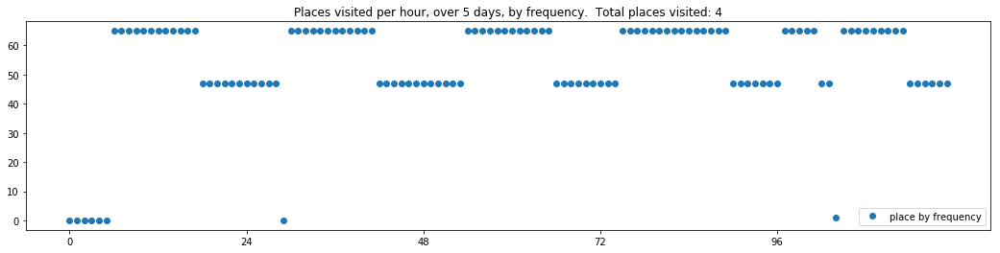

----- vector ----
prefix labels:  [375, 375]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 382, 382]
[382, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 375, 375, 0, 100, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


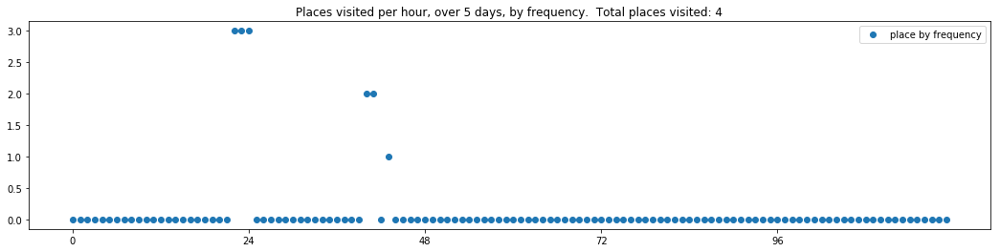


-------showing vectors for model: generated-sample-synthetic_trajectories-temperature:0.9-------

trajectories from: generated-sample-synthetic_trajectories-temperature:0.9
----- vector ----
prefix labels:  [514, 514]
[0, 0, 0, 0, 0, 0, 514, 514, 514, 514, 508, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514]
[514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514]
[514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 508, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514]
[514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514]
[514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 508, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514, 514]


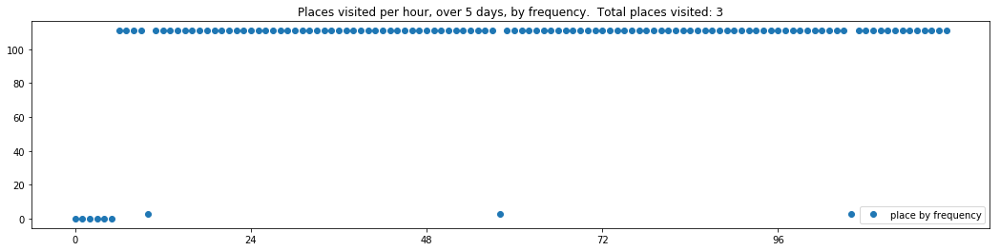

----- vector ----
prefix labels:  [142, 142]
[0, 0, 0, 0, 0, 0, 0, 0, 142, 142, 142, 142, 142, 142, 142, 142, 142, 0, 0, 0, 0, 0, 0, 0]
[20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 142, 142, 142, 142, 142, 142, 142, 142, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 142, 142, 142, 142, 142, 142, 142, 142, 230, 0, 0, 230, 230, 0, 0, 0, 0]


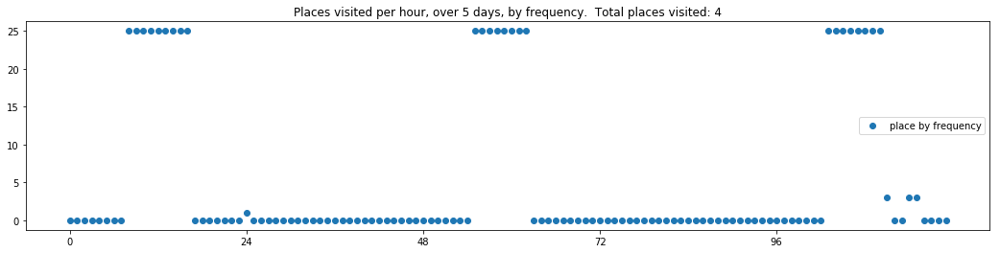

----- vector ----
prefix labels:  [187, 187]
[0, 0, 0, 0, 0, 0, 0, 0, 187, 187, 0, 0, 187, 187, 187, 187, 187, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 187, 187, 187, 187, 187, 187, 187, 187, 187, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 187, 187, 187, 187, 187, 187, 187, 187, 187, 187, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 187, 187, 187, 187, 187, 187, 187, 187, 187, 187, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 187, 187, 187, 187, 187, 187, 187, 187, 187, 187, 187, 0, 0, 0, 0, 0, 0]


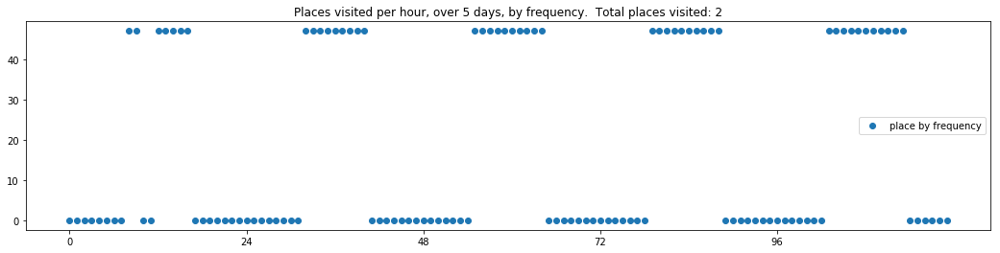


-------showing vectors for model: generated-sample-synthetic_trajectories-temperature:1.0-------

trajectories from: generated-sample-synthetic_trajectories-temperature:1.0
----- vector ----
prefix labels:  [77, 267]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 267, 347, 403, 267, 267, 267, 77, 77, 0, 77, 0, 0]
[77, 77, 77, 77, 77, 77, 77, 77, 0, 267, 267, 267, 267, 267, 267, 267, 267, 267, 77, 77, 77, 77, 77, 77]
[77, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 267, 10, 267, 287, 267, 267, 77, 77, 77, 77, 77, 421]
[77, 77, 77, 77, 77, 77, 227, 227, 227, 227, 227, 227, 227, 267, 267, 267, 267, 267, 267, 98, 98, 98, 77, 77]
[77, 77, 77, 77, 77, 33, 33, 33, 33, 33, 33, 21, 357, 357, 0, 267, 267, 267, 421, 77, 448, 448, 77, 77]


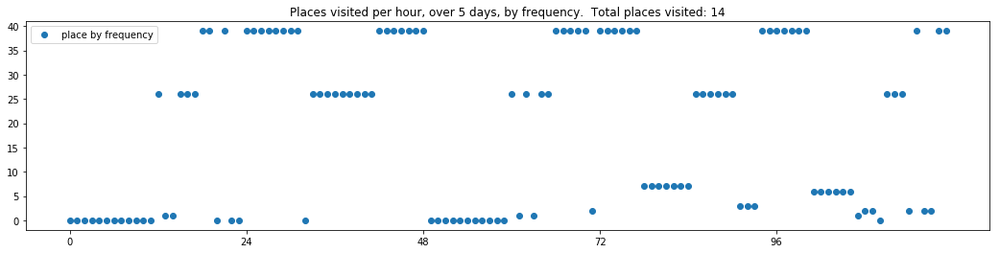

----- vector ----
prefix labels:  [401, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 401, 401, 401, 401, 401, 401, 401]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 401, 401, 401, 401, 401, 0]
[0, 0, 0, 0, 0, 0, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 261, 0]
[0, 261, 0, 0, 0, 0, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401]
[401, 484, 0, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 401, 0]


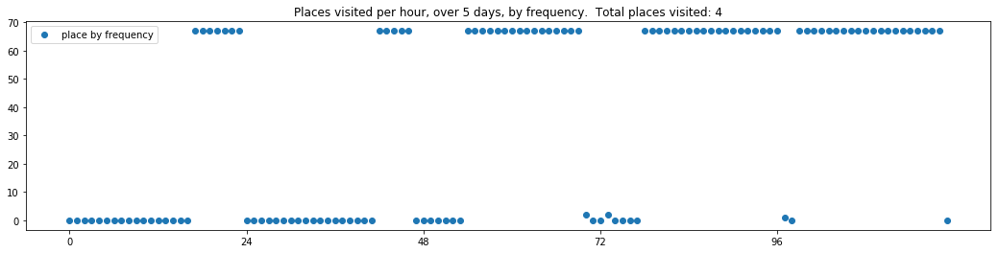

----- vector ----
prefix labels:  [220, 295]
[0, 0, 0, 0, 0, 0, 0, 295, 295, 295, 295, 295, 295, 295, 295, 295, 220, 295, 295, 220, 220, 220, 220, 220]
[220, 220, 220, 220, 220, 220, 220, 295, 295, 295, 295, 295, 295, 295, 295, 220, 220, 220, 218, 218, 218, 220, 220, 220]
[220, 220, 220, 220, 220, 220, 220, 220, 295, 295, 295, 295, 295, 295, 295, 220, 220, 220, 220, 220, 220, 220, 220, 220]
[220, 220, 220, 220, 220, 220, 220, 220, 295, 295, 295, 295, 295, 295, 295, 220, 220, 220, 220, 220, 220, 220, 220, 220]
[220, 220, 220, 220, 220, 220, 220, 220, 295, 220, 220, 220, 220, 220, 295, 295, 0, 0, 220, 220, 220, 220, 220, 220]


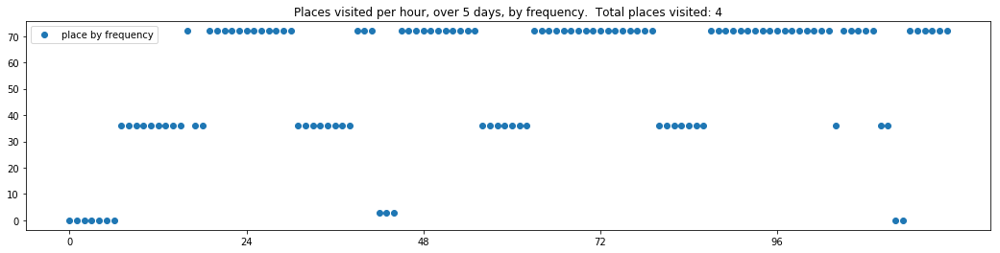

In [330]:
import random 

sample_size = 3

for column_name in models_matrix_df.columns:
    print('\n-------showing vectors for model: %s-------' % column_name)
    generated_trajectories_name = models_matrix_df.loc[generated_trajectories_name_idx][column_name]
    print('\ntrajectories from: %s' % generated_trajectories_name)
    generated_trajectories = generated_sample_trajectories_map[generated_trajectories_name]
    for tv in random.sample(generated_trajectories, sample_size):
        print_dwell_vector_by_days(tv)
        plot_trajectory_vector_frequencies(tv, by_frequency_order=False)

In [331]:
# Helper function to create dummy row that is then filled in
def add_dummy_row(df, index_name):
    dummy_row_dict = {c:np.NaN for c in df.columns}
    return df.append(pd.Series(dummy_row_dict, name=index_name))

### check that fake users do not travel impossibly far

We check that between two consecutive time intervals, synthetic users don’t travel impossibly far; that is, they don’t suddenly go from one census area to another that is too far away to have been traveled within that time interval.  We can do this by looking at the geographic locations of the centroids or the boundaries of census areas.  We consider two consecutive stay locations in a stay vector sequence as a bigram, and must verify that each bigram is sensible. It is possible for sensible bigrams in the generated data to occur that have not been seen in the training data. However, instead of verifying that all such bigrams are sensible, we have a shortcut due to how well our RNN models are fit to our training data.  We are able to collect the set of bigrams in the real sequences, and the set of bigrams in the synthetic sequences, and check whether only bigrams from the real sequences occur in the synthetic sequences.  If so, all the bigrams in our generated data must be sensible.

Measure:
- `distinct unseen bigrams`: number of distinct bigrams found in generated trajectories but not real trajectores
- `total unseen bigrams`: total number of bigrams in generated trajectories but not real trajectories
- `portion unseen bigrams`: (# total unseen bigrams)/(# total generated bigrams)
- `portion unseen bigrams allowing skips`: (# total unseen bigrams allowing skips)/(# total generated bigrams)


`portion unseen bigrams allowing skips`:

There are unseen bigrams. So also check something else:

Synthetic users do not travel anywhere within 1 hour that real users did not travel within 2 hours.

i.e. Get the bigrams that include skips over 1 hour at a time from the real user trajectories. A sequence of "A B C D" will then produce bigrams (A, B), (A, C), (B, C), (B, D), (C, D).

Compare this to the set of bigrams from the synthetic data that do not include skips. Check if this set of bigrams from real data with 1 hour skips contains the set of bigrams from synthetic data without skips.


Add row for each model

In [332]:
distinct_unseen_bigrams = 'distinct unseen bigrams'
total_unseen_bigrams = 'total unseen bigrams'
portion_unseen_bigrams = 'portion unseen bigrams'
portion_unseen_bigrams_w_skips = 'portion unseen bigrams allowing skips'

models_matrix_df = add_dummy_row(models_matrix_df, distinct_unseen_bigrams)
models_matrix_df = add_dummy_row(models_matrix_df, total_unseen_bigrams)
models_matrix_df = add_dummy_row(models_matrix_df, portion_unseen_bigrams)
models_matrix_df = add_dummy_row(models_matrix_df, portion_unseen_bigrams_w_skips)
models_matrix_df

,default,default.1,default.2,B,B.1,B.2,C,C.1,C.2,E,...,Y-bidirectional.1,Y-bidirectional.2,Y-bidirectional.3,Z-bidirectional,Z-bidirectional.1,Z-bidirectional.2,Z-bidirectional.3,generated-sample-synthetic_trajectories-temperature:0.8,generated-sample-synthetic_trajectories-temperature:0.9,generated-sample-synthetic_trajectories-temperature:1.0
rnn_bidirectional,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,True,True,True,[nan],[nan],[nan]
max_length,24,24,24,24,24,24,24,24,24,48,...,60,60,60,72,72,72,72,[nan],[nan],[nan]
rnn_layers,2,2,2,2,2,2,2,2,2,2,...,3,3,3,2,2,2,2,[nan],[nan],[nan]
rnn_size,128,128,128,256,256,256,128,128,128,128,...,256,256,256,256,256,256,256,[nan],[nan],[nan]
dropout,0.1,0.1,0.1,0.1,0.1,0.1,0.2,0.2,0.2,0.1,...,0.3,0.3,0.3,0.3,0.3,0.3,0.3,[nan],[nan],[nan]
dim_embeddings,50,50,50,50,50,50,50,50,50,50,...,100,100,100,100,100,100,100,[nan],[nan],[nan]
temperature,0.8,0.9,1,0.8,0.9,1,0.8,0.9,1,0.8,...,0.8,0.8,0.8,0.8,0.9,1,1.1,[nan],[nan],[nan]
batch size,512,512,512,512,512,512,512,512,512,512,...,1024,1024,1024,1024,1024,1024,1024,[nan],[nan],[nan]
generated for cambridge,GPU,yes,yes,no,no,no,yes,yes,yes,no,...,NaN,NaN,NaN,loss after epoch 11:,0.7,NaN,NaN,[nan],[nan],[nan]
generated for general sample,GPU,yes,yes,yes,yes,yes,done,done,done,yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[nan],[nan],[nan]


In [333]:
from evaluators import get_unseen_bigrams, get_bigrams_for_trajectory_vectors


# get bigrams for the real trajectories to compare the generated trajectories to
real_bigram_set = get_bigrams_for_trajectory_vectors(real_trajectories, with_skip=False)
real_bigram_set_with_skip = get_bigrams_for_trajectory_vectors(real_trajectories, with_skip=True)

for column_name in models_matrix_df.columns:
    generated_trajectories_name = models_matrix_df.loc[generated_trajectories_name_idx][column_name]
    generated_trajectories = generated_sample_trajectories_map[generated_trajectories_name]
    # get bigrams for generated trajectories (for counting)
    generated_bigram_set = get_bigrams_for_trajectory_vectors(generated_trajectories)
    # find the bigrams in the generated trajectories that do not occur in the real trajectories
    # get mapping of {unseen bigrams --> count}
    #    where count is number of times the unseen bigram occurs in the generated trajectories
    unseen_bigram_to_count = get_unseen_bigrams(real_bigram_set, generated_trajectories)
    # count the distinct unseen bigrams
    distinct_unseen_bigrams_count = len(unseen_bigram_to_count)
    # count the total number of times an unseeen bigram occurs
    total_unseen_bigrams_count = sum(unseen_bigram_to_count.values())
    # compute the portion of total unseen bigrams over all generated bigrams
    total_generated_bigrams_count = (len(generated_trajectories)*len(generated_trajectories[0]))
    portion_unseen_total_bigrams = total_unseen_bigrams_count / total_generated_bigrams_count
    
    # compute portion of total unseen bigrams over all generated bigrams when skips are allowed
    unseen_bigram_to_count_with_skip = get_unseen_bigrams(real_bigram_set_with_skip, generated_trajectories)
    total_unseen_bigrams_count_with_skip = sum(unseen_bigram_to_count_with_skip.values())
    portion_unseen_total_bigrams_w_skip = total_unseen_bigrams_count_with_skip / total_generated_bigrams_count
    
    # Add values to matrix
    models_matrix_df.loc[distinct_unseen_bigrams][column_name] = distinct_unseen_bigrams_count
    models_matrix_df.loc[total_unseen_bigrams][column_name] = total_unseen_bigrams_count
    models_matrix_df.loc[portion_unseen_bigrams][column_name] = portion_unseen_total_bigrams
    models_matrix_df.loc[portion_unseen_bigrams_w_skips][column_name] = portion_unseen_total_bigrams_w_skip
    

models_matrix_df

,default,default.1,default.2,B,B.1,B.2,C,C.1,C.2,E,...,Y-bidirectional.1,Y-bidirectional.2,Y-bidirectional.3,Z-bidirectional,Z-bidirectional.1,Z-bidirectional.2,Z-bidirectional.3,generated-sample-synthetic_trajectories-temperature:0.8,generated-sample-synthetic_trajectories-temperature:0.9,generated-sample-synthetic_trajectories-temperature:1.0
rnn_bidirectional,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,True,True,True,[nan],[nan],[nan]
max_length,24,24,24,24,24,24,24,24,24,48,...,60,60,60,72,72,72,72,[nan],[nan],[nan]
rnn_layers,2,2,2,2,2,2,2,2,2,2,...,3,3,3,2,2,2,2,[nan],[nan],[nan]
rnn_size,128,128,128,256,256,256,128,128,128,128,...,256,256,256,256,256,256,256,[nan],[nan],[nan]
dropout,0.1,0.1,0.1,0.1,0.1,0.1,0.2,0.2,0.2,0.1,...,0.3,0.3,0.3,0.3,0.3,0.3,0.3,[nan],[nan],[nan]
dim_embeddings,50,50,50,50,50,50,50,50,50,50,...,100,100,100,100,100,100,100,[nan],[nan],[nan]
temperature,0.8,0.9,1,0.8,0.9,1,0.8,0.9,1,0.8,...,0.8,0.8,0.8,0.8,0.9,1,1.1,[nan],[nan],[nan]
batch size,512,512,512,512,512,512,512,512,512,512,...,1024,1024,1024,1024,1024,1024,1024,[nan],[nan],[nan]
generated for cambridge,GPU,yes,yes,no,no,no,yes,yes,yes,no,...,NaN,NaN,NaN,loss after epoch 11:,0.7,NaN,NaN,[nan],[nan],[nan]
generated for general sample,GPU,yes,yes,yes,yes,yes,done,done,done,yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[nan],[nan],[nan]


### Check condition labels match output

The generated stay vectors are prefixed by home and work labels that act as conditions for generation.  For evaluation, we then check that we are able to infer the same home census area (using the same f_home, f_work function used in preprocessing) as the home prefix label we condition on. That is, if we condition on generating a synthetic stay vector for a person living in census area A, then by applying our f_home function on that generated vector, we should expect area A to be returned.

Measure:
- `home labels match portion`:  portion of vectors in generated set where the home label matches the vector data
- `work labels match portion`:  portion of vectors in generated set where the work label matches the vector data

In [334]:
import os
import sys
module_path = os.path.abspath(os.path.join('../..'))
if module_path not in sys.path:
    sys.path.append(module_path)
from trajectory_transformers import get_trajectory_home_label, get_trajectory_work_label


# Set up the evaluation row data that will be filled in
home_labels_match_portion = 'home labels match portion'
work_labels_match_portion = 'work labels match portion'
models_matrix_df = add_dummy_row(models_matrix_df, home_labels_match_portion)
models_matrix_df = add_dummy_row(models_matrix_df, work_labels_match_portion)
models_matrix_df

,default,default.1,default.2,B,B.1,B.2,C,C.1,C.2,E,...,Y-bidirectional.1,Y-bidirectional.2,Y-bidirectional.3,Z-bidirectional,Z-bidirectional.1,Z-bidirectional.2,Z-bidirectional.3,generated-sample-synthetic_trajectories-temperature:0.8,generated-sample-synthetic_trajectories-temperature:0.9,generated-sample-synthetic_trajectories-temperature:1.0
rnn_bidirectional,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,True,True,True,[nan],[nan],[nan]
max_length,24,24,24,24,24,24,24,24,24,48,...,60,60,60,72,72,72,72,[nan],[nan],[nan]
rnn_layers,2,2,2,2,2,2,2,2,2,2,...,3,3,3,2,2,2,2,[nan],[nan],[nan]
rnn_size,128,128,128,256,256,256,128,128,128,128,...,256,256,256,256,256,256,256,[nan],[nan],[nan]
dropout,0.1,0.1,0.1,0.1,0.1,0.1,0.2,0.2,0.2,0.1,...,0.3,0.3,0.3,0.3,0.3,0.3,0.3,[nan],[nan],[nan]
dim_embeddings,50,50,50,50,50,50,50,50,50,50,...,100,100,100,100,100,100,100,[nan],[nan],[nan]
temperature,0.8,0.9,1,0.8,0.9,1,0.8,0.9,1,0.8,...,0.8,0.8,0.8,0.8,0.9,1,1.1,[nan],[nan],[nan]
batch size,512,512,512,512,512,512,512,512,512,512,...,1024,1024,1024,1024,1024,1024,1024,[nan],[nan],[nan]
generated for cambridge,GPU,yes,yes,no,no,no,yes,yes,yes,no,...,NaN,NaN,NaN,loss after epoch 11:,0.7,NaN,NaN,[nan],[nan],[nan]
generated for general sample,GPU,yes,yes,yes,yes,yes,done,done,done,yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[nan],[nan],[nan]


#### Check that home & work labels match generated vector data


- Note portion of users in that have sufficient data across 2 weeks: 14076/22673 = 0.6208265337626252

- Note how often inferred home labels change between weeks for users in real dataset:
    - portion (users with matching homes)/(total users) = (12860)/(14076) = 0.9136118215402103
- Note how often inferred work labels change between weeks for users in real dataset:
    - portion (users with matching work)/(total users) = (10676)/(14076) = 0.7584541062801933

In [335]:
def get_vectors_with_matching_home_prefix(prefixed_vectors):
    vectors_with_matching_home_prefix = []
    for prefixed_v in prefixed_vectors:
        prefix, v = break_prefix(prefixed_v, days=TIME_PERIOD_DAYS, hours=HOURS_PER_DAY)
        home_label_prefix = prefix[0]
        inferred_home_label = get_trajectory_home_label(v)
        if inferred_home_label == home_label_prefix:
            vectors_with_matching_home_prefix.append(prefixed_v)
    return vectors_with_matching_home_prefix  

def get_vectors_with_matching_work_prefix(prefixed_vectors):
    vectors_with_matching_work_prefix = []
    for prefixed_v in prefixed_vectors:
        prefix, v = break_prefix(prefixed_v, days=TIME_PERIOD_DAYS, hours=HOURS_PER_DAY)
        work_label_prefix = prefix[1]
        inferred_work_label = get_trajectory_work_label(v)
        if inferred_work_label == work_label_prefix:
            vectors_with_matching_work_prefix.append(prefixed_v)
    return vectors_with_matching_work_prefix

    
real_vectors_with_matching_home_prefix = get_vectors_with_matching_home_prefix(real_trajectories)
assert(len(real_vectors_with_matching_home_prefix) == len(real_trajectories)) 
real_vectors_with_matching_work_prefix = get_vectors_with_matching_work_prefix(real_trajectories)
assert(len(real_vectors_with_matching_work_prefix) == len(real_trajectories))  
    
for column_name in models_matrix_df.columns:
    generated_trajectories_name = models_matrix_df.loc[generated_trajectories_name_idx, column_name]
    generated_trajectories = generated_sample_trajectories_map[generated_trajectories_name]
    vectors_with_matching_home_prefix = get_vectors_with_matching_home_prefix(generated_trajectories)
    vectors_with_matching_work_prefix = get_vectors_with_matching_work_prefix(generated_trajectories)
    home_match_portion = len(vectors_with_matching_home_prefix)/len(generated_trajectories)
    work_match_portion = len(vectors_with_matching_work_prefix)/len(generated_trajectories)
    models_matrix_df.loc[home_labels_match_portion][column_name] = home_match_portion
    models_matrix_df.loc[work_labels_match_portion][column_name] = work_match_portion


In [336]:
models_matrix_df.drop(['generated for cambridge', 'generated for general sample'], axis=0, inplace=True)

sort the columns by 'home labels match portion'

In [337]:
models_matrix_df.sort_values(home_labels_match_portion, axis=1, inplace=True, ascending=False)

In [338]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(models_matrix_df)
# models_matrix_df

,Z-bidirectional,Z-bidirectional.1,Z-bidirectional.2,Z-bidirectional.3,V-bidirectional.1,V-bidirectional.2,V-bidirectional,Q-bidirectional.1,Q-bidirectional.3,Q-bidirectional.2,Q-bidirectional,V-bidirectional.3,X-bidirectional.3,X-bidirectional.1,X-bidirectional.2,X-bidirectional,P-bidirectional.2,P-bidirectional.3,T-bidirectional.1,P-bidirectional.1,generated-sample-synthetic_trajectories-temperature:1.0,Y-bidirectional.2,Y-bidirectional,Y-bidirectional.1,Y-bidirectional.3,T-bidirectional.2,P-bidirectional,T-bidirectional,generated-sample-synthetic_trajectories-temperature:0.8,generated-sample-synthetic_trajectories-temperature:0.9,P.1,O-bidirectional,P.2,O-bidirectional.1,O-bidirectional.2,S-bidirectional.1,W-bidirectional.3,S-bidirectional.2,W-bidirectional.2,P,S-bidirectional,W-bidirectional.1,R-bidirectional.1,R-bidirectional.2,R-bidirectional,C.1,C,W-bidirectional,C.2,E.2,E.1,default,default.1,A-bidirectional,A-bidirectional.1,default.2,O.1,O.2,E,A-bidirectional.2,O,B.1,B,B.2,default-bidirectional.1,default-bidirectional,default-bidirectional.2
rnn_bidirectional,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,[nan],True,True,True,True,True,True,True,[nan],[nan],False,True,False,True,True,True,True,True,True,False,True,True,True,True,True,False,False,True,False,False,False,False,False,True,True,False,False,False,False,True,False,False,False,False,True,True,True
max_length,72,72,72,72,70,70,70,60,60,60,60,70,60,60,60,60,50,50,50,50,[nan],60,60,60,60,50,50,50,[nan],[nan],50,48,50,48,48,50,84,50,84,50,50,84,50,50,50,24,24,84,24,48,48,24,24,24,24,24,48,48,48,24,48,24,24,24,24,24,24
rnn_layers,2,2,2,2,3,3,3,3,3,3,3,3,3,3,3,3,3,3,2,3,[nan],3,3,3,3,2,3,2,[nan],[nan],3,3,3,3,3,2,3,2,3,3,2,3,3,3,3,2,2,3,2,2,2,2,2,3,3,2,3,3,2,3,3,2,2,2,2,2,2
rnn_size,256,256,256,256,128,128,128,128,128,128,128,128,128,128,128,128,128,128,256,128,[nan],256,256,256,256,256,128,256,[nan],[nan],128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,256,256,256,128,128,128
dropout,0.3,0.3,0.3,0.3,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.2,0.2,0.2,0.2,0.2,0.2,0.3,0.2,[nan],0.3,0.3,0.3,0.3,0.3,0.2,0.3,[nan],[nan],0.2,0.1,0.2,0.1,0.1,0.1,0.1,0.1,0.1,0.2,0.1,0.1,0.1,0.1,0.1,0.2,0.2,0.1,0.2,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1
dim_embeddings,100,100,100,100,128,128,128,128,128,128,128,128,128,128,128,128,128,128,100,128,[nan],100,100,100,100,100,128,100,[nan],[nan],128,50,128,50,50,128,128,128,128,128,128,128,64,64,64,50,50,128,50,50,50,50,50,50,50,50,50,50,50,50,50,50,50,50,50,50,50
temperature,0.8,0.9,1,1.1,0.9,1,0.8,0.9,1.1,1,0.8,1.1,1.1,0.9,1,0.8,1,1.1,0.9,0.9,[nan],0.8,0.8,0.8,0.8,1,0.8,0.8,[nan],[nan],0.9,0.8,1,0.9,1,0.9,1.1,1,1,0.8,0.8,0.9,0.9,1,0.8,0.9,0.8,0.8,1,1,0.9,0.8,0.9,0.8,0.9,1,0.9,1,0.8,1,0.8,0.9,0.8,1,0.9,0.8,1
batch size,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,[nan],1024,1024,1024,1024,1024,1024,1024,[nan],[nan],1024,512,1024,512,512,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,512,512,1024,512,512,512,512,512,512,512,512,512,512,512,512,512,512,512,512,512,512,512
generated_trajectories_name,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,g

### Check that distribution of where people spend their time is consistent

We evaluate that in aggregate, the distribution of where users spend their time is consistent.
We look at the correlation between real and synthetic data, in terms of aggregate time spent in each area.

Note: Where people spend time is biased to where they work and live.
So when doing this comparison, we compare generated synthetic trajectories to the random sample of 2000 real trajectories whose home,work label pairs were used to generate the synthetic data.

In [339]:
real_trajectories_sample_2000_filename = '../data/relabeled_trajectories_1_workweek_sample_2000.txt'
real_trajectories_sample = read_trajectories_from_file(real_trajectories_sample_2000_filename)

In [340]:
def get_unprefixed_vectors(prefixed_vectors):
    unprefixed_vectors = []
    for pv in prefixed_vectors:
        _p, v = break_prefix(pv, days=TIME_PERIOD_DAYS, hours=HOURS_PER_DAY)
        unprefixed_vectors.append(v)
    return unprefixed_vectors

In [341]:
def get_area_to_time_spent_comparison_dict(vectors):
    """
    Returns a dictionary mapping place to the portion of time spend in that place, 
    for all of the vectors in the vector set.

    i.e. {area: portion of time spent in area for each area seen in the vectors}
    
    """
    if not len(vectors):
        return {}
    vectors = get_unprefixed_vectors(vectors)
    vector_length = HOURS_PER_DAY * TIME_PERIOD_DAYS
    # assert that vectors do not have prefix
    assert(len(vectors[0]) == vector_length)
    
    area_to_total_time_dict = {}  #{area: total time in area}
    for v in vectors:
        for area in v:
            if area not in area_to_total_time_dict:
                area_to_total_time_dict[area] = 0
            area_to_total_time_dict[area] += 1
    # transform total time dict into time portion dict
    total_time = vector_length * len(vectors) # total hours per vector x number of vectors
    area_to_portion_of_time_dict = {a:t/total_time for a, t in area_to_total_time_dict.items()}
    return area_to_portion_of_time_dict

def get_area_to_time_spent_comparison_df(d1, d2, d1_name='sample 1', d2_name='sample 2'):
    # areas are union of two areas sets, without the null place
    area_set = (set(d1.keys()) | set(d2.keys())) - set({0})
    area_key = 'area'
    data = {area_key: [], d1_name: [], d2_name: []}
    for area in area_set:
        data[area_key].append(area)
        agg_time_1 = d1[area] if area in d1 else 0
        agg_time_2 = d2[area] if area in d2 else 0
        data[d1_name].append(agg_time_1)
        data[d2_name].append(agg_time_2)
    return pd.DataFrame.from_dict(data).set_index(area_key)


from pylab import rcParams
rcParams['figure.figsize'] = 10, 5
def plot_time_spent_comparison(area_to_time_spent_comparison_df,
                        name1='agg. time portion (1)',  name2='agg. time portion (2)'):
    # order it by how much time is spent in area by col 1 users (e.g. real users) g
    area_to_time_spent_comparison_df.sort_values(area_to_time_spent_comparison_df.columns[0], inplace=True, ascending=False)
    title = 'proportions of time spent in each area: %s vs %s' % (name1, name1)
    ax = area_to_time_spent_comparison_df.plot.bar(title=title)
    ax.set_ylabel('portion of time')
    plt.xticks([])

In [342]:
area_to_dwell_time_correlation_all = 'correlation of aggregate dwell time in each area w.r.t ALL real users'
area_to_dwell_time_correlation_sample = 'correlation of aggregate dwell time in each area w.r.t real users sample'
models_matrix_df = add_dummy_row(models_matrix_df, area_to_dwell_time_correlation_all)
models_matrix_df = add_dummy_row(models_matrix_df, area_to_dwell_time_correlation_sample)

Best correlation for area to dwell time between the generated and real samples was for generated-sample-trajectories-rnn_bidirectional:True-max_len:72-rnn_layers:2-rnn_size:256-dropout:0.3-dim_embeddings:100-temperature:1.0
0.9418062553985896


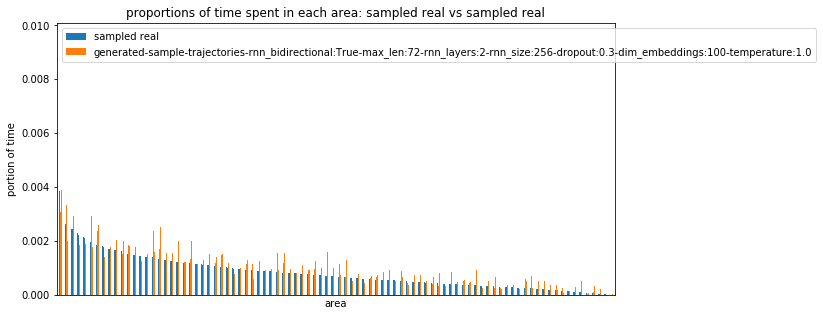

In [343]:
generated_trajectories_name = None
area_to_time_spent_dict_real_all = get_area_to_time_spent_comparison_dict(real_trajectories)
area_to_time_spent_dict_real_sample = get_area_to_time_spent_comparison_dict(real_trajectories_sample)

# Keep the best to plot
best_corr_generated_trajectories_name = None
best_area_to_time_spent_correlation_sample = 0
best_area_to_time_spent_comparison_df_sample = None

for column_name in models_matrix_df.columns:
    generated_trajectories_name = models_matrix_df.loc[generated_trajectories_name_idx][column_name]
    generated_trajectories = generated_sample_trajectories_map[generated_trajectories_name]
    area_to_time_spent_dict_generated = get_area_to_time_spent_comparison_dict(generated_trajectories)

    # Calculate correlation between generated synthetic data and full (all) real trajectories
    area_to_time_spent_comparison_df_all = get_area_to_time_spent_comparison_df(area_to_time_spent_dict_real_all,
                                                                            area_to_time_spent_dict_generated,
                                                                           d1_name='all real', d2_name=generated_trajectories_name)
    area_to_time_spent_correlation_all = area_to_time_spent_comparison_df_all['all real'].corr(area_to_time_spent_comparison_df_all[generated_trajectories_name])
    models_matrix_df.loc[area_to_dwell_time_correlation_all, column_name] = area_to_time_spent_correlation_all
    
    # Calculate correlation between generated synthetic data and sampled real trajectories
    area_to_time_spent_comparison_df_sample = get_area_to_time_spent_comparison_df(area_to_time_spent_dict_real_sample,
                                                                            area_to_time_spent_dict_generated,
                                                                           d1_name='sampled real', d2_name=generated_trajectories_name)
    area_to_time_spent_correlation_sample = area_to_time_spent_comparison_df_sample['sampled real'].corr(area_to_time_spent_comparison_df_sample[generated_trajectories_name])
    models_matrix_df.loc[area_to_dwell_time_correlation_sample, column_name] = area_to_time_spent_correlation_sample
    # Keep around the best
    if area_to_time_spent_correlation_sample > best_area_to_time_spent_correlation_sample:
        best_area_to_time_spent_correlation_sample = area_to_time_spent_correlation_sample
        best_corr_generated_trajectories_name = generated_trajectories_name
        best_area_to_time_spent_comparison_df_sample = area_to_time_spent_comparison_df_sample
    
# plot the best one
print('Best correlation for area to dwell time between the generated and real samples was for %s' % best_corr_generated_trajectories_name)
print(best_area_to_time_spent_correlation_sample)
plot_time_spent_comparison(best_area_to_time_spent_comparison_df_sample,
                        name1='sampled real',  name2=best_corr_generated_trajectories_name)

In [344]:
models_matrix_df

,Z-bidirectional,Z-bidirectional.1,Z-bidirectional.2,Z-bidirectional.3,V-bidirectional.1,V-bidirectional.2,V-bidirectional,Q-bidirectional.1,Q-bidirectional.3,Q-bidirectional.2,...,O.2,E,A-bidirectional.2,O,B.1,B,B.2,default-bidirectional.1,default-bidirectional,default-bidirectional.2
rnn_bidirectional,True,True,True,True,True,True,True,True,True,True,...,False,False,True,False,False,False,False,True,True,True
max_length,72,72,72,72,70,70,70,60,60,60,...,48,48,24,48,24,24,24,24,24,24
rnn_layers,2,2,2,2,3,3,3,3,3,3,...,3,2,3,3,2,2,2,2,2,2
rnn_size,256,256,256,256,128,128,128,128,128,128,...,128,128,128,128,256,256,256,128,128,128
dropout,0.3,0.3,0.3,0.3,0.1,0.1,0.1,0.1,0.1,0.1,...,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1
dim_embeddings,100,100,100,100,128,128,128,128,128,128,...,50,50,50,50,50,50,50,50,50,50
temperature,0.8,0.9,1,1.1,0.9,1,0.8,0.9,1.1,1,...,1,0.8,1,0.8,0.9,0.8,1,0.9,0.8,1
batch size,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,...,512,512,512,512,512,512,512,512,512,512
generated_trajectories_name,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...
distinct unseen bigrams,394,878,1920,4255,679,1763,315,896,4389,1802,...,3923,236,1645,479,1254,307,3779,702,187,2340


### Measure how closely the distribution of the number of distinct places visited by each synthetic user resembles distribution from real data

Some users only go 2 or 3 distinct places during their week... while others visit 10-30 different places...

We use the Pearson's chi-squared test for homogeneity to compare the distribution of the number of distinct places visited between the generated synthetic data and the real data.

For each trajectory vector in the synthetic and real data, we take the number of distinct places visited as a category.  We compute the frequency of this category (number of distinct places visited) occuring in each of the synthetic and real datasets.

We then test the null hypothesis that:

The proportion of generated synthetic trajectory vectors with P distinct places visited is the same as the proportion of real trajectory vectors with P distinct places visited, for each P occuring in either of the generated or real datasets.

We test the null hypothesis with a significance level of 0.05.




In [345]:
def get_distinct_places_distribution(vectors):
    """
    Get the distribution of number of distinct places visited by each user.
    
    Returns a list of length matching number of user data vectors, 
    where each element corresponds to the number of distinct places visited by that user.
    """
    distinct_places_counts_per_user = []
    for vector in vectors:
        # get the number of distinct places visited by that user
        distinct_places = set()
        for area in vector:
            if area not in distinct_places:
                distinct_places.add(area)
        # append the number of distinct places visited by that user
        distinct_places_counts_per_user.append(len(distinct_places))
    return distinct_places_counts_per_user


- make vector of distinct places per user, where each value in vector is for a distinct user and represents number of distinct places they visited
- determine buckets/categories, and make mapping for buckets
    - this is to handle the long tail for the distributions (test less for data with counts < 5)
    - buckets must span all values in min to max (M) range, where the last buckets covers all values greater than M
- map values for distinc places to new 'categories' (where category is bucket of distinct places)
- transform vectors where the values are categories into mapping of {'category' --> frequency of occurance}
    - make sure all buckets in map, i.e. fill with zeros if necessary

- make mapping for real trajectories observations, values of map are the observations for each category
- from that real data, make expected observations with counts matching sample size of 2000
    - i.e. scale each value by 2000/N
    - i.e. each value for expected observations = frequency * 2000/N

Compare generated sample data to the expected values!
- first do a sanity test: sample 2000 trajectories from real trajectories
- run chi-squared test for each generated sample



In [346]:
generated_data_sample_size = 2000
real_data_population_size = len(real_trajectories)
observed_to_expected_multiplier = generated_data_sample_size/real_data_population_size
print('real population size: %s, generated data sample size: %s, (sample size)/(population size)=(%s)' % (real_data_population_size, generated_data_sample_size, observed_to_expected_multiplier))

real population size: 22704, generated data sample size: 2000, (sample size)/(population size)=(0.08809020436927413)


In [347]:
generated_trajectories_name = 'generated-sample-synthetic_trajectories-temperature:0.9'
generated_trajectories = generated_sample_trajectories_map[generated_trajectories_name]

distinct_places_counts_per_user_real = get_distinct_places_distribution(real_trajectories)
distinct_places_counts_per_user_generated = get_distinct_places_distribution(generated_trajectories)

print(min(distinct_places_counts_per_user_real))
print(max(distinct_places_counts_per_user_real))

1
43


In [348]:
# Make mapping of distinct places count to frequency
def get_distinct_places_category_to_frequency_map(dp_list):
    mapping = {c:0 for c in range(0, max(dp_list)+1)}
    for d in dp_list:
        mapping[d] += 1
    return mapping


In [349]:
distinct_places_category_to_frequency_map_real = get_distinct_places_category_to_frequency_map(distinct_places_counts_per_user_real)
# distinct_places_category_to_frequency_map_real

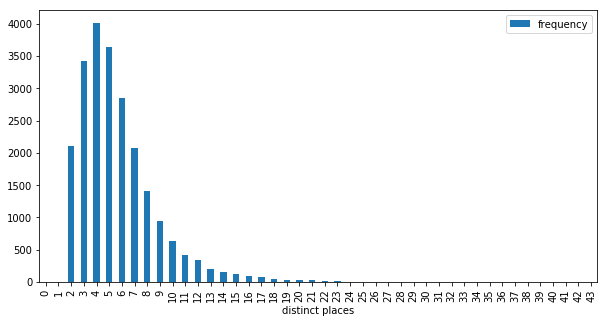

In [350]:
def plot_distinct_places_category_to_frequency(observed_values_map, expected_values_map=None,
                                               name1='frequency', name2='expected frequency'):
    df = pd.DataFrame.from_dict({
        'distinct places': list(observed_values_map.keys()),
        name1: list(observed_values_map.values())
    }).set_index('distinct places')
    if expected_values_map:
        df2 = pd.DataFrame.from_dict({
            'distinct places': list(expected_values_map.keys()),
            name2: list(expected_values_map.values())
        }).set_index('distinct places')
        df[name2] = df2[name2]
    df.plot(kind='bar')

plot_distinct_places_category_to_frequency(distinct_places_category_to_frequency_map_real)

Handle binning the data

In [351]:
# Get quantile bins based on the distribution of distinct places in thee full real population
# Bins chosen based on how dividing data can get close as possible to equal bins, 
#  but because of data distribution (e.g. so many points with 4 distinct places), exactly equal bins impossible
# At the same time, bin the real data into these buckets -- this is the output binned series
# Each element in the binned series indicates the bin it belongs in, indicating that bin by the index of bin
# Then reuse these bins to bin the generated data
quantiles = 6 # 15 # Turns into 10 with drop duplicates (command to drop duplicate edges -- error on quantiles=10 otherwise)
# First print nicely with the labeled bins
real_reference_binned_series, bins = pd.qcut(distinct_places_counts_per_user_real, quantiles, retbins=True, duplicates='drop')
print('Binning:')
print(real_reference_binned_series)
# Then get the unlabeled bins and series that we need
real_reference_binned_series, bins = pd.qcut(distinct_places_counts_per_user_real, quantiles, retbins=True, labels=False, duplicates='drop')

# Note: the max bin value is increased to accommodated generated data long tails
print(len(bins), 'bins:', bins)

Binning:
[(6.0, 8.0], (3.0, 4.0], (8.0, 43.0], (4.0, 5.0], (4.0, 5.0], ..., (3.0, 4.0], (4.0, 5.0], (0.999, 3.0], (5.0, 6.0], (0.999, 3.0]]
Length: 22704
Categories (6, interval[float64]): [(0.999, 3.0] < (3.0, 4.0] < (4.0, 5.0] < (5.0, 6.0] < (6.0, 8.0] < (8.0, 43.0]]
7 bins: [ 1.  3.  4.  5.  6.  8. 43.]


In [352]:
def get_binned_series_to_binned_map(binned_series, bins):
    """
    Transforms the binned series into a mapping of {bin name -> frequency count}
    """
    bin_index_to_name_map = {i:'(%s, %s]' % (bins[i], bins[i+1]) for i in range(1, len(bins)-1)}
    bin_index_to_name_map[0] = '<= %s' % bins[1]

    bin_index_to_name_map[len(bins)-2] = '> %s' % bins[len(bins)-2]
    bin_index_to_name_map
    # First make mapping of {bin index -> frequency}
    binned_map = {i:0 for i in range(len(bins)-1)}
    for item in binned_series:
        binned_map[item] += 1
    # rename bins based on their span
    binned_map = {bin_index_to_name_map[k]:v for k,v in binned_map.items()}
    return binned_map

{'<= 3.0': 5521,
 '(3.0, 4.0]': 4006,
 '(4.0, 5.0]': 3639,
 '(5.0, 6.0]': 2853,
 '(6.0, 8.0]': 3487,
 '> 8.0': 3198}

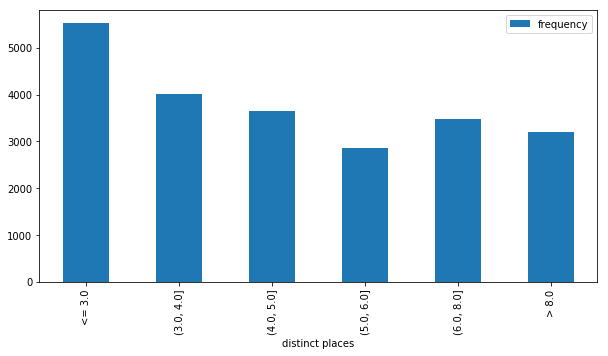

In [353]:
real_reference_binned_map = get_binned_series_to_binned_map(real_reference_binned_series, bins)
plot_distinct_places_category_to_frequency(real_reference_binned_map)
real_reference_binned_map

{'<= 3.0': 486.34601832276246,
 '(3.0, 4.0]': 352.88935870331215,
 '(4.0, 5.0]': 320.5602536997886,
 '(5.0, 6.0]': 251.32135306553909,
 '(6.0, 8.0]': 307.1705426356589,
 '> 8.0': 281.7124735729387}

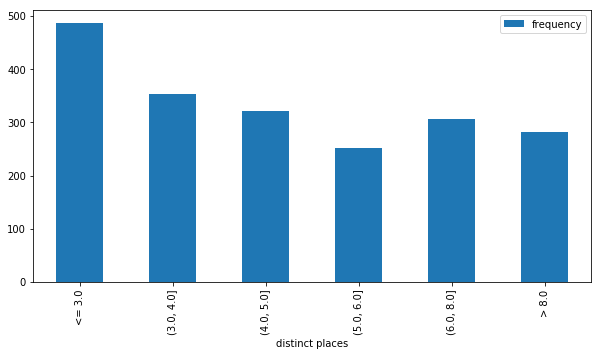

In [354]:
# Make expected frequencies mapping for the sample size (values scaled and rounded to integer values)
expected_category_to_frequency_map = {c: f*observed_to_expected_multiplier for c, f in real_reference_binned_map.items()}
plot_distinct_places_category_to_frequency(expected_category_to_frequency_map)
expected_category_to_frequency_map

{'<= 3.0': 493,
 '(3.0, 4.0]': 340,
 '(4.0, 5.0]': 324,
 '(5.0, 6.0]': 268,
 '(6.0, 8.0]': 302,
 '> 8.0': 273}

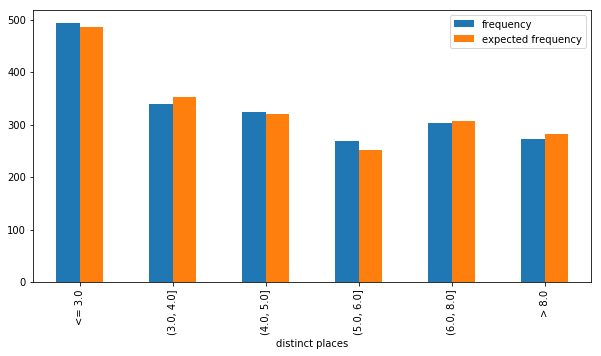

In [356]:
# sanity check: now do chi-squared test for real sample observations vs expected observations
# Bin the sample data with chosen bins
distinct_places_counts_per_user_real_sample = get_distinct_places_distribution(real_trajectories_sample)
real_sample_binned_series = pd.cut(distinct_places_counts_per_user_real_sample, bins=bins, labels=False, include_lowest=True)
real_sample_binned_map = get_binned_series_to_binned_map(real_sample_binned_series, bins)
plot_distinct_places_category_to_frequency(real_sample_binned_map, expected_category_to_frequency_map)
real_sample_binned_map

In [357]:
from scipy.stats import chisquare
chisq, p = chisquare(list(real_sample_binned_map.values()),
               f_exp=list(expected_category_to_frequency_map.values()))

print('The chi-squared test statistic: %s\np-value: %s' % (chisq, p))

The chi-squared test statistic: 2.0620762451973573
p-value: 0.8404906622555846


Add chi-squared test p-value as a row in the model comparison matrix

In [358]:
# Add dummy row
chi_squared_p_value = 'chi-squared homogeneity test p-value'
models_matrix_df = add_dummy_row(models_matrix_df, chi_squared_p_value)
models_matrix_df

,Z-bidirectional,Z-bidirectional.1,Z-bidirectional.2,Z-bidirectional.3,V-bidirectional.1,V-bidirectional.2,V-bidirectional,Q-bidirectional.1,Q-bidirectional.3,Q-bidirectional.2,...,O.2,E,A-bidirectional.2,O,B.1,B,B.2,default-bidirectional.1,default-bidirectional,default-bidirectional.2
rnn_bidirectional,True,True,True,True,True,True,True,True,True,True,...,False,False,True,False,False,False,False,True,True,True
max_length,72,72,72,72,70,70,70,60,60,60,...,48,48,24,48,24,24,24,24,24,24
rnn_layers,2,2,2,2,3,3,3,3,3,3,...,3,2,3,3,2,2,2,2,2,2
rnn_size,256,256,256,256,128,128,128,128,128,128,...,128,128,128,128,256,256,256,128,128,128
dropout,0.3,0.3,0.3,0.3,0.1,0.1,0.1,0.1,0.1,0.1,...,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1
dim_embeddings,100,100,100,100,128,128,128,128,128,128,...,50,50,50,50,50,50,50,50,50,50
temperature,0.8,0.9,1,1.1,0.9,1,0.8,0.9,1.1,1,...,1,0.8,1,0.8,0.9,0.8,1,0.9,0.8,1
batch size,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,...,512,512,512,512,512,512,512,512,512,512
generated_trajectories_name,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...
distinct unseen bigrams,394,878,1920,4255,679,1763,315,896,4389,1802,...,3923,236,1645,479,1254,307,3779,702,187,2340


In [360]:
# Keep best result handy to inspect
best_p = None
best_chi_generated_trajectories_name = None

for column_name in models_matrix_df.columns:
    generated_trajectories_name = models_matrix_df.loc[generated_trajectories_name_idx][column_name]
    generated_trajectories = generated_sample_trajectories_map[generated_trajectories_name]
    distinct_places_counts_per_user = get_distinct_places_distribution(generated_trajectories)
    # Might need to increase the maximum bin value to include new max
    max_distinct_places_per_user = max(distinct_places_counts_per_user)
    if max_distinct_places_per_user > bins[-1]:
        bins[-1] = max_distinct_places_per_user
    generated_sample_binned_series = pd.cut(distinct_places_counts_per_user, bins=bins, labels=False, include_lowest=True)
    generated_sample_binned_map = get_binned_series_to_binned_map(generated_sample_binned_series, bins)
    
    chisq, p = chisquare(list(generated_sample_binned_map.values()),
               f_exp=list(expected_category_to_frequency_map.values()))
#     print('column: %s\nchisquared value: %s\np-value: %s' % (column_name, chisq, p))
#     plot_distinct_places_category_to_frequency(generated_sample_binned_map, expected_category_to_frequency_map)
    models_matrix_df.loc[chi_squared_p_value, column_name] = p
    if (not best_p) or p > (best_p):
        best_p = p
        best_chi_generated_trajectories_name = generated_trajectories_name
        

with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(models_matrix_df)

,Z-bidirectional,Z-bidirectional.1,Z-bidirectional.2,Z-bidirectional.3,V-bidirectional.1,V-bidirectional.2,V-bidirectional,Q-bidirectional.1,Q-bidirectional.3,Q-bidirectional.2,Q-bidirectional,V-bidirectional.3,X-bidirectional.3,X-bidirectional.1,X-bidirectional.2,X-bidirectional,P-bidirectional.2,P-bidirectional.3,T-bidirectional.1,P-bidirectional.1,generated-sample-synthetic_trajectories-temperature:1.0,Y-bidirectional.2,Y-bidirectional,Y-bidirectional.1,Y-bidirectional.3,T-bidirectional.2,P-bidirectional,T-bidirectional,generated-sample-synthetic_trajectories-temperature:0.8,generated-sample-synthetic_trajectories-temperature:0.9,P.1,O-bidirectional,P.2,O-bidirectional.1,O-bidirectional.2,S-bidirectional.1,W-bidirectional.3,S-bidirectional.2,W-bidirectional.2,P,S-bidirectional,W-bidirectional.1,R-bidirectional.1,R-bidirectional.2,R-bidirectional,C.1,C,W-bidirectional,C.2,E.2,E.1,default,default.1,A-bidirectional,A-bidirectional.1,default.2,O.1,O.2,E,A-bidirectional.2,O,B.1,B,B.2,default-bidirectional.1,default-bidirectional,default-bidirectional.2
rnn_bidirectional,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,[nan],True,True,True,True,True,True,True,[nan],[nan],False,True,False,True,True,True,True,True,True,False,True,True,True,True,True,False,False,True,False,False,False,False,False,True,True,False,False,False,False,True,False,False,False,False,True,True,True
max_length,72,72,72,72,70,70,70,60,60,60,60,70,60,60,60,60,50,50,50,50,[nan],60,60,60,60,50,50,50,[nan],[nan],50,48,50,48,48,50,84,50,84,50,50,84,50,50,50,24,24,84,24,48,48,24,24,24,24,24,48,48,48,24,48,24,24,24,24,24,24
rnn_layers,2,2,2,2,3,3,3,3,3,3,3,3,3,3,3,3,3,3,2,3,[nan],3,3,3,3,2,3,2,[nan],[nan],3,3,3,3,3,2,3,2,3,3,2,3,3,3,3,2,2,3,2,2,2,2,2,3,3,2,3,3,2,3,3,2,2,2,2,2,2
rnn_size,256,256,256,256,128,128,128,128,128,128,128,128,128,128,128,128,128,128,256,128,[nan],256,256,256,256,256,128,256,[nan],[nan],128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,256,256,256,128,128,128
dropout,0.3,0.3,0.3,0.3,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.2,0.2,0.2,0.2,0.2,0.2,0.3,0.2,[nan],0.3,0.3,0.3,0.3,0.3,0.2,0.3,[nan],[nan],0.2,0.1,0.2,0.1,0.1,0.1,0.1,0.1,0.1,0.2,0.1,0.1,0.1,0.1,0.1,0.2,0.2,0.1,0.2,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1
dim_embeddings,100,100,100,100,128,128,128,128,128,128,128,128,128,128,128,128,128,128,100,128,[nan],100,100,100,100,100,128,100,[nan],[nan],128,50,128,50,50,128,128,128,128,128,128,128,64,64,64,50,50,128,50,50,50,50,50,50,50,50,50,50,50,50,50,50,50,50,50,50,50
temperature,0.8,0.9,1,1.1,0.9,1,0.8,0.9,1.1,1,0.8,1.1,1.1,0.9,1,0.8,1,1.1,0.9,0.9,[nan],0.8,0.8,0.8,0.8,1,0.8,0.8,[nan],[nan],0.9,0.8,1,0.9,1,0.9,1.1,1,1,0.8,0.8,0.9,0.9,1,0.8,0.9,0.8,0.8,1,1,0.9,0.8,0.9,0.8,0.9,1,0.9,1,0.8,1,0.8,0.9,0.8,1,0.9,0.8,1
batch size,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,[nan],1024,1024,1024,1024,1024,1024,1024,[nan],[nan],1024,512,1024,512,512,1024,1024,1024,1024,1024,1024,1024,1024,1024,1024,512,512,1024,512,512,512,512,512,512,512,512,512,512,512,512,512,512,512,512,512,512,512
generated_trajectories_name,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,g

Plot two graphs showing the distributions of the number of distinct places visited by each user, one for the real dataset and another for the synthetic dataset.

best generated trajectories: generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:1.0
best p-value: 0.42875441676663806


{'<= 3.0': 470,
 '(3.0, 4.0]': 342,
 '(4.0, 5.0]': 313,
 '(5.0, 6.0]': 243,
 '(6.0, 8.0]': 322,
 '> 8.0': 310}

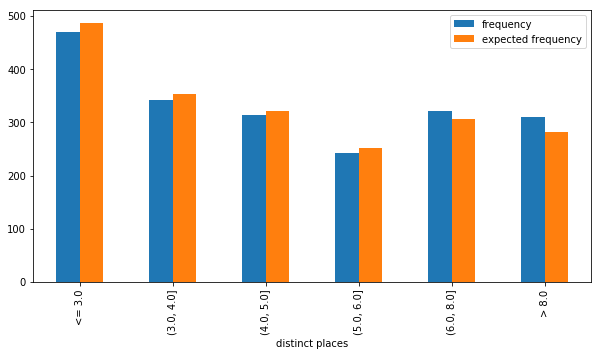

In [362]:
print('best generated trajectories:', best_chi_generated_trajectories_name)
print('best p-value:', best_p)

generated_trajectories = generated_sample_trajectories_map[best_chi_generated_trajectories_name]
distinct_places_counts_per_user = get_distinct_places_distribution(generated_trajectories)
generated_sample_binned_series = pd.cut(distinct_places_counts_per_user, bins=bins, labels=False, include_lowest=True)
generated_sample_binned_map = get_binned_series_to_binned_map(generated_sample_binned_series, bins)

plot_distinct_places_category_to_frequency(generated_sample_binned_map, expected_category_to_frequency_map)
generated_sample_binned_map

## Evaluate how much privacy was retained vs lost

To evaluate privacy retained, we look at multiple metrics.


### Privacy Evaluation 1

#### Evaluate whethere uniqueness of distinct places visited is retained


We compress dwell vectors down to sets of places visited.
e.g. the vector [1,1,2,1,5,0] is represented as {0,1,2,5}

We then find within the full real population the sets of places visited that are unique, meaning that they are only found in one trajectory vector. 
- How many are there? 
- Are any of these sets found in the generated data? How many?


In [66]:
def vector_to_distinct_places_set(vector):
    """
    Returns the set of distinct places visited in a vector.
    e.g. the vector [1,1,2,1,5,0] is represented as {0,1,2,5}
    """
    return set(vector)

In [67]:
def places_set_to_str(places_set):
    """
    In order to throw these places sets into a dict as keys, need to represent them as hashable type.
    Returns string representing places set.
    {1,2,3} -> '1 2 3'
    """
    return ' '.join([str(i) for i in sorted(list(places_set))])

assert('20 30 40' == places_set_to_str({30, 20, 40}))
assert('1 2' == places_set_to_str({2, 1}))

def vector_to_distinct_places_set_str(vector):
    return places_set_to_str(vector_to_distinct_places_set(vector))

assert(vector_to_distinct_places_set_str([2,1]*5) == '1 2')
assert(vector_to_distinct_places_set_str([20, 222, 222, 1]*5) == '1 20 222')

In [68]:
# Get the unique sets from the real full population
unprefixed_real_trajectories = get_unprefixed_vectors(real_trajectories)


In [69]:
# For a given list of trajectories, create a mapping from
# { set of distinct places --> count of trajectories with that distinct places set}

places_set_to_count_map = dict()

for v in unprefixed_real_trajectories:
    places_set_str = vector_to_distinct_places_set_str(v)
    if places_set_str not in places_set_to_count_map:
        places_set_to_count_map[places_set_str] = 0
    places_set_to_count_map[places_set_str] += 1
    
# plt.hist(places_set_to_count_map.values())
real_places_set_to_count_series = pd.Series(list(places_set_to_count_map.values()))
print(real_places_set_to_count_series.describe())

places_set_to_count_map

count    20278.000000
mean         1.119637
std          1.007438
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         62.000000
dtype: float64


{'0 1 2 3 4 5 6': 1,
 '0 7 8 9': 1,
 '0 10 11 12 13 14 15 16 17 18': 1,
 '0 19 20 21 22': 1,
 '0 23 24 25 26': 1,
 '0 20 21 27 28': 1,
 '0 29 30 31 32 33 34 35 36': 1,
 '0 37 38 39': 1,
 '0 20 40 41 42': 1,
 '0 43 44': 1,
 '0 45 46 47 48': 1,
 '0 20 22 49 50 51 52 53 54 55 56 57 58 59': 1,
 '0 60 61 62': 1,
 '0 31 63 64 65 66 67 68 69': 1,
 '0 21 70 71 72': 1,
 '0 8 15 21 52 73 74': 1,
 '0 75 76 77': 1,
 '0 3 13 20 31 34 35 53 78 79 80 81 82 83 84 85 86': 1,
 '0 87 88 89 90 91 92': 1,
 '0 4 93 94 95': 1,
 '0 14 21 42 76 96 97 98 99 100 101': 1,
 '0 102 103 104 105 106 107': 1,
 '0 44 108 109': 1,
 '0 110': 3,
 '0 68 111 112 113 114 115': 1,
 '0 20 116': 2,
 '0 55 117 118 119 120 121 122 123': 1,
 '0 24 124 125': 2,
 '0 24 124 126 127': 1,
 '0 22 128 129 130': 1,
 '0 84 92': 1,
 '0 21 131 132 133 134': 1,
 '0 39 135 136 137 138 139': 1,
 '0 140 141 142': 1,
 '0 112 143 144': 1,
 '0 113 145': 1,
 '0 20 87 146': 1,
 '0 104 147 148 149 150': 1,
 '0 14 68 130 151 152': 1,
 '0 14 112 153 154

Count the number of times the generated data creates a distinct places set that matches a uniquely occuring distinct places set in the real data.

In [70]:
unique_distinct_places_sets = {places_set for places_set, count in places_set_to_count_map.items() if count == 1}
print('number of unique distinct places sets in real data: %s' % len(unique_distinct_places_sets))

def get_reproduced_distinct_places_sets_to_count_map(vectors, unique_distinct_places_sets=unique_distinct_places_sets):
    """
    Returns a mapping of the distinct places sets that were unique in the reference (real) dataset
    to the number of times they were reproduced in the vectors.
    e.g. returns {'unique places': count for times reproduced in vectors}
    """
    unprefixed_vectors = get_unprefixed_vectors(vectors)
    distinct_places_set_list = [vector_to_distinct_places_set_str(v) for v in unprefixed_vectors]
    reproduced_unique_distinct_places_sets_to_count = dict()
    for places_set in distinct_places_set_list:
        if places_set in unique_distinct_places_sets:
            # found one! count it!
            if places_set not in reproduced_unique_distinct_places_sets_to_count:
                reproduced_unique_distinct_places_sets_to_count[places_set] = 0
            reproduced_unique_distinct_places_sets_to_count[places_set] += 1
    return reproduced_unique_distinct_places_sets_to_count

# Make sure this works as expected by using real trajectories sample
# Expect some reproduced places sets, but no more than 1 for each of course!
real_sample_reproduced_distinct_places_sets_to_count_map = get_reproduced_distinct_places_sets_to_count_map(real_trajectories_sample,
                                                                                                            unique_distinct_places_sets)
assert(len(real_sample_reproduced_distinct_places_sets_to_count_map) > 1)
assert(min(real_sample_reproduced_distinct_places_sets_to_count_map.values()) == 1)
assert(max(real_sample_reproduced_distinct_places_sets_to_count_map.values()) == 1)
assert(sum(real_sample_reproduced_distinct_places_sets_to_count_map.values()) == len(real_sample_reproduced_distinct_places_sets_to_count_map))

number of unique distinct places sets in real data: 19378


In [71]:
# Add dummy row
unique_distinct_places_set_reproduced_count = '# times unique distinct places set reproduced'
models_matrix_df = add_dummy_row(models_matrix_df, unique_distinct_places_set_reproduced_count)
models_matrix_df

,Q-bidirectional.2,Q-bidirectional.1,P-bidirectional.3,P-bidirectional.2,generated-sample-synthetic_trajectories-temperature:0.9,Q-bidirectional.3,generated-sample-synthetic_trajectories-temperature:1.0,Q-bidirectional,P-bidirectional.1,V-bidirectional.2,...,A-bidirectional.1,W-bidirectional.2,B.1,A-bidirectional,W-bidirectional.1,B,W-bidirectional,default-bidirectional.2,default-bidirectional.1,default-bidirectional
rnn_bidirectional,True,True,True,True,[nan],True,[nan],True,True,True,...,True,True,False,True,True,False,True,True,True,True
max_length,60,60,50,50,[nan],60,[nan],60,50,70,...,24,84,24,24,84,24,84,24,24,24
rnn_layers,3,3,3,3,[nan],3,[nan],3,3,3,...,3,3,2,3,3,2,3,2,2,2
rnn_size,128,128,128,128,[nan],128,[nan],128,128,128,...,128,128,256,128,128,256,128,128,128,128
dropout,0.1,0.1,0.2,0.2,[nan],0.1,[nan],0.1,0.2,0.1,...,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1
dim_embeddings,128,128,128,128,[nan],128,[nan],128,128,128,...,50,128,50,50,128,50,128,50,50,50
temperature,1,0.9,1.1,1,[nan],1.1,[nan],0.8,0.9,1,...,0.9,1,0.9,0.8,0.9,0.8,0.8,1,0.9,0.8
batch size,1024,1024,1024,1024,[nan],1024,[nan],1024,1024,1024,...,512,1024,512,512,1024,512,1024,512,512,512
generated_trajectories_name,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-synthetic_trajectories-temper...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-synthetic_trajectories-temper...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...
distinct unseen bigrams,1802,896,3700,1713,742,4389,1738,450,763,1763,...,616,1893,1254,247,704,307,174,2340,702,187


In [72]:
# Fill the row for each generated data  set

# Keep best & worst results handy to inspect
min_reproduced = None
max_reproduced = None
min_reproduced_generated_trajectories_name = None
max_reproduced_generated_trajectories_name = None

for column_name in models_matrix_df.columns:
    
    generated_trajectories_name = models_matrix_df.loc[generated_trajectories_name_idx][column_name]
    generated_trajectories = generated_sample_trajectories_map[generated_trajectories_name]
    reproduced_distinct_places_sets_to_count_map = get_reproduced_distinct_places_sets_to_count_map(generated_trajectories,
                                                                                                    unique_distinct_places_sets)
    total_reproduced_count = sum(reproduced_distinct_places_sets_to_count_map.values())
    models_matrix_df.loc[unique_distinct_places_set_reproduced_count, column_name] = total_reproduced_count
    # store best & worst for inspection
    if (not min_reproduced) or (total_reproduced_count < min_reproduced):
        min_reproduced = total_reproduced_count
        min_reproduced_generated_trajectories_name  = generated_trajectories_name
    if (not max_reproduced) or (total_reproduced_count > max_reproduced):
        max_reproduced = total_reproduced_count
        max_reproduced_generated_trajectories_name  = generated_trajectories_name

print('min reproduced: %s, by: %s' % (min_reproduced, min_reproduced_generated_trajectories_name))
print('max reproduced: %s, by: %s' % (max_reproduced, max_reproduced_generated_trajectories_name))

with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(models_matrix_df)

min reproduced: 20, by: generated-sample-trajectories-rnn_bidirectional:True-max_len:84-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:1.1
max reproduced: 239, by: generated-sample-trajectories-rnn_bidirectional:True-max_len:50-rnn_layers:2-rnn_size:256-dropout:0.3-dim_embeddings:100-temperature:0.8


,Q-bidirectional.2,Q-bidirectional.1,P-bidirectional.3,P-bidirectional.2,generated-sample-synthetic_trajectories-temperature:0.9,Q-bidirectional.3,generated-sample-synthetic_trajectories-temperature:1.0,Q-bidirectional,P-bidirectional.1,V-bidirectional.2,V-bidirectional.3,V-bidirectional.1,generated-sample-synthetic_trajectories-temperature:0.8,X-bidirectional.1,X-bidirectional.2,P-bidirectional,V-bidirectional,X-bidirectional.3,X-bidirectional,C.1,E.2,P.2,default.2,O-bidirectional,E.1,O-bidirectional.1,C.2,O.2,T-bidirectional.1,O-bidirectional.2,O.1,P.1,P,default.1,S-bidirectional.2,T-bidirectional.2,T-bidirectional,S-bidirectional,E,C,S-bidirectional.1,default,O,B.2,W-bidirectional.3,R-bidirectional.1,R-bidirectional.2,A-bidirectional.2,R-bidirectional,A-bidirectional.1,W-bidirectional.2,B.1,A-bidirectional,W-bidirectional.1,B,W-bidirectional,default-bidirectional.2,default-bidirectional.1,default-bidirectional
rnn_bidirectional,True,True,True,True,[nan],True,[nan],True,True,True,True,True,[nan],True,True,True,True,True,True,False,False,False,False,True,False,True,False,False,True,True,False,False,False,False,True,True,True,True,False,False,True,False,False,False,True,True,True,True,True,True,True,False,True,True,False,True,True,True,True
max_length,60,60,50,50,[nan],60,[nan],60,50,70,70,70,[nan],60,60,50,70,60,60,24,48,50,24,48,48,48,24,48,50,48,48,50,50,24,50,50,50,50,48,24,50,24,48,24,84,50,50,24,50,24,84,24,24,84,24,84,24,24,24
rnn_layers,3,3,3,3,[nan],3,[nan],3,3,3,3,3,[nan],3,3,3,3,3,3,2,2,3,2,3,2,3,2,3,2,3,3,3,3,2,2,2,2,2,2,2,2,2,3,2,3,3,3,3,3,3,3,2,3,3,2,3,2,2,2
rnn_size,128,128,128,128,[nan],128,[nan],128,128,128,128,128,[nan],128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,256,128,128,128,128,128,128,256,256,128,128,128,128,128,128,256,128,128,128,128,128,128,128,256,128,128,256,128,128,128,128
dropout,0.1,0.1,0.2,0.2,[nan],0.1,[nan],0.1,0.2,0.1,0.1,0.1,[nan],0.2,0.2,0.2,0.1,0.2,0.2,0.2,0.1,0.2,0.1,0.1,0.1,0.1,0.2,0.1,0.3,0.1,0.1,0.2,0.2,0.1,0.1,0.3,0.3,0.1,0.1,0.2,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1
dim_embeddings,128,128,128,128,[nan],128,[nan],128,128,128,128,128,[nan],128,128,128,128,128,128,50,50,128,50,50,50,50,50,50,100,50,50,128,128,50,128,100,100,128,50,50,128,50,50,50,128,64,64,50,64,50,128,50,50,128,50,128,50,50,50
temperature,1,0.9,1.1,1,[nan],1.1,[nan],0.8,0.9,1,1.1,0.9,[nan],0.9,1,0.8,0.8,1.1,0.8,0.9,1,1,1,0.8,0.9,0.9,1,1,0.9,1,0.9,0.9,0.8,0.9,1,1,0.8,0.8,0.8,0.8,0.9,0.8,0.8,1,1.1,0.9,1,1,0.8,0.9,1,0.9,0.8,0.9,0.8,0.8,1,0.9,0.8
batch size,1024,1024,1024,1024,[nan],1024,[nan],1024,1024,1024,1024,1024,[nan],1024,1024,1024,1024,1024,1024,512,512,1024,512,512,512,512,512,512,1024,512,512,1024,1024,512,1024,1024,1024,1024,512,512,1024,512,512,512,1024,1024,1024,512,1024,512,1024,512,512,1024,512,1024,512,512,512
generated_trajectories_name,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-synthetic_trajectories-temper...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-synthetic_trajectories-temper...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-synthetic_trajectories-temper...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bidirectiona...,generated-sample-trajectories-rnn_bid

TODO: Rewrite for privacy evaluation 2


Compare trajectories using edit distance as a  metric, where the edit distance is the Levenshtein between the two vectors represented as strings

Implementation of levenshtein distance:

In [86]:
def levenshtein_distance(s1, s2):
    """
    Returns (int) the levenshtein edit distance between two lists, where those lists can be arbitrary integers.
    """
    if len(s1) < len(s2):
        return levenshtein(s2, s1)
    # len(s1) >= len(s2)
    if len(s2) == 0:
        return len(s1)
    previous_row = range(len(s2) + 1)
    for i, c1 in enumerate(s1):
        current_row = [i + 1]
        for j, c2 in enumerate(s2):
            insertions = previous_row[j + 1] + 1 # j+1 instead of j since previous_row and current_row are one character longer
            deletions = current_row[j] + 1       # than s2
            substitutions = previous_row[j] + (c1 != c2)
            current_row.append(min(insertions, deletions, substitutions))
        previous_row = current_row
    return previous_row[-1]

In [87]:
# Quick demonstration that this distance metric works as desired
assert(levenshtein_distance([], []) == 0)
assert(levenshtein_distance([234, 1], [1]) == 1)

unprefixed_real_trajectories = get_unprefixed_vectors(real_trajectories)

# Take reference vector
v1 = unprefixed_real_trajectories[0]
# The edit distance from the vector to itself is 0
assert(levenshtein_distance(v1, v1) == 0)

# Substitute 1 item in the vector to create new vector -- expect levenshtein edit distance of 1
v2 = v1[:]
v2[0] = 1 if (not v1[0] is 1) else 100
assert(len(v1) == len(v2) and levenshtein_distance(v1, v2) == 1)


# Substitute 3 items in the vector to create new vector -- expect levenshtein edit distance of 3
v2 = v1[:]
v2[0] = 1 if (not v1[0] is 1) else 100
v2[1] = 1 if (not v1[0] is 1) else 100
v2[-1] = 1 if (not v1[0] is 1) else 100
assert(len(v1) == len(v2) and levenshtein_distance(v1, v2) ==3)

# Shift vector by 1 item to create new vector -- expect levenshtein edit distance of 2
v2 = v1[1:] + [v1[0]]
assert(len(v1) == len(v2) and levenshtein_distance(v1, v2) == 2)


In [88]:
def get_min_edit_distance(vector, comparison_vectors=unprefixed_real_trajectories):
    return min([levenshtein_distance(vector, comparison_vector) for comparison_vector in comparison_vectors])

def get_min_edit_distances(vectors, comparison_vectors=unprefixed_real_trajectories, truncate=None):
    """
    Returns a list of integers representing minimum edit distances from comparison vectors.
    There is one integer in the list corresponding to each vector in the passed in vectors,
    where this integer represents the minimum edit distance this vector is from any of the
    comparison vectors.
    The optional truncate (int) parameter can be used to compare vectors up to the given truncation length.
    """
    if truncate and truncate > 0:
        truncated_comparison_vectors =  [cv[:truncate] for cv in comparison_vectors]
        return [get_min_edit_distance(v[:truncate], truncated_comparison_vectors) for v in vectors]
    return [get_min_edit_distance(v, comparison_vectors) for v in vectors]

# Sanity check:
assert(sum(get_min_edit_distances(unprefixed_real_trajectories[:3], truncate=24)) == 0)

In [132]:
# For comparisons, truncate vectors to this many elements (hours)
TRUNCATE_LEN = None # When =24 it is easy to find min edit distances of 0 within the real sample data

In [ ]:
# Sanity check & time check:
truncate_len = TRUNCATE_LEN
test_vectors = [[random.randint(0, 652) for iter in range(120)] for i in range(22000)]
for i in [1, 10, 100, 1000]:
    print('time check for %s vectors against 22000 vectors truncated to %s hours:' % (i, truncate_len))
    d1 = datetime.datetime.now()
    assert(sum(get_min_edit_distances(test_vectors[:i], test_vectors, truncate=TRUNCATE_LEN)) == 0)
    print(datetime.datetime.now() - d1)


- get the allowed/non-unique (home, work) pairs
- read in the file of real full population trajectories

- get the names of trajectory samples
- for each list of trajectories in {S, {Gm}}
    - get file name to write the output min distances to
    - read in the trajectories
    - filter the trajectories to just those that start with an allowed (home, work) pair
    - create list of Md_i values for each tv_i in the filtered list of trajectories
    - if the filtered list is from the real sample, tv_i should skip comparison against itself
    - save the list to min distances file

    - each list should the same size






In [123]:
def get_generated_trajectories_filename(sample_name):
    return '../textgenrnn_generator/output/{}.txt'.format(sample_name)

def read_trajectories_from_file(filename):
    """
    Returns a list of lists, where each list represents a trajectory written to file.
    Expects file format where each line is one trajectory, and places in the trajectory are delimited by spaces.
    """
    trajectories = []
    with open(filename, 'r') as f:
        trajectories = [[int(x) for x in line.strip().split()] for line in f]
    return trajectories

def get_min_edit_distances_filename(sample_name):
    return '../textgenrnn_generator/output/min-edit-distances-to-real-pop-from-{}.txt'.format(sample_name)

def write_min_edit_distances_to_file(min_edit_distances_list, filename):
    with open(filename, 'w') as f:
        f.write(' '.join([str(i) for i in min_edit_distances_list]))


In [108]:
# For later...
def read_min_edit_distances_from_file(filename):
    min_edit_distances_list = []
    with open(filename, 'r') as f:
        min_edit_distances_list = [int(x) for x in f.read().strip().split()]
    return min_edit_distances_list

# Show this works as intended:
test_list = [1,2,321]
test_filename = get_min_edit_distances_filename('test-delete-me')
write_min_edit_distances_to_file(test_list, test_filename)
assert(read_min_edit_distances_from_file(test_filename) == test_list)


In [224]:
LIMIT_SAMPLE_SIZE = 200


def trajectory_has_allowed_prefix(prefixed_trajectory, allowed_prefixes_set):
    # The prefixed trajectory is a list of integers.
    # The items in the allowed prefixes set are strings representing the first 2 items of such a list
    return ' '.join([str(t) for t in prefixed_trajectory[:2]]) in allowed_prefixes_set

def filter_to_trajectories_with_prefixes(prefixed_trajectories_list, allowed_prefixes):
    return [t for t in prefixed_trajectories_list if trajectory_has_allowed_prefix(t, allowed_prefixes)]

# Quick test:
allowed_prefixes = {'1 20', '201', '1201', '1 2011', '1 2'}
allowed_t = [1, 20, 5]
not_allowed_t  = [1, 201, 5]
assert([allowed_t] == filter_to_trajectories_with_prefixes([allowed_t, not_allowed_t], allowed_prefixes))


def get_min_edit_distances_list(prefixed_sample_vectors, allowed_prefixes, comparison_vectors,
                                is_real_sample=False, limit_sample_size=LIMIT_SAMPLE_SIZE):
    # Filter the trajectory vectors to those with allowed prefixes
    filtered_prefixed_vectors = filter_to_trajectories_with_prefixes(prefixed_sample_vectors, allowed_prefixes)
    # limit the sample size to maximum value, and take their random sample with that limit
    random.shuffle(filtered_prefixed_vectors)
    filtered_prefixed_vectors = filtered_prefixed_vectors[:limit_sample_size]
    # get the unprefixed version of the vector
    filtered_unprefixed_sample_vectors = get_unprefixed_vectors(filtered_prefixed_vectors)
    comparison_vectors = get_unprefixed_vectors(comparison_vectors)
    if is_real_sample:
        # Each vector in the real sample occurs in the real full population but should not
        # be compared against itself.
        # Remove each vector from the comparison list, but only once (if duplicates occur, only one should be removed)
        comparison_vectors_less_real_sample = comparison_vectors[:] # Make a copy
        for v in filtered_unprefixed_sample_vectors:
            for _i, cv in enumerate(comparison_vectors):
                if v == cv:
                    # remove cv from the list less real sample; only do this once
                    comparison_vectors_less_real_sample.remove(v)
                    break
        assert(len(comparison_vectors_less_real_sample) == (len(real_trajectories) - len(filtered_unprefixed_sample_vectors)))
        comparison_vectors = comparison_vectors_less_real_sample

    return get_min_edit_distances(filtered_unprefixed_sample_vectors,
                                  comparison_vectors=comparison_vectors,
                                  truncate=TRUNCATE_LEN)


The functions have been defined!  Now read in the data and do the work

In [89]:
# Get the set of (home, work) pairs in the sample populations that are unique.
# They were generated by using a {'home work': count} mapping file.  We use this.
import json

trajectories_prefixes_to_counts_sample_2000_filename = './../data/relabeled_trajectories_1_workweek_prefixes_to_counts_sample_2000.json'
sample_prefixes_to_counts_dict = None

with open(trajectories_prefixes_to_counts_sample_2000_filename) as json_file:
    sample_prefixes_to_counts_dict = json.load(json_file)

sample_prefixes_to_counts_df = pd.DataFrame.from_dict({
        'prefix': [prefix for prefix in sample_prefixes_to_counts_dict.keys()],
        'count': [count for count in sample_prefixes_to_counts_dict.values()]
})
print('Distribution of prefix counts:\n')
print(sample_prefixes_to_counts_df['count'].describe())


# non_unique_prefix_set = {prefix for (prefix, count) in sample_prefixes_to_counts_dict.items() if count > 1}
non_unique_prefix_set = set(sample_prefixes_to_counts_df[sample_prefixes_to_counts_df['count'] > 1]['prefix'])
print('\nnumber of non-unique (home, work) pair prefixes in the 2000 vector sample: %s' % (len(non_unique_prefix_set)))

sample_prefixes_to_counts_df.sort_values('count', ascending=False).head()

Distribution of prefix counts:

count    1357.000000
mean        1.473839
std         1.137430
min         1.000000
25%         1.000000
50%         1.000000
75%         1.000000
max        15.000000
Name: count, dtype: float64

number of non-unique (home, work) pair prefixes in the 2000 vector sample: 307


,prefix,count
213,21 21,15
32,44 44,9
258,434 434,8
140,223 223,8
126,39 39,7


In [90]:
# How many vectors will that leave?
sample_prefixes_to_counts_df[sample_prefixes_to_counts_df['count'] > 1]['count'].sum()

950

In [91]:
non_unique_prefix_set

{'1 1',
 '102 102',
 '103 103',
 '104 104',
 '108 0',
 '108 108',
 '109 109',
 '111 111',
 '112 112',
 '114 114',
 '116 116',
 '118 118',
 '118 76',
 '120 120',
 '121 121',
 '121 404',
 '122 122',
 '124 124',
 '125 125',
 '126 126',
 '130 130',
 '131 131',
 '131 84',
 '133 133',
 '14 14',
 '140 140',
 '142 142',
 '143 143',
 '146 146',
 '147 147',
 '149 149',
 '15 15',
 '150 150',
 '151 151',
 '157 157',
 '163 163',
 '167 167',
 '168 0',
 '168 168',
 '171 171',
 '173 173',
 '174 174',
 '176 176',
 '177 177',
 '178 178',
 '180 180',
 '182 182',
 '184 184',
 '186 186',
 '189 189',
 '19 19',
 '190 190',
 '191 191',
 '195 195',
 '197 197',
 '198 0',
 '199 199',
 '2 2',
 '20 0',
 '20 20',
 '200 200',
 '201 201',
 '202 130',
 '202 202',
 '204 204',
 '205 205',
 '208 208',
 '209 209',
 '21 0',
 '21 21',
 '212 212',
 '214 214',
 '217 217',
 '219 219',
 '22 0',
 '22 22',
 '220 220',
 '222 222',
 '223 223',
 '224 224',
 '225 225',
 '226 226',
 '227 227',
 '23 23',
 '230 230',
 '231 231',
 '232 0

In [92]:
#  Read in the data...
real_trajectories = read_trajectories_from_file(relabeled_trajectories_filename)

real_trajectories_sample_2000_filename = '../data/relabeled_trajectories_1_workweek_sample_2000.txt'
real_trajectories_sample = read_trajectories_from_file(real_trajectories_sample_2000_filename)
assert(all([real_trajectories_sample[t] in real_trajectories for t in [1,2,3,-3,-2,-1]]))

In [380]:
# Get the names of the generated samples to get minimum edit distances for
# How about the N best ones sorted by home label match rate
N = 20
names = [n for n in models_matrix_df.sort_values(home_labels_match_portion, axis=1, ascending=False).loc[generated_trajectories_name_idx][:N]]

In [379]:
# Nicely format them...
import pprint

generated_sample_names = names
pprint.PrettyPrinter().pprint(generated_sample_names)

['generated-sample-trajectories-rnn_bidirectional:True-max_len:72-rnn_layers:2-rnn_size:256-dropout:0.3-dim_embeddings:100-temperature:0.8',
 'generated-sample-trajectories-rnn_bidirectional:True-max_len:72-rnn_layers:2-rnn_size:256-dropout:0.3-dim_embeddings:100-temperature:0.9',
 'generated-sample-trajectories-rnn_bidirectional:True-max_len:72-rnn_layers:2-rnn_size:256-dropout:0.3-dim_embeddings:100-temperature:1.0',
 'generated-sample-trajectories-rnn_bidirectional:True-max_len:72-rnn_layers:2-rnn_size:256-dropout:0.3-dim_embeddings:100-temperature:1.1',
 'generated-sample-trajectories-rnn_bidirectional:True-max_len:70-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:0.9',
 'generated-sample-trajectories-rnn_bidirectional:True-max_len:70-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:1.0',
 'generated-sample-trajectories-rnn_bidirectional:True-max_len:70-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:0.8',
 'generated-s

In [1175]:

# Get the set of sampled real trajectories and compute min distances, write to file
real_sample_trajectories_filename = '../data/relabeled_trajectories_1_workweek_sample_2000.txt'
real_trajectories_sample = read_trajectories_from_file(real_sample_trajectories_filename)
print('getting the min edit distances for %s' % 'real_sample_2000')
# Get the min edit distances lists and write them to file
real_sample_min_edit_distances_list = get_min_edit_distances_list(real_trajectories_sample,
                                                                  non_unique_prefix_set,
                                                                  real_trajectories, is_real_sample=True)
real_sample_min_edit_distances_filename = get_min_edit_distances_filename('real_sample_2000')
print('writing min edit distances to file %s...' % real_sample_min_edit_distances_filename)
write_min_edit_distances_to_file(real_sample_min_edit_distances_list, real_sample_min_edit_distances_filename)
print('...wrote min edit distances to file %s' % real_sample_min_edit_distances_filename)

# Do the same for the generated samples
for i, generated_sample_name in enumerate(generated_sample_names):
    print('%s : getting the min edit distances for %s' % (i, generated_sample_name))
    generated_sample_filename = get_generated_trajectories_filename(generated_sample_name)
    generated_trajectories = read_trajectories_from_file(generated_sample_filename)
    print('read %s trajectories from filename %s' % (len(generated_trajectories), generated_sample_filename))
    # Get the min edit distances lists and write them to file
    generated_sample_min_edit_distances_list = get_min_edit_distances_list(generated_trajectories[:5], non_unique_prefix_set, real_trajectories)
    generated_sample_min_edit_distances_filename = get_min_edit_distances_filename(generated_sample_name)
    print('writing min edit distances to file %s...' % generated_sample_min_edit_distances_filename)
    write_min_edit_distances_to_file(generated_sample_min_edit_distances_list, generated_sample_min_edit_distances_filename)
    print('...wrote min edit distances to file %s' % generated_sample_min_edit_distances_filename)

print('...and done')

True

And then we read in these files containing minimum edit distances for comparing generated data against real sample.

To compare them we make plots to show the comparitive distributions for the minimum edit distances.

In [254]:


def make_qq_plot(sample_x, sample_y, label_x, label_y):
    """
    Draws a simple Q-Q plot for sample_x vs sample_y, where
    the two samples are assumed to be from the same length and
    the same distribution (plots values instead of computed quantiles).
    
    sample_x, sample_y: One-dimensional numeric arrays.
    
    
    """
    plt.rcParams["figure.figsize"] = [7,7]
    ax = plt.gca()
    # Add 45 degree line  for reference
    ax.scatter(np.sort(sample_x), np.sort(sample_y))
    plt.xlabel(label_x)
    plt.ylabel(label_y)
    plt.title('Q-Q plot for %s vs %s' % (label_x, label_y))
    
    # Draw the rug plots
    rug_x_params = dict(ymin=0, ymax=0.05, c='gray', alpha=0.5)
    rug_y_params = dict(xmin=0, xmax=0.05, c='gray', alpha=0.5)
    for point in sample_x:
        ax.axvline(point, **rug_x_params)
    for point in sample_y:
        ax.axhline(point, **rug_y_params)
    plt.axis('scaled')
    # Add a 45-degree line for reference
    x = np.linspace(*ax.get_xlim())
    ax.plot(x, x)


In [314]:
# Also make standard bar graph and do chi-squared test
min_dist_quantiles = 4
real_sample_edit_dist_binned_series, edit_dist_bins = pd.qcut(real_sample_min_edit_distances_list, 
                                                    min_dist_quantiles,
                                                    retbins=True, duplicates='drop')
print('Binning:')
print(real_sample_edit_dist_binned_series)
# Then get the unlabeled bins and series that we need
real_sample_edit_dist_binned_series, edit_dist_bins = pd.qcut(real_sample_min_edit_distances_list, 
                                                    min_dist_quantiles, labels=False,
                                                    retbins=True, duplicates='drop')
# Note: the max & max bin values are increased to accommodated generated data long tails
print(len(edit_dist_bins), 'bins:', edit_dist_bins)

real_sample_edit_dist_binned_map = get_binned_series_to_binned_map(real_sample_edit_dist_binned_series, edit_dist_bins)
real_sample_edit_dist_binned_map

Binning:
[(40.0, 74.0], (4.999, 22.0], (22.0, 31.0], (22.0, 31.0], (40.0, 74.0], ..., (22.0, 31.0], (22.0, 31.0], (31.0, 40.0], (22.0, 31.0], (22.0, 31.0]]
Length: 200
Categories (4, interval[float64]): [(4.999, 22.0] < (22.0, 31.0] < (31.0, 40.0] < (40.0, 74.0]]
5 bins: [ 5. 22. 31. 40. 74.]


{'<= 22.0': 54, '(22.0, 31.0]': 49, '(31.0, 40.0]': 53, '> 40.0': 44}

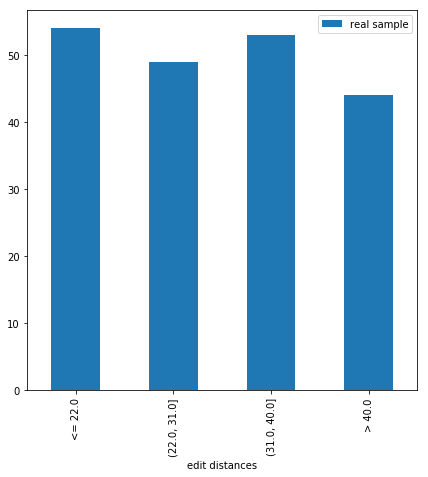

In [315]:
def plot_edit_distances_distribution(reference_sample_map, comparison_sample_map=None,
                                     reference_name='real sample', comparison_name='generated sample'):
    x_label = 'edit distances'
    df = pd.DataFrame.from_dict({
        x_label: list(reference_sample_map.keys()),
        reference_name: list(reference_sample_map.values())
    }).set_index(x_label)
    if comparison_sample_map:
        df2 = pd.DataFrame.from_dict({
            x_label: list(comparison_sample_map.keys()),
            comparison_name: list(comparison_sample_map.values())
        }).set_index(x_label)
        df[comparison_name] = df2[comparison_name]
    df.plot(kind='bar')
    
plot_edit_distances_distribution(real_sample_edit_dist_binned_map)

4 : creating Q-Q plot to compare real sample vs generated-sample-trajectories-rnn_bidirectional:True-max_len:70-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:0.9


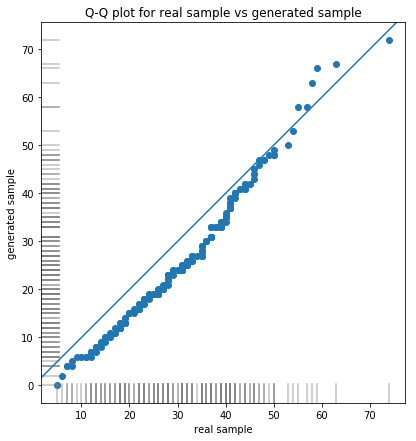

The chi-squared test statistic: 26.369792127377266
p-value: 7.979700774498818e-06


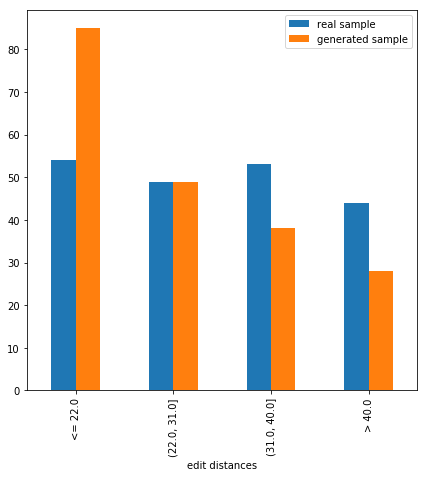

5 : creating Q-Q plot to compare real sample vs generated-sample-trajectories-rnn_bidirectional:True-max_len:70-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:1.0


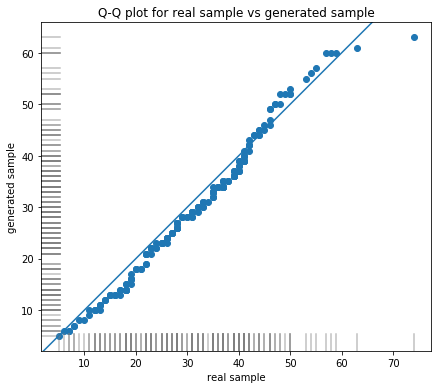

The chi-squared test statistic: 4.165742227412057
p-value: 0.2441141967098515


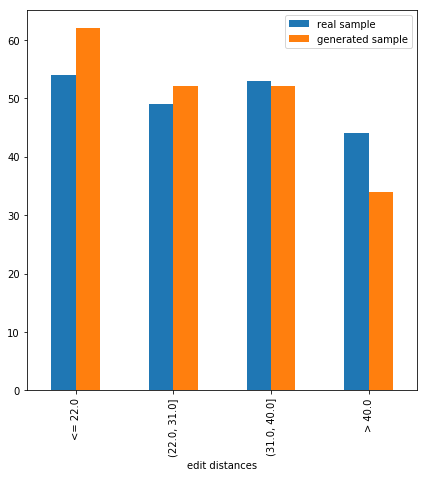

6 : creating Q-Q plot to compare real sample vs generated-sample-trajectories-rnn_bidirectional:True-max_len:70-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:0.8


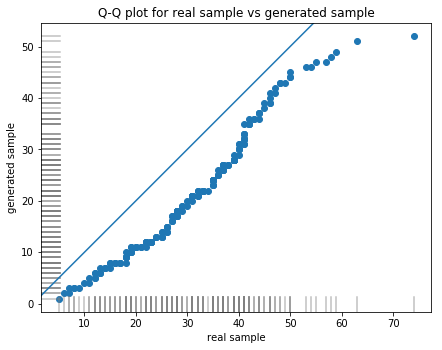

The chi-squared test statistic: 106.38948212777933
p-value: 6.564973275156654e-23


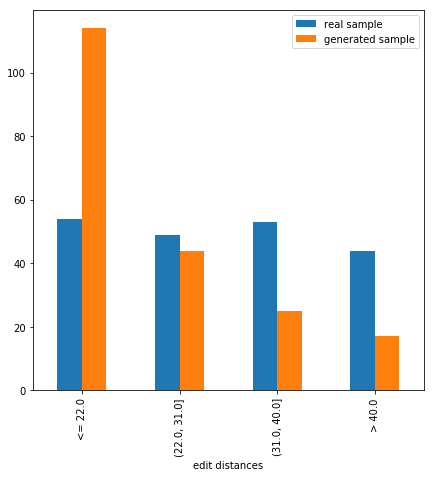

7 : creating Q-Q plot to compare real sample vs generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:0.9


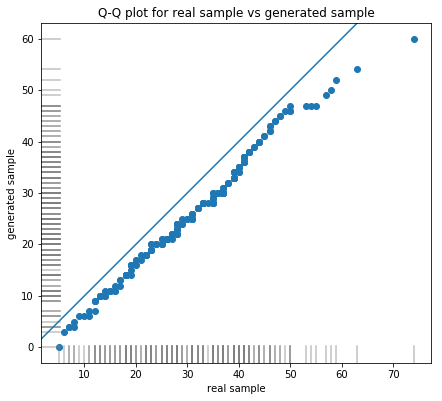

The chi-squared test statistic: 35.72771618625277
p-value: 8.549678853395228e-08


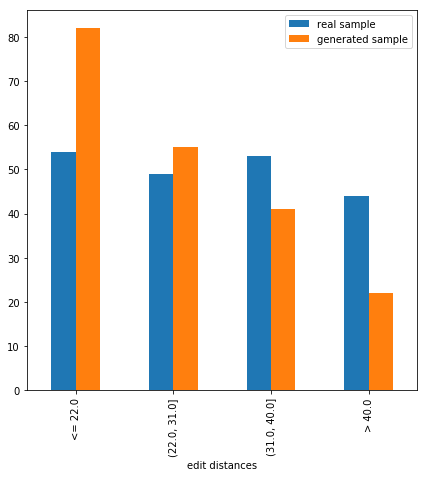

8 : creating Q-Q plot to compare real sample vs generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:1.1


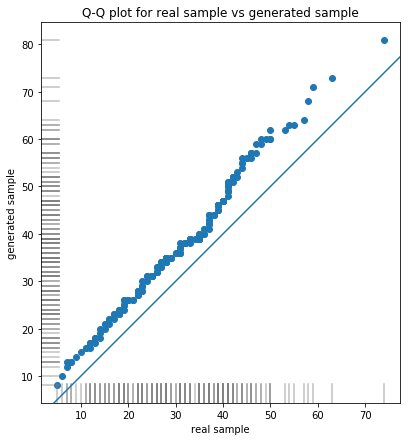

The chi-squared test statistic: 38.761053787777925
p-value: 1.950211947127845e-08


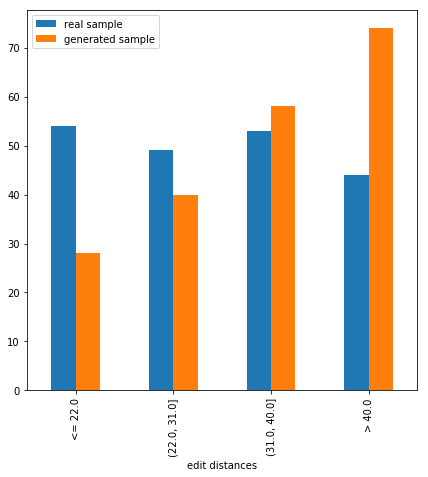

12 : creating Q-Q plot to compare real sample vs generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:128-dropout:0.2-dim_embeddings:128-temperature:1.1


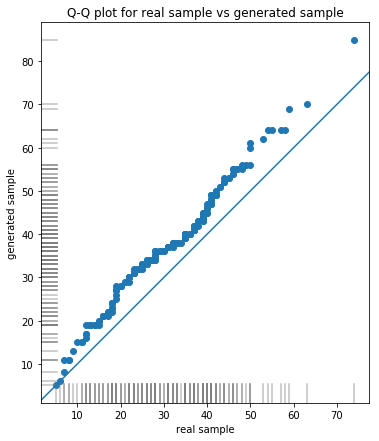

The chi-squared test statistic: 47.413549945457376
p-value: 2.838283885610483e-10


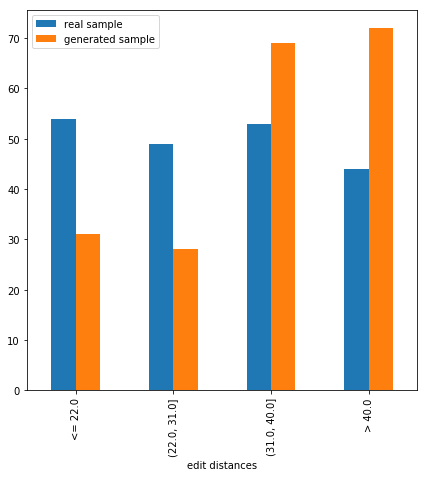

13 : creating Q-Q plot to compare real sample vs generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:128-dropout:0.2-dim_embeddings:128-temperature:0.9


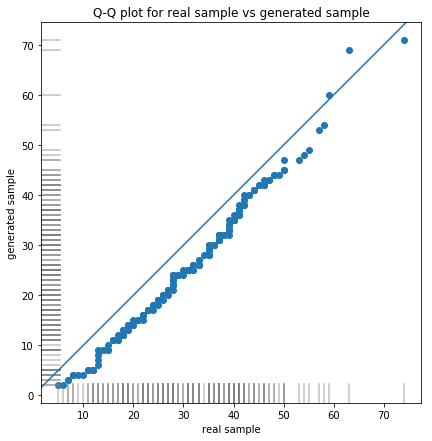

The chi-squared test statistic: 25.47502096297277
p-value: 1.2283108424781017e-05


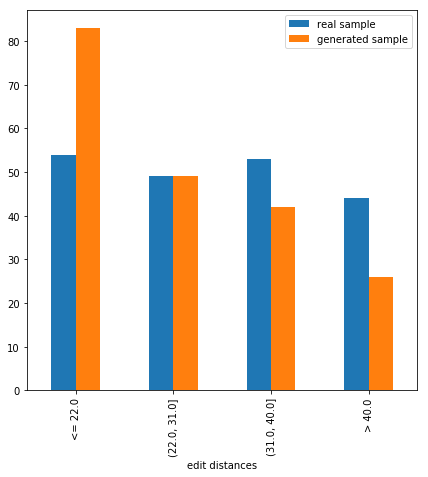

14 : creating Q-Q plot to compare real sample vs generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:128-dropout:0.2-dim_embeddings:128-temperature:1.0


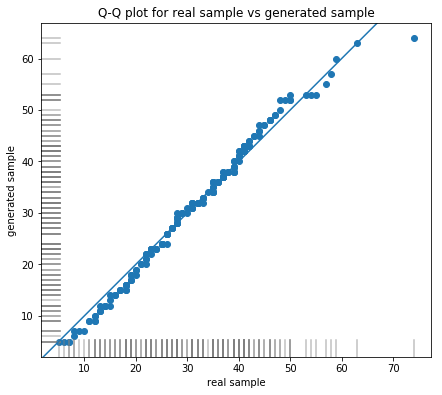

The chi-squared test statistic: 1.384795008912656
p-value: 0.7091027043874282


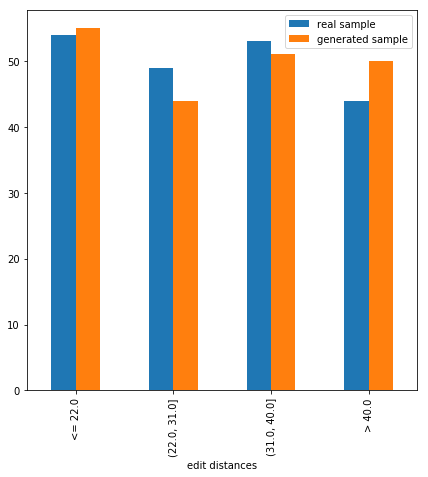

In [388]:
# Create Q-Q plot to compare each set of generated min edit distances to real sample of min edit distances

# Read in the real sample min edit distances
real_sample_min_edit_distances_filename = get_min_edit_distances_filename('real_sample_2000')
real_sample_min_edit_distances_list = read_min_edit_distances_from_file(real_sample_min_edit_distances_filename)

for i, generated_sample_name in enumerate(generated_sample_names):
    generated_sample_min_edit_distances_filename = get_min_edit_distances_filename(generated_sample_name)
    
    try:
        generated_sample_min_edit_distances_list = read_min_edit_distances_from_file(generated_sample_min_edit_distances_filename)
    except Exception as e:
        continue
    if len(generated_sample_min_edit_distances_list) <  LIMIT_SAMPLE_SIZE:
        continue
    
    print(i, ': creating Q-Q plot to compare real sample vs %s' % generated_sample_name)
    make_qq_plot(real_sample_min_edit_distances_list, generated_sample_min_edit_distances_list,
                'real sample', 'generated sample')
    plt.show()
    
    # Chi-squared and bar plots
    max_edit_dist = max(generated_sample_min_edit_distances_list)
    if max_edit_dist > edit_dist_bins[-1]:
        edit_dist_bins[-1] = max_edit_dist
    min_edit_dist = min(generated_sample_min_edit_distances_list)
    if min_edit_dist < edit_dist_bins[0]:
        edit_dist_bins[0]  = min_edit_dist
    generated_sample_min_edit_dist_binned_series = pd.cut(generated_sample_min_edit_distances_list, bins=edit_dist_bins, labels=False, include_lowest=True)
    generated_sample_edit_dist_binned_map = get_binned_series_to_binned_map(generated_sample_min_edit_dist_binned_series, edit_dist_bins)
    
    plot_edit_distances_distribution(real_sample_edit_dist_binned_map, generated_sample_edit_dist_binned_map)
    chisq, p = chisquare(list(real_sample_edit_dist_binned_map.values()),
               f_exp=list(generated_sample_edit_dist_binned_map.values()))
    print('The chi-squared test statistic: %s\np-value: %s' % (chisq, p))
    plt.show()
    

4 : creating bar plot to compare real sample vs generated-sample-trajectories-rnn_bidirectional:True-max_len:70-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:0.9
The chi-squared test statistic: 26.369792127377266
p-value: 7.979700774498818e-06

5 : creating bar plot to compare real sample vs generated-sample-trajectories-rnn_bidirectional:True-max_len:70-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:1.0
The chi-squared test statistic: 4.165742227412057
p-value: 0.2441141967098515

6 : creating bar plot to compare real sample vs generated-sample-trajectories-rnn_bidirectional:True-max_len:70-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:0.8
The chi-squared test statistic: 106.38948212777933
p-value: 6.564973275156654e-23

7 : creating bar plot to compare real sample vs generated-sample-trajectories-rnn_bidirectional:True-max_len:60-rnn_layers:3-rnn_size:128-dropout:0.1-dim_embeddings:128-temperature:0.9
The chi-squared

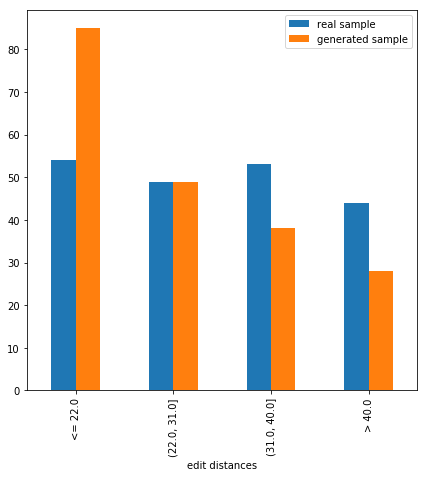

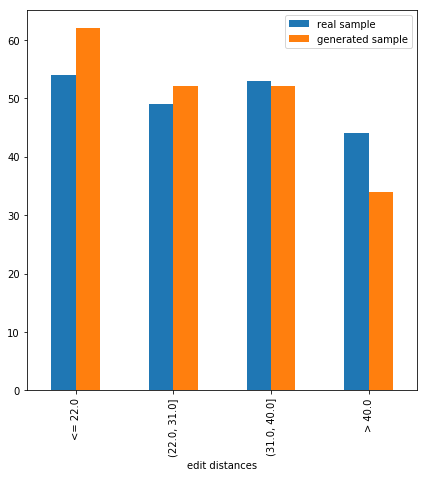

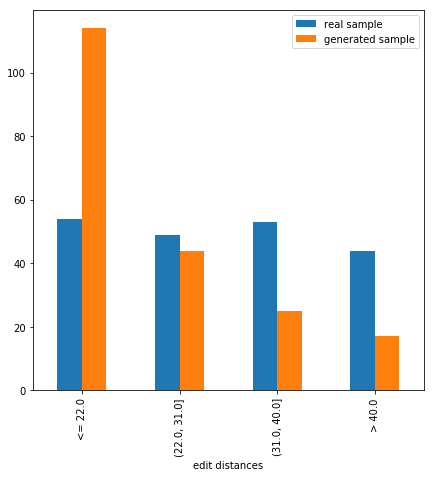

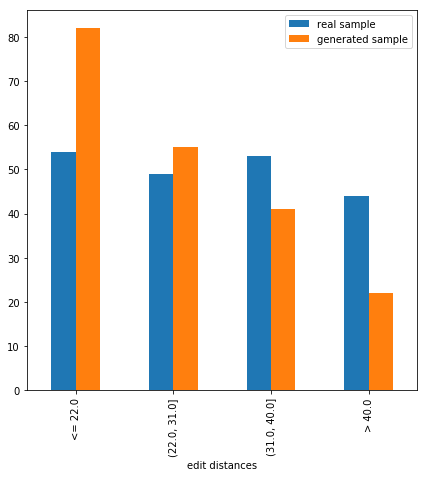

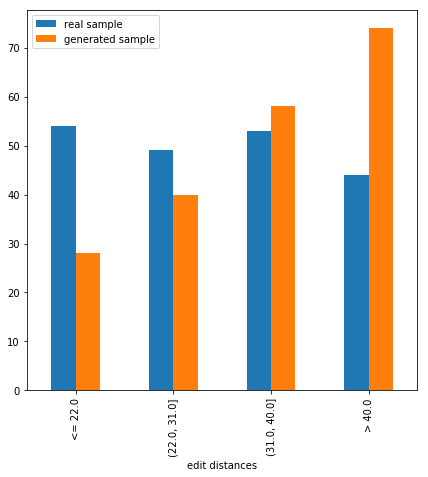

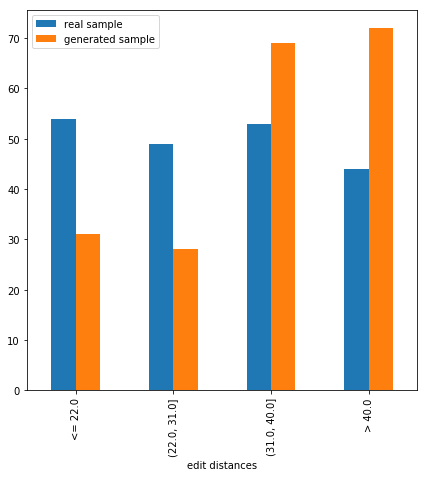

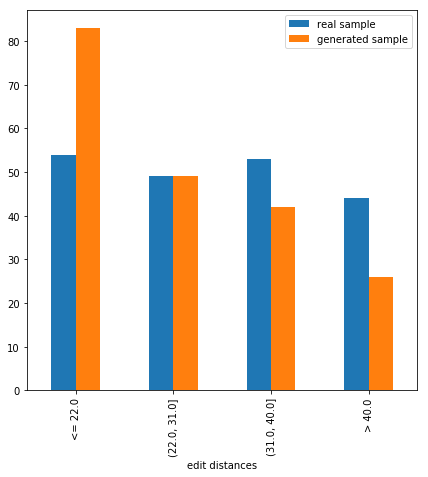

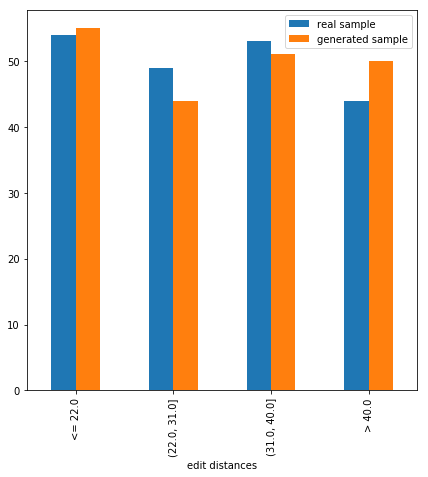

In [384]:
# And do chi-squared test and make bar plots

for i, generated_sample_name in enumerate(generated_sample_names):
    generated_sample_min_edit_distances_filename = get_min_edit_distances_filename(generated_sample_name)
    
    try:
        generated_sample_min_edit_distances_list = read_min_edit_distances_from_file(generated_sample_min_edit_distances_filename)
    except Exception as e:
        continue
    if len(generated_sample_min_edit_distances_list) <  LIMIT_SAMPLE_SIZE:
        continue
    
    print(i, ': creating bar plot to compare real sample vs %s' % generated_sample_name)
    # Chi-squared and bar plots
    max_edit_dist = max(generated_sample_min_edit_distances_list)
    if max_edit_dist > edit_dist_bins[-1]:
        edit_dist_bins[-1] = max_edit_dist
    min_edit_dist = min(generated_sample_min_edit_distances_list)
    if min_edit_dist < edit_dist_bins[0]:
        edit_dist_bins[0]  = min_edit_dist
    generated_sample_min_edit_dist_binned_series = pd.cut(generated_sample_min_edit_distances_list, bins=edit_dist_bins, labels=False, include_lowest=True)
    generated_sample_edit_dist_binned_map = get_binned_series_to_binned_map(generated_sample_min_edit_dist_binned_series, edit_dist_bins)
    
    plot_edit_distances_distribution(real_sample_edit_dist_binned_map, generated_sample_edit_dist_binned_map)
    chisq, p = chisquare(list(real_sample_edit_dist_binned_map.values()),
               f_exp=list(generated_sample_edit_dist_binned_map.values()))
    print('The chi-squared test statistic: %s\np-value: %s\n' % (chisq, p))
    

[2, 3]